# Load Dataset

In [1]:
import os
import time
import numpy as np
import torch
import math
import tqdm
import matplotlib.pyplot as plt

from torch import nn
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.distributions import MultivariateNormal, Categorical, Normal
from models_modules import MLP, CNNFastEncoder, CNNFastDecoder
from model_neuralmsm import NeuralMSM
from sklearn.decomposition import PCA

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# device = 'cpu'

In [3]:
seed = 24 # 23 24 25 26 27
num_states = 3
dim_obs = 2
dim_latent = 2
T = 200
data_size = 5000
sparsity_prob = 0.0
data_type = 'cosine'
degree = 3
restarts_num = 10
images = False

path = '../../../vol/bitbucket/am9923/datasets/bee.npz'
test_path = '../../../vol/bitbucket/am9923/datasets/bee_test.npz'

class BeeDataset(Dataset):
    def __init__(self, path):
        npz = np.load(path)
        self.data_y = npz["y"].astype(np.float32)
        self.data_z = npz["z"].astype(np.int32)

    def __getitem__(self, i):
        return self.data_y[i], self.data_z[i]

    def __len__(self):
        return self.data_y.shape[0]

dl = BeeDataset(path)
test_dl = BeeDataset(test_path)
final_temperature = 1

        
pre_train_check = 5
init_temperature = 5
iter_update_temp = 50
iter_check_temp = 1000
epoch_num = 10000
learning_rate = 5e-4
gamma_decay = 0.5
scheduler_epochs = 0.8 * 10000
decay_rate = 0.9

best_elbo = -torch.inf

dataloader = DataLoader(dl, batch_size=64, shuffle=True)  
test_dataloader = DataLoader(test_dl, batch_size=64, shuffle=False)

# Visualize

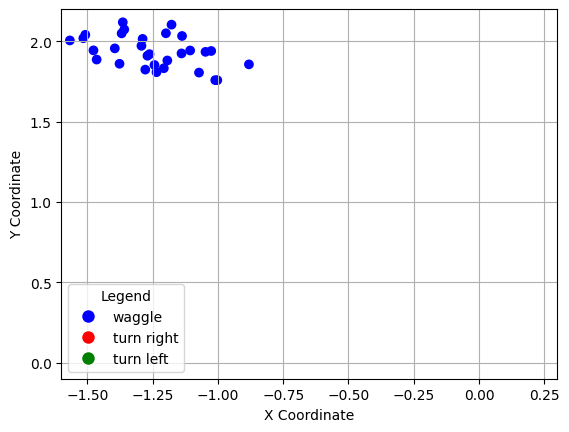

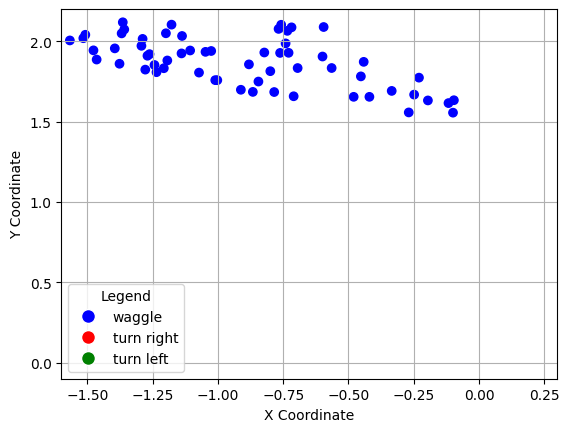

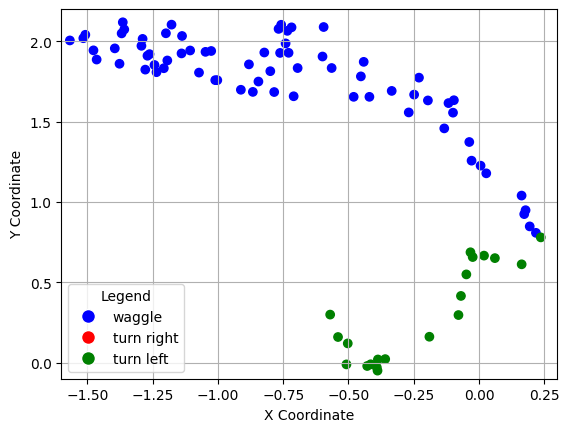

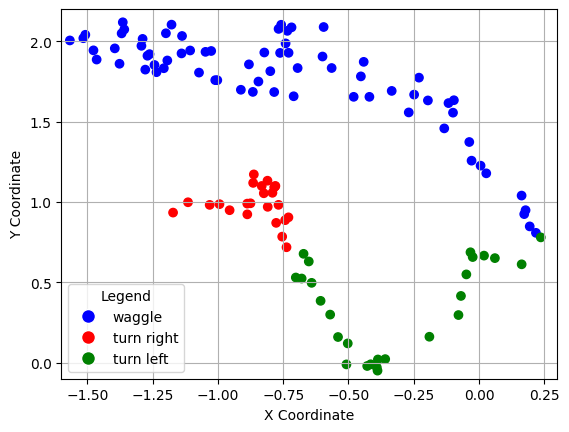

In [4]:
def visualize_coordinates(coordinates, colors):
    """
    Visualizes a list of coordinates with an optional list of colors for each point.
    
    Parameters:
    - coordinates: A list of tuples, where each tuple represents an (x, y) coordinate.
    - colors: A list of colors corresponding to each point. Must be the same length as coordinates.
              If None, all points will be colored blue.
    """
    # Unzip the list of tuples into two lists: x and y coordinates
    x_coords, y_coords = zip(*coordinates)

    # Default color map and legend
    color_map = {0: 'blue', 1: 'red', 2: 'green'}
    label_map = {0: 'waggle', 1: 'turn right', 2: 'turn left'}

    # Determine colors based on the 'colors' input
    point_colors = [color_map[color] for color in colors]

    # Create a scatter plot
    # If colors are not provided, default to 'blue'
    plt.scatter(x_coords, y_coords, c=point_colors, marker='o')

    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label_map[key],
                                    markerfacecolor=color_map[key], markersize=10) 
                        for key in color_map]
    plt.legend(handles=legend_handles, title="Legend", loc='lower left')

    # Set the axis labels
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.xlim(-1.6, 0.3)
    plt.ylim(-0.1, 2.2)
    
    # Display a grid
    plt.grid(True)
    
    # Display the plot
    plt.show()

visualize_coordinates(dataloader.dataset[1][0][0:30,0:2], colors=dataloader.dataset[1][1][0:30])
visualize_coordinates(dataloader.dataset[1][0][0:60,0:2], colors=dataloader.dataset[1][1][0:60])
visualize_coordinates(dataloader.dataset[1][0][0:90,0:2], colors=dataloader.dataset[1][1][0:90])
visualize_coordinates(dataloader.dataset[1][0][0:120,0:2], colors=dataloader.dataset[1][1][0:120])

In [5]:
def plot_predictions(gt, preds, step=25):
    # Number of timesteps
    T = gt.shape[0]
    
    # Generate colors for each step timestep
    num_colors = (T + step - 1) // step  # Number of colors needed
    colors = plt.cm.jet(np.linspace(0, 1, num_colors))
    
    # Plot each 10th timestep
    for i in range(0, T, step):
        x1, y1 = gt[i]
        x2, y2 = preds[i]

        plt.scatter(x1, y1, color=colors[i // step], label=f't={i}')
        plt.scatter(x2, y2, color=colors[i // step], marker='x')

        plt.plot([x1, x2], [y1, y2], color=colors[i // step], linestyle='--', linewidth=1, alpha=0.3)

    
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('Predictions at Each 10th Timestep')
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
    plt.grid(True)
    plt.show()

def plot_discrete_states(gamma,latents_states):
    # gamma: [B,T,num_states]
    # latents_states: [B,num_states]
    N = 10
    states = torch.zeros(120,3)
    states[range(120),latents_states[N,:].long()] = 1
    plt.figure(figsize=(10,4))
    plt.subplot(211)
    plt.title("Ground truth states")
    g_t = plt.imshow(states[:20,:].T,vmin=0,vmax=1)
    plt.colorbar(g_t)
    plt.xticks(np.arange(0,20,2))
    plt.subplot(212)
    plt.title("Posterior p(s_t|X)")
    p_s_t = plt.imshow(gamma[N,:20,:].T.cpu().numpy(),vmin=0,vmax=1)
    plt.colorbar(p_s_t)
    plt.xticks(np.arange(0,20,2))
    plt.show()

def plot_models(gamma, gamma2, gamma3, latents_states, xtick_labels=None, N=2):
    # gamma: [B, T, num_states]
    # latents_states: [B, num_states]
    T = gamma.shape[1]
    states = torch.zeros(T, 3)
    states[range(T), latents_states[N, :].long()] = 1    

    # Plotting
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 3.5), sharex=True)

    # Plotting Model 1
    im1 = axes[0].imshow(states[:T, :].T, vmin=0, vmax=1)

    # Plotting Model 2
    im2 = axes[1].imshow(gamma[N, :T, :].T.cpu().numpy(), vmin=0, vmax=1)

    # Plotting Model 3
    im3 = axes[2].imshow(gamma2[N, :T, :].T.cpu().numpy(), vmin=0, vmax=1)

    # Plotting Model 4
    im4 = axes[3].imshow(gamma3[N, :T, :].T.cpu().numpy(), vmin=0, vmax=1)

    for ax in axes:
        ax.set_yticks([])
        ax.spines['top'].set_visible(False)     # Hide the top spine
        ax.spines['right'].set_visible(False)   # Hide the right spine
        ax.spines['bottom'].set_visible(False)  # Hide the bottom spine
        ax.spines['left'].set_visible(False)    # Hide the left spine
        ax.grid(False)
        # Remove tick marks
        ax.tick_params(axis='x', which='both', length=0, width=0)  # Remove x-axis ticks
        ax.tick_params(axis='y', which='both', length=0, width=0)  # Remove y-axis ticks

    # Adding model names to the left of each subplot
    axes[0].text(-0.01, 0.5, 'Ground Truth', va='center', ha='right', transform=axes[0].transAxes, fontsize=10)
    axes[1].text(-0.01, 0.5, 'ELBO', va='center', ha='right', transform=axes[1].transAxes, fontsize=10)
    axes[2].text(-0.01, 0.5, 'IWAE', va='center', ha='right', transform=axes[2].transAxes, fontsize=10)
    axes[3].text(-0.01, 0.5, 'FIVO', va='center', ha='right', transform=axes[3].transAxes, fontsize=10)

    # Adjust layout to remove space between subplots
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.1)

    # Add a colorbar to the center right of the plot
    cbar_ax = fig.add_axes([0.92, 0.15, 0.01, 0.7])  # [left, bottom, width, height]
    fig.colorbar(im2, cax=cbar_ax)

    axes[0].set_xlim((0, T))

    # Set the x-axis label on the bottom plot only
    axes[3].set_xlabel('Timestep')
    current_xticks = axes[1].get_xticks()  # Get the current x-tick positions
    new_labels = np.linspace(xtick_labels[0], xtick_labels[1], num=len(current_xticks))
    axes[3].set_xticklabels([f'{int(label)}' for label in new_labels])
    
    plt.show()

def plot_2_models(gamma, latents_states, title='ELBO'):
    # gamma: [B, T, num_states]
    # latents_states: [B, num_states]
    N = 10
    T = gamma.shape[1]
    states = torch.zeros(T, 3)
    states[range(T), latents_states[N, :].long()] = 1    

    # Plotting
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 2), sharex=True)

    # Plotting Model 1
    im1 = axes[0].imshow(states[:T, :].T, vmin=0, vmax=1)

    # Plotting Model 2
    im2 = axes[1].imshow(gamma[N, :T, :].T.cpu().numpy(), vmin=0, vmax=1)

    for ax in axes:
        ax.set_yticks([])
        ax.spines['top'].set_visible(False)     # Hide the top spine
        ax.spines['right'].set_visible(False)   # Hide the right spine
        ax.spines['bottom'].set_visible(False)  # Hide the bottom spine
        ax.spines['left'].set_visible(False)    # Hide the left spine
        ax.grid(False)
        # Remove tick marks
        ax.tick_params(axis='x', which='both', length=0, width=0)  # Remove x-axis ticks
        ax.tick_params(axis='y', which='both', length=0, width=0)  # Remove y-axis ticks

    # Adding model names to the left of each subplot
    axes[0].text(-0.01, 0.5, 'Ground Truth', va='center', ha='right', transform=axes[0].transAxes, fontsize=10)
    axes[1].text(-0.01, 0.5, title, va='center', ha='right', transform=axes[1].transAxes, fontsize=10)


    # Adjust layout to remove space between subplots
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.1)

    # Add a colorbar to the center right of the plot
    cbar_ax = fig.add_axes([0.92, 0.15, 0.01, 0.7])  # [left, bottom, width, height]
    fig.colorbar(im2, cax=cbar_ax)

    axes[0].set_xlim((0, T))

    # Set the x-axis label on the bottom plot only
    axes[1].set_xlabel('Timestep')

    plt.show()    

In [ ]:
import numpy as np
from itertools import permutations
from sklearn.metrics import f1_score

def best_f1_score(ground_truth, posterior_probs):
    """
    Calculate the best F1 score for the given ground truth and posterior probabilities tensors.

    Parameters:
    - ground_truth: A numpy array of shape [B, T] with integers 0, 1, 2 representing the ground truth states.
    - posterior_probs: A numpy array of shape [B, T, 3] with posterior probabilities for each state.

    Returns:
    - best_f1: The best F1 score after testing all permutations of the states.
    """
    # Find the predicted states by taking the argmax over the last dimension
    predicted_states = np.argmax(posterior_probs, axis=-1)

    # List all possible permutations of (0, 1, 2)
    state_permutations = list(permutations([0, 1, 2]))

    best_f1 = 0.0
    
    # Iterate over all permutations
    for perm in state_permutations:
        # Map predicted states according to the current permutation
        mapped_predictions = np.copy(predicted_states)
        for original_state, new_state in enumerate(perm):
            mapped_predictions[predicted_states == original_state] = new_state
        
        # Calculate F1 score for this permutation
        f1 = f1_score(ground_truth.flatten(), mapped_predictions.flatten(), average='macro')
        
        # Update best F1 score
        if f1 > best_f1:
            best_f1 = f1
    
    return best_f1


def best_cross_entropy_loss(ground_truth, posterior_probs):
    """
    Calculate the best cross-entropy loss for the given ground truth and posterior probabilities tensors.

    Parameters:
    - ground_truth: A numpy array of shape [B, T] with integers 0, 1, 2 representing the ground truth states.
    - posterior_probs: A numpy array of shape [B, T, 3] with posterior probabilities for each state.

    Returns:
    - best_cross_entropy: The lowest cross-entropy loss after testing all permutations of the states.
    """
    ground_truth = ground_truth.astype(int)

    # List all possible permutations of (0, 1, 2)
    state_permutations = list(permutations([0, 1, 2]))

    best_cross_entropy = np.inf
    
    # Iterate over all permutations
    for perm in state_permutations:
        # Map the posterior probabilities according to the current permutation
        mapped_probs = np.zeros_like(posterior_probs)
        for i, new_state in enumerate(perm):
            mapped_probs[..., new_state] = posterior_probs[..., i]
        
        # Calculate cross-entropy loss for this permutation
        # One-hot encode the ground truth
        ground_truth_one_hot = np.eye(3)[ground_truth]
        
        # Clip the mapped probabilities to avoid log(0)
        clipped_probs = np.clip(mapped_probs, 1e-12, 1 - 1e-12)
        
        # Calculate cross-entropy loss
        cross_entropy = -np.sum(ground_truth_one_hot * np.log(clipped_probs)) / ground_truth.size
        
        # Update best cross-entropy loss
        if cross_entropy < best_cross_entropy:
            best_cross_entropy = cross_entropy
    
    return best_cross_entropy


# Create Model

### Helper Functions

In [6]:
def normal_logprob(x,mu,sigma):
    """
    Function that calculates the log probability of a multivariate normal distribution
    with diagonal covariance matrix.
    
    Args:
        x (torch.Tensor): Value at which the log probability is evaluated. Shape: [B,d]
        mu (torch.Tensor): Mean of the multivariate distribution. Shape: [B,d]
        sigma (torch.Tensor): Diagonal values of the covariance matrix of the
                              multivariate distribution. Shape: [B,d]
    """
    dev = x.device
    B,d = mu.shape
    
    if len(sigma.shape) == 0:
        sigma = sigma.repeat(B,d)

    a = torch.tensor(([-(d/2) * torch.log(torch.tensor(2)*torch.pi)]*B), device=dev)
    b = - 0.5 * torch.log(sigma).sum(1)
    c = - 0.5 * (((x - mu)**2/sigma).sum(1))
    return a+b+c

def resample(x,weights,N):
    """
    Modified from https://github.com/ZoneMS/EnKO/blob/main/SVAE/model/system/fivo.py
    Function that resamples N particles based on their weight
    Args: 
        x (torch.Tensor): Shape is [P,B,H]
        weights (torch.Tensor): Log weights. Shape is [P,B]
        N (int): Number of particles to resample
    Returns:
        torch.Tensor: Resampled particles of shape [P,B,H] 
    """
    weights = weights - torch.logsumexp(weights, dim=0) # Normalise log weights
    categorical = Categorical(logits=weights.permute([1,0]))    
    indices = categorical.sample(torch.Size([N])) # shape [P,B]
    x = torch.gather(x, 0, indices.unsqueeze(2).repeat(1,1,x.size(2)))
    return x

### Model Definition

In [7]:
class VariationalSNLDS(nn.Module):
    ## Class could be combined with Abstract class MSM for code efficiency
    ## The model allows different settings where annealing=True implements schedule from
    ## Dong et al. (2020) https://proceedings.mlr.press/v119/dong20e.html;
    ## and inference=='alpha' implements Ansari et al. (2023) loss function
    ## https://arxiv.org/abs/2110.13878
    ## We recommend the setting with annealing=False and inference='alpha' and recurent encoder
    ## which is the best that worked for estimation.
    def __init__(self, obs_dim, latent_dim, hidden_dim, num_states, beta=1, encoder_type='recurent', device='cpu', annealing=False, inference='alpha'):
        super(VariationalSNLDS, self).__init__()
        self.obs_dim = obs_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        self.num_states = num_states
        self.device = device
        self.beta = beta
        self.var = torch.tensor(5e-4).to(device)
        self.scaling = 0
        self.temperature = 1
        self.annealing = annealing
        self.inference = inference
        if annealing:
            self.scaling = 1e6
            self.temperature = 1e6
        self.encoder_type = encoder_type
        n_feat = 64
        n_layers = 2
        ## Neural net params
        # Transitions p(z_t|z_t-1,s_t)
        self.transitions = nn.ModuleList([MLP(latent_dim, latent_dim, hidden_dim, 'softplus') for _ in range(self.num_states)]).to(device).float()
        # Encoder q(z|x)
        if self.encoder_type=='factored':
            #self.encoder = nn.Linear(obs_dim, 2*latent_dim).to(device).float()
            self.encoder = MLP(obs_dim, 2*latent_dim, hidden_dim, 'leakyrelu').to(device).float()
        elif self.encoder_type=='video':
            self.img_embedding = CNNFastEncoder(3, hidden_dim, n_feat, n_layers=n_layers).to(device).float()
            self.encoder = nn.LSTM(hidden_dim, hidden_dim, num_layers=2, batch_first=True, bidirectional=True).to(device).float()
            self.encoder_causal = nn.LSTM(hidden_dim*2, hidden_dim, num_layers=2, batch_first=True, bidirectional=False).to(device).float()
            self.encoder_mean_var = nn.Linear(hidden_dim, 2*latent_dim).to(device).float()
        else:
            self.encoder = nn.LSTM(obs_dim, hidden_dim, num_layers=2, batch_first=True, bidirectional=True).to(device).float()
            self.encoder_causal = nn.LSTM(hidden_dim*2, hidden_dim, num_layers=2, batch_first=True, bidirectional=False).to(device).float()
            self.encoder_mean_var = nn.Linear(hidden_dim, 2*latent_dim).to(device).float()
        # Decoder p(x|z)
        if self.encoder_type=='video':
            self.decoder = CNNFastDecoder(latent_dim, 3, n_feat, n_layers=n_layers).to(device).float()
        else:
            self.decoder = MLP(latent_dim, obs_dim, hidden_dim, 'leakyrelu').to(device).float()
        #self.decoder = nn.Linear(latent_dim, obs_dim).to(device)
        ## MSM params
        # logits of p(s_t|s_t-1)
        self.Q = nn.Parameter(torch.zeros(self.num_states, self.num_states).to(device).float())
        # logits of p(s_1)
        self.pi = nn.Parameter(torch.zeros(num_states).to(device).float())
        #self.pi = torch.zeros(num_states).to(device)
        # Init mean and covariances
        self.init_mean = nn.Parameter(torch.randn(self.num_states, self.latent_dim).to(device).float())
        self.init_cov = nn.Parameter(((torch.rand(self.num_states,1,1)*torch.eye(self.latent_dim)[None,:,:])*5).to(device).float())
        self.covs = nn.Parameter((torch.eye(self.latent_dim)[None,:,:]).repeat(self.num_states,1,1).to(device).float()) # identity covariance
    
    def _encode_obs(self, x):
        if self.encoder_type=='factored':
            (B, T, D) = x.shape
            (z_mu, z_log_var) = self.encoder(x.reshape(B*T,-1)).split(self.latent_dim, dim=-1)
        elif self.encoder_type=='video':
            (B, T, C, W, H) = x.shape
            x = self.img_embedding(x.reshape(B*T,C,W,H)).reshape(B,T,-1)
            output, _ = self.encoder(x)
            # output contains h^x_{1:T}
            output, _ = self.encoder_causal(output)
            (z_mu, z_log_var) = self.encoder_mean_var(output).split(self.latent_dim, dim=-1)
        else:
            output, _ = self.encoder(x)
            # output contains h^x_{1:T}
            output, _ = self.encoder_causal(output)
            (z_mu, z_log_var) = self.encoder_mean_var(output).split(self.latent_dim, dim=-1)
        eps = torch.normal(mean=torch.zeros_like(z_mu)).to(x.device)
        z_std = (z_log_var*0.5).exp()
        sample = z_mu + z_std*eps
        return sample, z_mu, z_log_var

    def _compute_local_evidence(self, z):
        T = z.size(1)
        init_distrib_ = torch.distributions.MultivariateNormal(self.init_mean, torch.matmul(self.init_cov,self.init_cov.transpose(1,2)) + 1e-6*torch.eye(self.latent_dim)[None,:,:].to(self.device))
        log_local_evidence_1 = init_distrib_.log_prob(z[:,0:1,None,:].repeat(1,1,self.num_states,1)) # shape [B,1,num_states]
        if T==1:
            return log_local_evidence_1
        means_ = torch.cat([self.transitions[i](z[:,:-1, None,:]) for i in range(self.num_states)], dim=2) # shape [B,T-1,num_states,latent_dim]
        covs = torch.matmul(self.covs,self.covs.transpose(1,2)) + 1e-6*torch.eye(self.latent_dim)[None,:,:].to(self.device) # [num_states,latent_dim,2]
        distribs = [torch.distributions.MultivariateNormal(means_[:,:,i,:], covs[i,:,:]) for i in range(self.num_states)]
        log_local_evidence_T = torch.cat([distribs[i].log_prob(z[:,1:,:])[:,:,None] for i in range(self.num_states)], dim=2) # [B,T-1,num_states]
        return torch.cat([log_local_evidence_1, log_local_evidence_T], dim=1) # [B,T,num_states]
    
    def next_evidence(self,z):
        T = z.size(1)
        means_ = torch.cat([self.transitions[i](z[:,:-1, None,:]) for i in range(num_states)], dim=2) # shape [B,T-1,num_states,latent_dim]
        covs = torch.matmul(self.covs,self.covs.transpose(1,2)) + 1e-6*torch.eye(self.latent_dim)[None,:,:].to(device) # [num_states,latent_dim,2]
        distribs = [torch.distributions.MultivariateNormal(means_[:,:,i,:], covs[i,:,:]) for i in range(num_states)]  
        log_local_evidence_T = torch.cat([distribs[i].log_prob(z[:,1:,:])[:,:,None] for i in range(num_states)], dim=2) # [B,T-1,num_states]
        return log_local_evidence_T      

    def _alpha(self, local_evidence):
        N, T, _ = local_evidence.shape
        log_Z = torch.zeros((N,T)).to(self.device)
        log_alpha = torch.zeros((N, T, self.num_states)).to(self.device)
        # softmax is just to normalise the probabilities
        # shape: [B,num_states]
        log_prob = local_evidence[:,0,:] + torch.log((self.pi/self.temperature).softmax(-1)) # log p(z_1|s_1) - log p(s_1)
        log_Z[:,0] = torch.logsumexp(log_prob, dim=-1) # log p(z_1), [B]
        log_alpha[:,0,:] = log_prob - log_Z[:,0,None] # log p(s_1|z_1) [B,num_states]
        Q = (self.Q[None,None,:,:].expand(N,T,-1,-1)/self.temperature).softmax(-1).transpose(2,3).log() # [B,T,num_states,num_states]
        for t in range(1, T):
            #log_prob = local_evidence[:,t,:] + torch.log(torch.matmul((Q.transpose(2,3))[:,t,:,:],alpha[:,t-1,:,None]))[:,:,0]
            log_prob = torch.logsumexp(local_evidence[:,t,:, None] + Q[:,t,:,:] + log_alpha[:,t-1,None,:], dim=-1) 
            
            log_Z[:,t] = torch.logsumexp(log_prob, dim=-1)
            log_alpha[:,t,:] = log_prob - log_Z[:,t,None]
        return log_alpha, log_Z # shapes [B,T,num_states], [B,T] // log_Z: p(z_t|z_{1:t-1}) 

    def next_z(self,local_evidence,log_alpha,log_Z):
        """
        Function that updates the log_Z for the next T timesteps.
        Args:
            local_evidence (torch.Tensor): Shape [B,T,num_states]
            log_alpha (torch.Tensor): Shape [B,num_states]
            log_Z (torch.Tensor): Shape [B]
        """
        B, T, _ = local_evidence.shape
        log_Z_new = torch.zeros((B,T+1)).to(device)
        log_alpha_new = torch.zeros((B, T+1, num_states)).to(device)

        log_Z_new[:,0] = log_Z
        log_alpha_new[:,0,:] = log_alpha

        Q = (self.Q[None,None,:,:].expand(B,T,-1,-1)/self.temperature).softmax(-1).transpose(2,3).log() # [B,T,num_states,num_states]
        for t in range(1,T+1):
            log_prob = torch.logsumexp(local_evidence[:,t-1,:, None] + Q[:,t-1,:,:] + log_alpha_new[:,t-1,None,:], dim=-1) 
            log_Z_new[:,t] = torch.logsumexp(log_prob, dim=-1)
            log_alpha_new[:,t,:] = log_prob - log_Z_new[:,t,None]

        return log_alpha_new[:,1:], log_Z_new[:,1:]             

    def _beta(self, local_evidence, log_Z):
        N, T, _ = local_evidence.shape
        log_beta = torch.zeros((N, T, self.num_states)).to(self.device)
        Q = (self.Q[None,None,:,:].expand(N,T,-1,-1)/self.temperature).softmax(-1).log()
        for t in reversed(range(1, T)):
            #beta_ = torch.matmul(Q[:,t,:,:], (torch.exp(local_evidence[:,t,:])*beta[:,t,:])[:,:,None])[:,:,0]
            beta_ = torch.logsumexp(Q[:,t,:,:] + local_evidence[:,t,None,:] + log_beta[:,t,None,:], dim=-1)
            log_beta[:,t-1,:] = beta_ - log_Z[:,t,None]
        return log_beta
    
    def _compute_posteriors(self, log_evidence):
        log_alpha, log_Z = self._alpha(log_evidence)
        log_beta = self._beta(log_evidence, log_Z)
        log_gamma = log_alpha + log_beta
        B, T, _ = log_evidence.shape
        #alpha_beta_evidence = torch.matmul(alpha[:,:T-1,:,None], (beta*torch.exp(log_evidence))[:,1:,None,:])
        log_alpha_beta_evidence = log_alpha[:,:T-1,:,None] + log_beta[:,1:,None,:] + log_evidence[:,1:,None,:]
        Q = (self.Q[None,None,:,:].expand(B,T,-1,-1)/self.temperature).softmax(-1).log()
        #paired_marginals = Q[:,1:,:,:]*(alpha_beta_evidence/torch.exp(log_Z[:,1:,None,None])).float()
        log_paired_marginals = Q[:,1:,:,:] + log_alpha_beta_evidence - log_Z[:,1:,None,None]
        
        return log_gamma.exp().detach(), log_paired_marginals.exp().detach()

    def _decode(self, z):
        return self.decoder(z)

    def _compute_elbo(self, x, x_hat, z_mu, z_log_var, z_sample, log_Z=None, gamma=None, paired_marginals=None, log_evidence=None):

        (B, T, D) = x.size()
        # max: ELBO = log p(x_t|z_t) - (log q(z) + log q(s) - log p(z_t | s_t) - log p(s_t| s_t-1))
        # min: -ELBO =  - log p(x_t|z_t) + log q(z) + log q(s) - log p(z_t | s_t) - log p(s_t| s_t-1)
        # Fixed variance
        # Reconstruction Loss p(x_t | z_t)
        #decoder_x_1 = MultivariateNormal(x_hat, covariance_matrix=torch.eye(D).to(self.device)*self.var)
        #p_x_1 = (decoder_x_1.log_prob(x)).sum(-1)
        #recon_loss = (p_x_1).sum()/B


        decoder_x_2 = Normal(x_hat, torch.sqrt(self.var))
        p_x_2 = (decoder_x_2.log_prob(x)).sum(-1)
        recon_loss = (p_x_2).sum()/(B)
        #print(recon_loss)
        #print(recon_loss_2)
        ## KL terms
        q_z = MultivariateNormal(z_mu, torch.diag_embed(torch.exp(z_log_var)))
        entropy_q = -(q_z.log_prob(z_sample)).sum()/B
        if self.beta==0:
            msm_loss = 0
            CE_term = 0
        else:
            if self.inference=='alpha':
                msm_loss = log_Z.sum()/B
            else:
                # pi
                msm_loss = (gamma[:,0,:]*torch.log((self.pi/self.temperature).softmax(-1)[None,:])).sum()/B
                # Q
                Q = (self.Q[None,None,:,:].expand(B,T,-1,-1)/self.temperature).softmax(-1)
                msm_loss += (paired_marginals*torch.log(Q[:,1:,:,:])).sum()/B
                # p(z_t|z_t-1)
                msm_loss += (gamma[:,:]*log_evidence[:,:]).sum()/B
            CE_term = 0
            if self.annealing:
                CE_term = self.scaling*self.kl_categorical_uniform(gamma)# +  self.scaling*self.kl_categorical_uniform((self.pi).softmax(-1))
        elbo = recon_loss + entropy_q + self.beta*msm_loss
        losses = {
            'kld': entropy_q,
            'elbo': elbo,
            'loss': -elbo + CE_term,
            'recon_loss': recon_loss,
            'msm_loss': msm_loss,
            'CE': CE_term
        }
        return losses
    
    def kl_categorical_uniform(self, gamma, eps=1e-16):
        """Based on https://github.com/ethanfetaya/NRI (MIT License)."""
        prob = (1/self.num_states)
        kl_div = prob * (torch.log(torch.tensor(prob)) - torch.log(gamma + eps))
        return kl_div.sum() / (gamma.size(0))

    def forward(self, x):
        # input is [B, T, D]
        (B, T, *_) = x.shape
        z_sample, z_mu, z_log_var = self._encode_obs(x)
        z_sample = z_sample.reshape(B,T,-1)
        z_mu = z_mu.reshape(B,T,-1)
        z_log_var = z_log_var.reshape(B,T,-1)
        if self.beta==0:
            log_evidence, gamma, paired_marginals, log_Z = None, None, None, None
        else:
            log_evidence = self._compute_local_evidence(z_sample)
            if self.inference=='alpha':
                if self.annealing:
                    log_alpha, log_Z = self._alpha(log_evidence)
                    log_beta = self._beta(log_evidence, log_Z)
                    gamma = (log_alpha + log_beta).exp()
                else:
                    log_Z = self._alpha(log_evidence)[1].sum(-1)
                    gamma = None
                paired_marginals = None
            else:
                with torch.no_grad():
                    gamma, paired_marginals = self._compute_posteriors(log_evidence)
                    log_Z = None
        x_hat = self._decode(z_sample.reshape(B*T,-1)).reshape(B,T,-1)
        # ELBO
        losses = self._compute_elbo(x.reshape(B,T,-1), x_hat, z_mu, z_log_var, z_sample, log_Z, gamma, paired_marginals, log_evidence)
        return x_hat, z_sample, gamma, losses
    
    def gamma(self, x):
        # input is [B, T, D]
        (B, T, *_) = x.shape
        z_sample, _, _ = self._encode_obs(x)
        z_sample = z_sample.reshape(B,T,-1)  
        log_evidence = self._compute_local_evidence(z_sample)   
        gamma, _ = self._compute_posteriors(log_evidence)
        return gamma # shape [B,T,num_states]

    def iwae(self, x, N):
        # input is [B, T, D]

        if len(x.shape) == 3:
            (B, T, D) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1) # [B,T,D] --> [B,N,T,D]
            inputs = inputs.reshape((B*N,T,D))
        else:
            (B, T, C, H, W) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1,1) # [B,T,C,H,W] --> [B,N,T,C,H,W]
            inputs = inputs.reshape((B*N,T,C,H,W))            
        log_p_x = torch.ones((T,N,B))
        prod_1 = torch.ones((T,N,B))
        log_q = torch.ones((T,N,B))
        z = [torch.zeros((B*N,self.latent_dim)).to(device) for _ in range(T)]
        for t in range(T):
            # Encode
            z_sample, z_mu, z_log_var = self._encode_obs(inputs[:,t]) # shape [B*N,latent_dim]

            z_sample = z_sample.reshape(B*N,-1)
            z_mu = z_mu.reshape(B*N,-1)
            z_log_var = z_log_var.reshape(B*N,-1)

            q_z = MultivariateNormal(z_mu, torch.diag_embed(torch.exp(z_log_var)))
            log_q_t = q_z.log_prob(z_sample)

            z[t] = z[t] + z_sample

            # Calculate the products
            current_z = torch.stack(z[:(t+1)],dim=1) # (t+1) * [B*N,latent_dim] --> [B*N,T,latent_dim]
            local_evidence = self._compute_local_evidence(current_z)
            _, log_Z = self._alpha(local_evidence)
            prod_1_t = log_Z[:,t]

            # Decode
            x_hat = self._decode(z_sample).reshape(B*N,-1)
            decoder_x_2 = Normal(x_hat, torch.sqrt(self.var))
            log_p_x_t = decoder_x_2.log_prob(inputs[:,t].reshape(B*N,-1)).sum(-1) # [B*N,D] --> [B*N]            

            # Change logprobs to appropriate dimensions and save them
            log_q_t = log_q_t.reshape((B,N)).transpose(1,0) # shape is now [N,B]
            prod_1_t = prod_1_t.reshape((B,N)).transpose(1,0)
            log_p_x_t = log_p_x_t.reshape((B,N)).transpose(1,0)

            log_p_x[t] = log_p_x_t
            prod_1[t] = prod_1_t
            log_q[t] = log_q_t

        logW = torch.logsumexp((log_p_x+prod_1-log_q).sum(axis=0), dim=0).mean() - math.log(N)
        return -logW, (log_p_x, prod_1, log_q) # Note the minus in front of logW  

    def iwae_efficient(self,x,N):
        # input is [B, T, D]

        if len(x.shape) == 3:
            (B, T, D) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1) # [B,T,D] --> [B,P,T,D]
            inputs = inputs.reshape((B*N,T,D))
        else:
            (B, T, C, H, W) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1,1) # [B,T,C,H,W] --> [B,P,T,C,H,W]
            inputs = inputs.reshape((B*N,T,C,H,W))            

        z_sample, z_mu, z_log_var = self._encode_obs(inputs)
        local_evidence = self._compute_local_evidence(z_sample)
        _, log_Z = self._alpha(local_evidence) # shape [B*N,T]

        q_z = MultivariateNormal(z_mu, torch.diag_embed(torch.exp(z_log_var)))
        log_q = q_z.log_prob(z_sample)       

        x_hat = self._decode(z_sample.reshape(B*T*N,-1)).reshape(B*N,T,-1)

        decoder_x_2 = Normal(x_hat, torch.sqrt(self.var))
        log_p_x = (decoder_x_2.log_prob(inputs)).sum(-1) # shape is [B*N,T]

        log_p_x = log_p_x.reshape((T,N,B))
        log_q = log_q.reshape((T,N,B))
        log_Z = log_Z.reshape((B,N,T)).transpose(0,2)

        logW = torch.logsumexp((log_p_x+log_Z-log_q).sum(axis=0), dim=0).mean() - math.log(N)
        return -logW, (log_p_x,log_Z,log_q) # Note the minus in front of logW  

    def fivo(self, x, N):
        # input is [B, T, D]
        # the log incremental weights are:
        # log p(x_t|z_t) + p(z_t|z_{1:t-1}) - log q(z_t|x_t)

        if len(x.shape) == 3:
            (B, T, D) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1) # [B,T,D] --> [B,N,T,D]
            inputs = inputs.reshape((B*N,T,D))
        else:
            (B, T, C, H, W) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1,1) # [B,T,C,H,W] --> [B,N,T,C,H,W]
            inputs = inputs.reshape((B*N,T,C,H,W))            
        log_p_x = torch.ones((T,N,B))
        prod_1 = torch.ones((T,N,B))
        log_q = torch.ones((T,N,B))
        z = [torch.zeros((B*N,self.latent_dim)).to(device) for _ in range(T)]
        for t in range(T):
            # Encode
            z_sample, z_mu, z_log_var = self._encode_obs(inputs[:,t]) # shape [B*N,latent_dim]

            z_sample = z_sample.reshape(B*N,-1)
            z_mu = z_mu.reshape(B*N,-1)
            z_log_var = z_log_var.reshape(B*N,-1)

            q_z = MultivariateNormal(z_mu, torch.diag_embed(torch.exp(z_log_var)))
            log_q_t = q_z.log_prob(z_sample)

            z[t] = z[t] + z_sample

            # Calculate the products 

            current_z = torch.stack(z[:(t+1)],dim=1) # (t+1) * [B*N,latent_dim] --> [B*N,T,latent_dim]
            local_evidence = self._compute_local_evidence(current_z)
            _, log_Z = self._alpha(local_evidence)
            prod_1_t = log_Z[:,t]

            # Decode
            x_hat = self._decode(z_sample).reshape(B*N,-1)
            decoder_x_2 = Normal(x_hat, torch.sqrt(self.var))
            log_p_x_t = decoder_x_2.log_prob(inputs[:,t].reshape(B*N,-1)).sum(-1) # [B*N,D] --> [B*N]            

            # Change logprobs to appropriate dimensions and save them
            log_q_t = log_q_t.reshape((B,N)).transpose(1,0) # shape is now [N,B]
            prod_1_t = prod_1_t.reshape((B,N)).transpose(1,0)
            log_p_x_t = log_p_x_t.reshape((B,N)).transpose(1,0)

            # Resampling step
            log_W_t = log_p_x_t + prod_1_t - log_q_t - math.log(N)

            z_new = z_sample.reshape((N,B,-1))
            z_new = resample(z_new,log_W_t,N)
            z_new = z_new.reshape((N*B,-1))

            log_p_x[t] = log_p_x_t
            prod_1[t] = prod_1_t
            log_q[t] = log_q_t
            z[t] = z[t] - z_sample + z_new

        logW = torch.logsumexp(log_p_x+prod_1-log_q-math.log(N), dim=1).sum(axis=0).mean()
        return -logW, (log_p_x, prod_1, log_q) # Note the minus in front of logW                

    def fivo_efficient(self, x, N):
        # input is [B, T, D]
        # the log incremental weights are:
        # log p(x_t|z_t) + p(z_t|z_{1:t-1}) - log q(z_t|x_t)

        if len(x.shape) == 3:
            (B, T, D) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1) # [B,T,D] --> [B,N,T,D]
            inputs = inputs.reshape((B*N,T,D))
        else:
            (B, T, C, H, W) = x.shape
            inputs = x.unsqueeze(1).repeat(1,N,1,1,1,1) # [B,T,C,H,W] --> [B,N,T,C,H,W]
            inputs = inputs.reshape((B*N,T,C,H,W))            
        log_p_x = torch.ones((T,N,B))
        prod_1 = torch.ones((T,N,B))
        log_q = torch.ones((T,N,B))
        # Encode
        z_sample, z_mu, z_log_var = self._encode_obs(inputs) 
        z = [torch.zeros((B*N,self.latent_dim)).to(device) for _ in range(T)]
        for t in range(T):
            q_z = MultivariateNormal(z_mu[:,t], torch.diag_embed(torch.exp(z_log_var[:,t])))
            log_q_t = q_z.log_prob(z_sample[:,t])

            z[t] = z[t] + z_sample[:,t]

            # Calculate the products
            if t < 2:
                current_z = torch.stack(z[:(t+1)],dim=1) # (t+1) * [B*N,latent_dim] --> [B*N,T,latent_dim]
                local_evidence = self._compute_local_evidence(current_z)
                log_alpha, log_Z = self._alpha(local_evidence)
            else:    
                current_z = torch.stack(z[(t-2):(t+1)],dim=1)
                local_evidence = self.next_evidence(current_z)
                log_alpha, log_Z = self.next_z(local_evidence,log_alpha[:,-2],log_Z[:,-2]) 
            prod_1_t = log_Z[:,-1]   

            # Decode
            x_hat = self._decode(z_sample[:,t]).reshape(B*N,-1)
            decoder_x_2 = Normal(x_hat, torch.sqrt(self.var))
            log_p_x_t = decoder_x_2.log_prob(inputs[:,t].reshape(B*N,-1)).sum(-1) # [B*N,D] --> [B*N]            

            # Change logprobs to appropriate dimensions and save them
            log_q_t = log_q_t.reshape((B,N)).transpose(1,0) # shape is now [N,B]
            prod_1_t = prod_1_t.reshape((B,N)).transpose(1,0)
            log_p_x_t = log_p_x_t.reshape((B,N)).transpose(1,0)

            # Resampling step
            log_W_t = log_p_x_t + prod_1_t - log_q_t - math.log(N)

            new_z = z_sample[:,t]
            new_z = new_z.reshape((N,B,-1))
            new_z = resample(new_z,log_W_t,N)
            new_z = new_z.reshape((N*B,-1))

            z[t] = z[t] - z_sample[:,t] + new_z

            log_p_x[t] = log_p_x_t
            prod_1[t] = prod_1_t
            log_q[t] = log_q_t

        logW = torch.logsumexp(log_p_x+prod_1-log_q-math.log(N), dim=1).sum(axis=0).mean()
        return -logW, (log_p_x, prod_1, log_q) # Note the minus in front of logW 


    def predict_sequence(self, input, seq_len=None):
        (B, T, *_) = input.size()
        if seq_len is None:
            seq_len = T
        z_sample, _, _ = self._encode_obs(input)
        z_sample = z_sample.reshape(B,T,-1)
        log_evidence = self._compute_local_evidence(z_sample)
        gamma, _ = self._compute_posteriors(log_evidence)
        #last_discrete = Categorical(gamma[:,-1,:]).sample()
        last_discrete = gamma[:,-1,:].argmax(-1)
        last_continous = z_sample[:,-1,:]
        latent_seq = torch.zeros(B,seq_len,self.latent_dim).to(input.device)
        Q = self.Q
        for t in range(seq_len):
            # next discrete state
            last_discrete_distrib = torch.cat([Q[last_discrete[b].long(),:][None,:] for b in range(B)], dim=0)
            last_discrete = Categorical(logits=last_discrete_distrib).sample()
            # next observation mean
            last_continous = torch.cat([self.transitions[last_discrete[b]](last_continous[b,None,:]) for b in range(B)], dim=0)
            latent_seq[:,t,:] = last_continous
        # decode
        return self._decode(latent_seq.reshape(B*seq_len,-1)).reshape(B,seq_len,-1)

# Train Functions

### VI

In [8]:
def train(model, optimizer, num_states, dim_latent, T):
    # Save in memory for plots
    elbo_losses = []
    test_mse_losses = [] 
    predict_mse_losses = [] 

    # Useful for setting a smaller transition network to avoid overfitting
    model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()
    model.temperature = init_temperature

    #############################################################################################
    # obs = np.load(path)
    # # We initialise the SDS with a linear PCA followed by the MSM (not used in  the paper)
    # best_log_likeli = -np.inf
    # obs_new = PCA(n_components=dim_latent).fit_transform(obs.reshape(-1, dim_obs)).reshape(-1,T,dim_latent)
    # for i in range(10):
    #     ## Random restarts
    #     print("MSM Restart", i)
    #     n_model = NeuralMSM(num_states, dim_latent, hid_dim=16, device=device, lr=7e-3, causal=False, l1_penalty=0, l2_penalty=0, activation='cos')
    #     log_likeli, _, _ = n_model.fit(torch.from_numpy(obs_new), 1000, batch_size=100, early_stopping=2, max_scheduling_steps=2)
    #     n_model.to('cpu')
    #     print(n_model.Q)
    #     if best_log_likeli < log_likeli:
    #         best_model = n_model
    #         best_log_likeli = log_likeli
    #         print("Best model is currently: LL:", best_log_likeli)
    # # Useful for setting a smaller transition network to avoid overfitting
    # model.transitions = best_model.transitions.to(device)
    # model.Q = torch.nn.Parameter(best_model.Q.log()).to(device)
    # model.pi = torch.nn.Parameter(best_model.pi.log().to(device))
    # model.init_cov = torch.nn.Parameter(best_model.init_cov.to(device))
    # model.init_mean = torch.nn.Parameter(best_model.init_mean.to(device))
    #############################################################################################
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=scheduler_epochs, gamma=gamma_decay)
    iterations = 0
    model.beta = 0
    mse = 1e5
    model.Q.requires_grad_(False)
    model.pi.requires_grad_(False)
    for epoch in range(0, epoch_num):
        if epoch >= pre_train_check and mse > 6e3:
            break
        if epoch >= pre_train_check and epoch < scheduler_epochs//4:
            model.beta = 1
            if images: # With images we will use high temperature annealing. No need for long warmups
                model.Q.requires_grad_(True)
                model.pi.requires_grad_(True)
        elif epoch >= scheduler_epochs//4:
            model.Q.requires_grad_(True)
            model.pi.requires_grad_(True)
        end = time.time()
        for i, (sample,_) in enumerate(dataloader, 1):
            if images:
                B, T, C, H, W = sample.size()
            else:
                B, T, D = sample.size()
            obs_var = sample.float().to(device) # float64 to float32
            optimizer.zero_grad()
            x_hat, _, _, losses = model(obs_var)
            # Compute loss and optimize params
            losses['loss'].backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimizer.step()
            batch_time = time.time() - end
            end = time.time()   
            iterations +=1
            elbo_losses.append(losses['loss'].item())
            if iterations%iter_update_temp==0 and iterations >= iter_check_temp:
                model.temperature = model.temperature*decay_rate
                model.temperature = max(model.temperature, final_temperature)
        if epoch%50==0:
            print('Epoch: [{0}]\t'
                'Time {batch_time:.3f}\t'
                'ELBO {loss:.4f}\t MSM: {msm:.4f}'.format(
                epoch, batch_time=batch_time, 
                loss=losses['elbo'], msm=losses['msm_loss']))

        with torch.inference_mode():
            mse_values = []
            predict_mse = []
            for (sample,_) in test_dataloader:                   
                obs_var = sample.float().to(device)
                x_hat, _, _, _ = model(obs_var)
                preds = model.predict_sequence(obs_var[:,:3], seq_len=T-3)
                obs_var, x_hat = obs_var.cpu().numpy(), x_hat.cpu().numpy()
                preds = preds.cpu().numpy()
                mse = np.mean(((x_hat - obs_var) ** 2))
                pred_mse = np.mean(((preds - obs_var[:,3:]) ** 2))
                mse_values.append(mse)
                predict_mse.append(pred_mse)
            mse_val = sum(mse_values) / len(mse_values)
            pred_val = sum(predict_mse) / len(predict_mse)
            test_mse_losses.append(mse_val.item())
            predict_mse_losses.append(pred_val.item())
        if epoch%100 == 0:
            print(f"MSE: {mse_val:.5f}")
            print(f"Pred MSE: {pred_val:.5f}")
            with torch.inference_mode():
                obs,latents_states = next(iter(test_dataloader))
                gamma = model.gamma(obs[:,:].float().to(device))
                obs = obs.cpu()
                gamma = gamma.cpu()
            plot_2_models(gamma[:,:61], latents_states[:,:61], title='IWAE')
            plot_2_models(gamma[:,61:], latents_states[:,61:], title='IWAE')
            latents_states, gamma = latents_states.numpy(), gamma.numpy()
            print(f"F1:{best_f1_score(latents_states, gamma):.2f}")  
            print(f"CE:{best_cross_entropy_loss(latents_states, gamma):.2f}")                
        scheduler.step()
    return elbo_losses, test_mse_losses, predict_mse_losses

### IWAE

In [9]:
def train_iwae(N, model, optimizer, num_states, dim_latent, T):
    # Save in memory for plots
    iwae_losses = []
    test_mse_losses = []  
    predict_mse_losses = []  

    # Useful for setting a smaller transition network to avoid overfitting
    model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()

    model.temperature = init_temperature
    #############################################################################################
    # obs = np.load(path)
    # # We initialise the SDS with a linear PCA followed by the MSM (not used in  the paper)
    # best_log_likeli = -np.inf
    # obs_new = PCA(n_components=dim_latent).fit_transform(obs.reshape(-1, dim_obs)).reshape(-1,T,dim_latent)
    # for i in range(10):
    #     ## Random restarts
    #     print("MSM Restart", i)
    #     n_model = NeuralMSM(num_states, dim_latent, hid_dim=16, device=device, lr=7e-3, causal=False, l1_penalty=0, l2_penalty=0, activation='cos')
    #     log_likeli, _, _ = n_model.fit(torch.from_numpy(obs_new), 1000, batch_size=100, early_stopping=2, max_scheduling_steps=2)
    #     n_model.to('cpu')
    #     print(n_model.Q)
    #     if best_log_likeli < log_likeli:
    #         best_model = n_model
    #         best_log_likeli = log_likeli
    #         print("Best model is currently: LL:", best_log_likeli)
    # # Useful for setting a smaller transition network to avoid overfitting
    # model.transitions = best_model.transitions.to(device)
    # model.Q = torch.nn.Parameter(best_model.Q.log()).to(device)
    # model.pi = torch.nn.Parameter(best_model.pi.log().to(device))
    # model.init_cov = torch.nn.Parameter(best_model.init_cov.to(device))
    # model.init_mean = torch.nn.Parameter(best_model.init_mean.to(device))
    ############################################################################################
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=scheduler_epochs, gamma=gamma_decay)
    iterations = 0
    model.beta = 0
    mse = 1e5
    model.Q.requires_grad_(False)
    model.pi.requires_grad_(False)
    for epoch in range(0, epoch_num):
        if epoch >= pre_train_check and mse > 6e3:
            break
        if epoch >= pre_train_check and epoch < scheduler_epochs//4:
            model.beta = 1
            if images: # With images we will use high temperature annealing. No need for long warmups
                model.Q.requires_grad_(True)
                model.pi.requires_grad_(True)
        elif epoch >= scheduler_epochs//4:
            model.Q.requires_grad_(True)
            model.pi.requires_grad_(True)
        end = time.time()
        for i, (sample,_) in enumerate(dataloader, 1):
            if images:
                B, T, C, H, W = sample.size()
            else:
                B, T, D = sample.size()
            obs_var = sample.float().to(device) # float64 to float32
            optimizer.zero_grad()
            iwae_loss, incr_weight_terms = model.iwae_efficient(obs_var,N)
            # Compute loss and optimize params
            iwae_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimizer.step()
            batch_time = time.time() - end
            end = time.time()   
            iterations +=1
            iwae_losses.append(iwae_loss.item())
            if iterations%iter_update_temp==0 and iterations >= iter_check_temp:
                model.temperature = model.temperature*decay_rate
                model.temperature = max(model.temperature, final_temperature)
        if epoch%50==0:
            print('Epoch: [{0}][{1}/{2}]\t'
                'Time {batch_time:.3f}\t'
                'Loss {loss:.4f}\t '.format(
                epoch, i, len(dataloader), batch_time=batch_time, 
                loss=iwae_loss))

        with torch.inference_mode():
            mse_values = []
            predict_mse = []
            for (sample,_) in test_dataloader:                   
                obs_var = sample.float().to(device)
                x_hat, _, _, _ = model(obs_var)
                preds = model.predict_sequence(obs_var[:,:3], seq_len=T-3)
                obs_var, x_hat = obs_var.cpu().numpy(), x_hat.cpu().numpy()
                preds = preds.cpu().numpy()
                mse = np.mean(((x_hat - obs_var) ** 2))
                pred_mse = np.mean(((preds - obs_var[:,3:]) ** 2))
                mse_values.append(mse)
                predict_mse.append(pred_mse)
            mse_val = sum(mse_values) / len(mse_values)
            pred_val = sum(predict_mse) / len(predict_mse)
            test_mse_losses.append(mse_val.item())
            predict_mse_losses.append(pred_val.item())
        if epoch%100 == 0:
            print(f"MSE: {mse_val:.5f}")
            print(f"Pred MSE: {pred_val:.5f}")
            with torch.inference_mode():
                obs,latents_states = next(iter(test_dataloader))
                gamma = model.gamma(obs[:,:].float().to(device))
                obs = obs.cpu()
                gamma = gamma.cpu()
            plot_2_models(gamma[:,:61], latents_states[:,:61], title='IWAE')
            plot_2_models(gamma[:,61:], latents_states[:,61:], title='IWAE')
            latents_states, gamma = latents_states.numpy(), gamma.numpy()
            print(f"F1:{best_f1_score(latents_states, gamma):.2f}")  
            print(f"CE:{best_cross_entropy_loss(latents_states, gamma):.2f}")                
        scheduler.step()
    return iwae_losses, test_mse_losses, predict_mse_losses

### FIVO

In [10]:
def train_fivo(N, model, optimizer, num_states, dim_latent, T):
    # Save in memory for plots
    fivo_losses = []
    test_mse_losses = []
    predict_mse_losses = []

    # Useful for setting a smaller transition network to avoid overfitting
    model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()

    model.temperature = init_temperature
    ###########################################################################################
    # obs = np.load(path)
    # # We initialise the SDS with a linear PCA followed by the MSM (not used in  the paper)
    # best_log_likeli = -np.inf
    # obs_new = PCA(n_components=dim_latent).fit_transform(obs.reshape(-1, dim_obs)).reshape(-1,T,dim_latent)
    # for i in range(10):
    #     ## Random restarts
    #     print("MSM Restart", i)
    #     n_model = NeuralMSM(num_states, dim_latent, hid_dim=16, device=device, lr=7e-3, causal=False, l1_penalty=0, l2_penalty=0, activation='cos')
    #     log_likeli, _, _ = n_model.fit(torch.from_numpy(obs_new), 1000, batch_size=100, early_stopping=2, max_scheduling_steps=2)
    #     n_model.to('cpu')
    #     print(n_model.Q)
    #     if best_log_likeli < log_likeli:
    #         best_model = n_model
    #         best_log_likeli = log_likeli
    #         print("Best model is currently: LL:", best_log_likeli)
    # # Useful for setting a smaller transition network to avoid overfitting
    # model.transitions = best_model.transitions.to(device)
    # model.Q = torch.nn.Parameter(best_model.Q.log()).to(device)
    # model.pi = torch.nn.Parameter(best_model.pi.log().to(device))
    # model.init_cov = torch.nn.Parameter(best_model.init_cov.to(device))
    # model.init_mean = torch.nn.Parameter(best_model.init_mean.to(device))
    ###########################################################################################
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=scheduler_epochs, gamma=gamma_decay)
    iterations = 0
    model.beta = 0
    mse = 1e5
    model.Q.requires_grad_(False)
    model.pi.requires_grad_(False)
    for epoch in range(0, epoch_num):
        if epoch >= pre_train_check and mse > 6e3:
            break
        if epoch >= pre_train_check and epoch < scheduler_epochs//4:
            model.beta = 1
            if images: # With images we will use high temperature annealing. No need for long warmups
                model.Q.requires_grad_(True)
                model.pi.requires_grad_(True)
        elif epoch >= scheduler_epochs//4:
            model.Q.requires_grad_(True)
            model.pi.requires_grad_(True)
        end = time.time()
        for i, (sample,_) in enumerate(dataloader, 1):
            if images:
                B, T, C, H, W = sample.size()
            else:
                B, T, D = sample.size()
            obs_var = sample.float().to(device) # float64 to float32
            optimizer.zero_grad()
            fivo_loss, incr_weight_terms = model.fivo_efficient(obs_var,N)
            # Compute loss and optimize params
            fivo_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimizer.step()
            batch_time = time.time() - end
            end = time.time()   
            iterations +=1
            fivo_losses.append(fivo_loss.item())
            if iterations%iter_update_temp==0 and iterations >= iter_check_temp:
                model.temperature = model.temperature*decay_rate
                model.temperature = max(model.temperature, final_temperature)

        if epoch%50==0:
            print('Epoch: [{0}][{1}/{2}]\t'
                'Time {batch_time:.3f}\t'
                'Loss {loss:.4f}\t '.format(
                epoch, i, len(dataloader), batch_time=batch_time, 
                loss=fivo_loss))

        with torch.inference_mode():
            mse_values = []
            predict_mse = []
            for (sample,_) in test_dataloader:                   
                obs_var = sample.float().to(device)
                x_hat, _, _, _ = model(obs_var)
                preds = model.predict_sequence(obs_var[:,:3], seq_len=T-3)
                obs_var, x_hat = obs_var.cpu().numpy(), x_hat.cpu().numpy()
                preds = preds.cpu().numpy()
                mse = np.mean(((x_hat - obs_var) ** 2))
                pred_mse = np.mean(((preds - obs_var[:,3:]) ** 2))
                mse_values.append(mse)
                predict_mse.append(pred_mse)
            mse_val = sum(mse_values) / len(mse_values)
            pred_val = sum(predict_mse) / len(predict_mse)
            test_mse_losses.append(mse_val.item())
            predict_mse_losses.append(pred_val.item())
        if epoch%100 == 0:
            print(f"MSE: {mse_val:.5f}")
            print(f"Pred MSE: {pred_val:.5f}")
            with torch.inference_mode():
                obs,latents_states = next(iter(test_dataloader))
                gamma = model.gamma(obs[:,:].float().to(device))
                obs = obs.cpu()
                gamma = gamma.cpu()
            plot_2_models(gamma[:,:61], latents_states[:,:61], title='FIVO')
            plot_2_models(gamma[:,61:], latents_states[:,61:], title='FIVO')
            latents_states, gamma = latents_states.numpy(), gamma.numpy()
            print(f"F1:{best_f1_score(latents_states, gamma):.2f}")  
            print(f"CE:{best_cross_entropy_loss(latents_states, gamma):.2f}")                
        scheduler.step()
    return fivo_losses, test_mse_losses, predict_mse_losses

# VI

In [14]:
epoch_num = 10000
scheduler_epochs = 10000
T = 120
N = 20
learning_rate = 5e-4
dim_obs = 4
dim_latent = 2
num_states = 3
model = VariationalSNLDS(dim_obs, dim_latent, 64, num_states, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Epoch: [0]	Time 0.012	ELBO -285864.0312	 MSM: 0.0000
MSE: 0.76867
Pred MSE: 0.76052


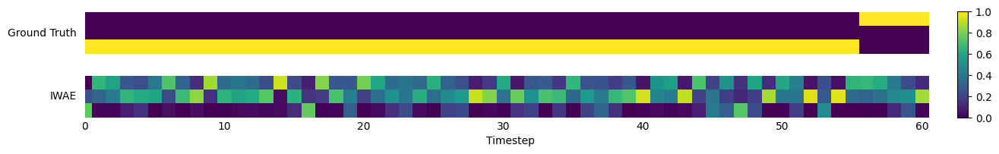

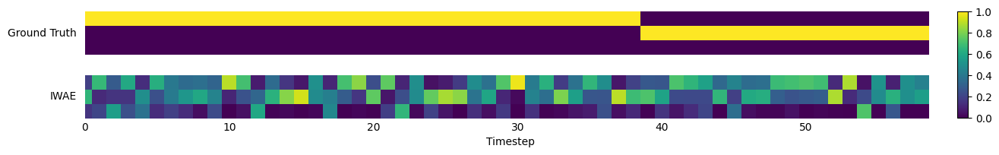

F1:0.32
CE:1.71
Epoch: [50]	Time 0.111	ELBO -189550.4688	 MSM: -1758.6829
Epoch: [100]	Time 0.110	ELBO -57511.1992	 MSM: -1454.6914
MSE: 0.15843
Pred MSE: 0.81422


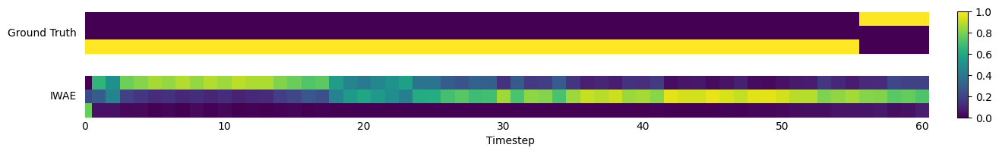

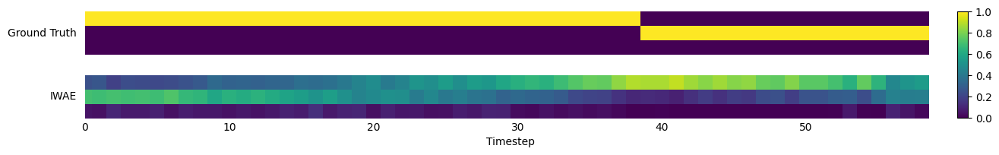

F1:0.36
CE:1.71
Epoch: [150]	Time 0.111	ELBO -14701.4912	 MSM: -1437.3401
Epoch: [200]	Time 0.102	ELBO -10090.5889	 MSM: -1106.4437
MSE: 0.02693
Pred MSE: 0.89113


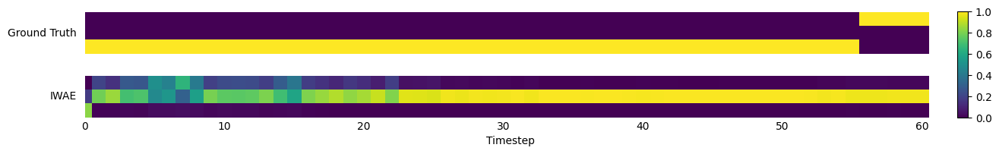

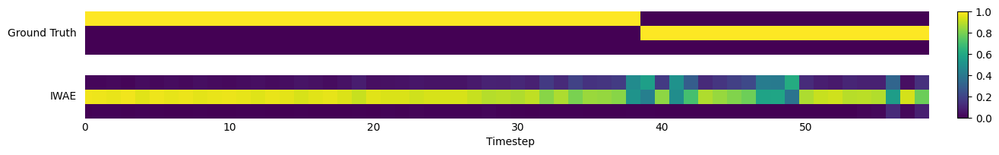

F1:0.25
CE:2.53
Epoch: [250]	Time 0.107	ELBO -9681.1445	 MSM: -854.4319
Epoch: [300]	Time 0.111	ELBO -6519.5874	 MSM: -620.8610
MSE: 0.01601
Pred MSE: 0.90409


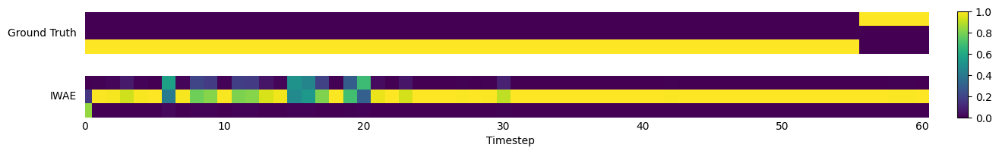

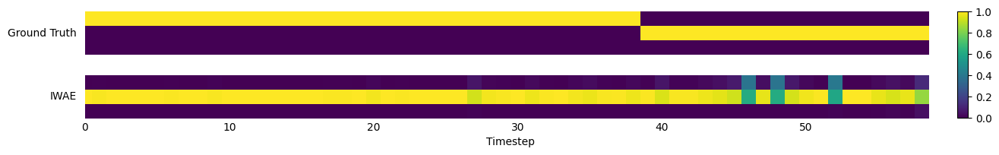

F1:0.28
CE:3.60
Epoch: [350]	Time 0.112	ELBO -3806.6636	 MSM: -578.6440
Epoch: [400]	Time 0.107	ELBO -3550.9773	 MSM: -519.3895
MSE: 0.00584
Pred MSE: 0.94040


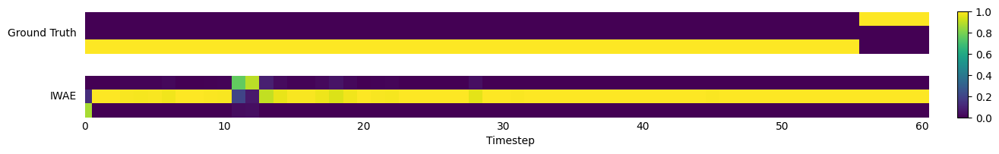

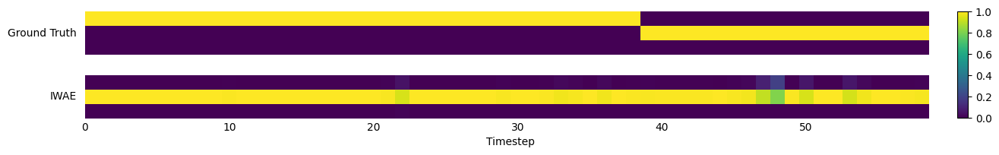

F1:0.25
CE:3.96
Epoch: [450]	Time 0.099	ELBO -2667.8794	 MSM: -476.9236
Epoch: [500]	Time 0.099	ELBO -2244.3887	 MSM: -445.3730
MSE: 0.00395
Pred MSE: 0.96280


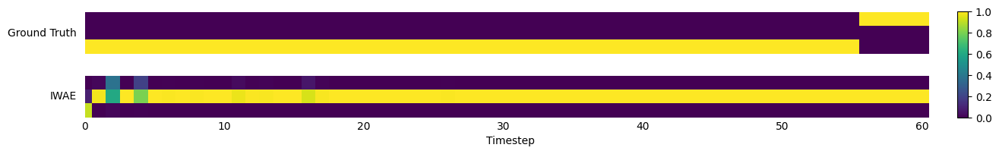

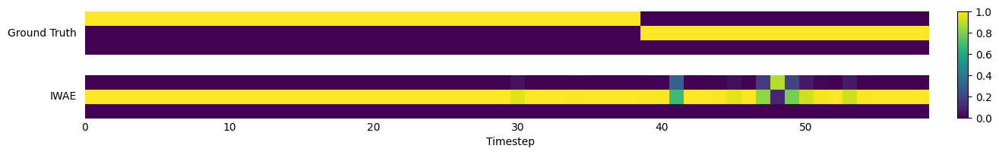

F1:0.24
CE:4.21
Epoch: [550]	Time 0.101	ELBO -2847.9424	 MSM: -429.3115
Epoch: [600]	Time 0.103	ELBO -2344.8020	 MSM: -393.3515
MSE: 0.00281
Pred MSE: 0.95871


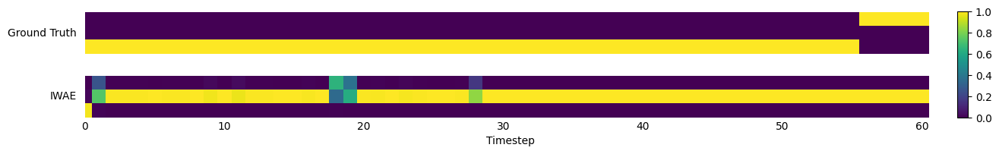

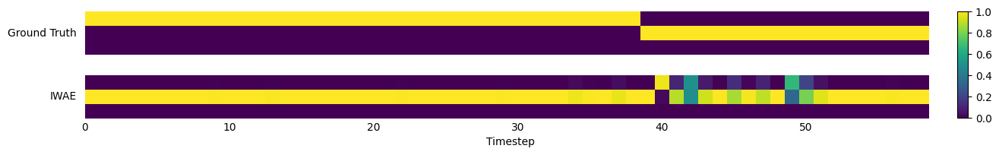

F1:0.25
CE:4.22
Epoch: [650]	Time 0.099	ELBO -1981.6080	 MSM: -396.5730
Epoch: [700]	Time 0.121	ELBO -1937.3046	 MSM: -373.5509
MSE: 0.00267
Pred MSE: 0.97125


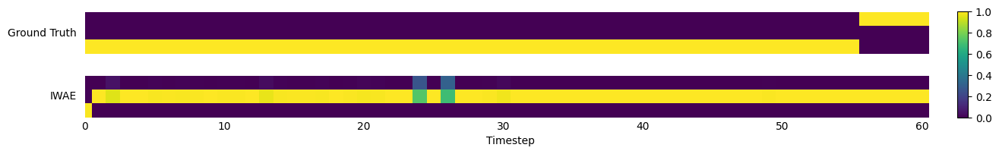

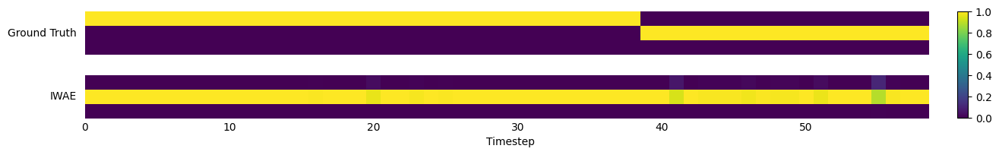

F1:0.25
CE:4.17
Epoch: [750]	Time 0.115	ELBO -1645.0627	 MSM: -341.6126
Epoch: [800]	Time 0.111	ELBO -1608.8748	 MSM: -346.8426
MSE: 0.00199
Pred MSE: 0.98891


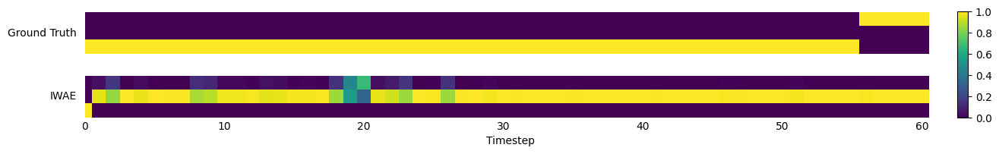

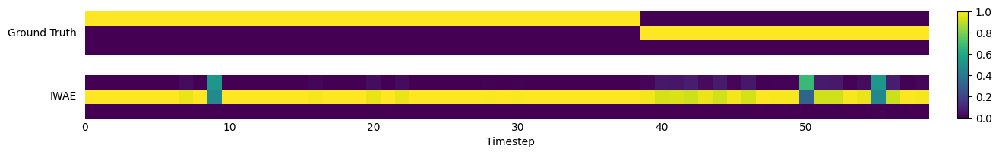

F1:0.25
CE:4.04
Epoch: [850]	Time 0.117	ELBO -1576.2816	 MSM: -323.8131
Epoch: [900]	Time 0.109	ELBO -2425.2893	 MSM: -317.8167
MSE: 0.00551
Pred MSE: 0.97714


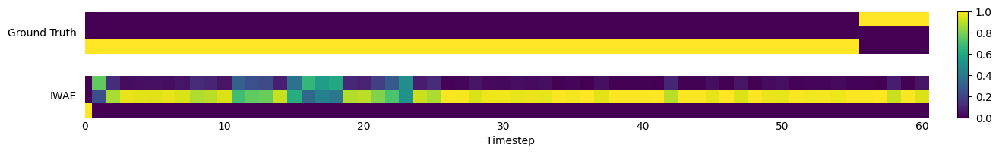

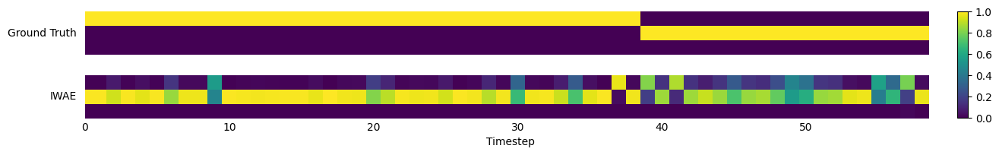

F1:0.28
CE:3.50
Epoch: [950]	Time 0.109	ELBO -1518.2798	 MSM: -302.6733
Epoch: [1000]	Time 0.105	ELBO -1360.5560	 MSM: -257.3483
MSE: 0.00187
Pred MSE: 0.97511


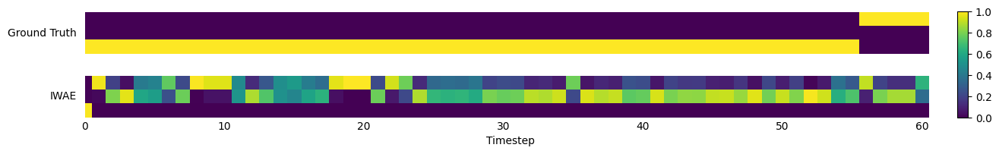

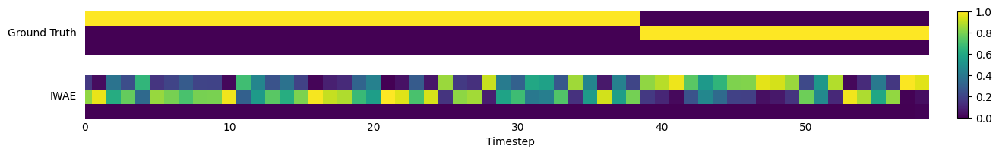

F1:0.35
CE:3.25
Epoch: [1050]	Time 0.116	ELBO -1419.3068	 MSM: -255.0432
Epoch: [1100]	Time 0.114	ELBO -1390.1433	 MSM: -248.4654
MSE: 0.00166
Pred MSE: 0.98407


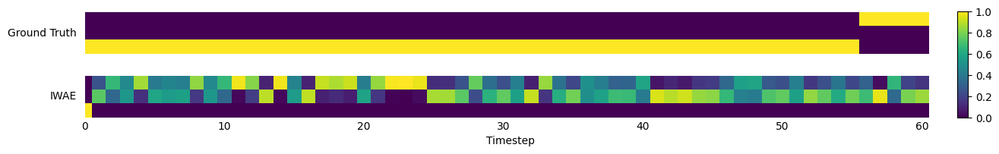

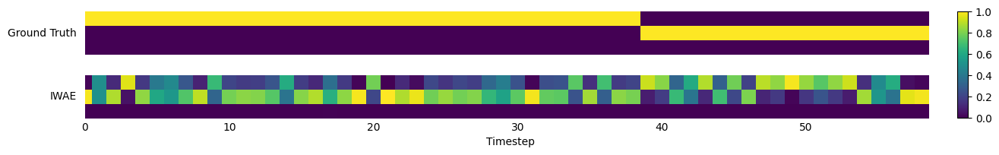

F1:0.35
CE:3.00
Epoch: [1150]	Time 0.120	ELBO -1289.4434	 MSM: -246.4187
Epoch: [1200]	Time 0.123	ELBO -1284.6697	 MSM: -242.1826
MSE: 0.00152
Pred MSE: 1.00989


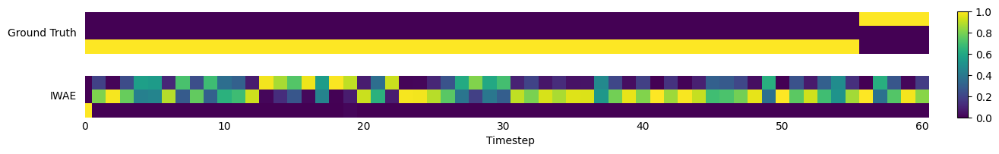

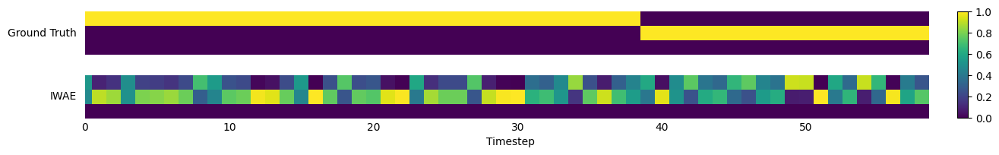

F1:0.36
CE:3.05
Epoch: [1250]	Time 0.114	ELBO -1233.2510	 MSM: -231.1915
Epoch: [1300]	Time 0.092	ELBO -1297.9336	 MSM: -230.1980
MSE: 0.00153
Pred MSE: 0.98217


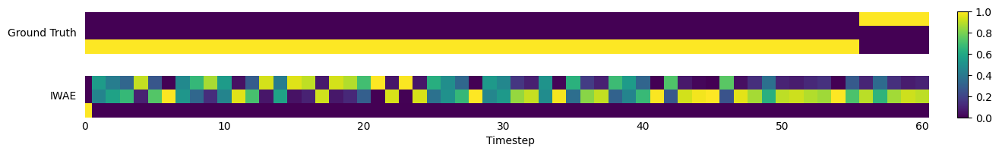

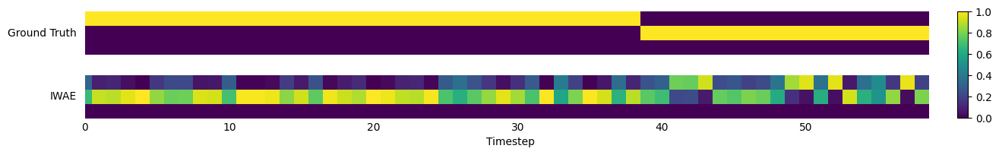

F1:0.35
CE:3.08
Epoch: [1350]	Time 0.105	ELBO -1125.6547	 MSM: -202.6447
Epoch: [1400]	Time 0.102	ELBO -1037.2156	 MSM: -156.9142
MSE: 0.00150
Pred MSE: 1.00695


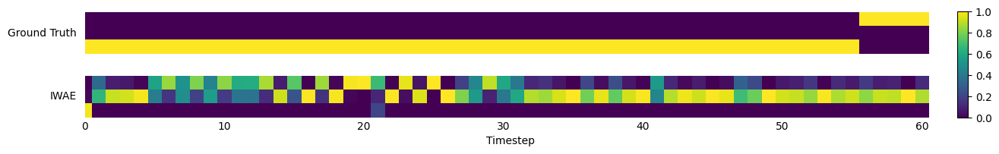

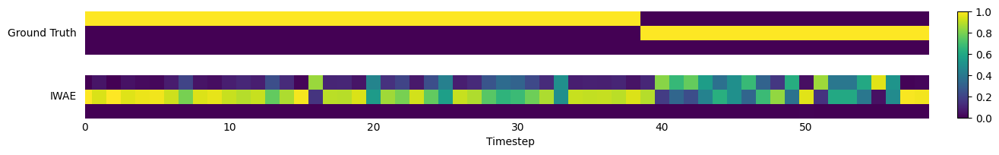

F1:0.33
CE:3.25
Epoch: [1450]	Time 0.121	ELBO -1017.9810	 MSM: -155.0370
Epoch: [1500]	Time 0.121	ELBO -1197.1450	 MSM: -127.2461
MSE: 0.00135
Pred MSE: 1.02889


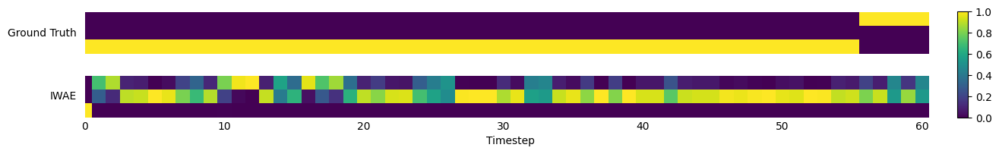

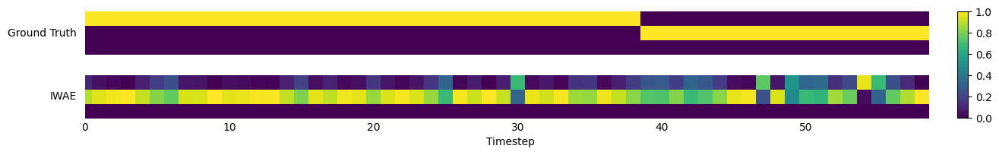

F1:0.29
CE:3.51
Epoch: [1550]	Time 0.121	ELBO -990.8731	 MSM: -124.3010
Epoch: [1600]	Time 0.127	ELBO -942.1223	 MSM: -83.6953
MSE: 0.00141
Pred MSE: 1.01443


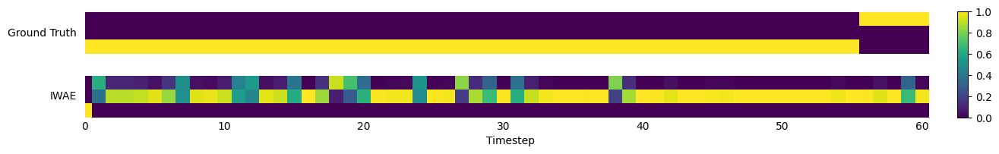

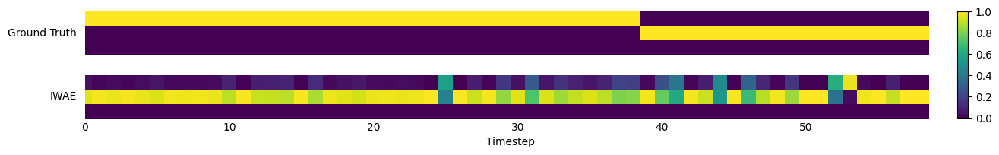

F1:0.27
CE:3.92
Epoch: [1650]	Time 0.117	ELBO -911.3961	 MSM: -46.7461
Epoch: [1700]	Time 0.125	ELBO -944.6859	 MSM: -31.9741
MSE: 0.00125
Pred MSE: 1.03015


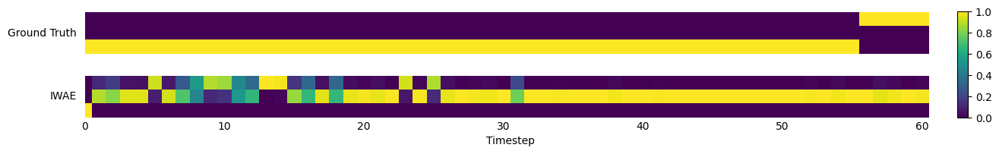

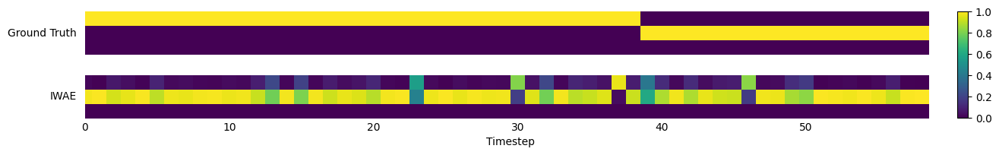

F1:0.26
CE:4.17
Epoch: [1750]	Time 0.127	ELBO -878.6442	 MSM: 9.0681
Epoch: [1800]	Time 0.119	ELBO -959.7945	 MSM: 14.5121
MSE: 0.00111
Pred MSE: 1.01085


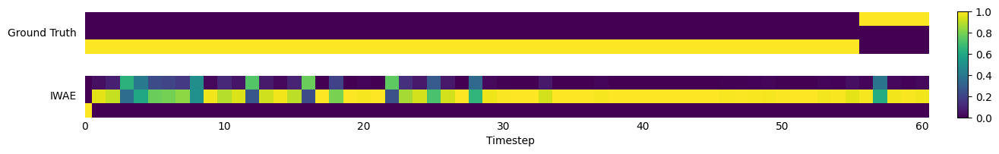

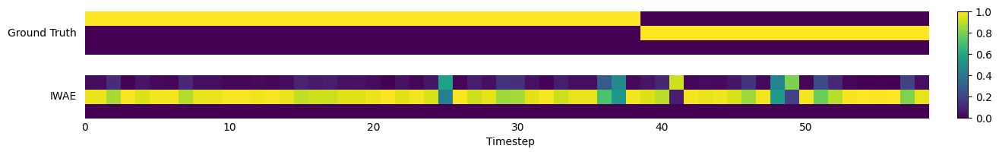

F1:0.25
CE:4.18
Epoch: [1850]	Time 0.116	ELBO -924.9048	 MSM: 0.9786
Epoch: [1900]	Time 0.111	ELBO -883.5266	 MSM: 33.5986
MSE: 0.00105
Pred MSE: 1.02970


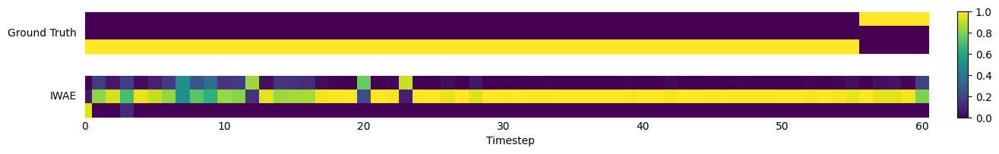

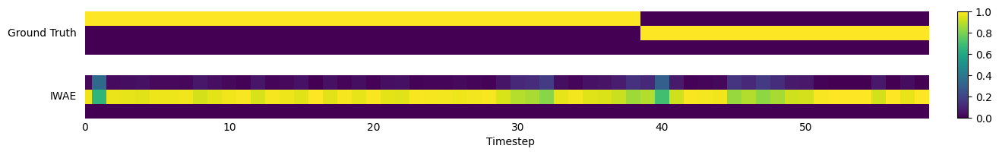

F1:0.24
CE:4.25
Epoch: [1950]	Time 0.112	ELBO -938.2432	 MSM: 29.0263
Epoch: [2000]	Time 0.109	ELBO -895.5343	 MSM: 54.9610
MSE: 0.00112
Pred MSE: 1.02513


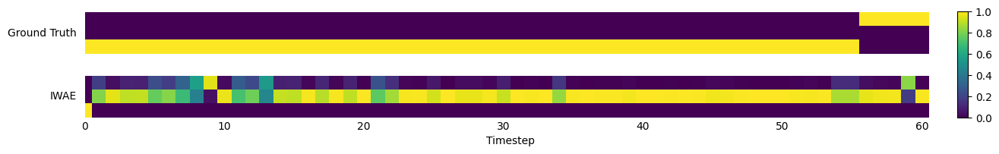

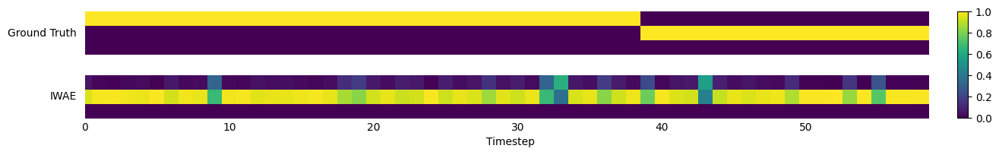

F1:0.24
CE:4.22
Epoch: [2050]	Time 0.100	ELBO -1030.0924	 MSM: 50.8954
Epoch: [2100]	Time 0.121	ELBO -929.2177	 MSM: 43.5324
MSE: 0.00109
Pred MSE: 1.03174


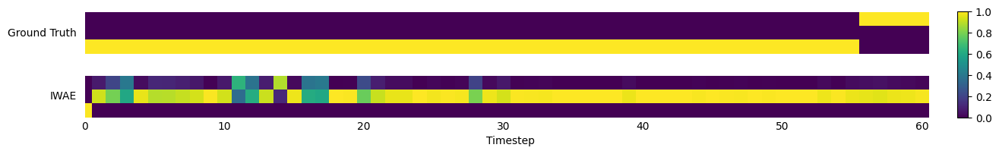

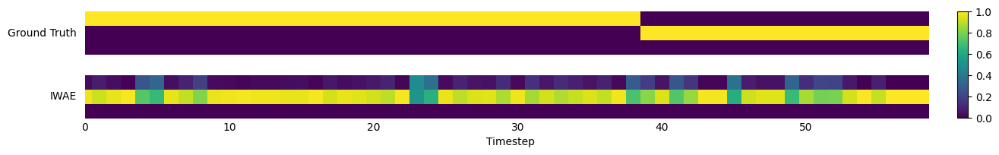

F1:0.23
CE:4.29
Epoch: [2150]	Time 0.104	ELBO -855.9067	 MSM: 68.2683
Epoch: [2200]	Time 0.110	ELBO -847.4598	 MSM: 70.0426
MSE: 0.00101
Pred MSE: 1.00373


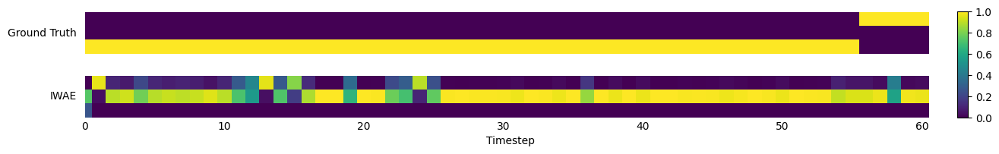

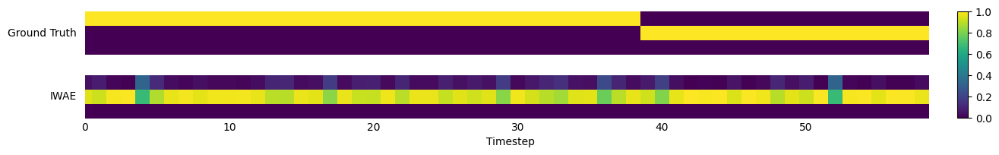

F1:0.23
CE:4.23
Epoch: [2250]	Time 0.101	ELBO -849.6129	 MSM: 88.6670
Epoch: [2300]	Time 0.108	ELBO -896.9451	 MSM: 43.5502
MSE: 0.00101
Pred MSE: 1.01333


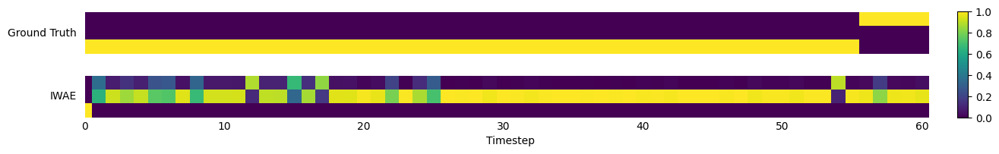

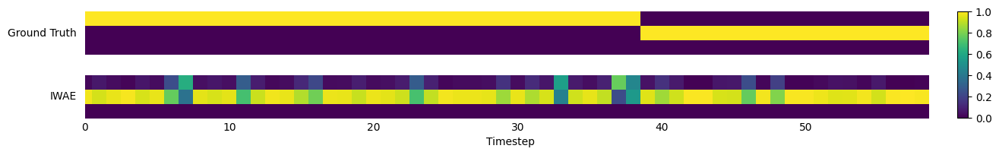

F1:0.23
CE:4.29
Epoch: [2350]	Time 0.104	ELBO -829.5383	 MSM: 57.2061
Epoch: [2400]	Time 0.102	ELBO -799.6179	 MSM: 93.2935
MSE: 0.00099
Pred MSE: 1.00944


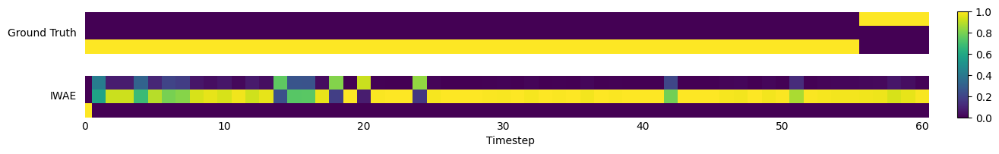

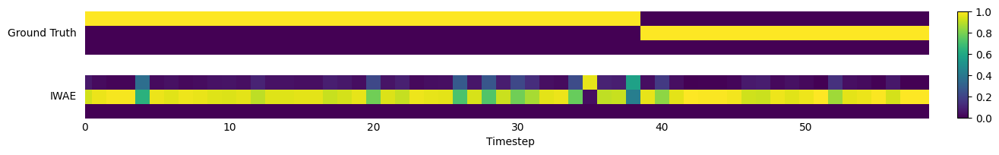

F1:0.24
CE:4.26
Epoch: [2450]	Time 0.114	ELBO -825.1296	 MSM: 71.1332
Epoch: [2500]	Time 0.130	ELBO -917.0491	 MSM: 71.3903
MSE: 0.00096
Pred MSE: 0.99588


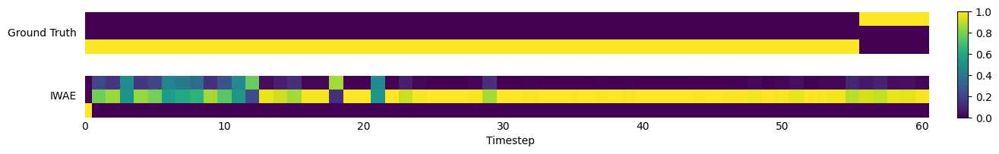

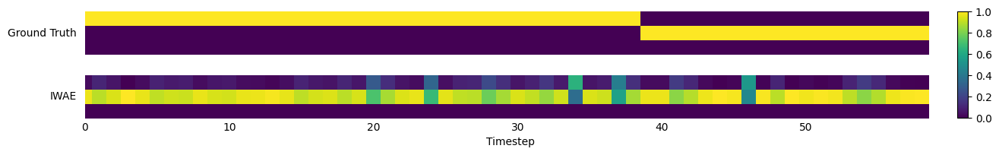

F1:0.23
CE:4.36
Epoch: [2550]	Time 0.121	ELBO -848.5612	 MSM: 80.7950
Epoch: [2600]	Time 0.121	ELBO -830.1743	 MSM: 102.3329
MSE: 0.00095
Pred MSE: 0.99314


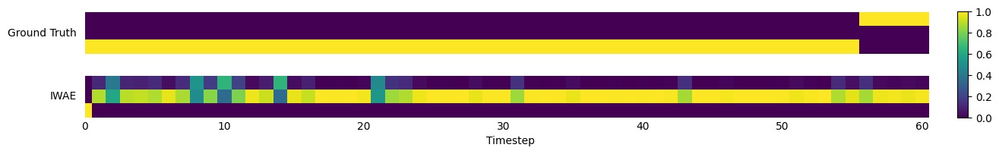

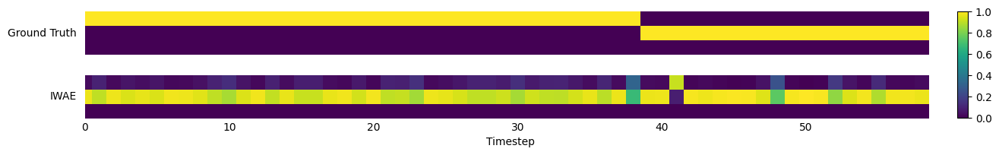

F1:0.23
CE:4.52
Epoch: [2650]	Time 0.114	ELBO -813.3258	 MSM: 94.6194
Epoch: [2700]	Time 0.133	ELBO -774.1614	 MSM: 110.9886
MSE: 0.00110
Pred MSE: 0.98361


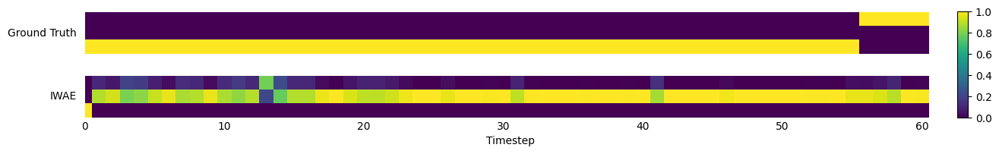

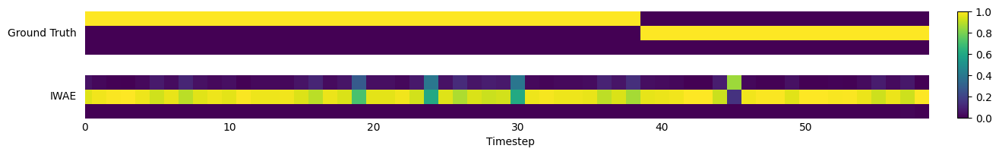

F1:0.22
CE:5.05
Epoch: [2750]	Time 0.102	ELBO -771.1053	 MSM: 132.4713
Epoch: [2800]	Time 0.101	ELBO -774.8530	 MSM: 108.9179
MSE: 0.00095
Pred MSE: 0.95570


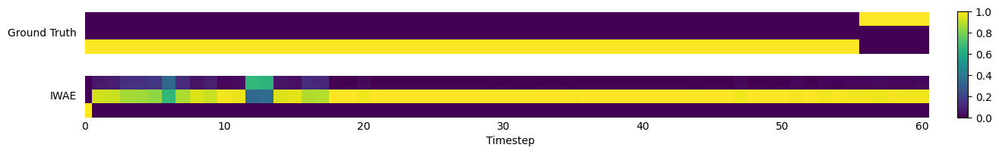

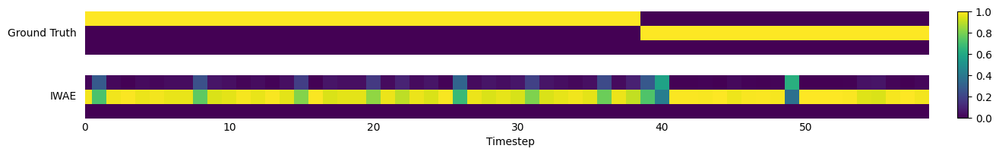

F1:0.22
CE:4.83
Epoch: [2850]	Time 0.113	ELBO -718.0400	 MSM: 143.5312
Epoch: [2900]	Time 0.133	ELBO -816.3043	 MSM: 132.9035
MSE: 0.00102
Pred MSE: 0.94874


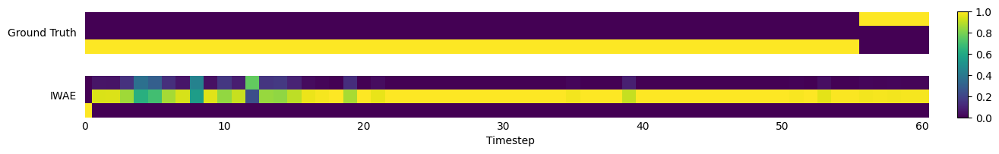

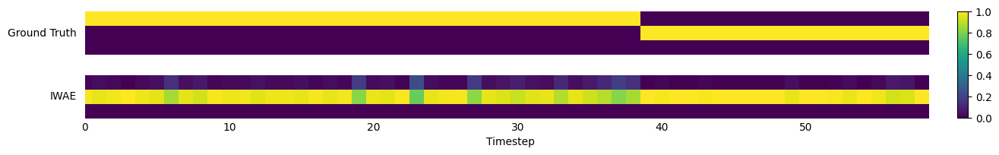

F1:0.22
CE:5.23
Epoch: [2950]	Time 0.125	ELBO -910.8859	 MSM: 144.2515
Epoch: [3000]	Time 0.110	ELBO -710.9952	 MSM: 170.9564
MSE: 0.00085
Pred MSE: 0.92592


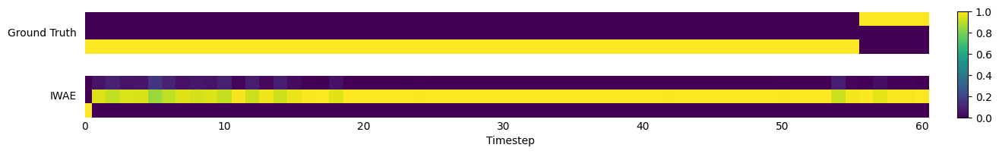

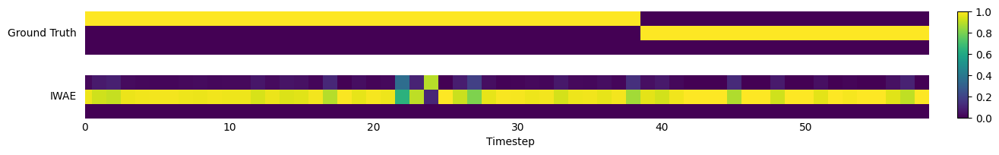

F1:0.21
CE:4.96
Epoch: [3050]	Time 0.122	ELBO -740.4510	 MSM: 158.0605
Epoch: [3100]	Time 0.131	ELBO -754.3472	 MSM: 151.7695
MSE: 0.00087
Pred MSE: 0.92744


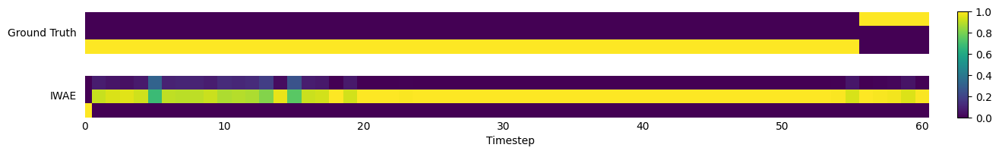

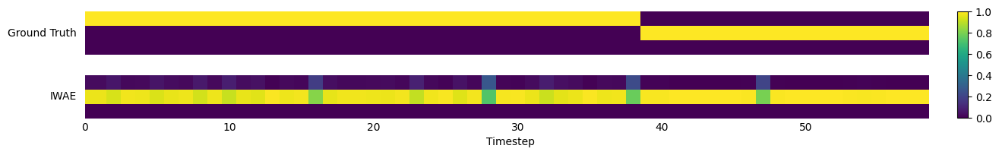

F1:0.21
CE:4.98
Epoch: [3150]	Time 0.122	ELBO -722.6953	 MSM: 166.1424
Epoch: [3200]	Time 0.115	ELBO -680.6838	 MSM: 188.5163
MSE: 0.00091
Pred MSE: 0.90719


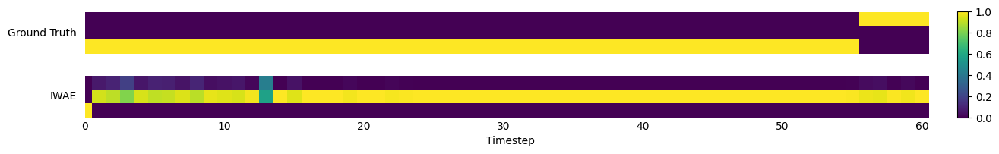

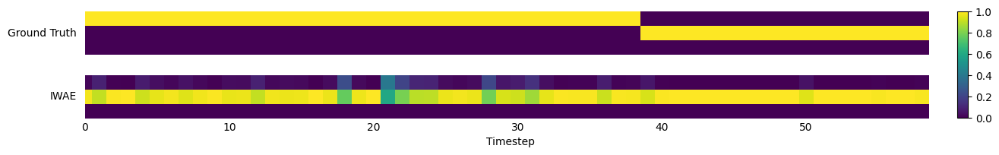

F1:0.21
CE:5.28
Epoch: [3250]	Time 0.119	ELBO -725.5692	 MSM: 176.4104
Epoch: [3300]	Time 0.113	ELBO -706.8019	 MSM: 187.7376
MSE: 0.00075
Pred MSE: 0.90256


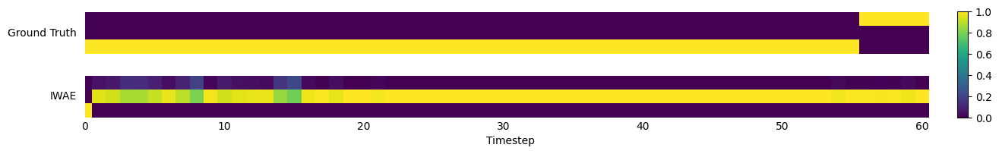

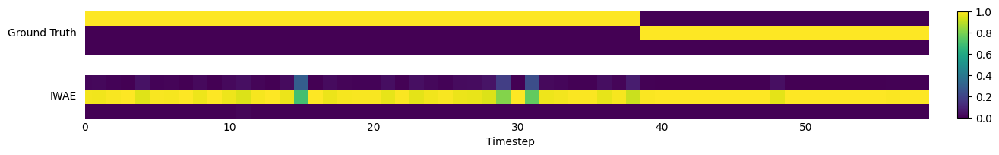

F1:0.22
CE:5.46
Epoch: [3350]	Time 0.119	ELBO -771.3054	 MSM: 171.4332
Epoch: [3400]	Time 0.126	ELBO -722.3577	 MSM: 164.5088
MSE: 0.00090
Pred MSE: 0.88990


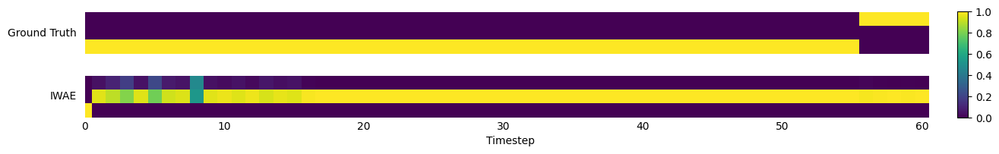

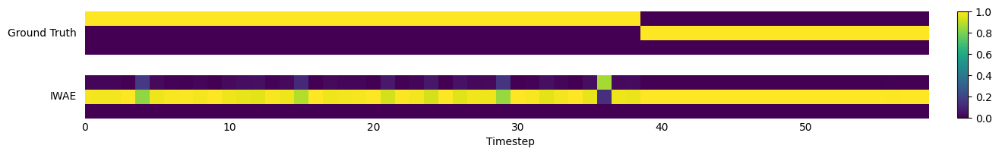

F1:0.22
CE:5.77
Epoch: [3450]	Time 0.112	ELBO -665.3145	 MSM: 201.1288
Epoch: [3500]	Time 0.120	ELBO -705.2878	 MSM: 172.7680
MSE: 0.00082
Pred MSE: 0.87726


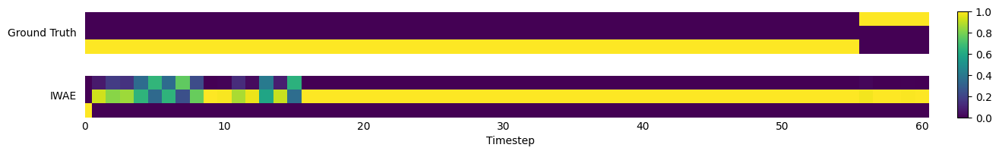

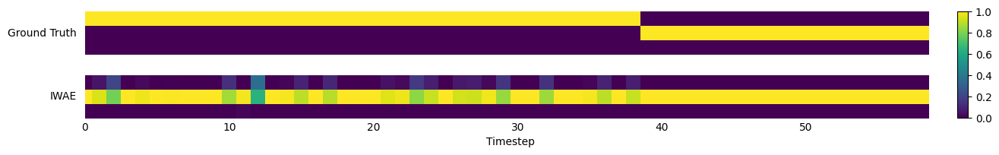

F1:0.22
CE:8.58
Epoch: [3550]	Time 0.123	ELBO -671.4325	 MSM: 201.6339
Epoch: [3600]	Time 0.122	ELBO -661.8173	 MSM: 197.5812
MSE: 0.00096
Pred MSE: 0.85830


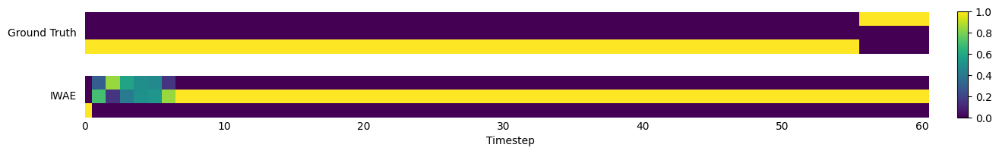

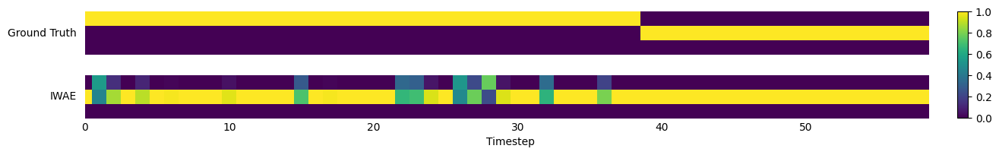

F1:0.22
CE:9.53
Epoch: [3650]	Time 0.124	ELBO -664.2226	 MSM: 193.6011
Epoch: [3700]	Time 0.127	ELBO -664.4561	 MSM: 195.6686
MSE: 0.00087
Pred MSE: 0.85156


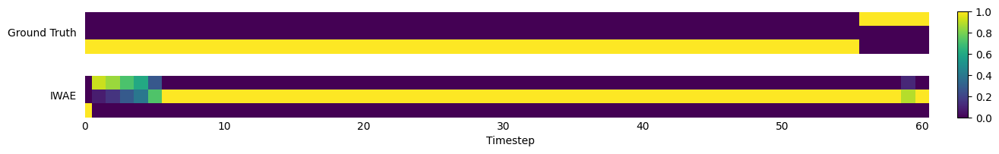

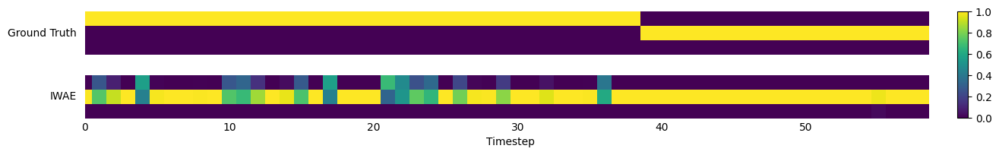

F1:0.22
CE:8.81
Epoch: [3750]	Time 0.123	ELBO -683.4481	 MSM: 191.1321
Epoch: [3800]	Time 0.110	ELBO -636.3370	 MSM: 193.3318
MSE: 0.00088
Pred MSE: 0.84384


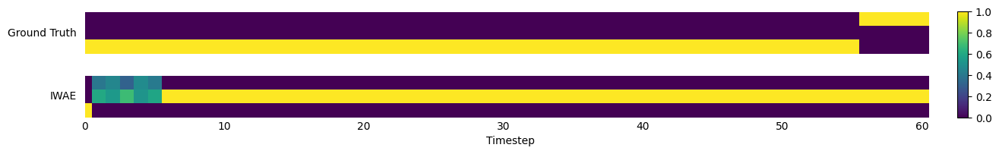

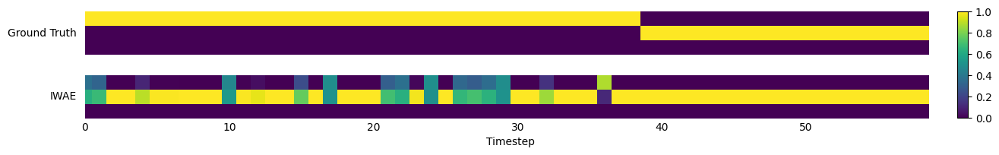

F1:0.22
CE:8.81
Epoch: [3850]	Time 0.108	ELBO -662.3861	 MSM: 226.4198
Epoch: [3900]	Time 0.116	ELBO -648.2590	 MSM: 215.7769
MSE: 0.00078
Pred MSE: 0.84099


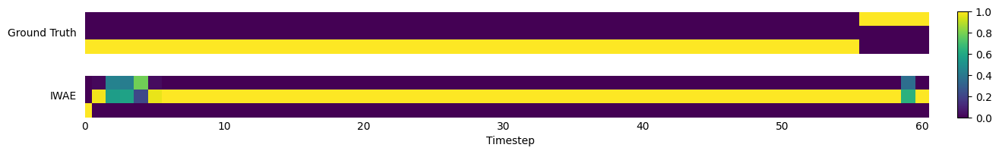

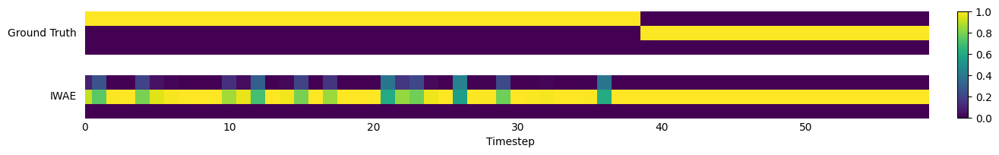

F1:0.22
CE:8.89
Epoch: [3950]	Time 0.099	ELBO -679.6959	 MSM: 197.2953
Epoch: [4000]	Time 0.099	ELBO -700.8905	 MSM: 197.7686
MSE: 0.00080
Pred MSE: 0.83648


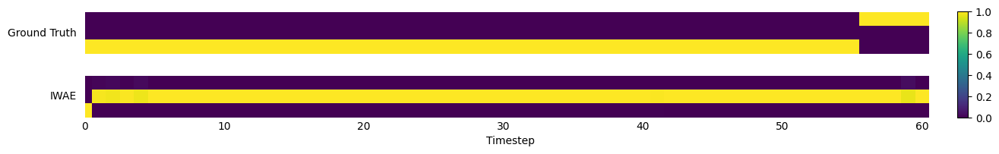

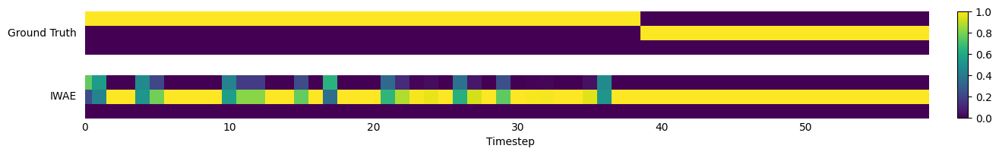

F1:0.23
CE:8.66
Epoch: [4050]	Time 0.097	ELBO -674.2013	 MSM: 214.9341
Epoch: [4100]	Time 0.099	ELBO -651.4537	 MSM: 188.7496
MSE: 0.00088
Pred MSE: 0.83027


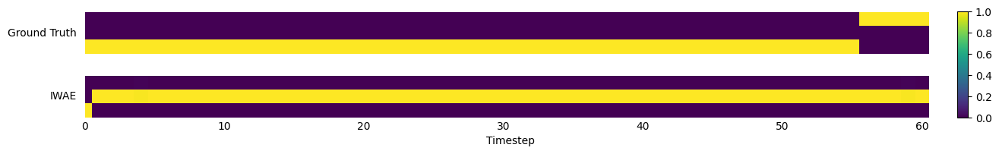

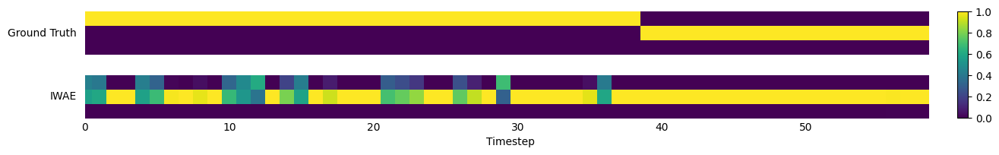

F1:0.23
CE:8.68
Epoch: [4150]	Time 0.098	ELBO -623.8637	 MSM: 207.3436
Epoch: [4200]	Time 0.098	ELBO -649.1498	 MSM: 196.4228
MSE: 0.00080
Pred MSE: 0.83055


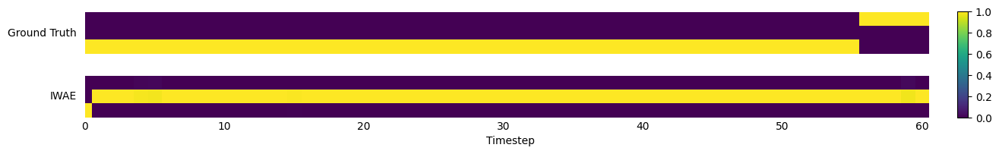

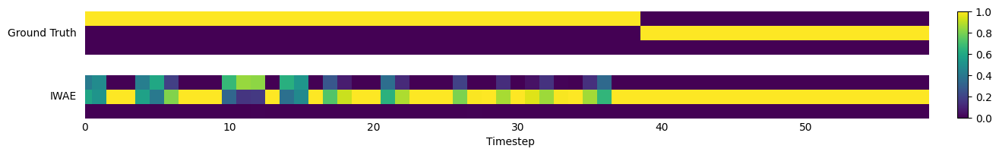

F1:0.25
CE:8.63
Epoch: [4250]	Time 0.128	ELBO -657.1498	 MSM: 215.0839
Epoch: [4300]	Time 0.116	ELBO -665.6044	 MSM: 202.4631
MSE: 0.00084
Pred MSE: 0.83325


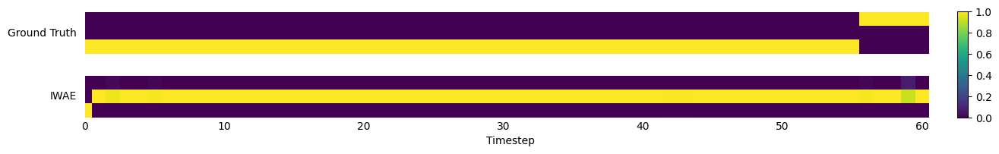

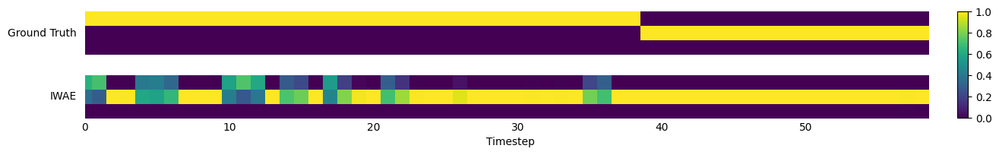

F1:0.26
CE:8.47
Epoch: [4350]	Time 0.120	ELBO -679.2789	 MSM: 192.9925
Epoch: [4400]	Time 0.110	ELBO -634.4208	 MSM: 213.9875
MSE: 0.00077
Pred MSE: 0.82761


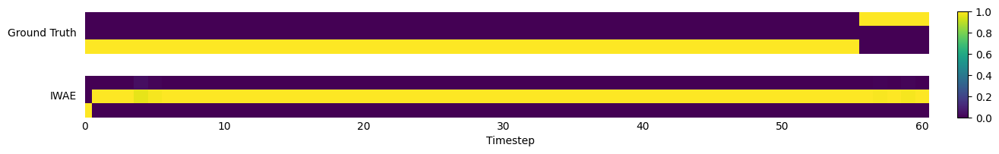

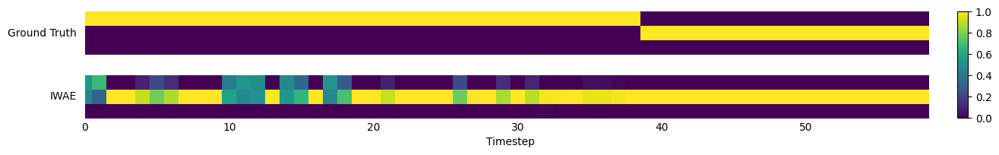

F1:0.26
CE:8.72
Epoch: [4450]	Time 0.123	ELBO -715.2070	 MSM: 209.5934
Epoch: [4500]	Time 0.129	ELBO -585.4097	 MSM: 235.3905
MSE: 0.00077
Pred MSE: 0.82925


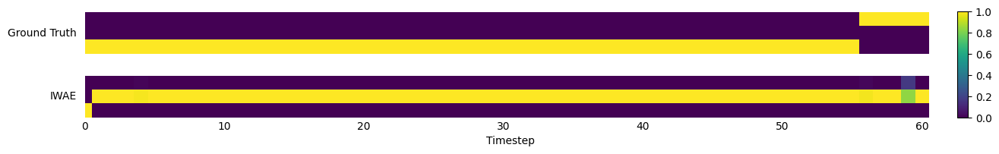

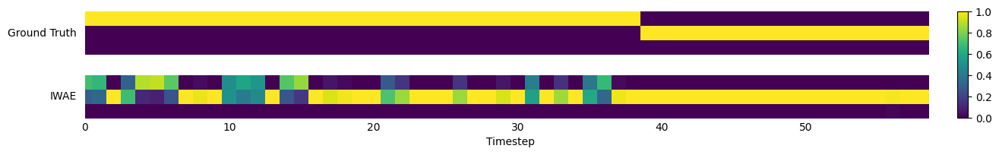

F1:0.26
CE:8.63
Epoch: [4550]	Time 0.128	ELBO -614.4940	 MSM: 207.4517
Epoch: [4600]	Time 0.122	ELBO -595.9208	 MSM: 202.9120
MSE: 0.00082
Pred MSE: 0.82198


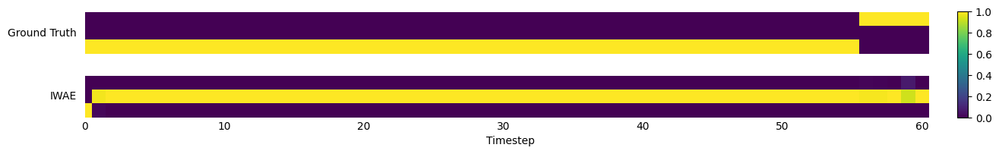

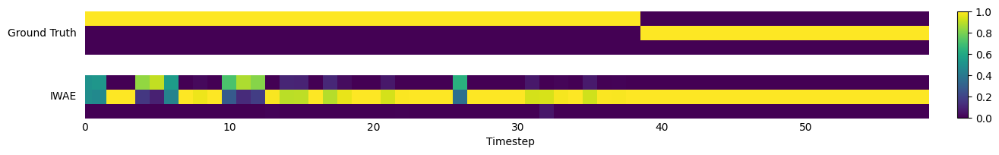

F1:0.26
CE:9.08
Epoch: [4650]	Time 0.121	ELBO -651.6507	 MSM: 193.2093
Epoch: [4700]	Time 0.110	ELBO -649.5244	 MSM: 207.7677
MSE: 0.00080
Pred MSE: 0.82082


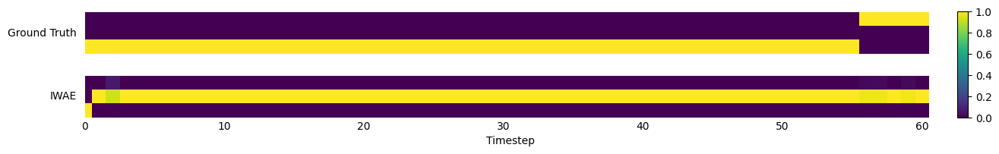

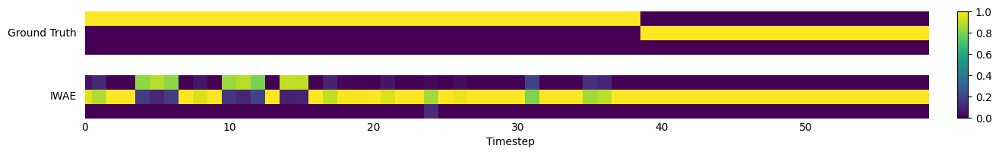

F1:0.27
CE:9.00
Epoch: [4750]	Time 0.119	ELBO -677.2730	 MSM: 195.1373
Epoch: [4800]	Time 0.128	ELBO -614.5543	 MSM: 226.8818
MSE: 0.00078
Pred MSE: 0.82694


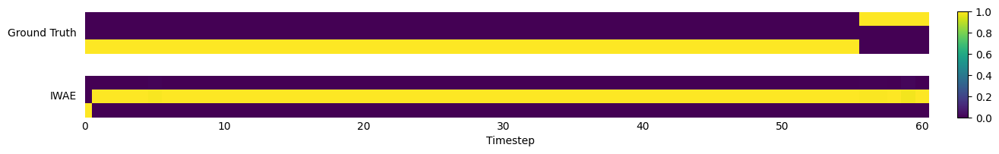

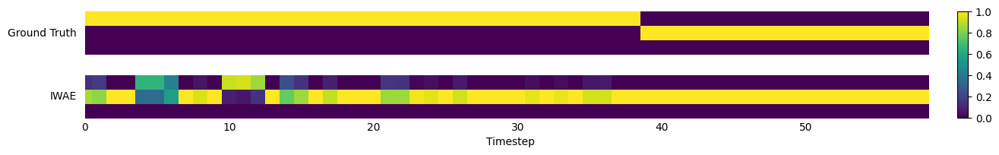

F1:0.26
CE:9.17
Epoch: [4850]	Time 0.111	ELBO -585.0236	 MSM: 215.2660
Epoch: [4900]	Time 0.129	ELBO -667.6290	 MSM: 212.7352
MSE: 0.00088
Pred MSE: 0.81195


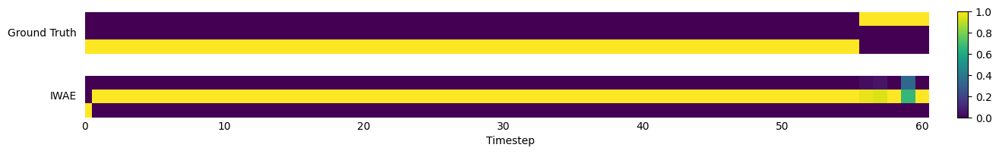

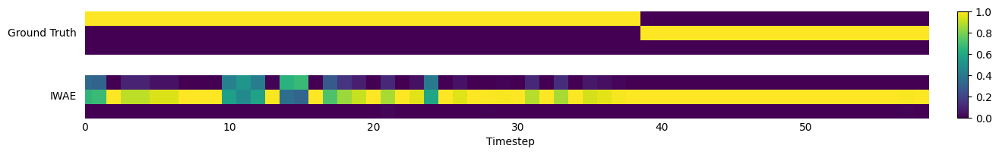

F1:0.26
CE:9.09
Epoch: [4950]	Time 0.127	ELBO -633.3565	 MSM: 219.3178
Epoch: [5000]	Time 0.132	ELBO -619.1404	 MSM: 188.3730
MSE: 0.00083
Pred MSE: 0.80840


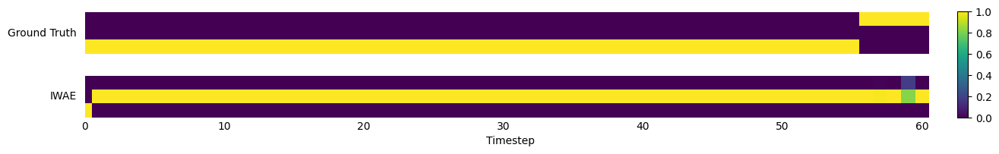

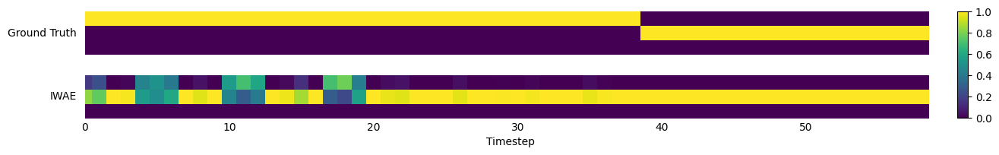

F1:0.26
CE:9.20
Epoch: [5050]	Time 0.126	ELBO -623.7560	 MSM: 193.7161
Epoch: [5100]	Time 0.114	ELBO -603.7928	 MSM: 199.4024
MSE: 0.00080
Pred MSE: 0.81504


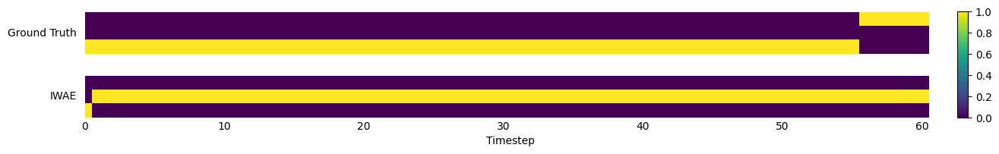

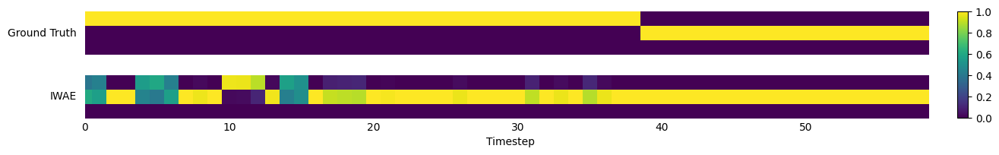

F1:0.26
CE:9.33
Epoch: [5150]	Time 0.113	ELBO -635.8947	 MSM: 168.8733
Epoch: [5200]	Time 0.127	ELBO -667.2233	 MSM: 165.6527
MSE: 0.00077
Pred MSE: 0.82146


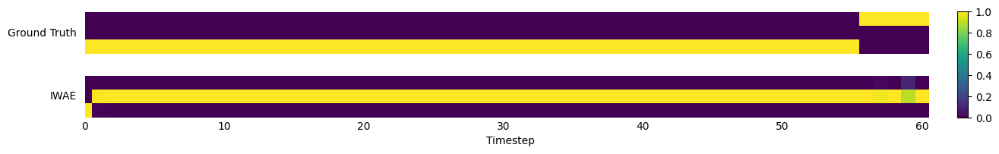

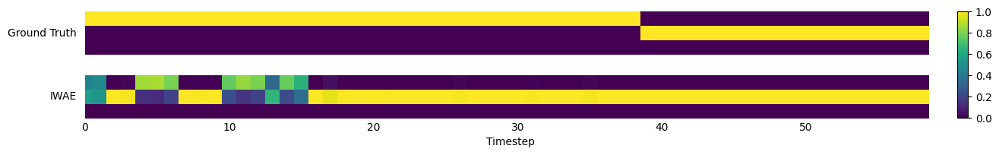

F1:0.25
CE:9.81
Epoch: [5250]	Time 0.113	ELBO -640.5668	 MSM: 175.2501
Epoch: [5300]	Time 0.115	ELBO -598.9459	 MSM: 208.9371
MSE: 0.00077
Pred MSE: 0.80690


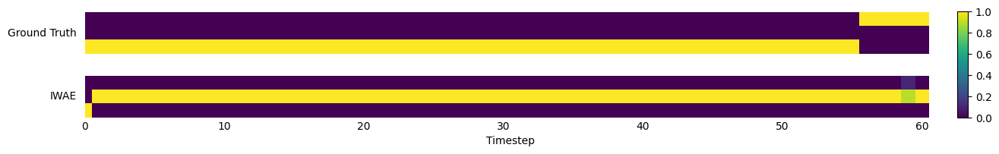

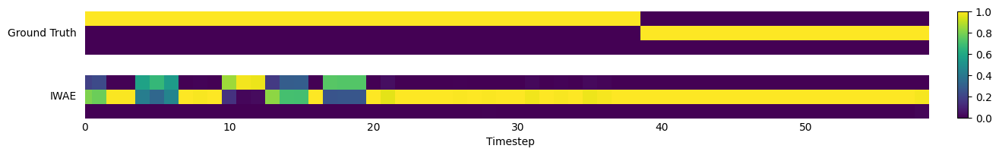

F1:0.26
CE:9.58
Epoch: [5350]	Time 0.111	ELBO -614.1205	 MSM: 196.1784
Epoch: [5400]	Time 0.114	ELBO -596.9220	 MSM: 214.7821
MSE: 0.00071
Pred MSE: 0.82187


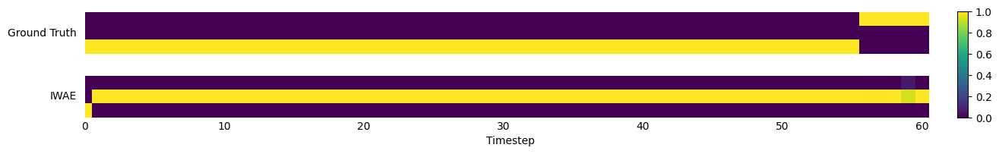

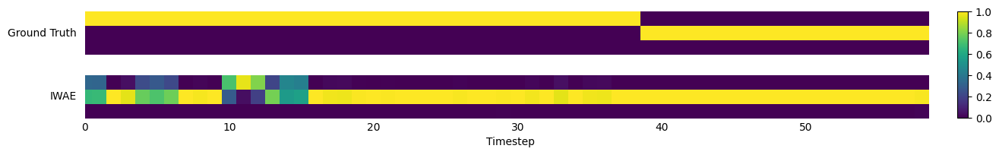

F1:0.26
CE:9.56
Epoch: [5450]	Time 0.124	ELBO -624.8545	 MSM: 180.5382
Epoch: [5500]	Time 0.120	ELBO -586.9279	 MSM: 207.1020
MSE: 0.00076
Pred MSE: 0.80661


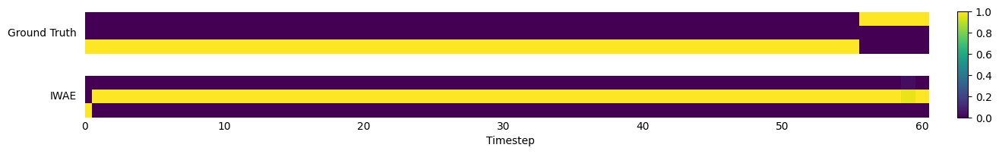

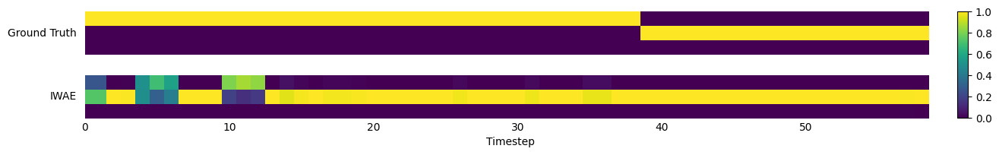

F1:0.26
CE:9.94
Epoch: [5550]	Time 0.112	ELBO -555.5203	 MSM: 222.3609
Epoch: [5600]	Time 0.110	ELBO -637.6907	 MSM: 173.7529
MSE: 0.00076
Pred MSE: 0.79961


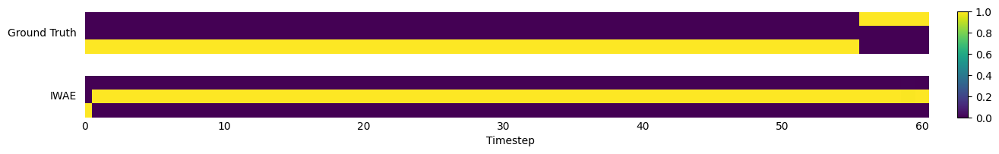

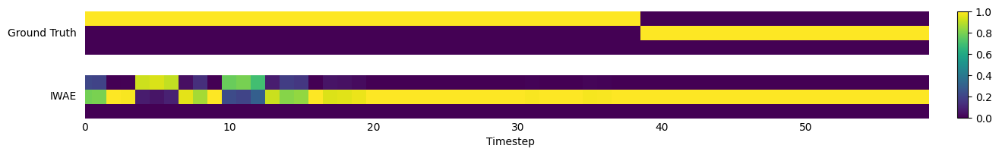

F1:0.26
CE:9.84
Epoch: [5650]	Time 0.120	ELBO -582.3128	 MSM: 198.1234
Epoch: [5700]	Time 0.114	ELBO -606.0961	 MSM: 180.0538
MSE: 0.00080
Pred MSE: 0.81600


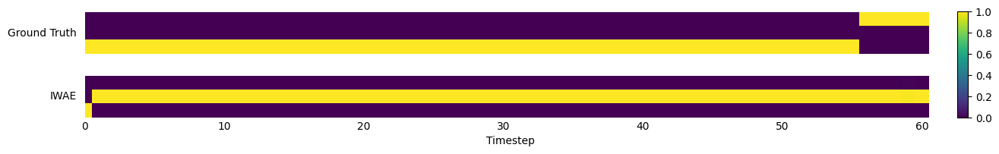

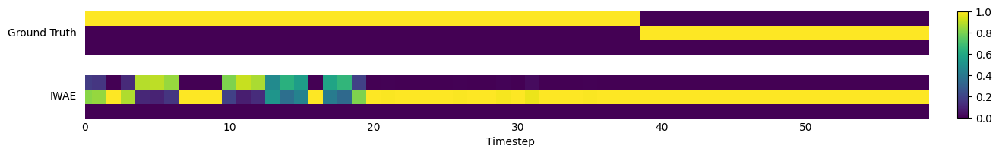

F1:0.26
CE:10.06
Epoch: [5750]	Time 0.098	ELBO -618.7010	 MSM: 196.7766
Epoch: [5800]	Time 0.111	ELBO -574.5063	 MSM: 197.1022
MSE: 0.00080
Pred MSE: 0.80306


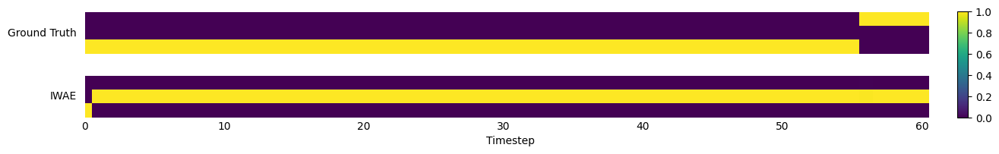

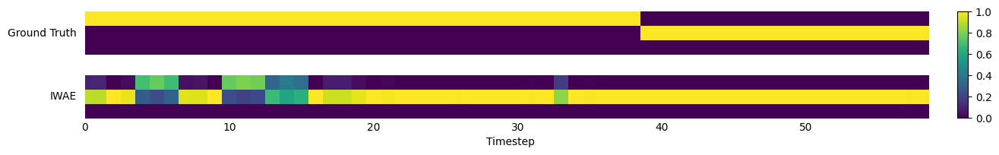

F1:0.25
CE:10.20
Epoch: [5850]	Time 0.114	ELBO -622.0004	 MSM: 182.1262
Epoch: [5900]	Time 0.110	ELBO -574.2707	 MSM: 188.1363
MSE: 0.00077
Pred MSE: 0.79373


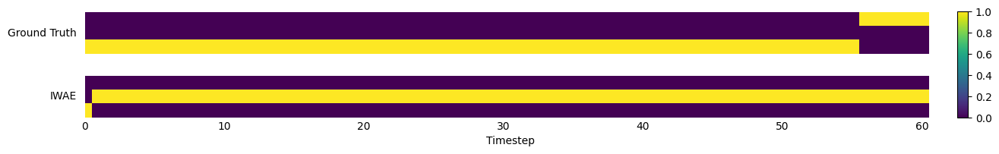

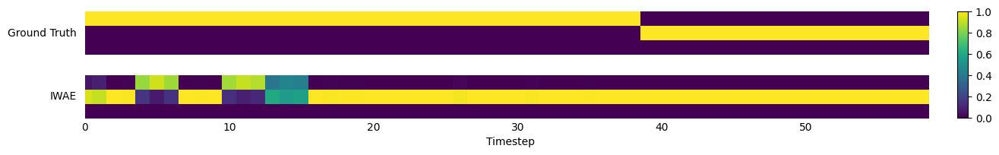

F1:0.25
CE:10.38
Epoch: [5950]	Time 0.112	ELBO -603.2993	 MSM: 180.3612
Epoch: [6000]	Time 0.112	ELBO -715.2686	 MSM: 187.3314
MSE: 0.00075
Pred MSE: 0.79919


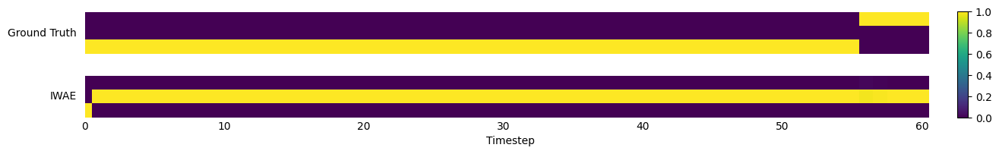

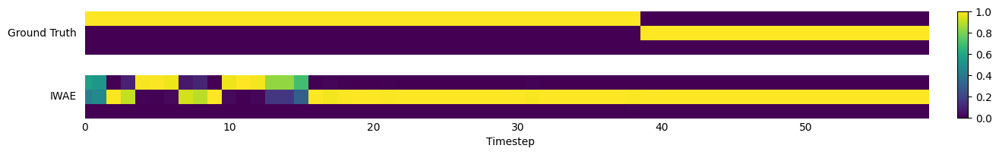

F1:0.26
CE:10.48
Epoch: [6050]	Time 0.121	ELBO -607.7035	 MSM: 194.7643
Epoch: [6100]	Time 0.110	ELBO -557.6572	 MSM: 199.5424
MSE: 0.00078
Pred MSE: 0.82066


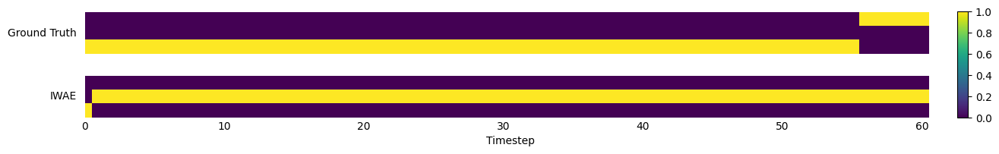

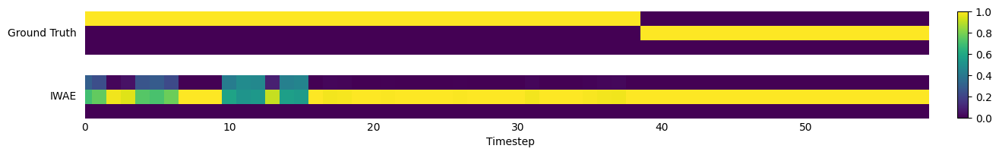

F1:0.25
CE:10.60
Epoch: [6150]	Time 0.106	ELBO -667.1771	 MSM: 179.4406
Epoch: [6200]	Time 0.114	ELBO -576.2803	 MSM: 208.6995
MSE: 0.00073
Pred MSE: 0.80348


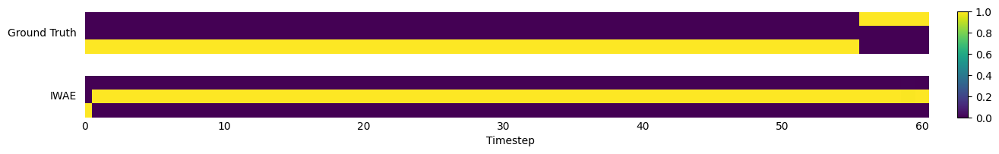

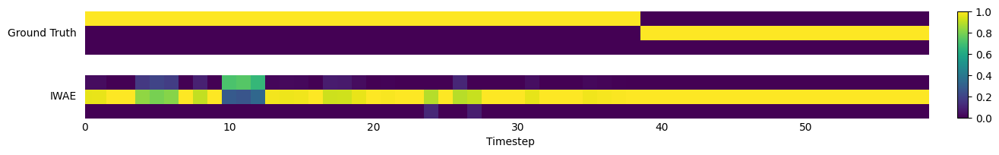

F1:0.26
CE:10.60
Epoch: [6250]	Time 0.115	ELBO -573.2663	 MSM: 175.4899
Epoch: [6300]	Time 0.114	ELBO -624.6702	 MSM: 163.3499
MSE: 0.00079
Pred MSE: 0.80243


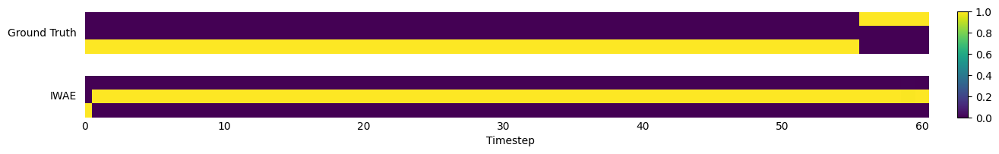

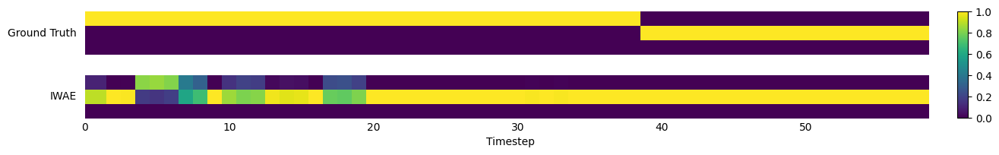

F1:0.25
CE:11.14
Epoch: [6350]	Time 0.110	ELBO -578.4384	 MSM: 199.0844
Epoch: [6400]	Time 0.121	ELBO -618.7474	 MSM: 179.5966
MSE: 0.00082
Pred MSE: 0.79585


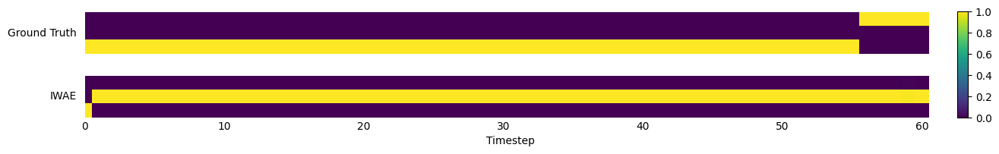

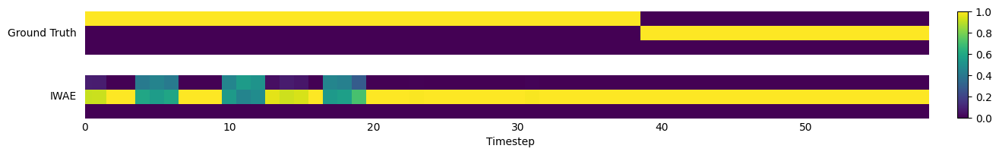

F1:0.25
CE:10.85
Epoch: [6450]	Time 0.115	ELBO -566.9310	 MSM: 187.4941
Epoch: [6500]	Time 0.111	ELBO -589.4078	 MSM: 183.6472
MSE: 0.00085
Pred MSE: 0.81345


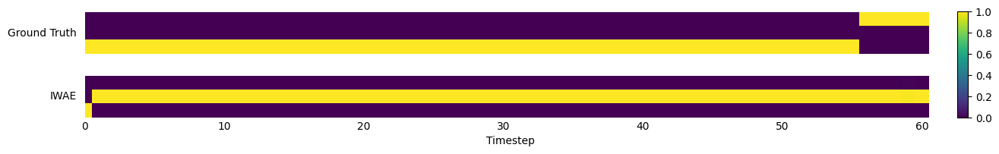

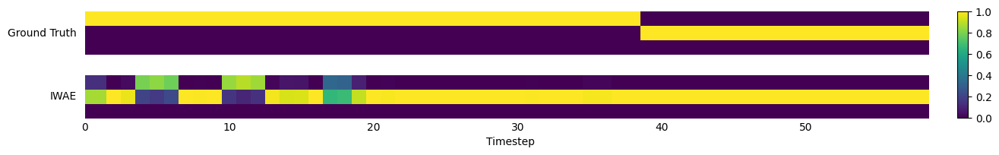

F1:0.25
CE:10.64
Epoch: [6550]	Time 0.113	ELBO -550.4271	 MSM: 189.0270
Epoch: [6600]	Time 0.110	ELBO -583.4526	 MSM: 169.0926
MSE: 0.00079
Pred MSE: 0.79851


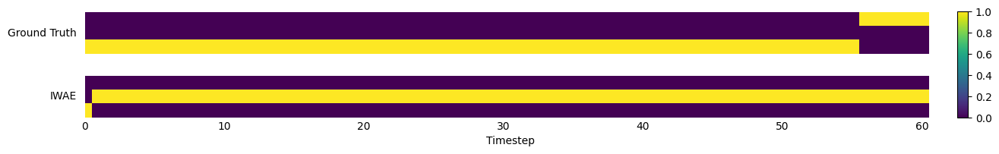

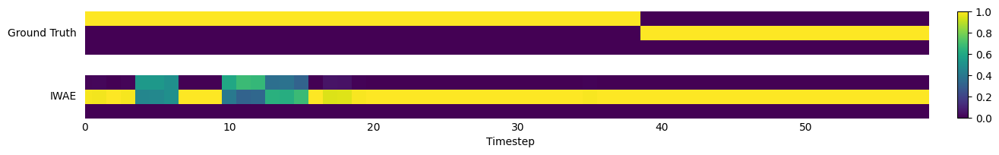

F1:0.25
CE:10.94
Epoch: [6650]	Time 0.119	ELBO -587.8280	 MSM: 188.4595
Epoch: [6700]	Time 0.117	ELBO -624.7436	 MSM: 162.3428
MSE: 0.00084
Pred MSE: 0.81382


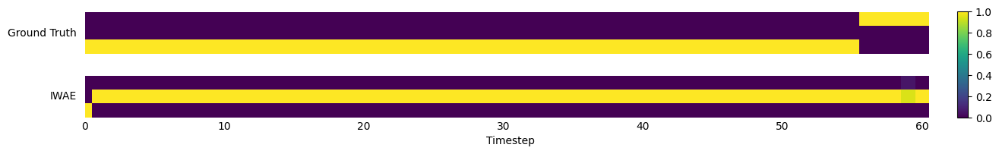

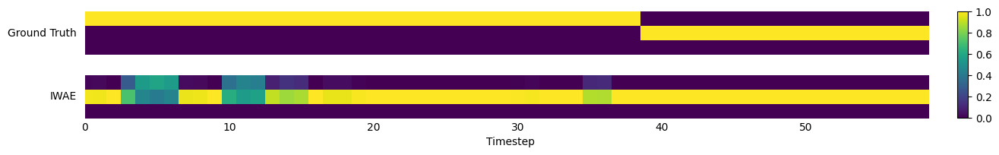

F1:0.25
CE:11.09
Epoch: [6750]	Time 0.118	ELBO -555.1567	 MSM: 188.7416
Epoch: [6800]	Time 0.112	ELBO -544.4986	 MSM: 195.5565
MSE: 0.00076
Pred MSE: 0.79485


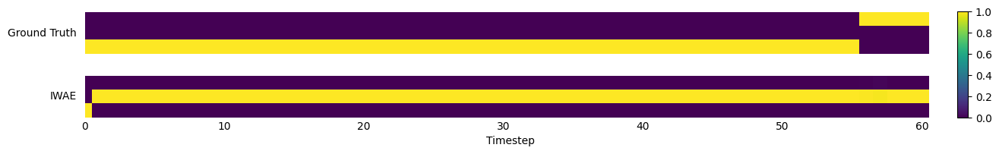

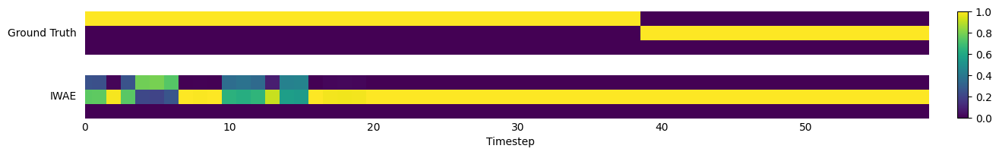

F1:0.25
CE:11.12
Epoch: [6850]	Time 0.122	ELBO -565.6720	 MSM: 170.6532
Epoch: [6900]	Time 0.134	ELBO -659.5356	 MSM: 153.7677
MSE: 0.00085
Pred MSE: 0.80323


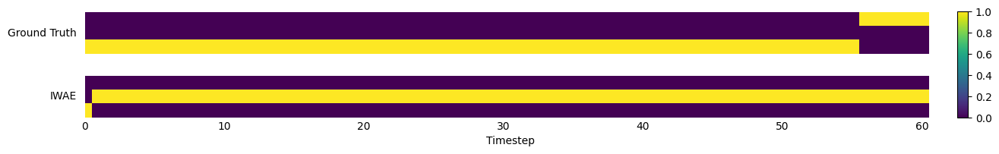

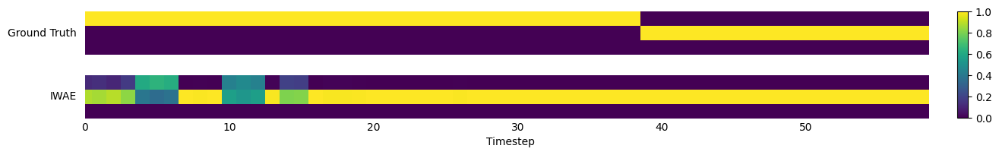

F1:0.24
CE:11.10
Epoch: [6950]	Time 0.113	ELBO -576.8430	 MSM: 175.4596
Epoch: [7000]	Time 0.112	ELBO -586.8800	 MSM: 160.6893
MSE: 0.00074
Pred MSE: 0.79844


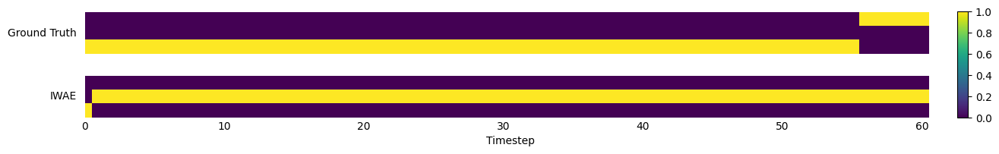

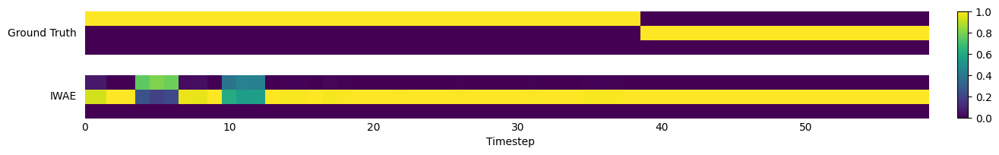

F1:0.25
CE:11.03
Epoch: [7050]	Time 0.114	ELBO -606.4998	 MSM: 152.8512
Epoch: [7100]	Time 0.129	ELBO -546.9598	 MSM: 173.8474
MSE: 0.00076
Pred MSE: 0.80756


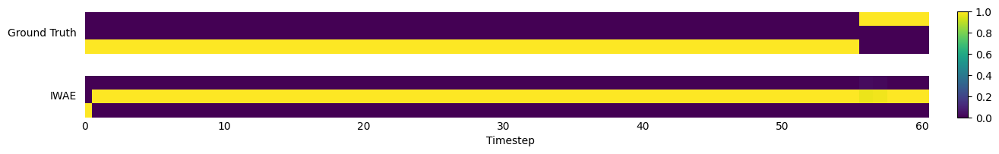

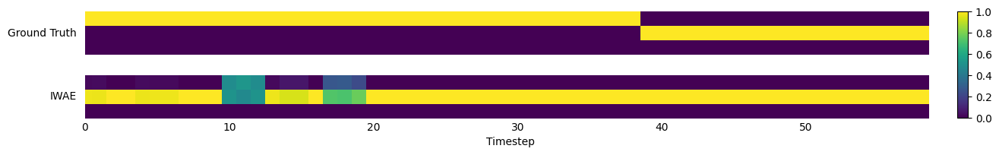

F1:0.25
CE:11.16
Epoch: [7150]	Time 0.100	ELBO -574.5770	 MSM: 151.4271
Epoch: [7200]	Time 0.111	ELBO -602.0333	 MSM: 154.3645
MSE: 0.00074
Pred MSE: 0.81382


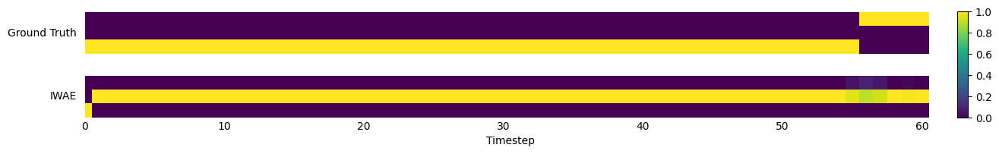

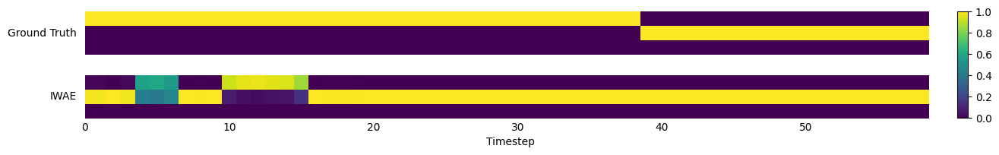

F1:0.25
CE:11.36
Epoch: [7250]	Time 0.117	ELBO -553.6379	 MSM: 182.0256
Epoch: [7300]	Time 0.115	ELBO -554.5503	 MSM: 181.0861
MSE: 0.00076
Pred MSE: 0.81416


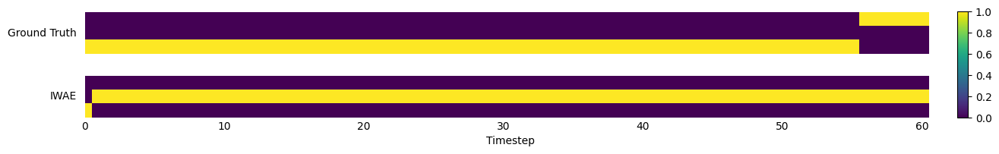

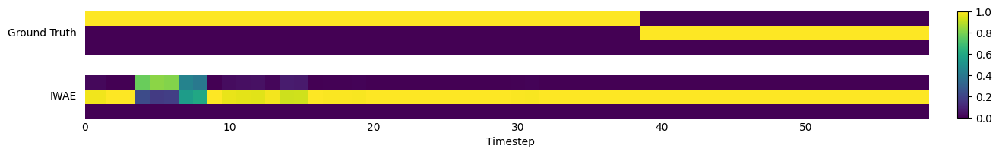

F1:0.25
CE:11.32
Epoch: [7350]	Time 0.130	ELBO -595.2468	 MSM: 154.8276
Epoch: [7400]	Time 0.132	ELBO -598.9808	 MSM: 149.1034
MSE: 0.00074
Pred MSE: 0.80215


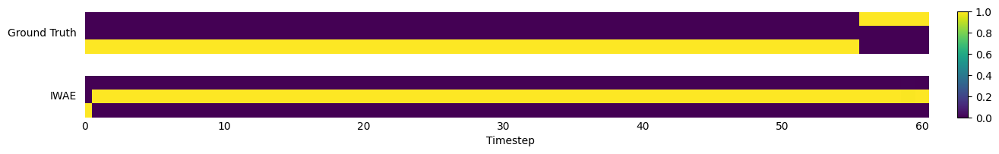

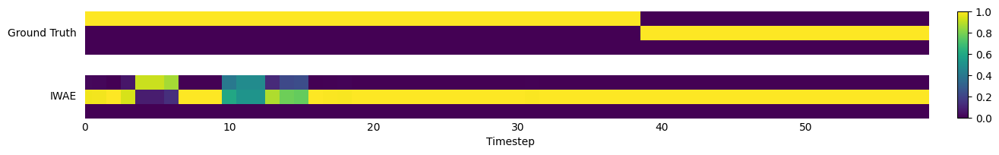

F1:0.25
CE:11.44
Epoch: [7450]	Time 0.099	ELBO -559.2913	 MSM: 158.2967
Epoch: [7500]	Time 0.099	ELBO -572.7275	 MSM: 171.6934
MSE: 0.00073
Pred MSE: 0.80581


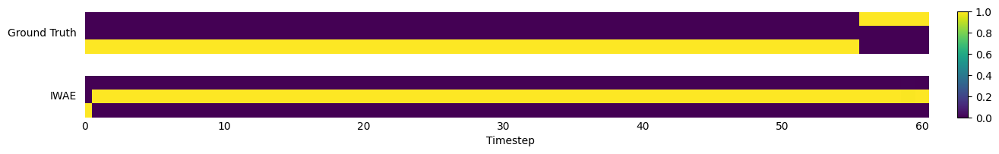

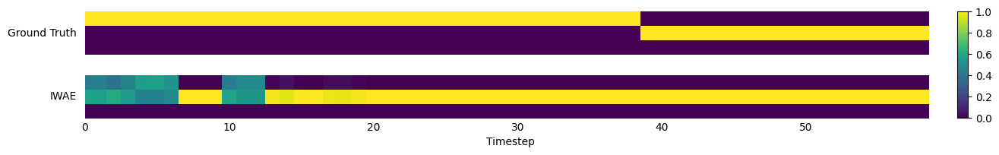

F1:0.25
CE:11.54
Epoch: [7550]	Time 0.100	ELBO -575.8239	 MSM: 163.6808
Epoch: [7600]	Time 0.100	ELBO -567.6984	 MSM: 166.4201
MSE: 0.00080
Pred MSE: 0.79702


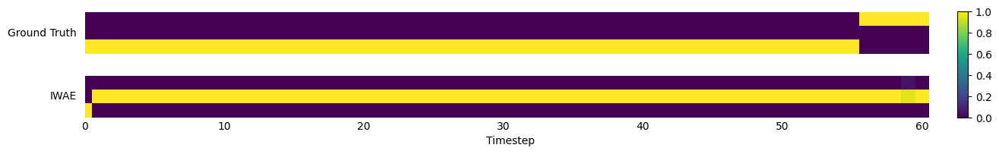

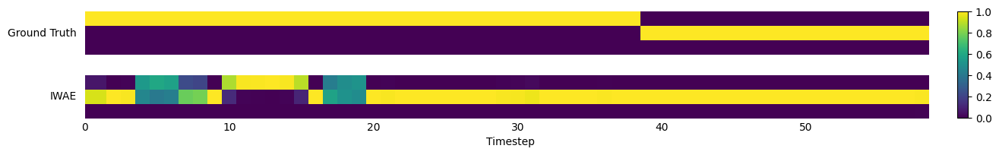

F1:0.26
CE:11.42
Epoch: [7650]	Time 0.118	ELBO -620.3427	 MSM: 137.7976
Epoch: [7700]	Time 0.112	ELBO -587.4667	 MSM: 138.8710
MSE: 0.00072
Pred MSE: 0.80424


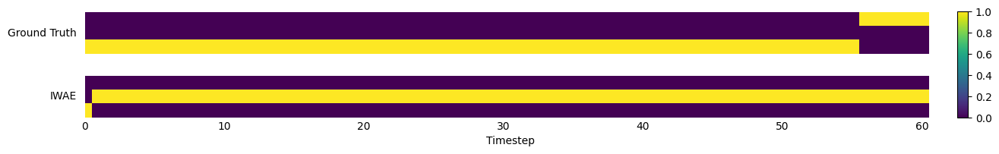

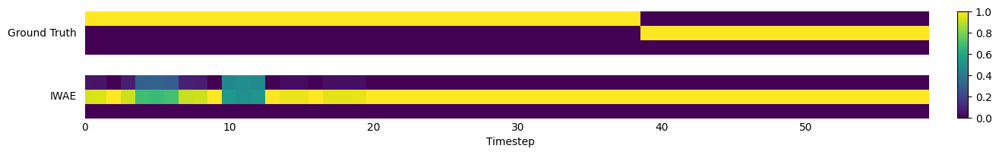

F1:0.24
CE:11.58
Epoch: [7750]	Time 0.110	ELBO -576.4242	 MSM: 135.5384
Epoch: [7800]	Time 0.121	ELBO -555.6101	 MSM: 155.1792
MSE: 0.00074
Pred MSE: 0.79516


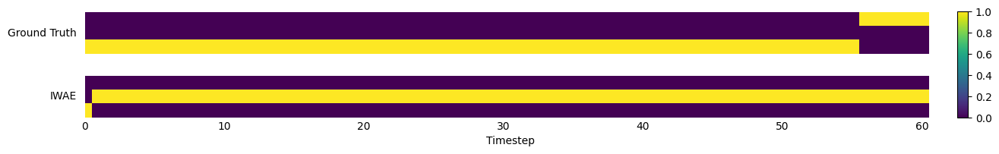

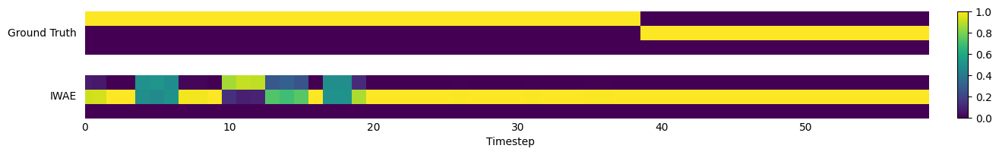

F1:0.24
CE:11.86
Epoch: [7850]	Time 0.098	ELBO -591.0131	 MSM: 144.4971
Epoch: [7900]	Time 0.097	ELBO -577.7767	 MSM: 138.9359
MSE: 0.00072
Pred MSE: 0.79727


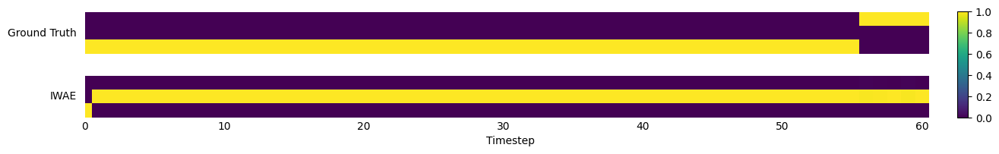

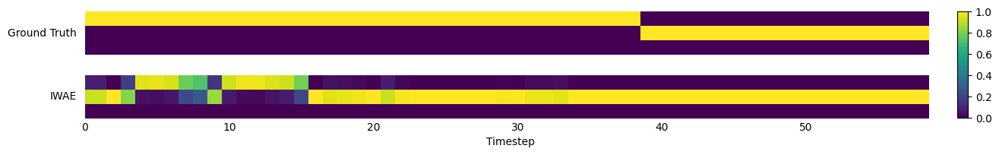

F1:0.26
CE:11.81
Epoch: [7950]	Time 0.098	ELBO -665.5084	 MSM: 152.4883
Epoch: [8000]	Time 0.113	ELBO -550.7232	 MSM: 143.5306
MSE: 0.00070
Pred MSE: 0.79198


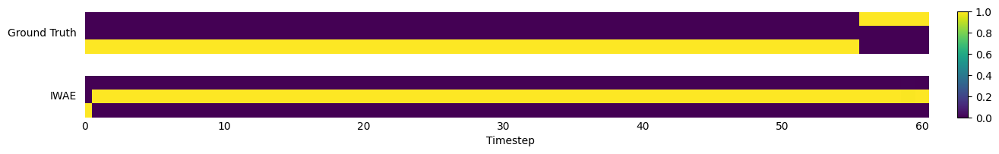

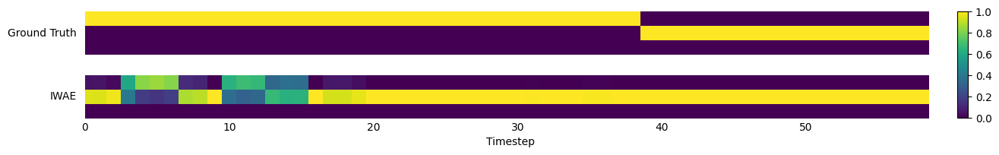

F1:0.25
CE:11.97
Epoch: [8050]	Time 0.125	ELBO -546.7005	 MSM: 175.2558
Epoch: [8100]	Time 0.130	ELBO -569.4803	 MSM: 136.3819
MSE: 0.00071
Pred MSE: 0.80176


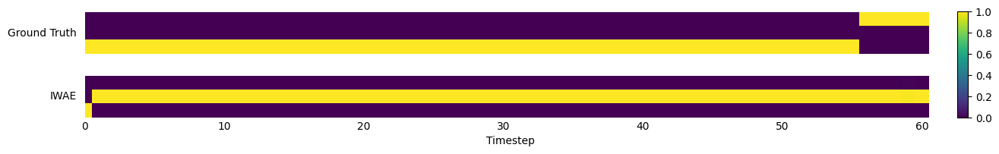

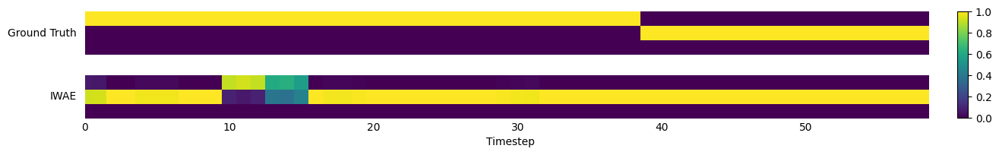

F1:0.25
CE:11.88
Epoch: [8150]	Time 0.117	ELBO -563.3653	 MSM: 151.6209
Epoch: [8200]	Time 0.120	ELBO -603.3922	 MSM: 128.3211
MSE: 0.00074
Pred MSE: 0.80243


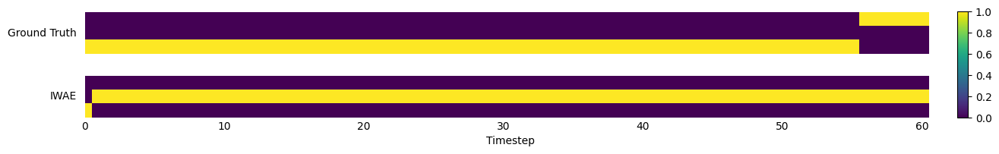

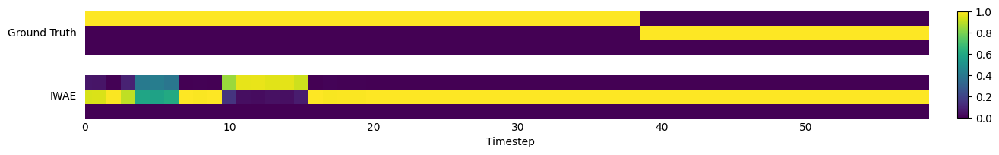

F1:0.25
CE:12.05
Epoch: [8250]	Time 0.106	ELBO -584.0060	 MSM: 137.5194
Epoch: [8300]	Time 0.105	ELBO -554.0508	 MSM: 127.4628
MSE: 0.00073
Pred MSE: 0.79449


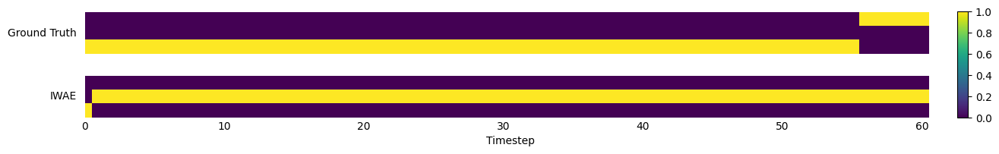

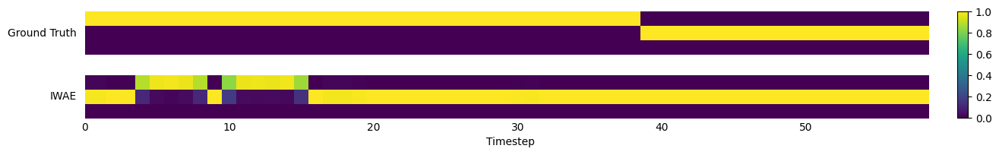

F1:0.25
CE:11.96
Epoch: [8350]	Time 0.121	ELBO -565.8492	 MSM: 122.5692
Epoch: [8400]	Time 0.112	ELBO -557.8771	 MSM: 137.2754
MSE: 0.00074
Pred MSE: 0.80382


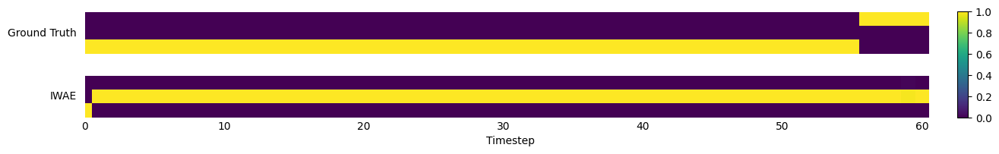

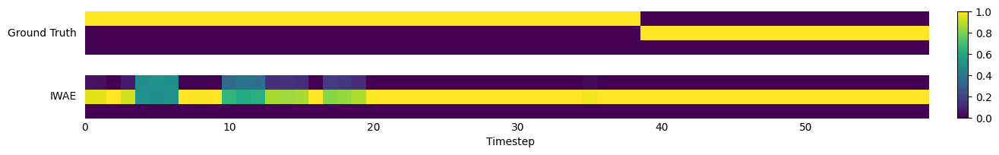

F1:0.25
CE:11.80
Epoch: [8450]	Time 0.121	ELBO -553.4807	 MSM: 142.8702
Epoch: [8500]	Time 0.112	ELBO -566.1130	 MSM: 142.9082
MSE: 0.00074
Pred MSE: 0.78873


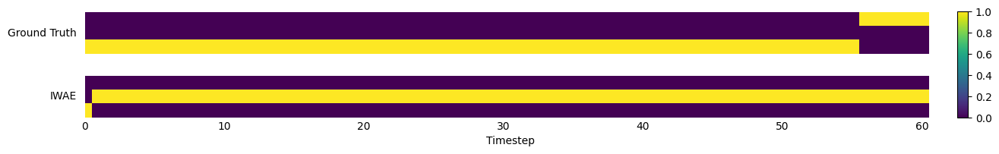

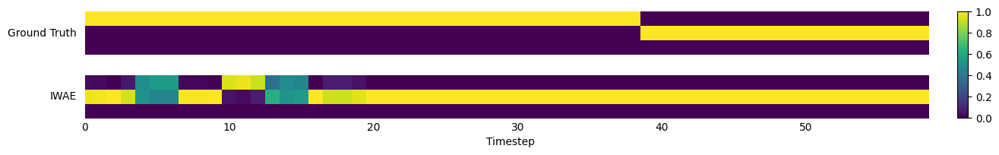

F1:0.25
CE:12.44
Epoch: [8550]	Time 0.118	ELBO -522.5891	 MSM: 152.3693
Epoch: [8600]	Time 0.125	ELBO -573.5909	 MSM: 100.3581
MSE: 0.00073
Pred MSE: 0.79531


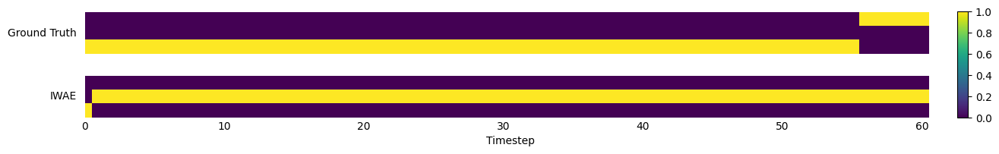

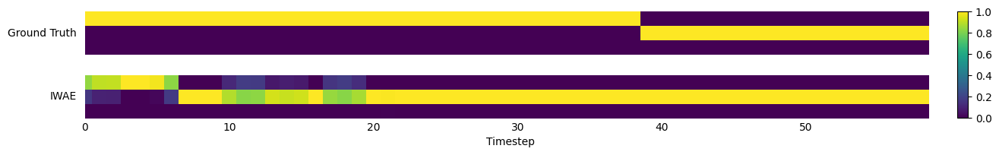

F1:0.25
CE:11.62
Epoch: [8650]	Time 0.117	ELBO -563.7506	 MSM: 127.5779
Epoch: [8700]	Time 0.122	ELBO -554.6235	 MSM: 133.2725
MSE: 0.00070
Pred MSE: 0.80324


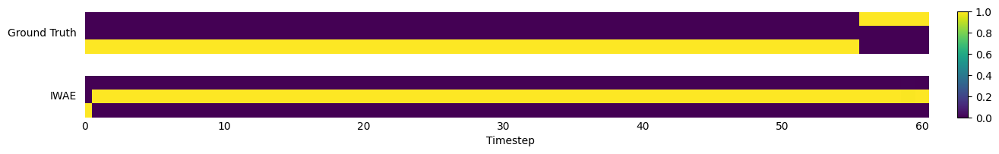

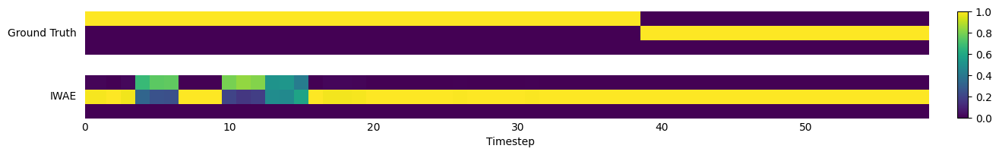

F1:0.26
CE:11.79
Epoch: [8750]	Time 0.115	ELBO -544.7172	 MSM: 128.4619
Epoch: [8800]	Time 0.135	ELBO -537.8340	 MSM: 143.7054
MSE: 0.00072
Pred MSE: 0.80689


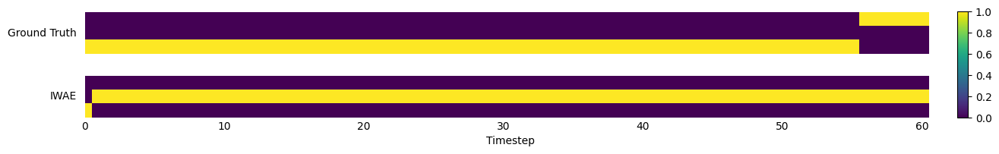

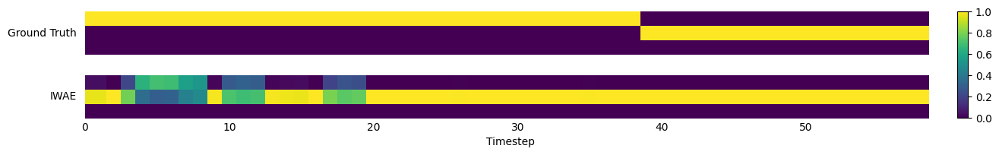

F1:0.25
CE:12.11
Epoch: [8850]	Time 0.127	ELBO -525.2614	 MSM: 144.1044
Epoch: [8900]	Time 0.103	ELBO -601.6389	 MSM: 97.2351
MSE: 0.00070
Pred MSE: 0.79985


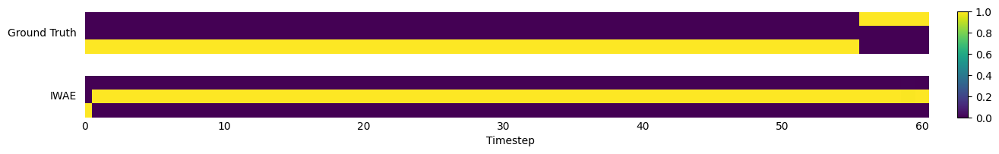

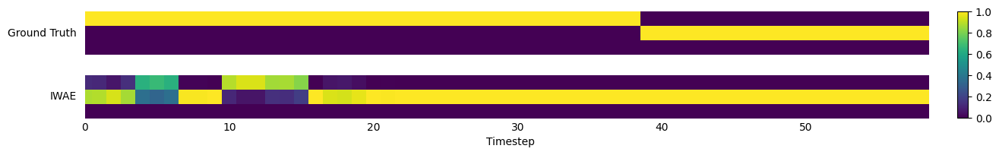

F1:0.25
CE:12.13
Epoch: [8950]	Time 0.125	ELBO -581.8994	 MSM: 118.7913
Epoch: [9000]	Time 0.117	ELBO -578.1310	 MSM: 112.5643
MSE: 0.00070
Pred MSE: 0.79605


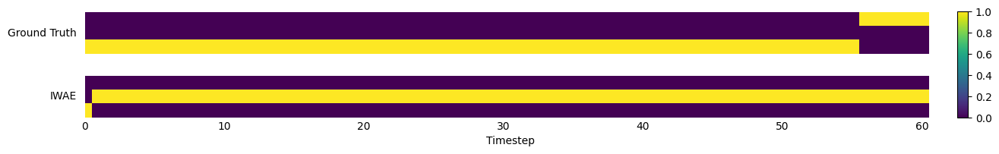

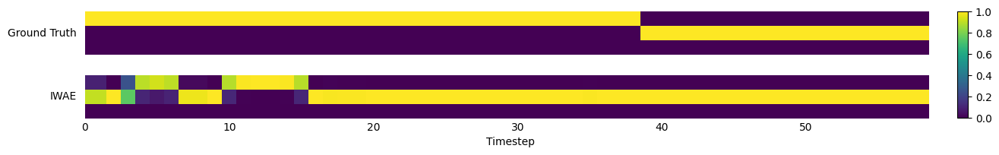

F1:0.25
CE:11.94
Epoch: [9050]	Time 0.122	ELBO -592.4943	 MSM: 123.2986
Epoch: [9100]	Time 0.102	ELBO -524.5287	 MSM: 132.6158
MSE: 0.00074
Pred MSE: 0.80799


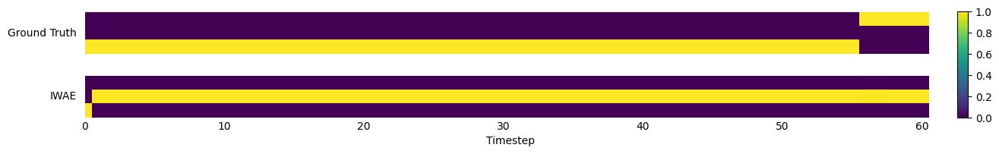

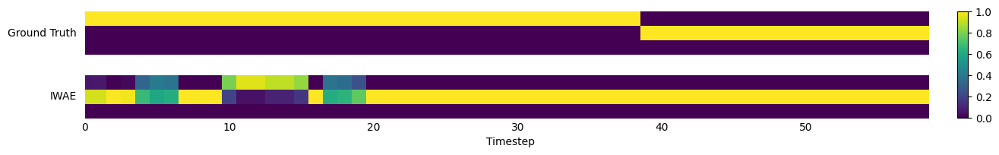

F1:0.25
CE:12.02
Epoch: [9150]	Time 0.123	ELBO -553.2201	 MSM: 111.5414
Epoch: [9200]	Time 0.113	ELBO -565.9224	 MSM: 101.5787
MSE: 0.00068
Pred MSE: 0.79166


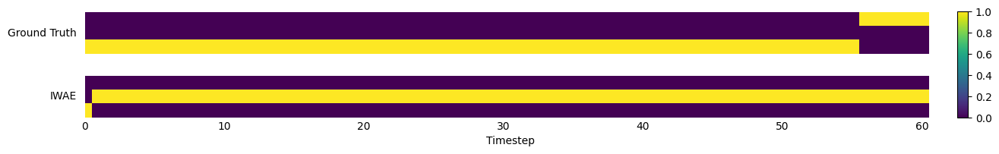

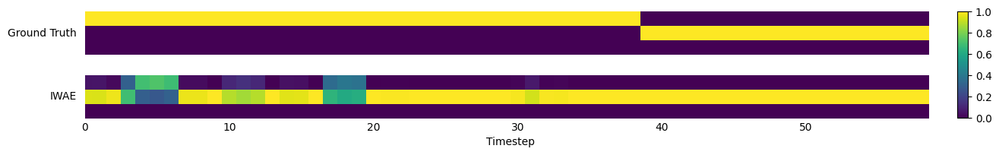

F1:0.25
CE:12.13
Epoch: [9250]	Time 0.140	ELBO -529.9848	 MSM: 127.8553
Epoch: [9300]	Time 0.136	ELBO -575.5408	 MSM: 125.4966
MSE: 0.00076
Pred MSE: 0.79494


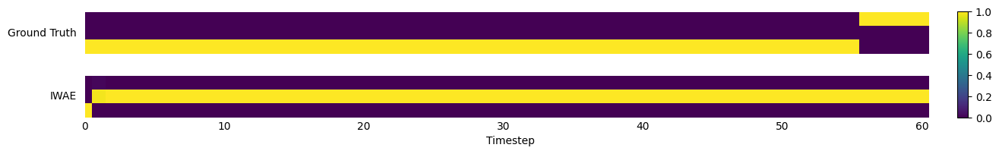

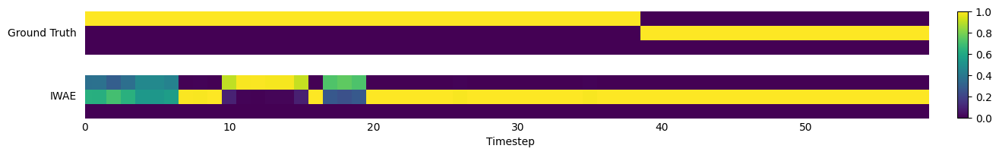

F1:0.25
CE:12.18
Epoch: [9350]	Time 0.123	ELBO -607.2056	 MSM: 107.9188
Epoch: [9400]	Time 0.128	ELBO -545.3076	 MSM: 100.9857
MSE: 0.00071
Pred MSE: 0.80381


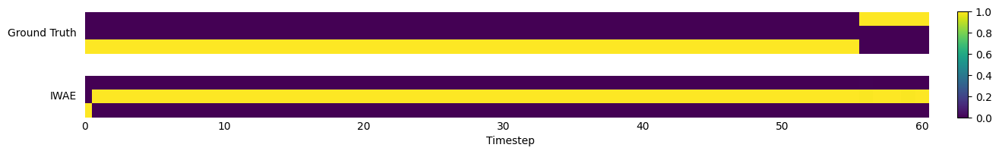

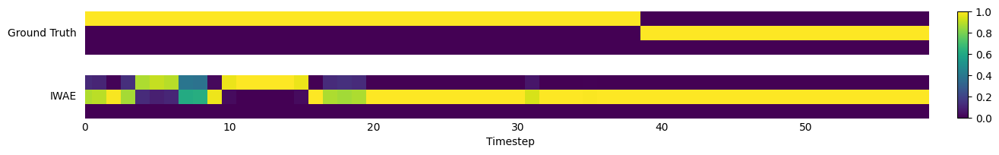

F1:0.25
CE:12.19
Epoch: [9450]	Time 0.125	ELBO -548.1091	 MSM: 108.0736
Epoch: [9500]	Time 0.119	ELBO -554.5526	 MSM: 100.5179
MSE: 0.00072
Pred MSE: 0.80228


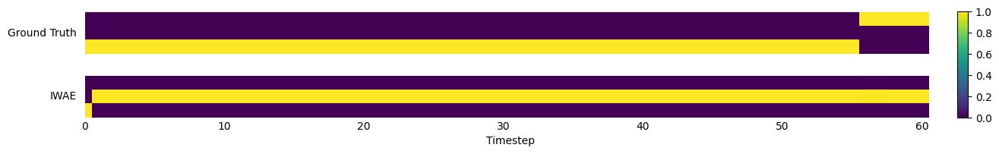

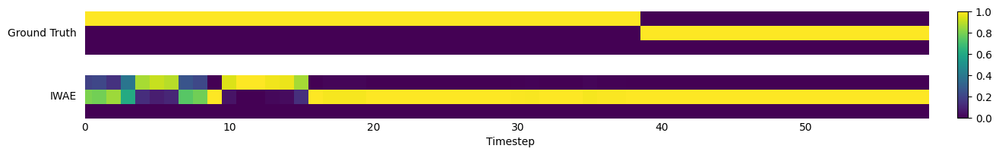

F1:0.25
CE:12.66
Epoch: [9550]	Time 0.119	ELBO -534.2232	 MSM: 118.4919
Epoch: [9600]	Time 0.130	ELBO -576.5384	 MSM: 97.5690
MSE: 0.00068
Pred MSE: 0.79892


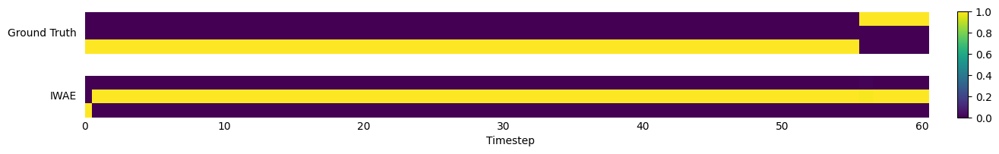

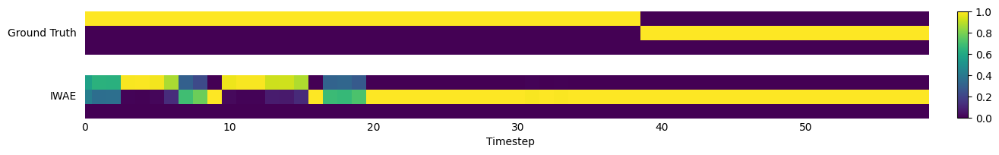

F1:0.26
CE:12.10
Epoch: [9650]	Time 0.126	ELBO -569.9695	 MSM: 100.4048
Epoch: [9700]	Time 0.132	ELBO -524.8730	 MSM: 116.1507
MSE: 0.00071
Pred MSE: 0.81172


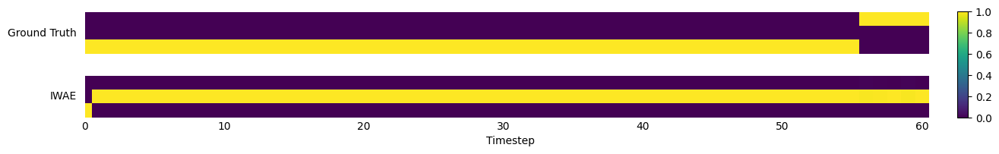

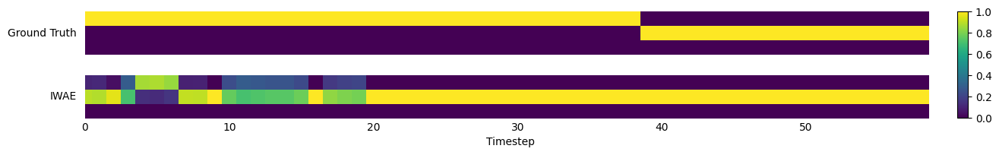

F1:0.25
CE:12.23
Epoch: [9750]	Time 0.126	ELBO -610.3807	 MSM: 78.9461
Epoch: [9800]	Time 0.132	ELBO -523.9165	 MSM: 107.9867
MSE: 0.00070
Pred MSE: 0.80432


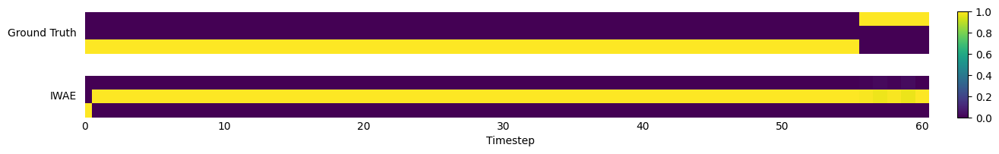

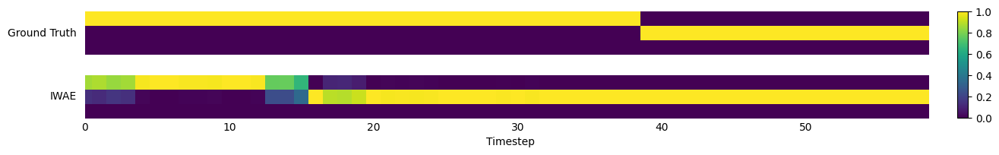

F1:0.26
CE:12.36
Epoch: [9850]	Time 0.130	ELBO -531.7783	 MSM: 94.9224
Epoch: [9900]	Time 0.126	ELBO -532.1914	 MSM: 111.5541
MSE: 0.00070
Pred MSE: 0.80958


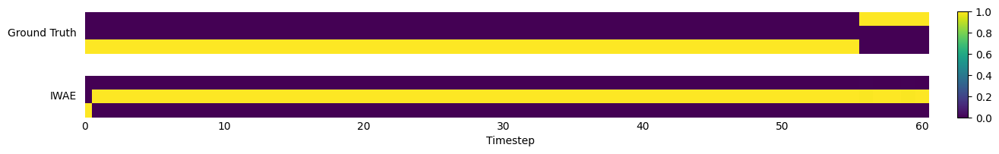

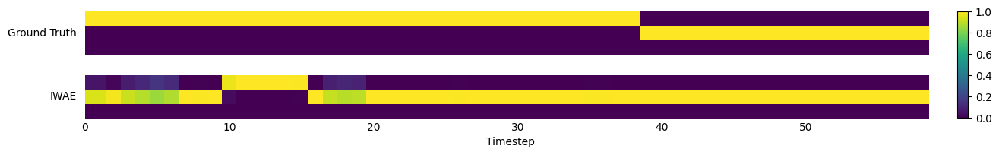

F1:0.26
CE:12.68
Epoch: [9950]	Time 0.116	ELBO -542.1212	 MSM: 101.5169


In [15]:
elbo_losses, test_mse, pred_mse_elbo = train(model, optimizer, num_states, dim_latent, T)

In [92]:
PATH = 'snlds_bee_elbo.pth'
torch.save(model.state_dict(), PATH)
# model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()
# model.load_state_dict(torch.load(PATH))

Text(0, 0.5, 'Training Loss')

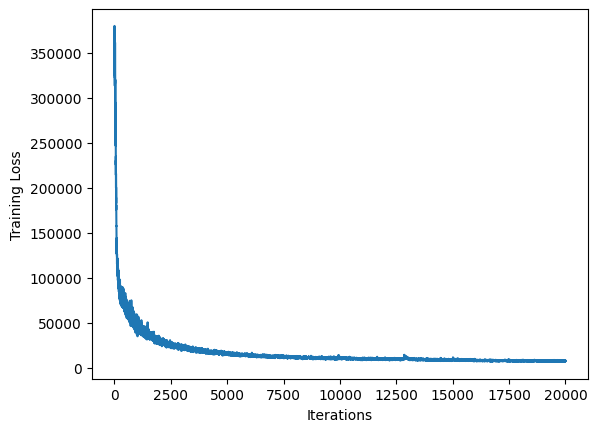

In [94]:
plt.plot(elbo_losses)
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'Training Loss')

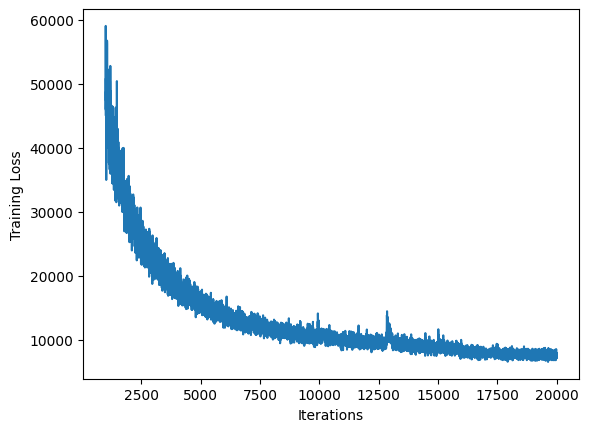

In [95]:
plt.plot(np.arange(1000,len(elbo_losses)),elbo_losses[1000:])
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'MSE')

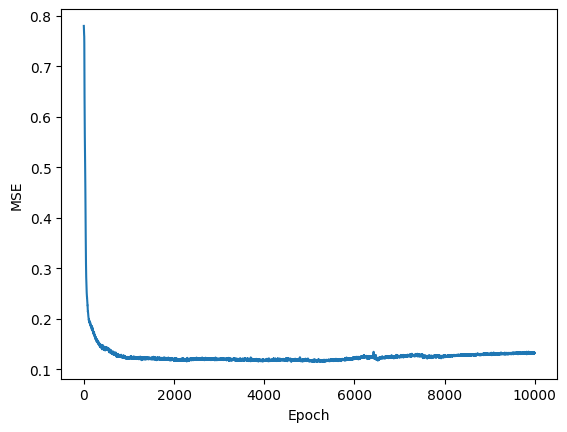

In [96]:
plt.plot(test_mse)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

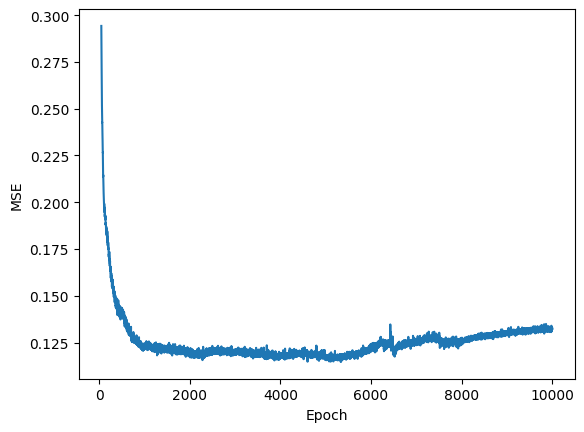

In [97]:
plt.plot(np.arange(50,len(test_mse)),test_mse[50:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

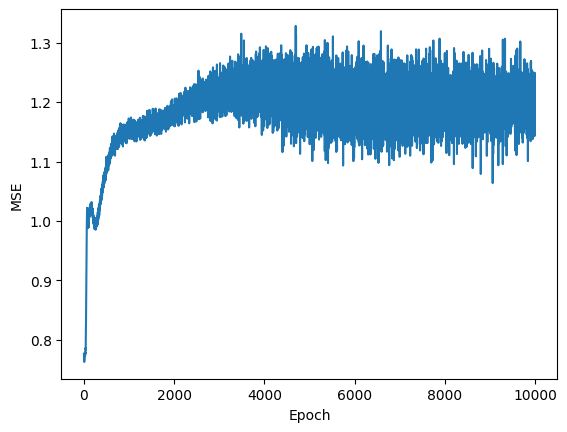

In [98]:
plt.plot(pred_mse_elbo)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

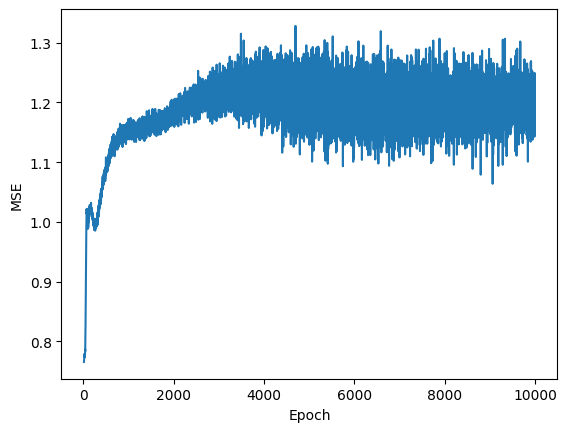

In [99]:
plt.plot(np.arange(10,len(pred_mse_elbo)),pred_mse_elbo[10:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

In [100]:
# Training time: 26.5min
print(f"Last ELBO Loss: {elbo_losses[-1]:.1f}")
print(f"Last Test MSE: {test_mse[-1]:.6f}")
print(f"Last Pred MSE: {pred_mse_elbo[-1]:.6f}")

Last ELBO Loss: 7844.0
Last Test MSE: 0.132416
Last Pred MSE: 1.171154


In [101]:
print(f"Best ELBO Loss: {min(elbo_losses):.1f}")
print(f"Best Test MSE: {min(test_mse):.6f}")
print(f"Best Pred MSE: {min(pred_mse_elbo):.6f}")

Best ELBO Loss: 6511.9
Best Test MSE: 0.114623
Best Pred MSE: 0.763099


In [107]:
# Reconstructions

t = 120
model.eval()

with torch.inference_mode():
    (x,_) = next(iter(test_dataloader))
    x = x.to(device).float()
    recon_x,_,_,_ = model(x)
    x = x.cpu().numpy()
    recon_x = recon_x.cpu().numpy()

# Final MSE per timestep
mse_T = np.mean(((x - recon_x) ** 2),axis=(0,2))
for i,element in enumerate(mse_T):
    print(f"t={i} MSE per pixel:{element:.6f}")

t=0 MSE per pixel:0.240082
t=1 MSE per pixel:0.372495
t=2 MSE per pixel:0.230333
t=3 MSE per pixel:0.173039
t=4 MSE per pixel:0.169125
t=5 MSE per pixel:0.150576
t=6 MSE per pixel:0.131579
t=7 MSE per pixel:0.129189
t=8 MSE per pixel:0.075225
t=9 MSE per pixel:0.141379
t=10 MSE per pixel:0.082471
t=11 MSE per pixel:0.083961
t=12 MSE per pixel:0.071756
t=13 MSE per pixel:0.043408
t=14 MSE per pixel:0.086824
t=15 MSE per pixel:0.060490
t=16 MSE per pixel:0.102378
t=17 MSE per pixel:0.119418
t=18 MSE per pixel:0.130060
t=19 MSE per pixel:0.095421
t=20 MSE per pixel:0.103918
t=21 MSE per pixel:0.108177
t=22 MSE per pixel:0.098910
t=23 MSE per pixel:0.121918
t=24 MSE per pixel:0.138232
t=25 MSE per pixel:0.181552
t=26 MSE per pixel:0.127530
t=27 MSE per pixel:0.161059
t=28 MSE per pixel:0.146529
t=29 MSE per pixel:0.076492
t=30 MSE per pixel:0.096833
t=31 MSE per pixel:0.095503
t=32 MSE per pixel:0.150421
t=33 MSE per pixel:0.112537
t=34 MSE per pixel:0.120382
t=35 MSE per pixel:0.087926
t=

In [108]:
mse_T

array([0.24008238, 0.3724952 , 0.23033251, 0.17303906, 0.16912477,
       0.1505758 , 0.13157919, 0.12918946, 0.0752252 , 0.14137924,
       0.08247107, 0.08396062, 0.07175639, 0.04340751, 0.0868245 ,
       0.06048985, 0.10237768, 0.1194183 , 0.13005951, 0.09542111,
       0.10391805, 0.10817653, 0.09891014, 0.12191781, 0.13823181,
       0.18155193, 0.12752974, 0.16105852, 0.14652854, 0.07649188,
       0.09683271, 0.09550343, 0.15042116, 0.11253682, 0.12038175,
       0.08792586, 0.10766619, 0.13257991, 0.13748471, 0.13876589,
       0.11911622, 0.10545236, 0.17786849, 0.11853959, 0.16780534,
       0.15781362, 0.11400056, 0.16469295, 0.11462131, 0.14357248,
       0.1110217 , 0.09615768, 0.101413  , 0.14270799, 0.08453775,
       0.13667247, 0.12873542, 0.100165  , 0.12170297, 0.12169899,
       0.24681534, 0.14807919, 0.12578027, 0.15848058, 0.11085188,
       0.08842991, 0.10565483, 0.11237339, 0.15104485, 0.10838989,
       0.1996887 , 0.13213919, 0.14538255, 0.1355581 , 0.13647

Text(0, 0.5, 'MSE per Pixel')

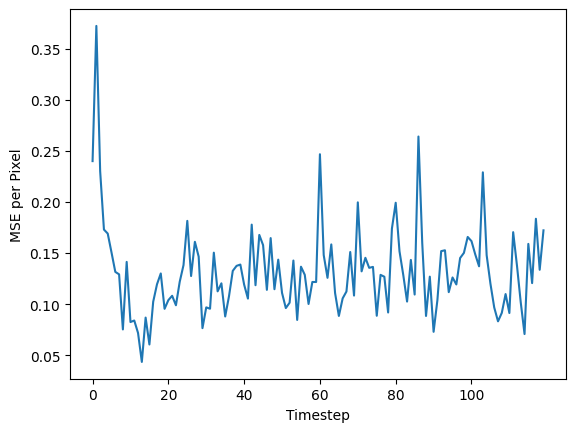

In [109]:
plt.plot(mse_T)
plt.xlabel('Timestep')
plt.xticks(np.arange(0,t,20))
plt.ylabel('MSE per Pixel')

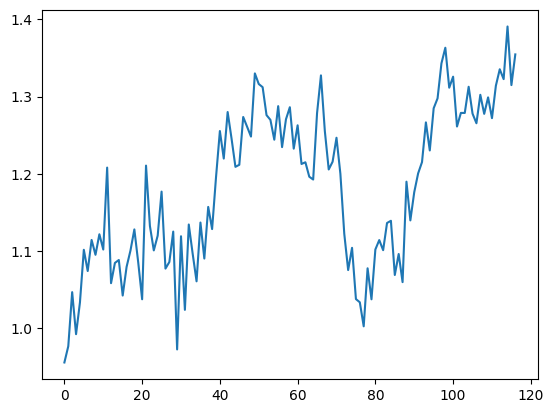

In [111]:
# Take first 3 timesteps. Generate the rest of the sequence. Calculate MSE

with torch.inference_mode():
    predict_mse = []
    for (sample,_) in test_dataloader:
        mse_values = []
        obs_var = sample.float().to(device)
        preds = model.predict_sequence(obs_var[:,:3], seq_len=117)
        obs_var, preds = obs_var.cpu().numpy(), preds.cpu().numpy()
        mse = np.mean(((preds - obs_var[:,3:]) ** 2),axis=(0,2))
        mse_values.append(mse)
    mse_val = sum(mse_values) / len(mse_values)
    predict_mse.append(mse_val.tolist())

plt.plot(predict_mse[0])

In [112]:
predict_mse[0]

[0.9554226398468018,
 0.9764499664306641,
 1.0465373992919922,
 0.9920780658721924,
 1.033140778541565,
 1.101401686668396,
 1.0739129781723022,
 1.1141804456710815,
 1.0949238538742065,
 1.121529221534729,
 1.1017721891403198,
 1.207905888557434,
 1.0581547021865845,
 1.0844162702560425,
 1.088180422782898,
 1.04214346408844,
 1.0792627334594727,
 1.1004823446273804,
 1.127807378768921,
 1.084713339805603,
 1.0373032093048096,
 1.2104876041412354,
 1.1322884559631348,
 1.1006081104278564,
 1.1197279691696167,
 1.1767919063568115,
 1.077043056488037,
 1.0855928659439087,
 1.1250044107437134,
 0.9723169207572937,
 1.1189565658569336,
 1.0235974788665771,
 1.1341818571090698,
 1.0963116884231567,
 1.0605589151382446,
 1.1367170810699463,
 1.090065836906433,
 1.1569477319717407,
 1.1282477378845215,
 1.1950215101242065,
 1.255265235900879,
 1.2195924520492554,
 1.2798951864242554,
 1.2455631494522095,
 1.2088860273361206,
 1.2115458250045776,
 1.2734850645065308,
 1.2608743906021118,
 1.2

# IWAE

In [16]:
epoch_num = 10000
scheduler_epochs = 10000
T = 120
N = 20
learning_rate = 5e-4
dim_obs = 4
dim_latent = 2 
num_states = 3
model = VariationalSNLDS(dim_obs, dim_latent, 64, num_states, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Epoch: [0][2/2]	Time 0.190	Loss 349973.5625	 
MSE: 0.77108
Pred MSE: 0.77167


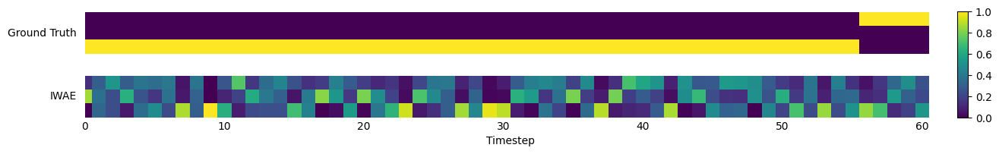

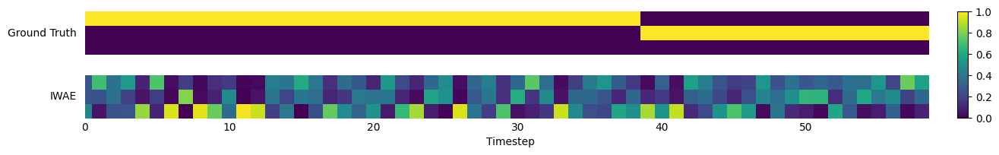

F1:0.34
CE:1.47
Epoch: [50][2/2]	Time 0.162	Loss 208357.3281	 
Epoch: [100][2/2]	Time 0.159	Loss 95985.4531	 
MSE: 0.25100
Pred MSE: 0.90537


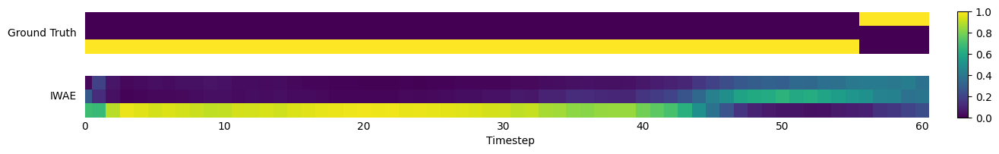

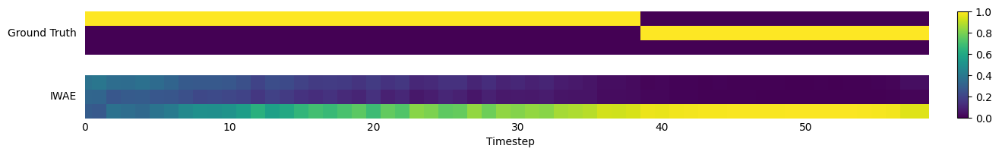

F1:0.41
CE:1.36
Epoch: [150][2/2]	Time 0.155	Loss 90101.1953	 
Epoch: [200][2/2]	Time 0.157	Loss 81266.3828	 
MSE: 0.21201
Pred MSE: 1.03591


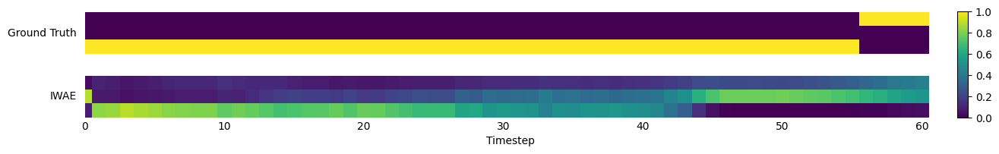

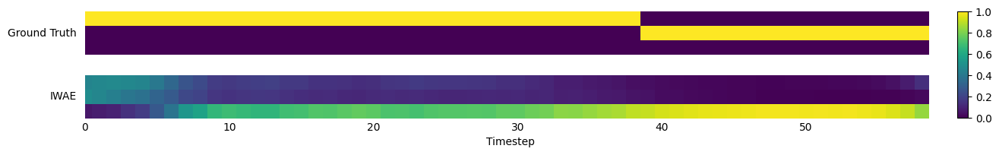

F1:0.42
CE:1.20
Epoch: [250][2/2]	Time 0.162	Loss 69567.4062	 
Epoch: [300][2/2]	Time 0.162	Loss 53883.8086	 
MSE: 0.21305
Pred MSE: 1.06371


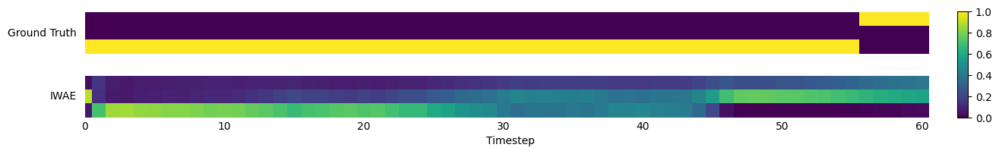

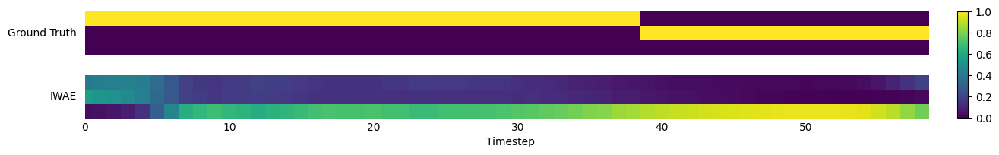

F1:0.41
CE:1.19
Epoch: [350][2/2]	Time 0.165	Loss 61117.7734	 
Epoch: [400][2/2]	Time 0.167	Loss 62451.3203	 
MSE: 0.20682
Pred MSE: 1.07582


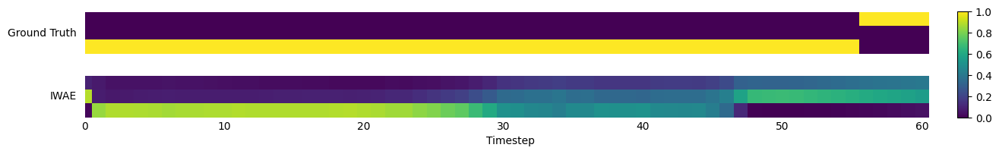

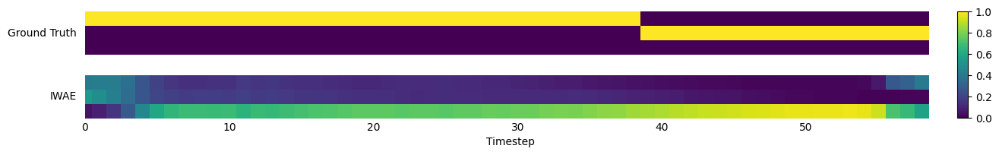

F1:0.40
CE:1.26
Epoch: [450][2/2]	Time 0.147	Loss 49561.7734	 
Epoch: [500][2/2]	Time 0.148	Loss 49270.5547	 
MSE: 0.19542
Pred MSE: 1.06329


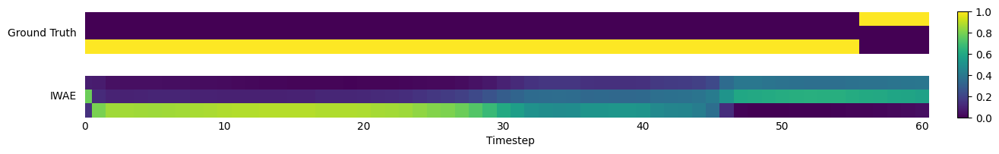

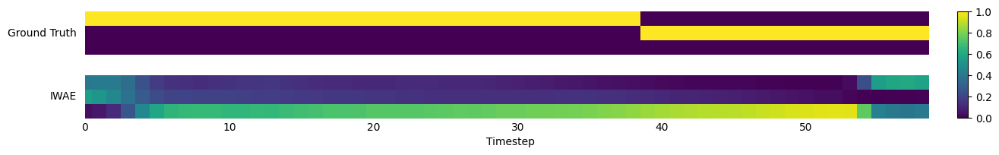

F1:0.43
CE:1.34
Epoch: [550][2/2]	Time 0.163	Loss 40201.8398	 
Epoch: [600][2/2]	Time 0.165	Loss 47007.1328	 
MSE: 0.19141
Pred MSE: 1.08699


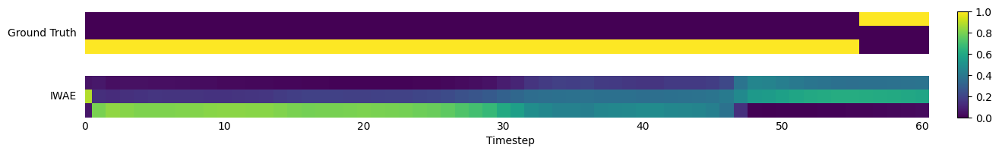

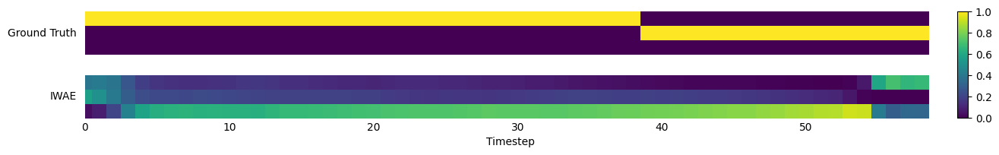

F1:0.44
CE:1.34
Epoch: [650][2/2]	Time 0.162	Loss 46900.8125	 
Epoch: [700][2/2]	Time 0.167	Loss 38712.6953	 
MSE: 0.19359
Pred MSE: 1.07227


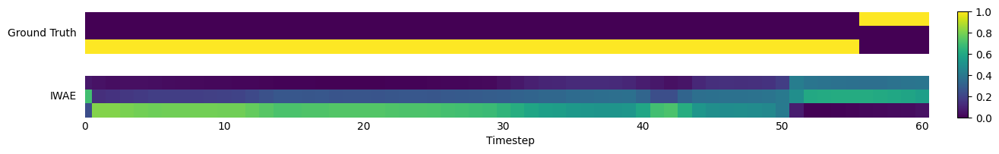

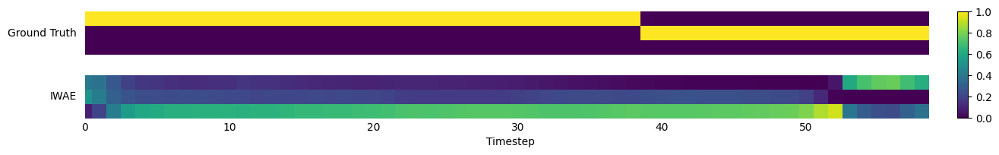

F1:0.47
CE:1.40
Epoch: [750][2/2]	Time 0.164	Loss 38171.9141	 
Epoch: [800][2/2]	Time 0.170	Loss 33056.6680	 
MSE: 0.19423
Pred MSE: 1.07041


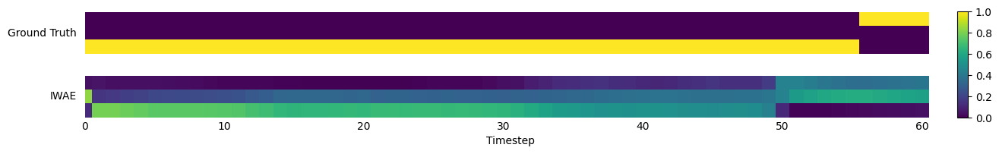

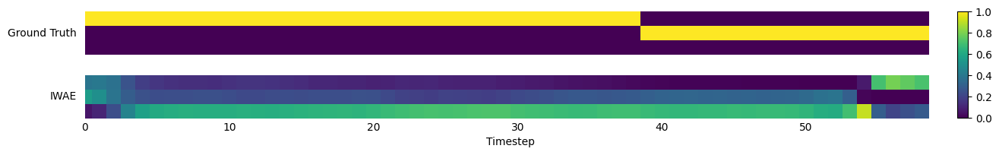

F1:0.47
CE:1.37
Epoch: [850][2/2]	Time 0.146	Loss 33764.1016	 
Epoch: [900][2/2]	Time 0.148	Loss 38487.7227	 
MSE: 0.18482
Pred MSE: 1.06659


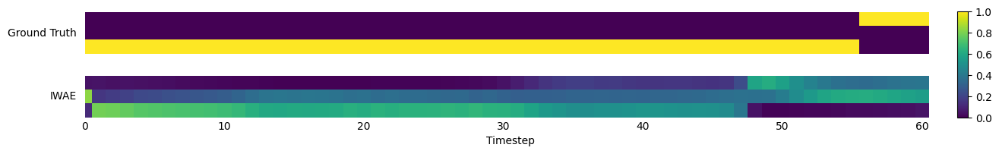

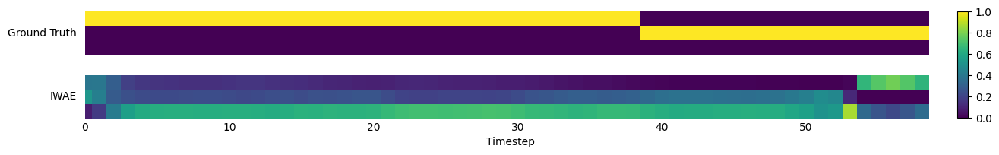

F1:0.46
CE:1.37
Epoch: [950][2/2]	Time 0.151	Loss 33286.0859	 
Epoch: [1000][2/2]	Time 0.171	Loss 29799.0020	 
MSE: 0.18422
Pred MSE: 1.07801


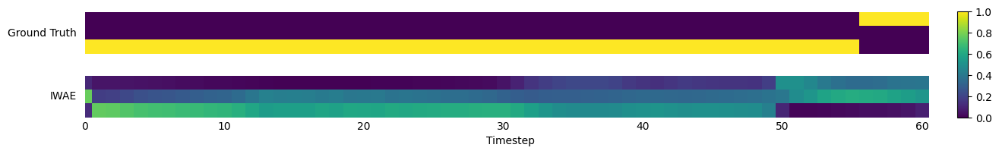

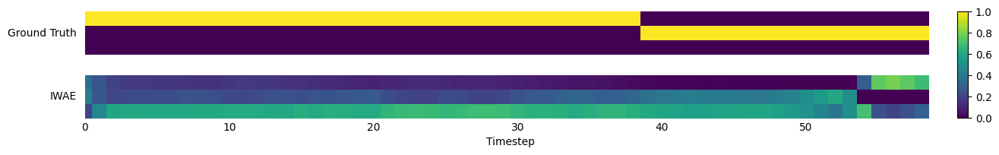

F1:0.46
CE:1.36
Epoch: [1050][2/2]	Time 0.166	Loss 30174.4180	 
Epoch: [1100][2/2]	Time 0.154	Loss 32481.2207	 
MSE: 0.18462
Pred MSE: 1.08832


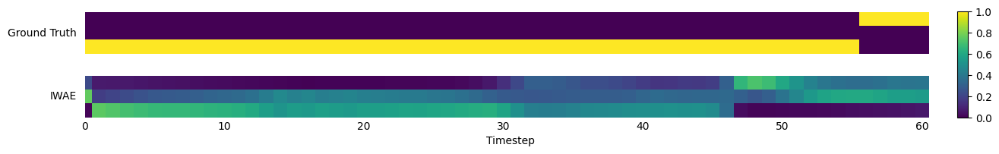

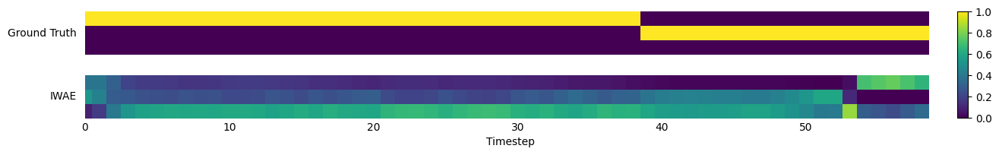

F1:0.46
CE:1.31
Epoch: [1150][2/2]	Time 0.151	Loss 31844.1211	 
Epoch: [1200][2/2]	Time 0.169	Loss 32544.4160	 
MSE: 0.17641
Pred MSE: 1.09591


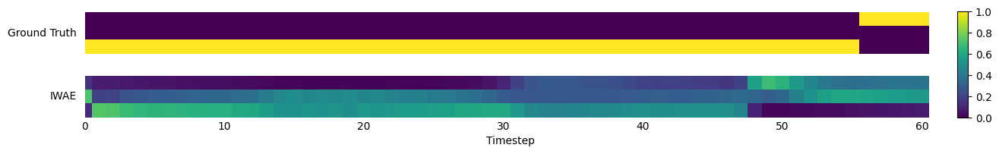

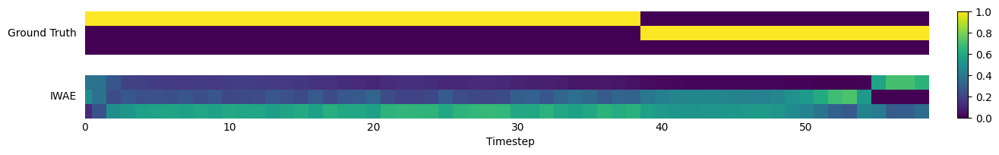

F1:0.45
CE:1.30
Epoch: [1250][2/2]	Time 0.168	Loss 26531.2090	 
Epoch: [1300][2/2]	Time 0.146	Loss 32168.6035	 
MSE: 0.16865
Pred MSE: 1.10598


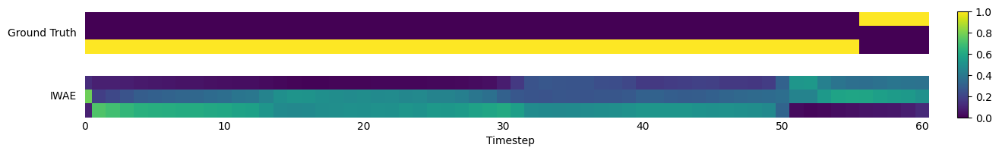

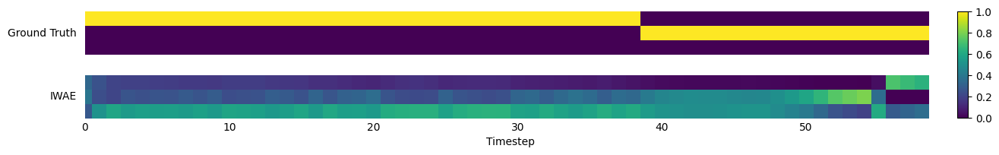

F1:0.44
CE:1.28
Epoch: [1350][2/2]	Time 0.168	Loss 32634.2344	 
Epoch: [1400][2/2]	Time 0.168	Loss 24179.6816	 
MSE: 0.17263
Pred MSE: 1.10570


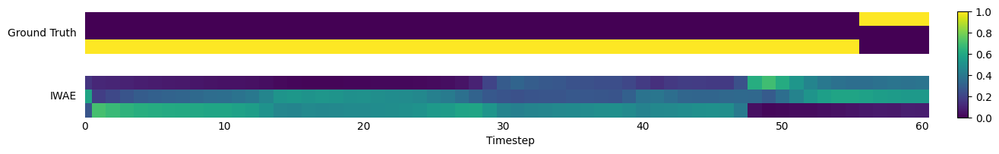

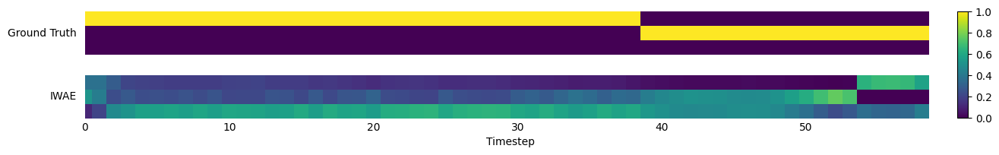

F1:0.45
CE:1.23
Epoch: [1450][2/2]	Time 0.171	Loss 29342.6309	 
Epoch: [1500][2/2]	Time 0.166	Loss 25669.1270	 
MSE: 0.17088
Pred MSE: 1.10730


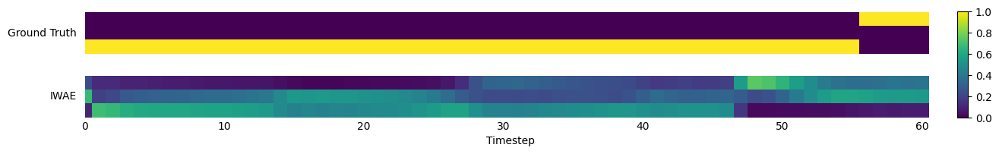

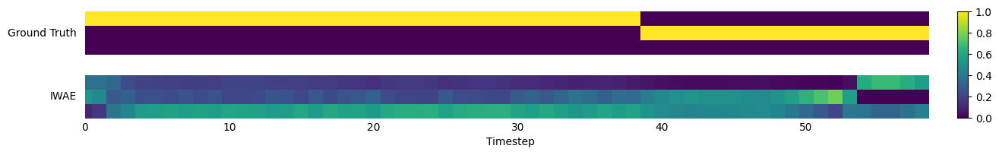

F1:0.45
CE:1.19
Epoch: [1550][2/2]	Time 0.168	Loss 32672.1094	 
Epoch: [1600][2/2]	Time 0.169	Loss 21663.3457	 
MSE: 0.17875
Pred MSE: 1.11986


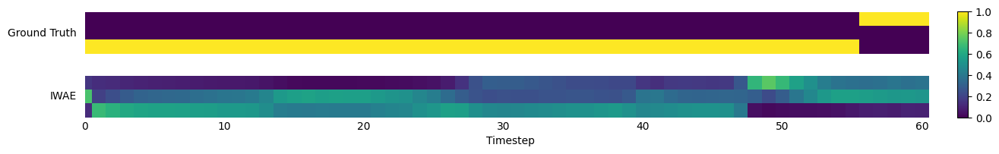

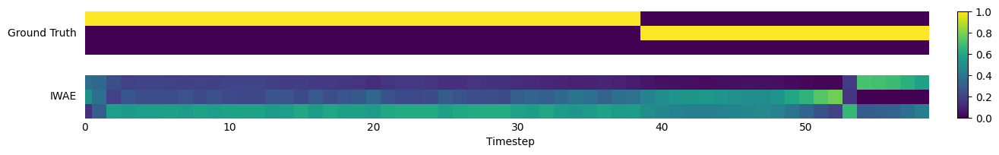

F1:0.43
CE:1.20
Epoch: [1650][2/2]	Time 0.162	Loss 25499.4180	 
Epoch: [1700][2/2]	Time 0.158	Loss 23359.0215	 
MSE: 0.17514
Pred MSE: 1.10657


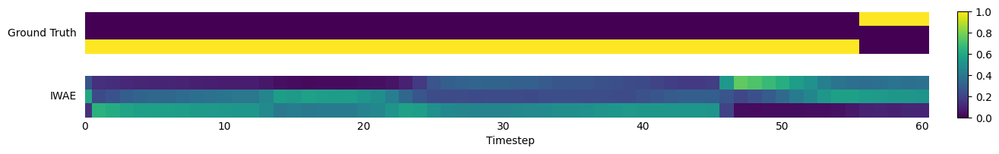

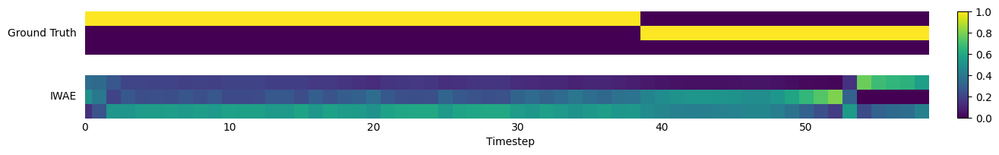

F1:0.45
CE:1.15
Epoch: [1750][2/2]	Time 0.171	Loss 23781.7324	 
Epoch: [1800][2/2]	Time 0.166	Loss 22310.1816	 
MSE: 0.17521
Pred MSE: 1.12457


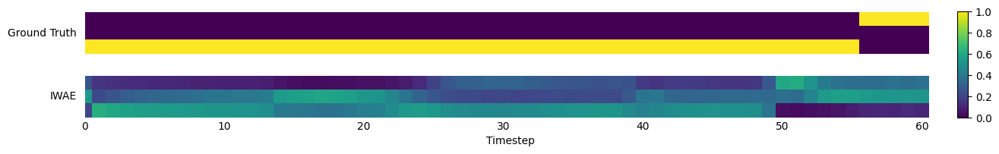

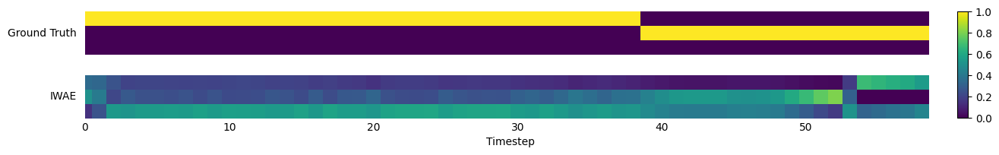

F1:0.45
CE:1.14
Epoch: [1850][2/2]	Time 0.167	Loss 21750.0254	 
Epoch: [1900][2/2]	Time 0.166	Loss 22070.1387	 
MSE: 0.17298
Pred MSE: 1.11747


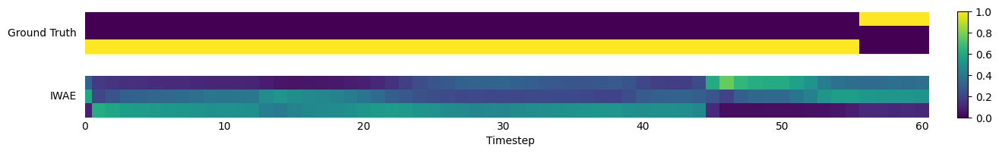

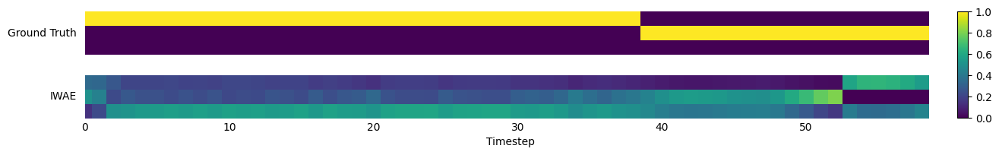

F1:0.44
CE:1.10
Epoch: [1950][2/2]	Time 0.163	Loss 23320.3750	 
Epoch: [2000][2/2]	Time 0.165	Loss 24516.7031	 
MSE: 0.17514
Pred MSE: 1.13833


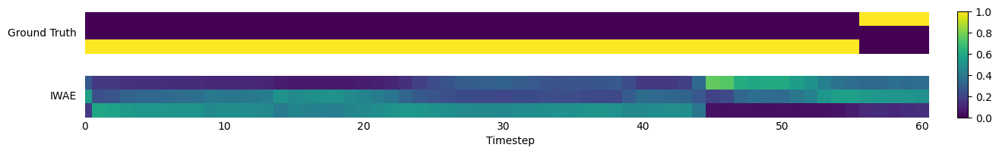

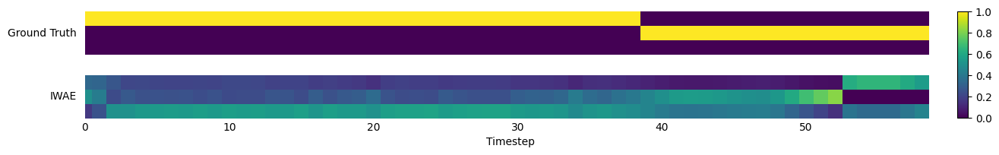

F1:0.45
CE:1.09
Epoch: [2050][2/2]	Time 0.161	Loss 22635.4941	 
Epoch: [2100][2/2]	Time 0.167	Loss 18339.0059	 
MSE: 0.18015
Pred MSE: 1.12145


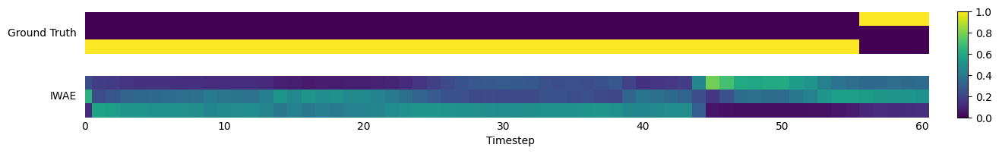

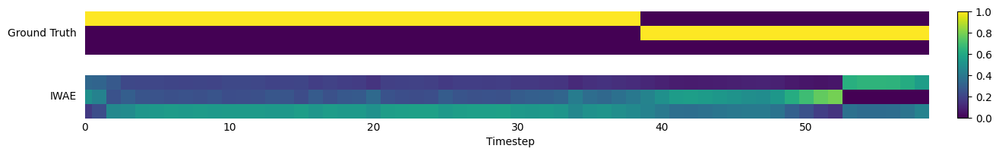

F1:0.45
CE:1.07
Epoch: [2150][2/2]	Time 0.171	Loss 18641.1191	 
Epoch: [2200][2/2]	Time 0.166	Loss 21917.9160	 
MSE: 0.17207
Pred MSE: 1.13005


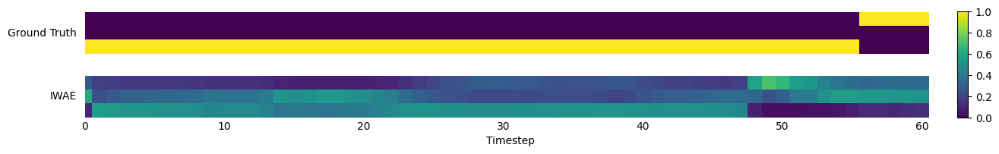

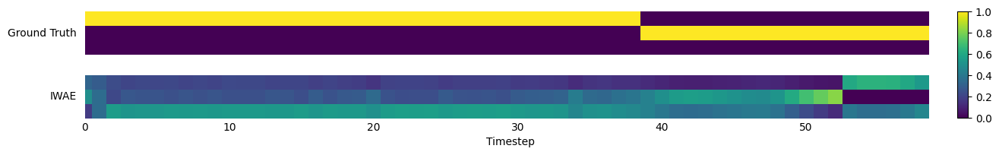

F1:0.45
CE:1.09
Epoch: [2250][2/2]	Time 0.165	Loss 21907.9902	 
Epoch: [2300][2/2]	Time 0.169	Loss 19001.5840	 
MSE: 0.17857
Pred MSE: 1.13002


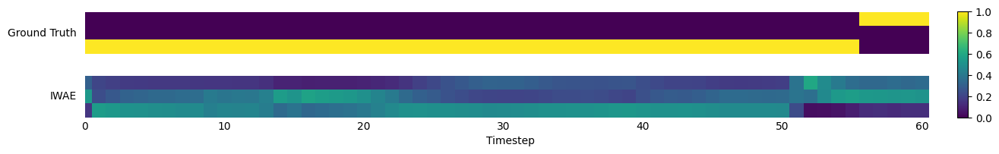

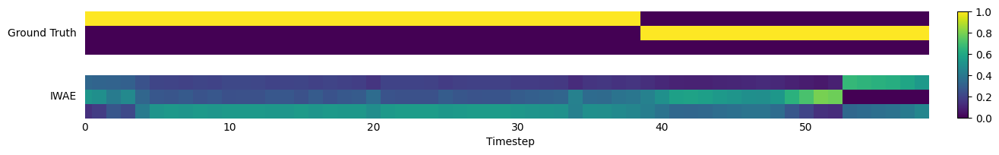

F1:0.47
CE:1.08
Epoch: [2350][2/2]	Time 0.166	Loss 16234.7510	 
Epoch: [2400][2/2]	Time 0.165	Loss 19086.1523	 
MSE: 0.17884
Pred MSE: 1.13709


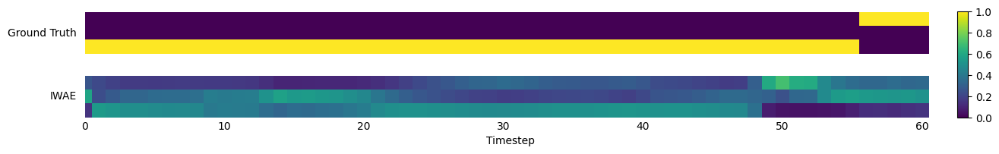

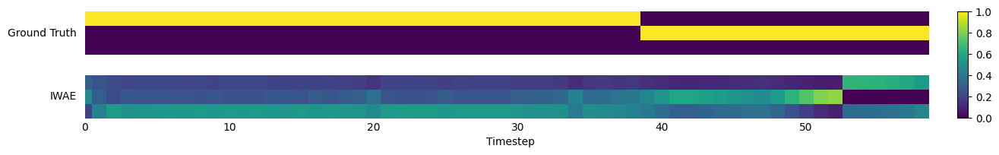

F1:0.46
CE:1.09
Epoch: [2450][2/2]	Time 0.165	Loss 15833.7305	 
Epoch: [2500][2/2]	Time 0.177	Loss 18462.8555	 
MSE: 0.17851
Pred MSE: 1.13502


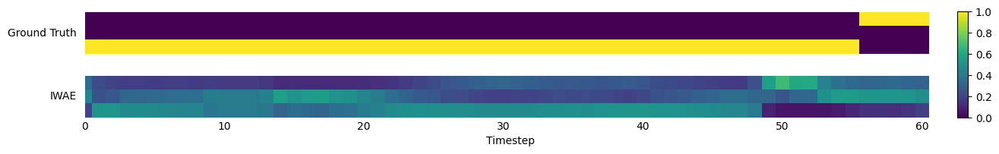

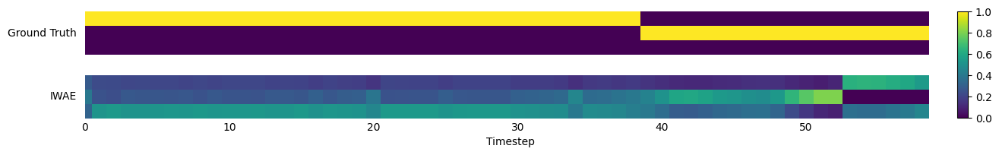

F1:0.47
CE:1.08
Epoch: [2550][2/2]	Time 0.174	Loss 17779.0176	 
Epoch: [2600][2/2]	Time 0.181	Loss 20120.0742	 
MSE: 0.17578
Pred MSE: 1.12331


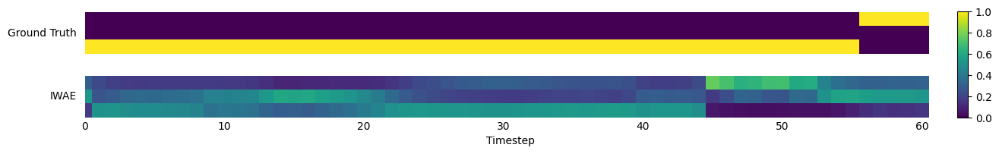

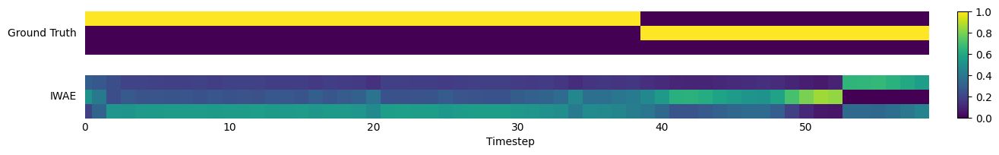

F1:0.46
CE:1.11
Epoch: [2650][2/2]	Time 0.179	Loss 16489.2871	 
Epoch: [2700][2/2]	Time 0.176	Loss 15194.3945	 
MSE: 0.17451
Pred MSE: 1.11565


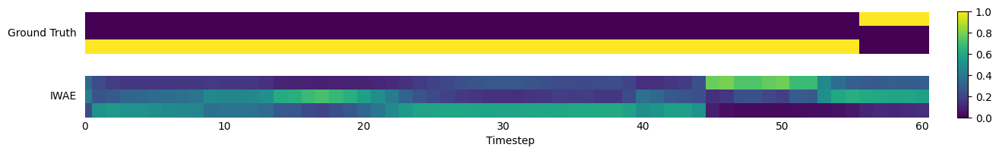

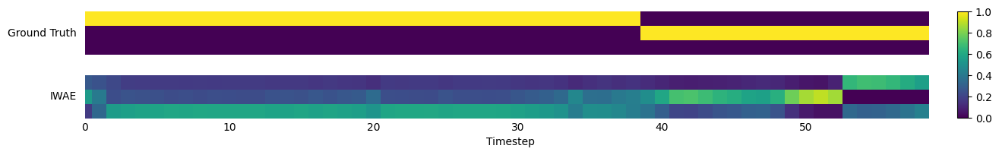

F1:0.46
CE:1.18
Epoch: [2750][2/2]	Time 0.157	Loss 17164.6191	 
Epoch: [2800][2/2]	Time 0.181	Loss 13664.6787	 
MSE: 0.17444
Pred MSE: 1.11355


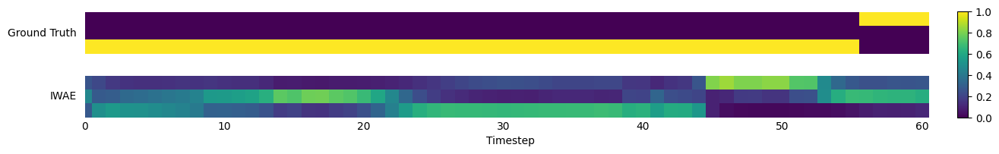

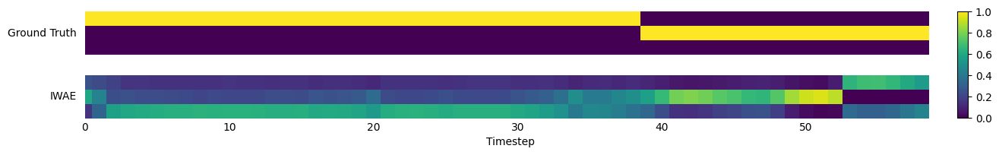

F1:0.46
CE:1.25
Epoch: [2850][2/2]	Time 0.176	Loss 12108.8945	 
Epoch: [2900][2/2]	Time 0.177	Loss 18862.3848	 
MSE: 0.17290
Pred MSE: 1.10672


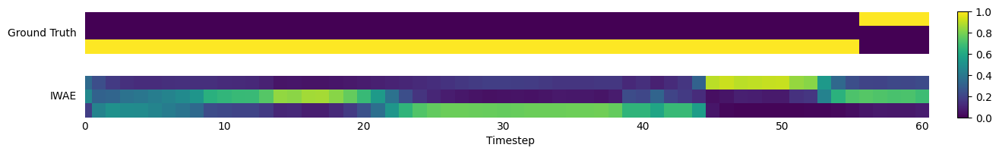

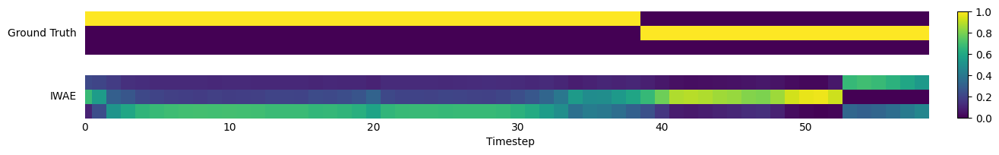

F1:0.48
CE:1.38
Epoch: [2950][2/2]	Time 0.179	Loss 16450.4375	 
Epoch: [3000][2/2]	Time 0.175	Loss 20565.5020	 
MSE: 0.16224
Pred MSE: 1.11447


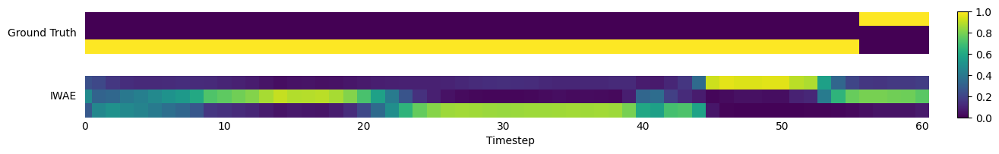

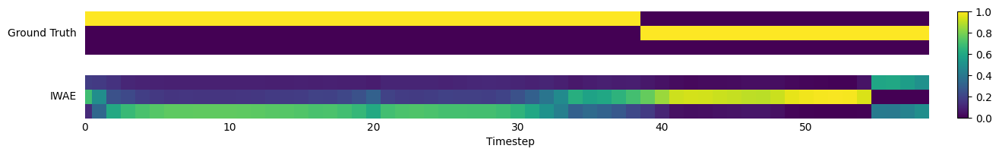

F1:0.47
CE:1.58
Epoch: [3050][2/2]	Time 0.179	Loss 18348.0859	 
Epoch: [3100][2/2]	Time 0.175	Loss 14312.8916	 
MSE: 0.16834
Pred MSE: 1.10062


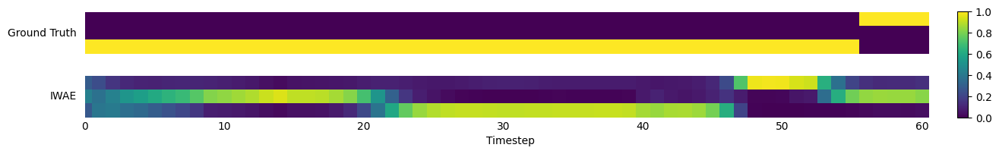

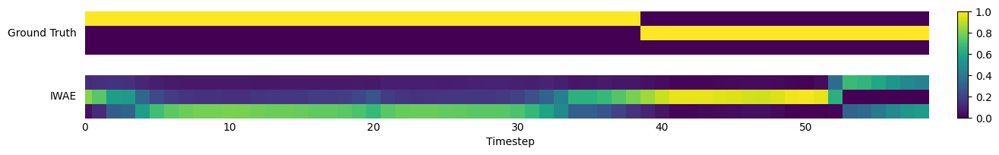

F1:0.50
CE:1.67
Epoch: [3150][2/2]	Time 0.178	Loss 16060.6543	 
Epoch: [3200][2/2]	Time 0.178	Loss 19679.2363	 
MSE: 0.16519
Pred MSE: 1.09517


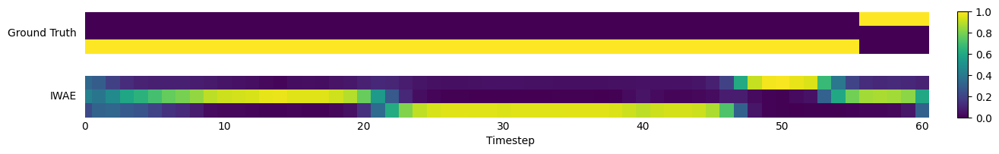

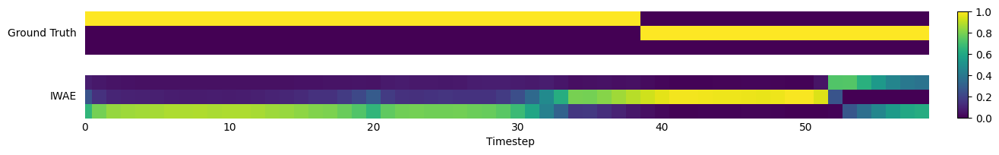

F1:0.49
CE:1.97
Epoch: [3250][2/2]	Time 0.173	Loss 15150.5225	 
Epoch: [3300][2/2]	Time 0.179	Loss 16309.7324	 
MSE: 0.17477
Pred MSE: 1.12144


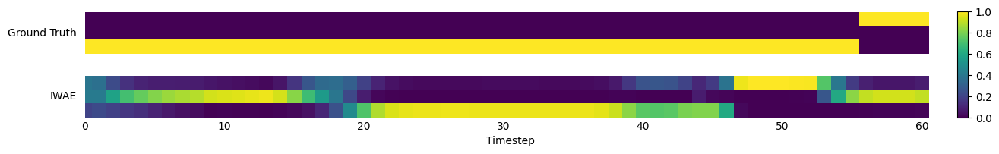

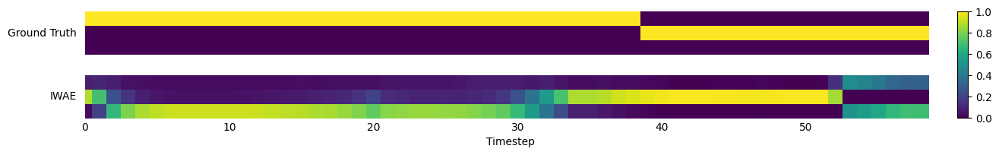

F1:0.50
CE:2.27
Epoch: [3350][2/2]	Time 0.178	Loss 15314.3467	 
Epoch: [3400][2/2]	Time 0.158	Loss 14752.7686	 
MSE: 0.16207
Pred MSE: 1.08376


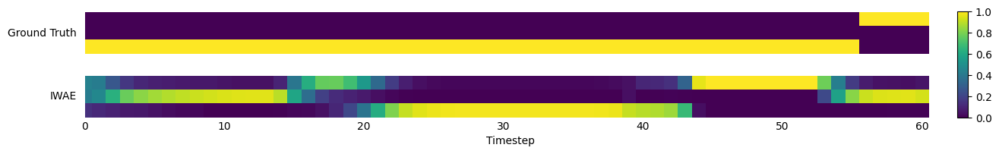

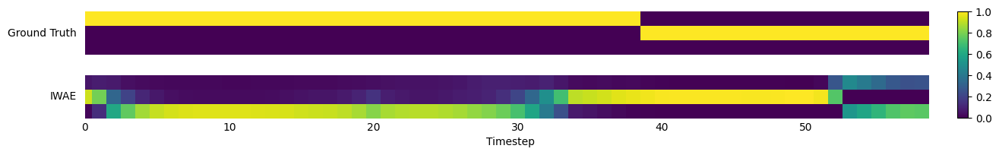

F1:0.49
CE:2.52
Epoch: [3450][2/2]	Time 0.176	Loss 14132.2090	 
Epoch: [3500][2/2]	Time 0.172	Loss 14523.9775	 
MSE: 0.16545
Pred MSE: 1.10484


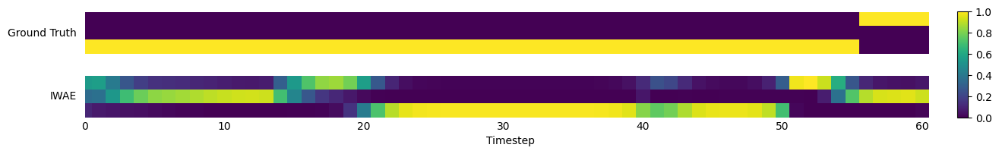

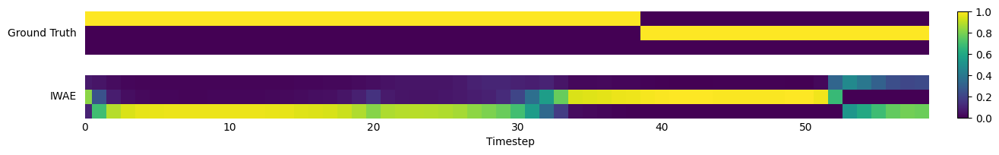

F1:0.50
CE:2.91
Epoch: [3550][2/2]	Time 0.175	Loss 13546.3555	 
Epoch: [3600][2/2]	Time 0.174	Loss 13962.8809	 
MSE: 0.15599
Pred MSE: 1.07466


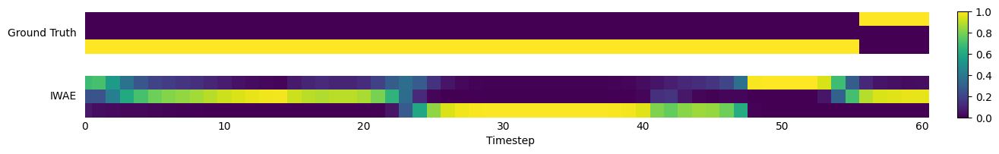

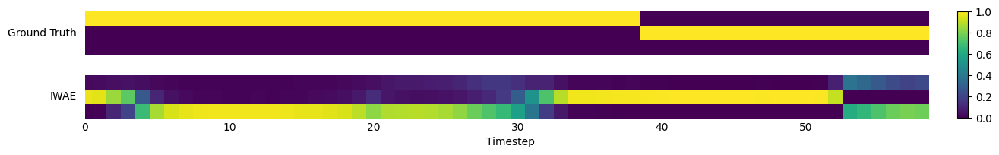

F1:0.48
CE:3.20
Epoch: [3650][2/2]	Time 0.178	Loss 15855.1748	 
Epoch: [3700][2/2]	Time 0.163	Loss 11281.5244	 
MSE: 0.15927
Pred MSE: 1.09171


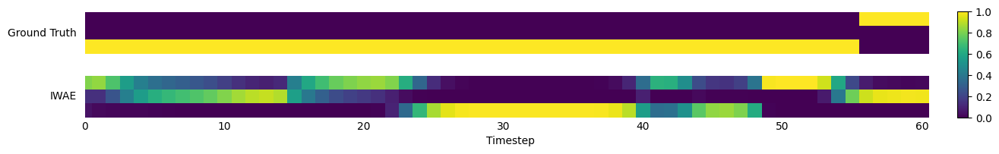

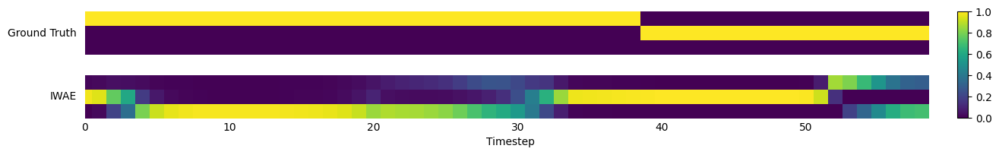

F1:0.50
CE:3.56
Epoch: [3750][2/2]	Time 0.173	Loss 15888.3418	 
Epoch: [3800][2/2]	Time 0.178	Loss 12751.8418	 
MSE: 0.15478
Pred MSE: 1.08317


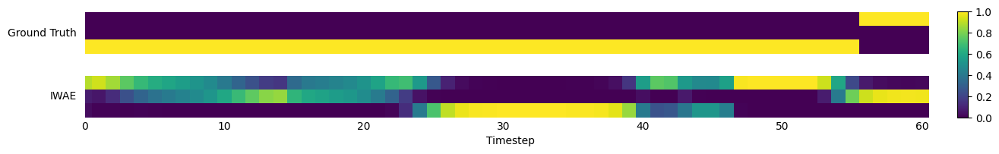

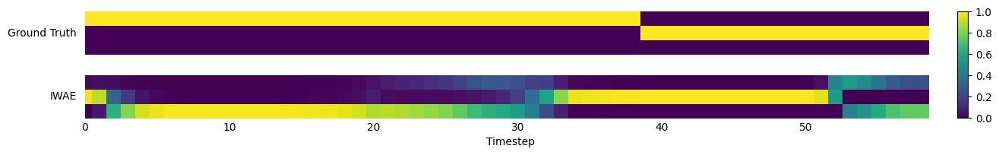

F1:0.48
CE:3.72
Epoch: [3850][2/2]	Time 0.171	Loss 14334.3867	 
Epoch: [3900][2/2]	Time 0.180	Loss 13015.7822	 
MSE: 0.16016
Pred MSE: 1.10178


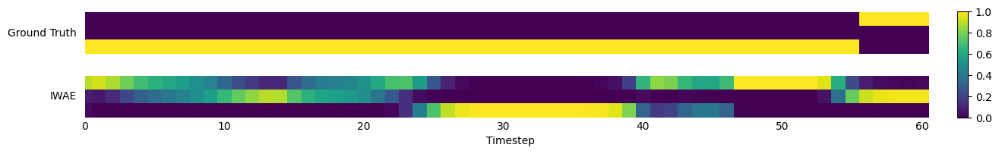

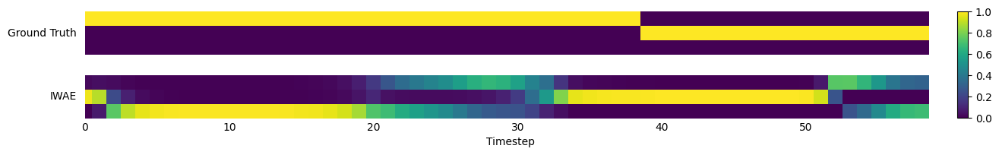

F1:0.48
CE:4.06
Epoch: [3950][2/2]	Time 0.178	Loss 18425.9629	 
Epoch: [4000][2/2]	Time 0.173	Loss 15740.9541	 
MSE: 0.16273
Pred MSE: 1.04935


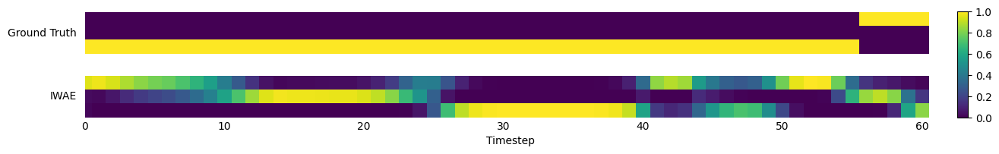

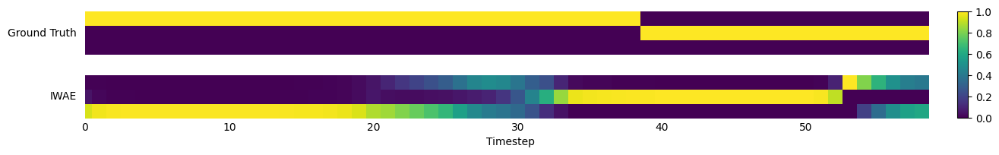

F1:0.45
CE:4.17
Epoch: [4050][2/2]	Time 0.180	Loss 14329.5381	 
Epoch: [4100][2/2]	Time 0.184	Loss 16850.7754	 
MSE: 0.16208
Pred MSE: 1.08105


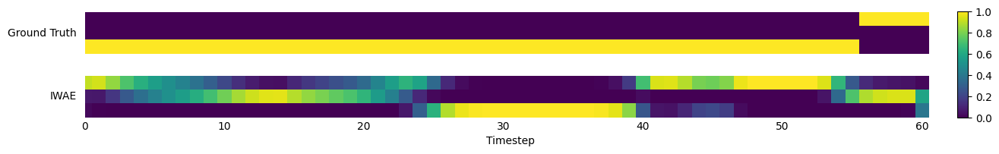

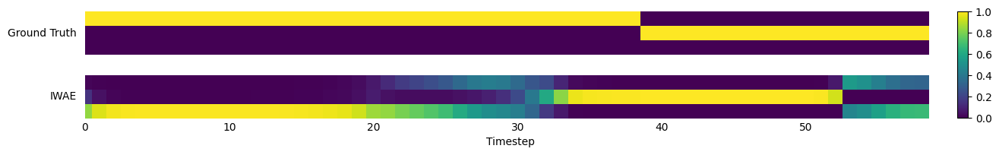

F1:0.46
CE:4.19
Epoch: [4150][2/2]	Time 0.182	Loss 13152.7666	 
Epoch: [4200][2/2]	Time 0.162	Loss 12347.4932	 
MSE: 0.15887
Pred MSE: 1.06321


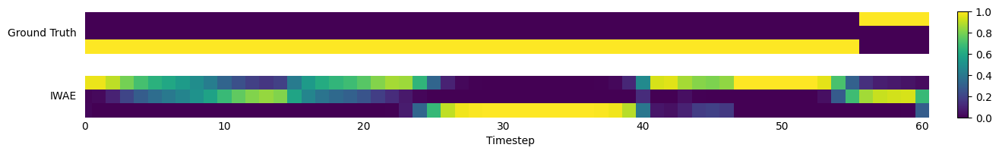

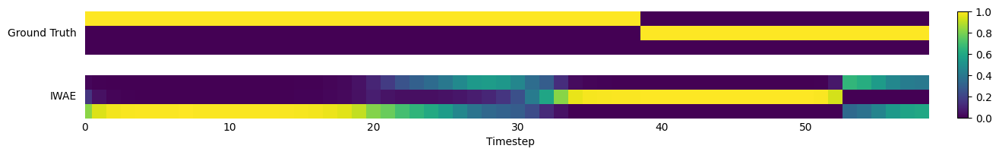

F1:0.46
CE:4.32
Epoch: [4250][2/2]	Time 0.161	Loss 15036.3760	 
Epoch: [4300][2/2]	Time 0.161	Loss 11864.7139	 
MSE: 0.16060
Pred MSE: 1.07933


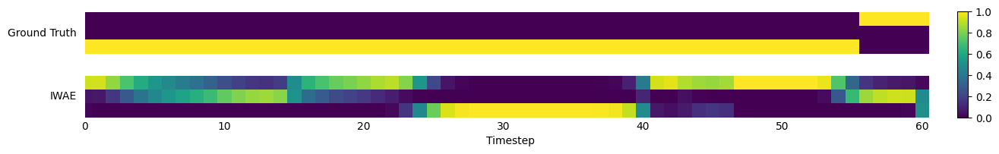

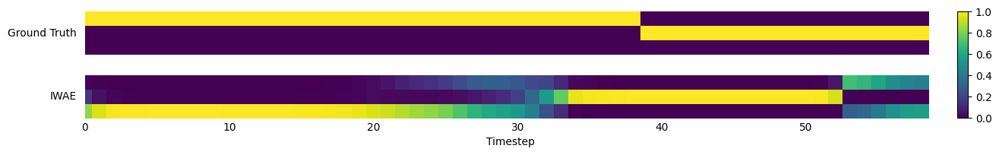

F1:0.44
CE:4.43
Epoch: [4350][2/2]	Time 0.178	Loss 11282.9482	 
Epoch: [4400][2/2]	Time 0.176	Loss 12712.5762	 
MSE: 0.15727
Pred MSE: 1.08883


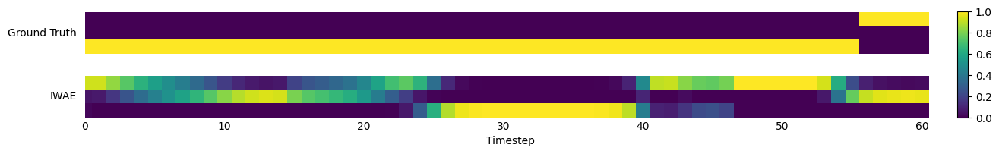

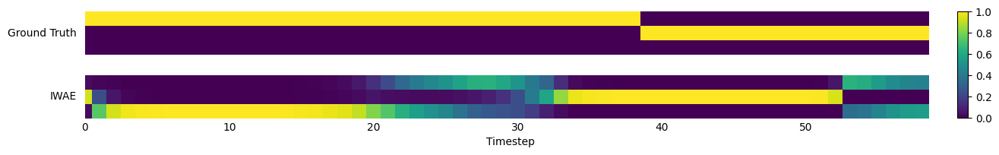

F1:0.48
CE:4.45
Epoch: [4450][2/2]	Time 0.182	Loss 11932.2871	 
Epoch: [4500][2/2]	Time 0.173	Loss 13527.6055	 
MSE: 0.15627
Pred MSE: 1.09225


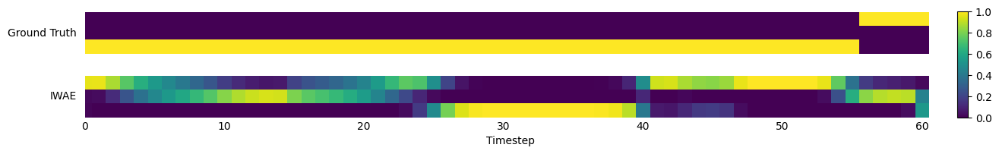

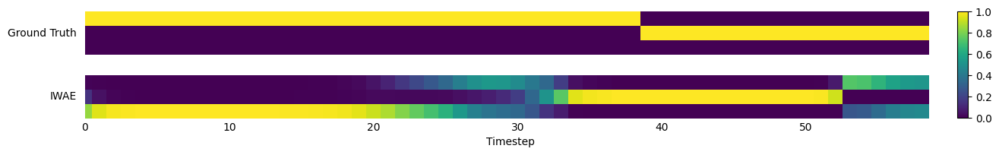

F1:0.45
CE:4.59
Epoch: [4550][2/2]	Time 0.170	Loss 9960.8291	 
Epoch: [4600][2/2]	Time 0.181	Loss 13130.2227	 
MSE: 0.15676
Pred MSE: 1.08881


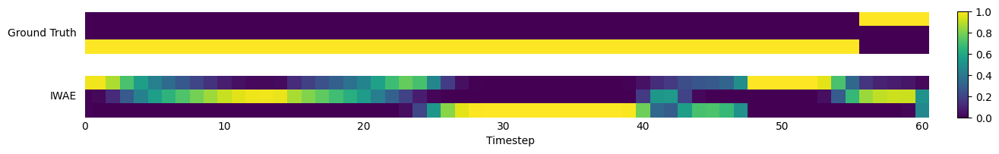

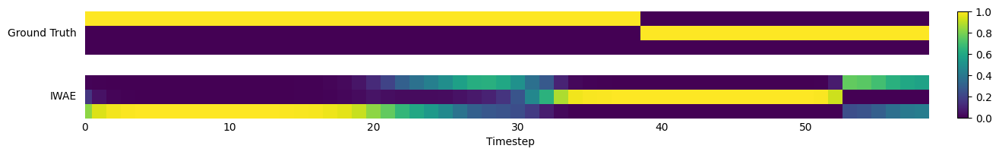

F1:0.47
CE:4.67
Epoch: [4650][2/2]	Time 0.171	Loss 10135.0029	 
Epoch: [4700][2/2]	Time 0.174	Loss 11803.6191	 
MSE: 0.16331
Pred MSE: 1.09690


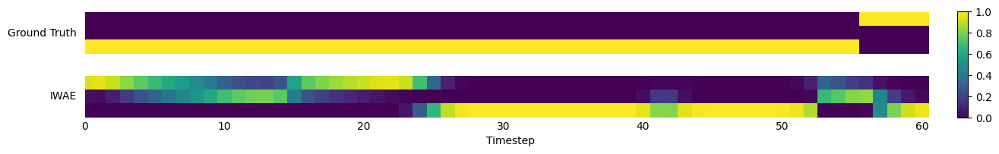

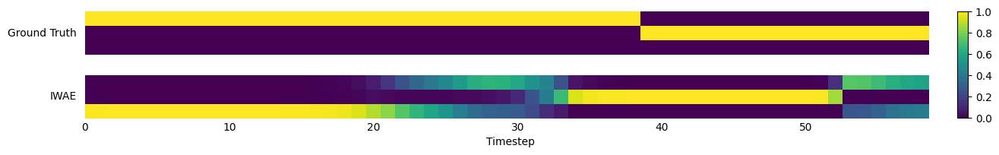

F1:0.46
CE:4.93
Epoch: [4750][2/2]	Time 0.174	Loss 15925.5654	 
Epoch: [4800][2/2]	Time 0.170	Loss 15018.5010	 
MSE: 0.15117
Pred MSE: 1.08172


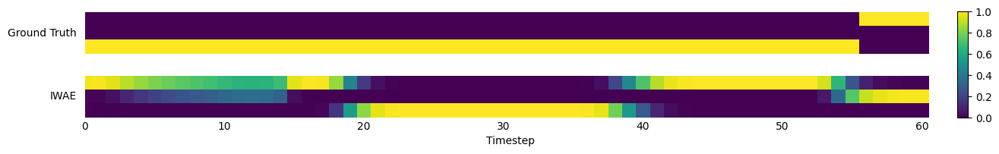

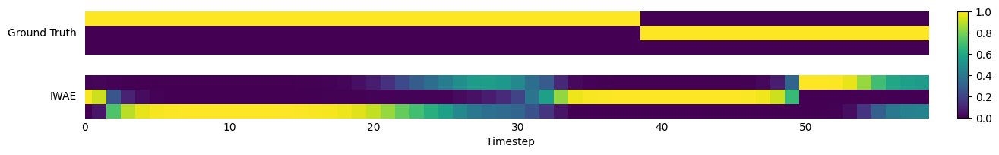

F1:0.48
CE:4.53
Epoch: [4850][2/2]	Time 0.200	Loss 15169.7305	 
Epoch: [4900][2/2]	Time 0.177	Loss 12024.2402	 
MSE: 0.16113
Pred MSE: 1.04701


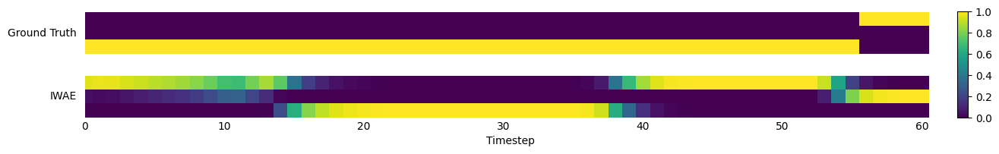

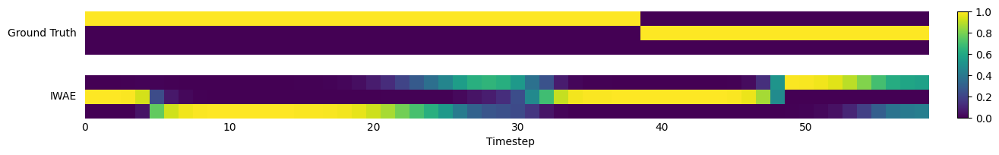

F1:0.49
CE:4.54
Epoch: [4950][2/2]	Time 0.179	Loss 13283.8447	 
Epoch: [5000][2/2]	Time 0.183	Loss 14421.8740	 
MSE: 0.14964
Pred MSE: 1.05729


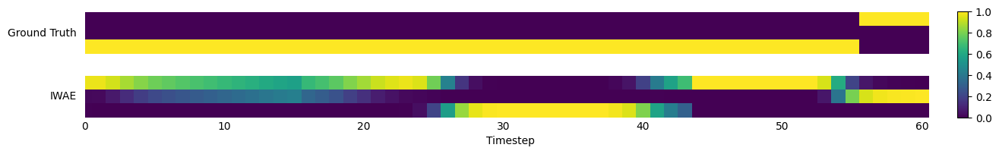

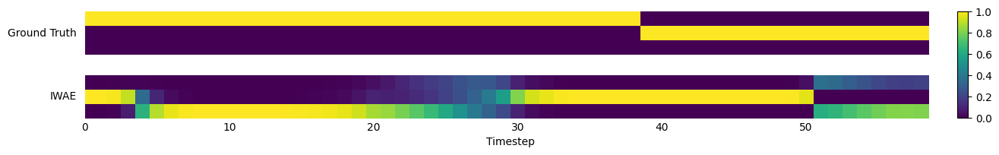

F1:0.46
CE:4.53
Epoch: [5050][2/2]	Time 0.180	Loss 13803.5303	 
Epoch: [5100][2/2]	Time 0.181	Loss 13334.8760	 
MSE: 0.15144
Pred MSE: 1.04910


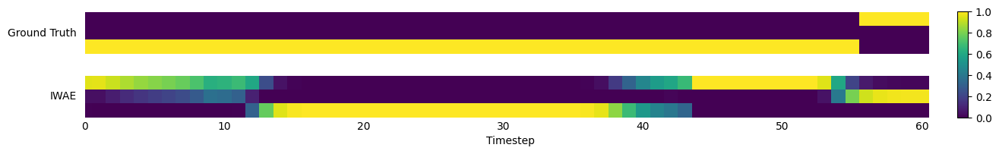

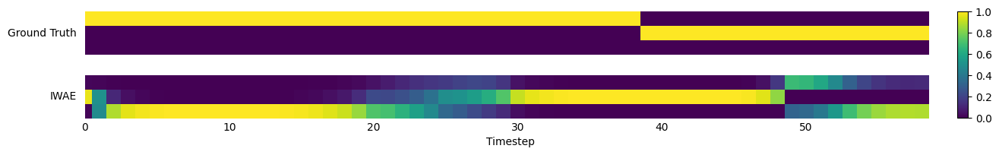

F1:0.48
CE:4.54
Epoch: [5150][2/2]	Time 0.182	Loss 12161.8799	 
Epoch: [5200][2/2]	Time 0.180	Loss 11546.8633	 
MSE: 0.15694
Pred MSE: 1.04820


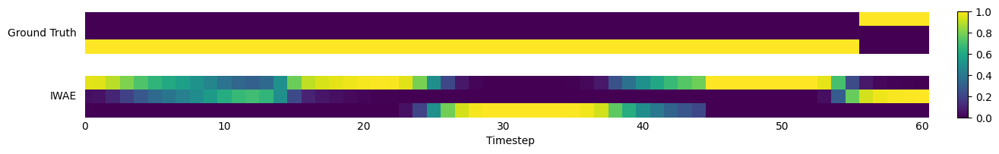

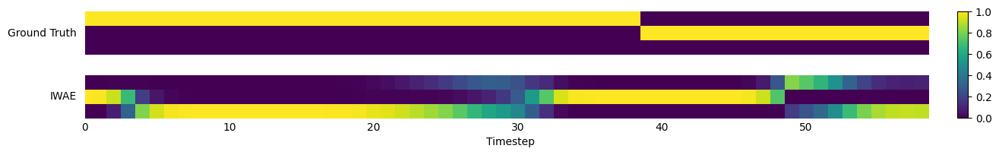

F1:0.46
CE:4.40
Epoch: [5250][2/2]	Time 0.170	Loss 9576.4570	 
Epoch: [5300][2/2]	Time 0.180	Loss 10951.8857	 
MSE: 0.16456
Pred MSE: 1.08015


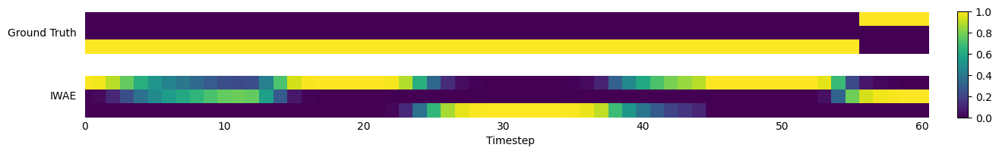

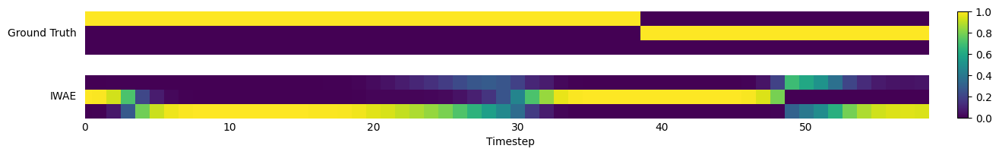

F1:0.46
CE:4.40
Epoch: [5350][2/2]	Time 0.164	Loss 12190.9111	 
Epoch: [5400][2/2]	Time 0.175	Loss 10499.9160	 
MSE: 0.15747
Pred MSE: 1.06826


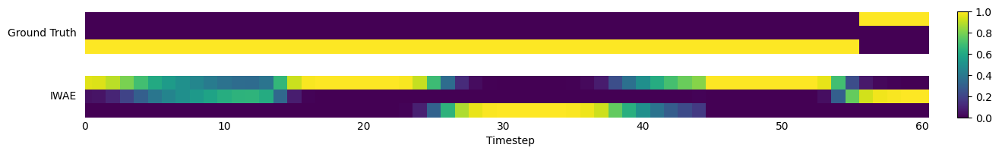

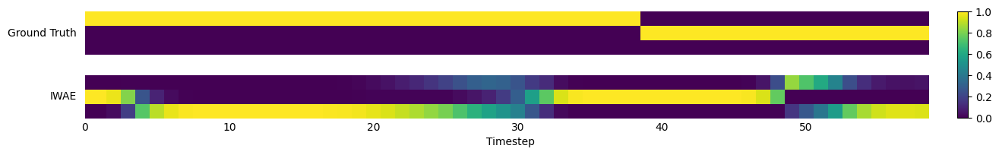

F1:0.46
CE:4.44
Epoch: [5450][2/2]	Time 0.181	Loss 9138.7148	 
Epoch: [5500][2/2]	Time 0.182	Loss 10197.2158	 
MSE: 0.15890
Pred MSE: 1.06778


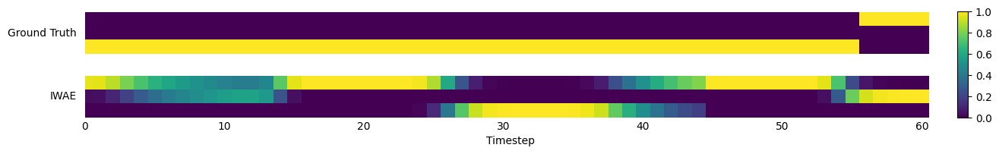

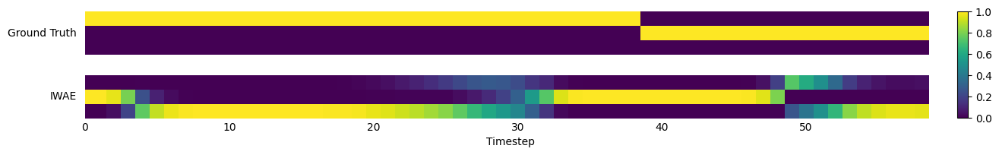

F1:0.46
CE:4.47
Epoch: [5550][2/2]	Time 0.177	Loss 11261.0400	 
Epoch: [5600][2/2]	Time 0.178	Loss 11233.1084	 
MSE: 0.15741
Pred MSE: 1.08018


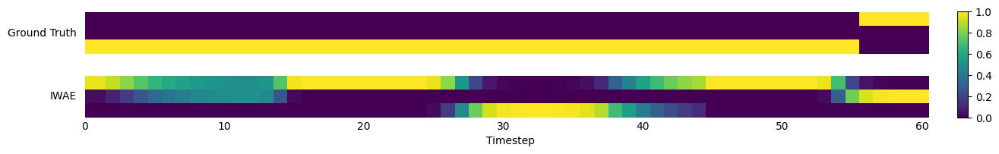

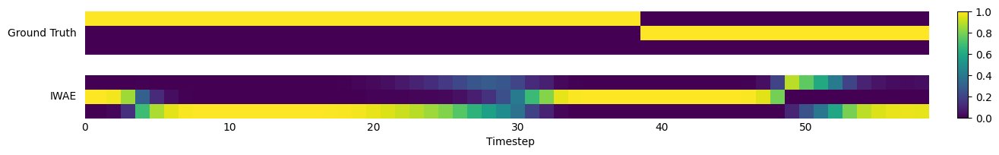

F1:0.46
CE:4.58
Epoch: [5650][2/2]	Time 0.175	Loss 10965.5498	 
Epoch: [5700][2/2]	Time 0.175	Loss 10062.1465	 
MSE: 0.16184
Pred MSE: 1.09654


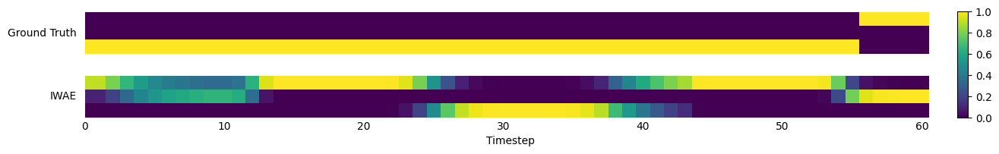

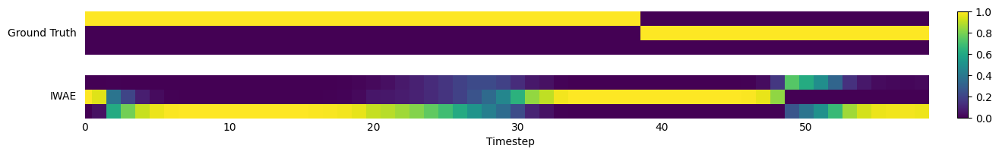

F1:0.45
CE:4.73
Epoch: [5750][2/2]	Time 0.171	Loss 10779.0039	 
Epoch: [5800][2/2]	Time 0.176	Loss 10872.5039	 
MSE: 0.14989
Pred MSE: 1.07992


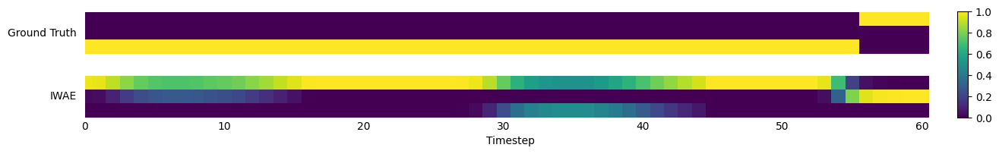

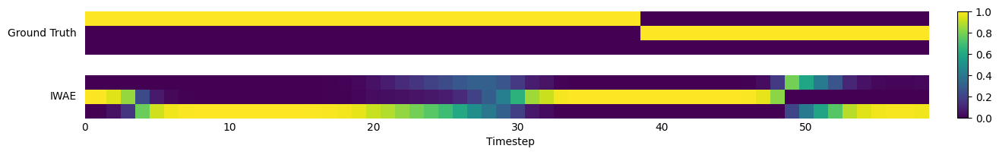

F1:0.46
CE:4.48
Epoch: [5850][2/2]	Time 0.177	Loss 13496.9873	 
Epoch: [5900][2/2]	Time 0.177	Loss 12750.9092	 
MSE: 0.13872
Pred MSE: 1.03092


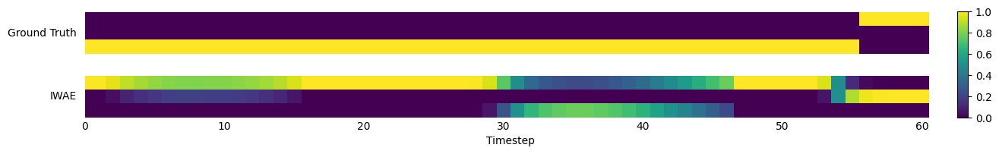

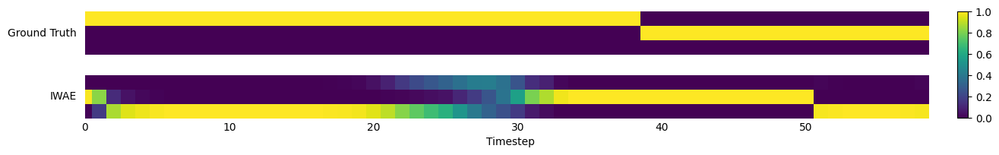

F1:0.49
CE:4.95
Epoch: [5950][2/2]	Time 0.182	Loss 10080.9131	 
Epoch: [6000][2/2]	Time 0.182	Loss 9488.0869	 
MSE: 0.15327
Pred MSE: 1.10449


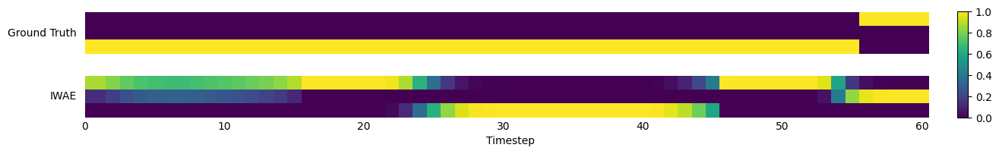

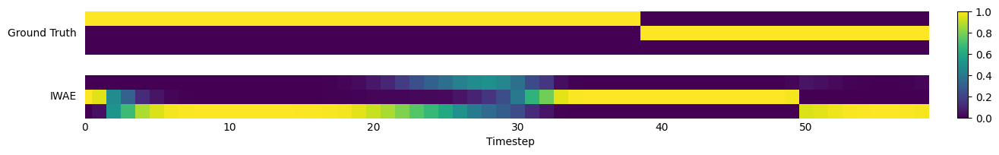

F1:0.48
CE:5.04
Epoch: [6050][2/2]	Time 0.176	Loss 9030.8857	 
Epoch: [6100][2/2]	Time 0.177	Loss 10192.5176	 
MSE: 0.15327
Pred MSE: 1.11311


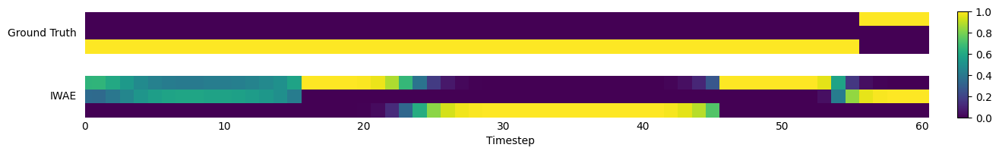

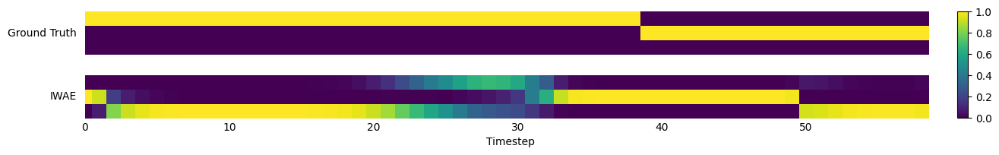

F1:0.49
CE:5.05
Epoch: [6150][2/2]	Time 0.176	Loss 9563.4180	 
Epoch: [6200][2/2]	Time 0.178	Loss 9579.6992	 
MSE: 0.14839
Pred MSE: 1.06621


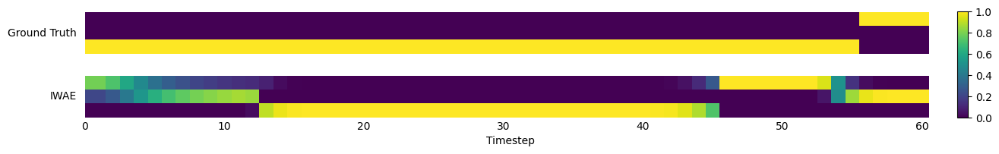

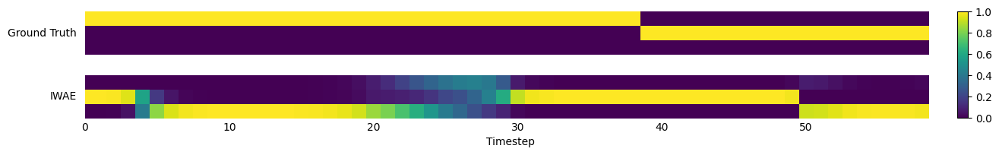

F1:0.51
CE:5.07
Epoch: [6250][2/2]	Time 0.181	Loss 9967.4521	 
Epoch: [6300][2/2]	Time 0.182	Loss 15041.9023	 
MSE: 0.13245
Pred MSE: 1.05540


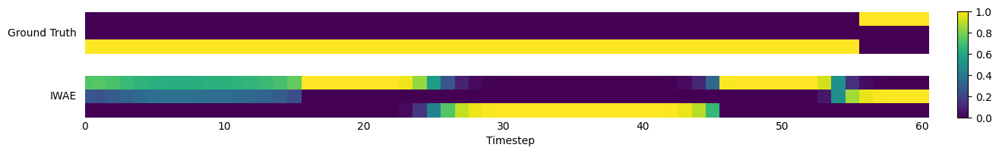

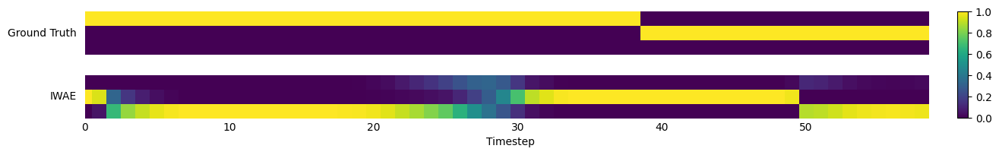

F1:0.47
CE:4.88
Epoch: [6350][2/2]	Time 0.181	Loss 11031.0518	 
Epoch: [6400][2/2]	Time 0.182	Loss 14024.2246	 
MSE: 0.15695
Pred MSE: 1.03761


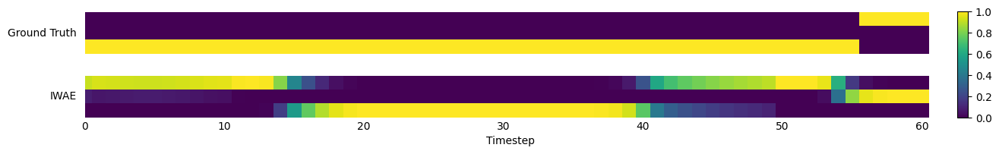

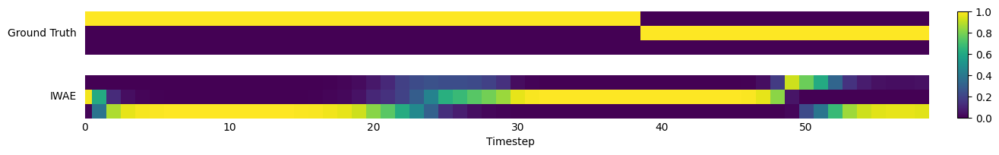

F1:0.50
CE:5.05
Epoch: [6450][2/2]	Time 0.181	Loss 9567.4355	 
Epoch: [6500][2/2]	Time 0.183	Loss 9604.6064	 
MSE: 0.14549
Pred MSE: 1.09006


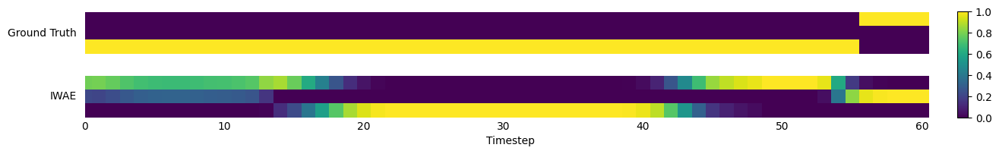

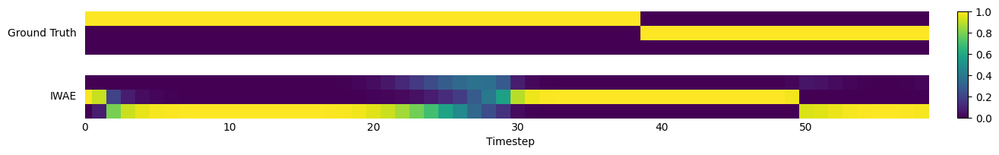

F1:0.48
CE:5.20
Epoch: [6550][2/2]	Time 0.182	Loss 10640.3066	 
Epoch: [6600][2/2]	Time 0.181	Loss 9552.7217	 
MSE: 0.13920
Pred MSE: 1.09404


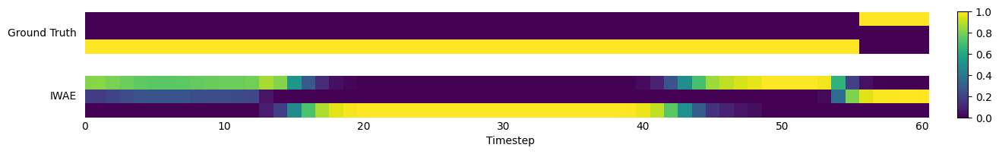

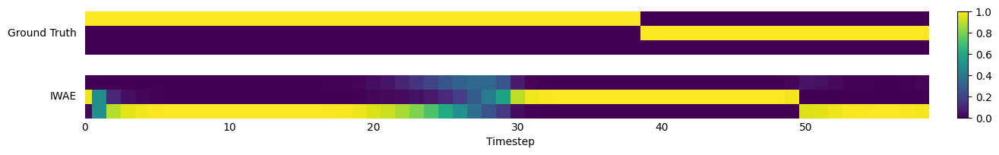

F1:0.48
CE:5.24
Epoch: [6650][2/2]	Time 0.179	Loss 8592.9072	 
Epoch: [6700][2/2]	Time 0.182	Loss 11315.7822	 
MSE: 0.14520
Pred MSE: 1.10446


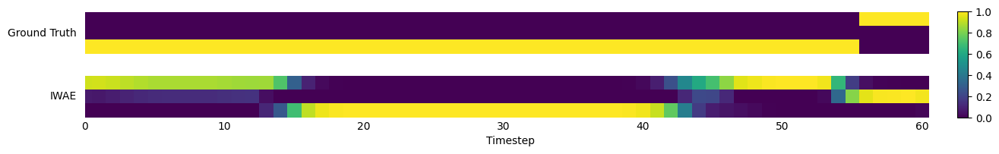

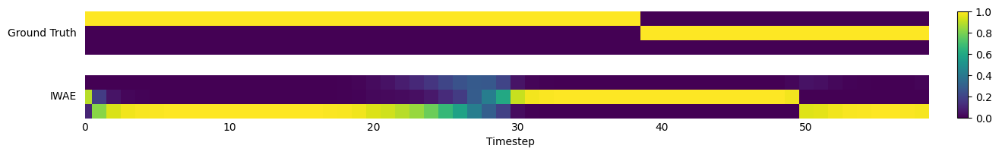

F1:0.49
CE:5.21
Epoch: [6750][2/2]	Time 0.175	Loss 10302.6123	 
Epoch: [6800][2/2]	Time 0.180	Loss 12161.3076	 
MSE: 0.13537
Pred MSE: 1.06604


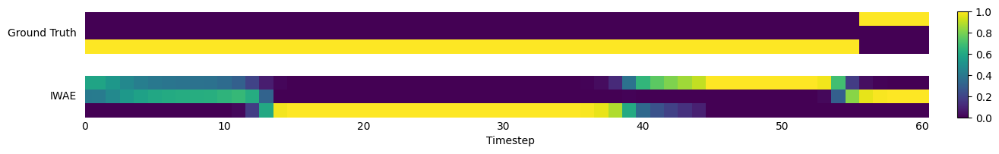

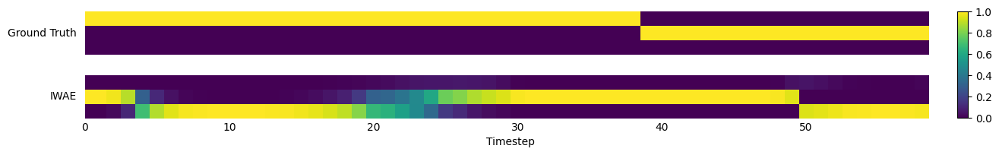

F1:0.49
CE:5.02
Epoch: [6850][2/2]	Time 0.176	Loss 11738.2529	 
Epoch: [6900][2/2]	Time 0.177	Loss 11223.7725	 
MSE: 0.15210
Pred MSE: 1.09868


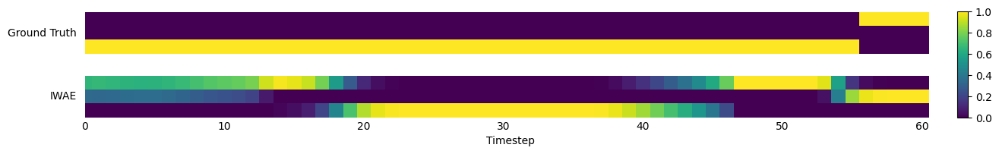

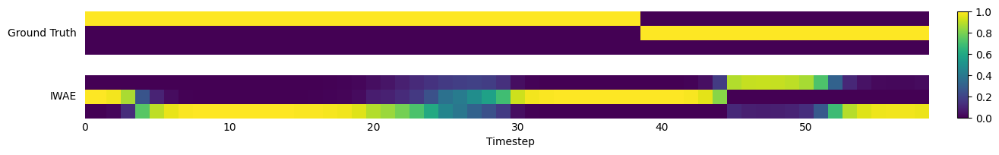

F1:0.51
CE:4.76
Epoch: [6950][2/2]	Time 0.181	Loss 9856.4307	 
Epoch: [7000][2/2]	Time 0.183	Loss 8791.9463	 
MSE: 0.15456
Pred MSE: 1.11224


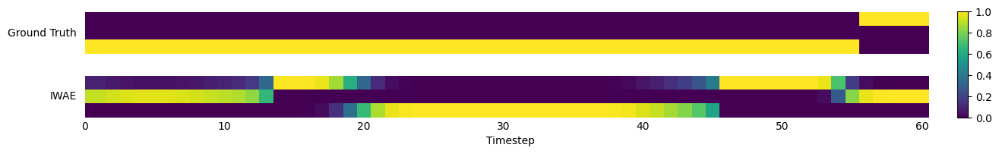

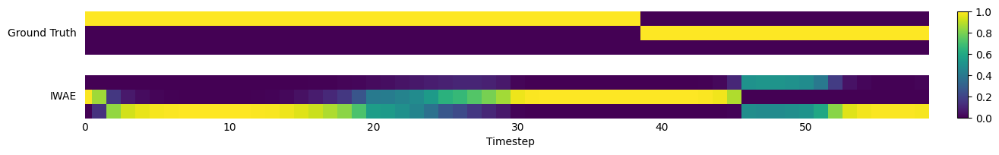

F1:0.50
CE:4.70
Epoch: [7050][2/2]	Time 0.181	Loss 10441.3447	 
Epoch: [7100][2/2]	Time 0.177	Loss 9440.2197	 
MSE: 0.15504
Pred MSE: 1.08230


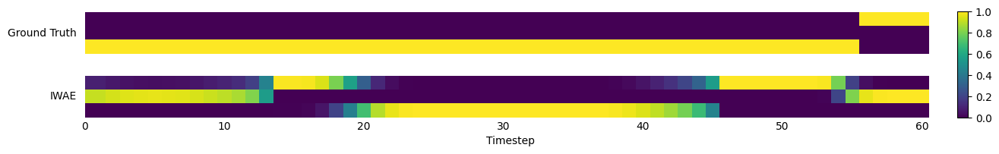

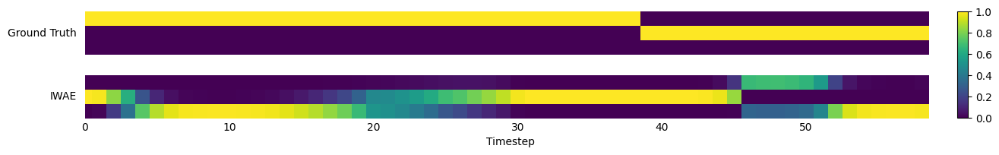

F1:0.53
CE:4.90
Epoch: [7150][2/2]	Time 0.182	Loss 8877.9727	 
Epoch: [7200][2/2]	Time 0.179	Loss 9401.9521	 
MSE: 0.14929
Pred MSE: 1.07400


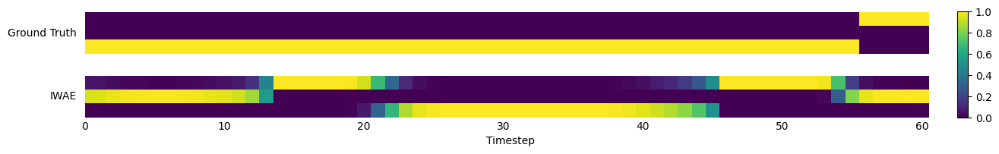

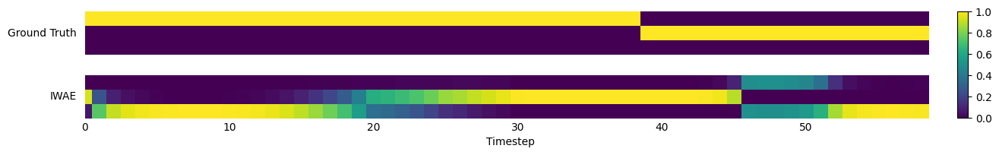

F1:0.52
CE:4.87
Epoch: [7250][2/2]	Time 0.179	Loss 9851.5596	 
Epoch: [7300][2/2]	Time 0.174	Loss 7589.4956	 
MSE: 0.15898
Pred MSE: 1.08145


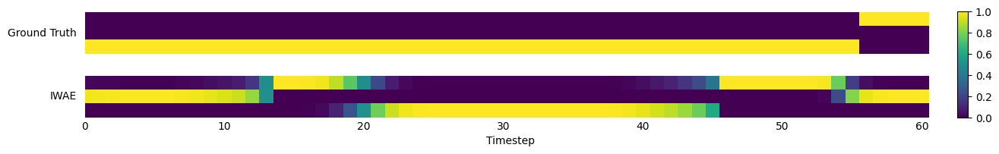

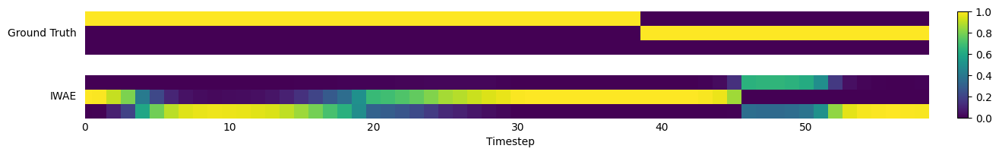

F1:0.54
CE:4.64
Epoch: [7350][2/2]	Time 0.178	Loss 9423.9111	 
Epoch: [7400][2/2]	Time 0.176	Loss 10328.5518	 
MSE: 0.16323
Pred MSE: 1.07884


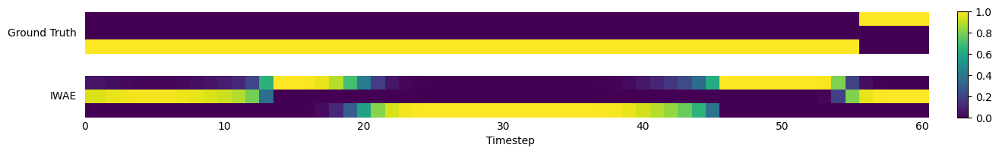

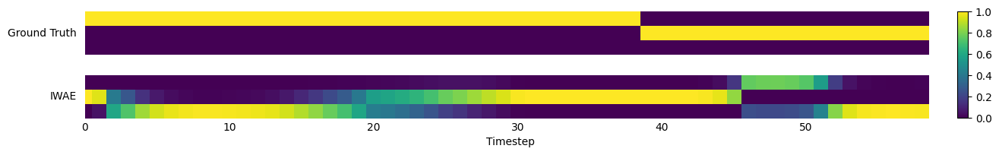

F1:0.54
CE:4.73
Epoch: [7450][2/2]	Time 0.178	Loss 8259.5029	 
Epoch: [7500][2/2]	Time 0.180	Loss 9510.3750	 
MSE: 0.16570
Pred MSE: 1.10535


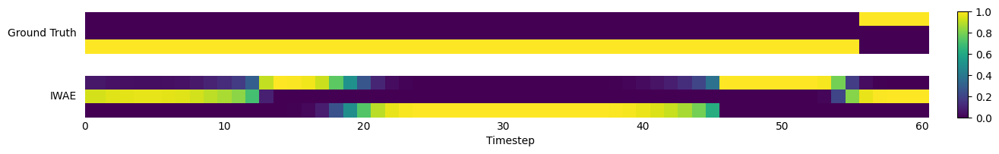

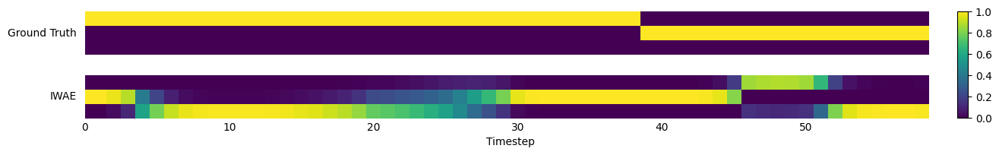

F1:0.53
CE:4.63
Epoch: [7550][2/2]	Time 0.173	Loss 9846.8369	 
Epoch: [7600][2/2]	Time 0.179	Loss 8154.5488	 
MSE: 0.16788
Pred MSE: 1.12111


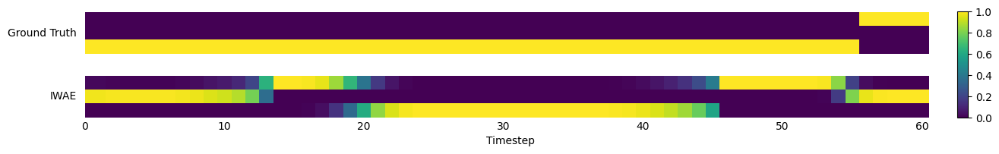

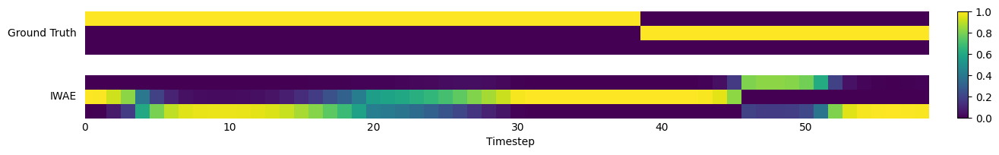

F1:0.54
CE:4.63
Epoch: [7650][2/2]	Time 0.180	Loss 9052.2520	 
Epoch: [7700][2/2]	Time 0.180	Loss 7411.0269	 
MSE: 0.16687
Pred MSE: 1.09393


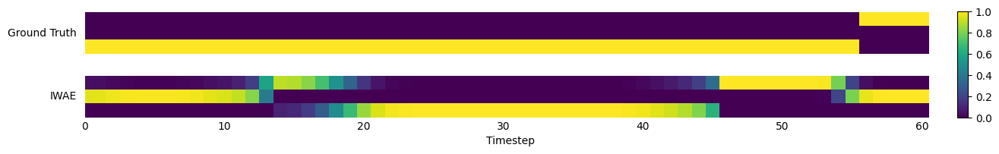

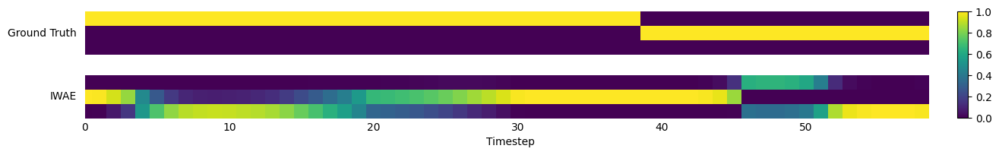

F1:0.54
CE:4.58
Epoch: [7750][2/2]	Time 0.176	Loss 9642.5264	 
Epoch: [7800][2/2]	Time 0.182	Loss 16325.3369	 
MSE: 0.14805
Pred MSE: 1.05220


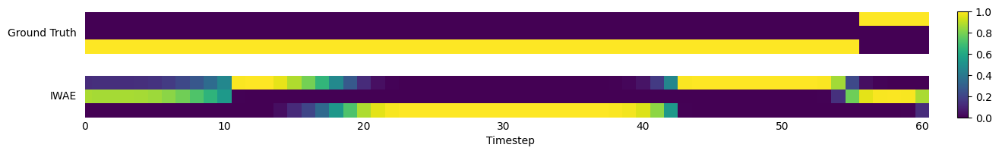

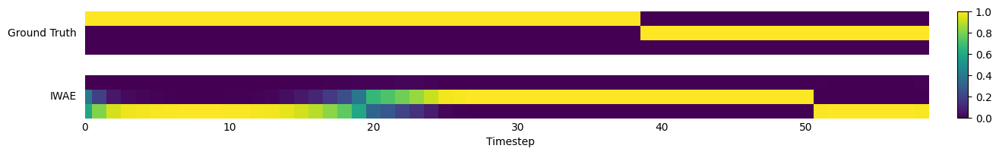

F1:0.55
CE:4.52
Epoch: [7850][2/2]	Time 0.175	Loss 15805.2275	 
Epoch: [7900][2/2]	Time 0.182	Loss 11769.9336	 
MSE: 0.12226
Pred MSE: 1.11151


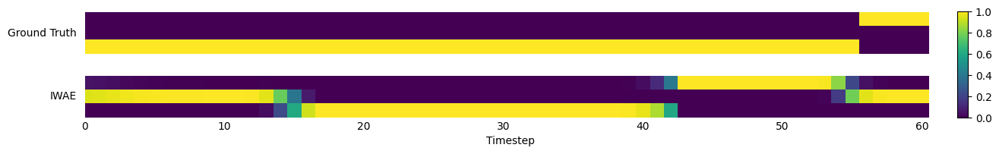

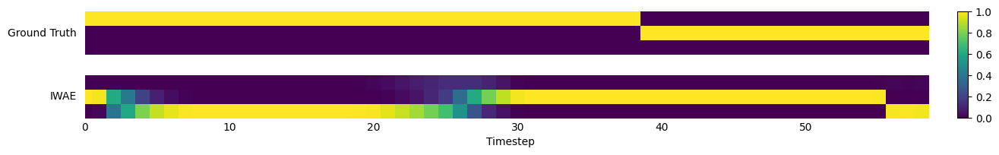

F1:0.52
CE:5.11
Epoch: [7950][2/2]	Time 0.182	Loss 11295.1660	 
Epoch: [8000][2/2]	Time 0.187	Loss 10223.9209	 
MSE: 0.12538
Pred MSE: 1.12686


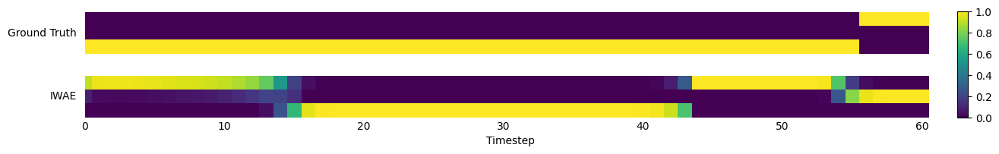

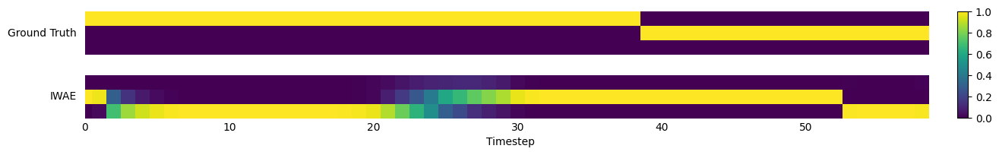

F1:0.51
CE:5.37
Epoch: [8050][2/2]	Time 0.175	Loss 9320.3545	 
Epoch: [8100][2/2]	Time 0.181	Loss 9321.5771	 
MSE: 0.11729
Pred MSE: 1.09341


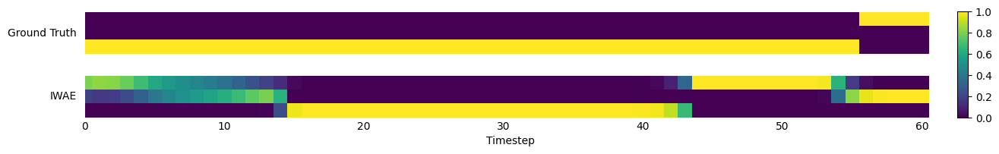

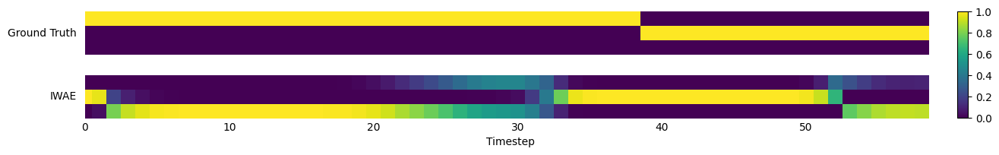

F1:0.49
CE:5.44
Epoch: [8150][2/2]	Time 0.177	Loss 10382.2021	 
Epoch: [8200][2/2]	Time 0.175	Loss 9122.9014	 
MSE: 0.11484
Pred MSE: 1.11346


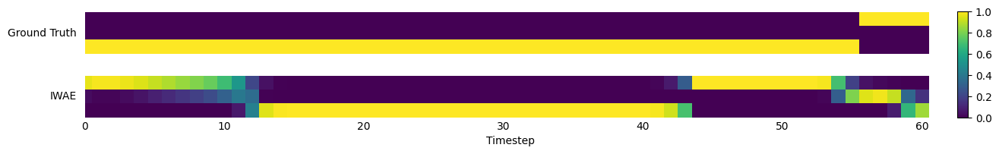

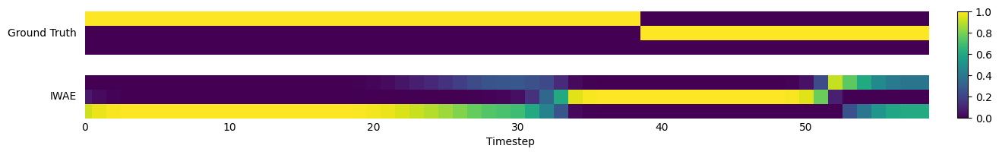

F1:0.49
CE:5.53
Epoch: [8250][2/2]	Time 0.163	Loss 9729.8779	 
Epoch: [8300][2/2]	Time 0.181	Loss 9406.1309	 
MSE: 0.12632
Pred MSE: 1.07339


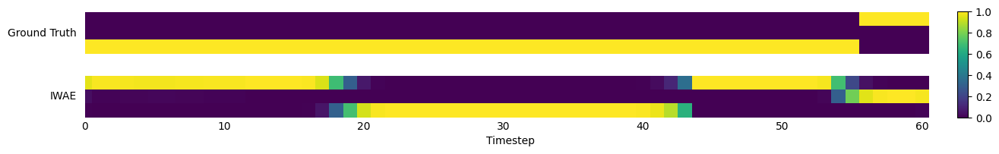

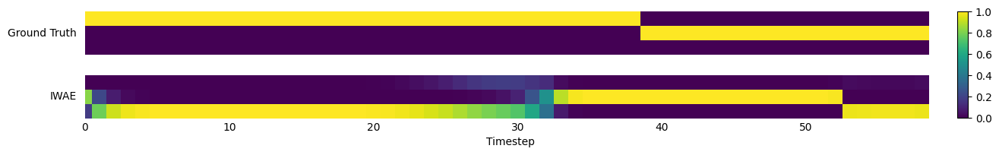

F1:0.50
CE:5.46
Epoch: [8350][2/2]	Time 0.172	Loss 8644.4014	 
Epoch: [8400][2/2]	Time 0.176	Loss 11710.5684	 
MSE: 0.12350
Pred MSE: 1.06451


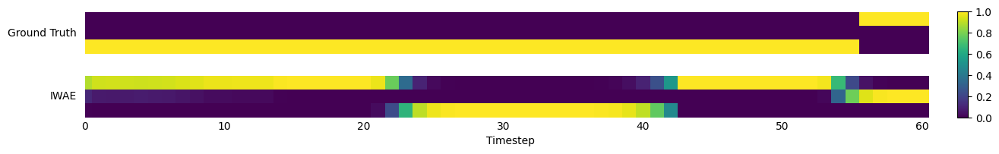

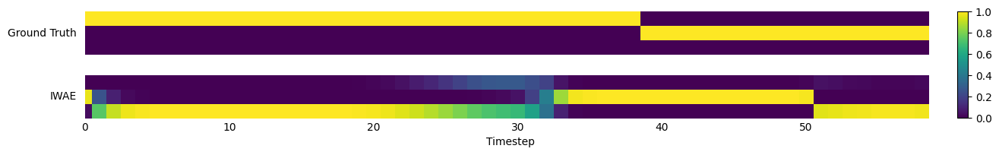

F1:0.47
CE:5.69
Epoch: [8450][2/2]	Time 0.178	Loss 10092.2217	 
Epoch: [8500][2/2]	Time 0.182	Loss 8017.5244	 
MSE: 0.12803
Pred MSE: 1.12971


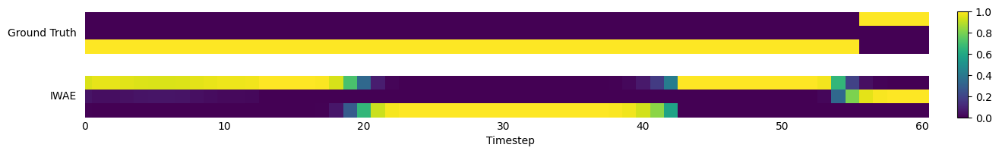

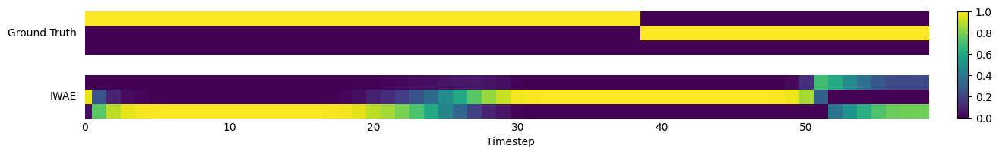

F1:0.51
CE:5.22
Epoch: [8550][2/2]	Time 0.173	Loss 10104.4336	 
Epoch: [8600][2/2]	Time 0.177	Loss 12175.3154	 
MSE: 0.13120
Pred MSE: 1.09949


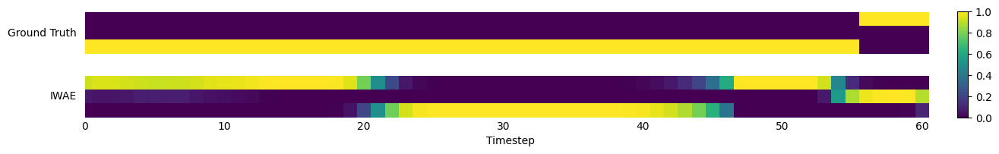

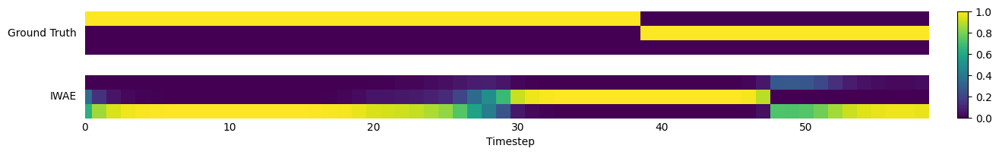

F1:0.53
CE:4.53
Epoch: [8650][2/2]	Time 0.168	Loss 10655.7012	 
Epoch: [8700][2/2]	Time 0.179	Loss 10341.7852	 
MSE: 0.13723
Pred MSE: 1.09815


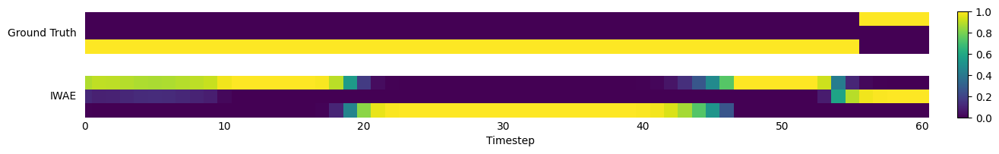

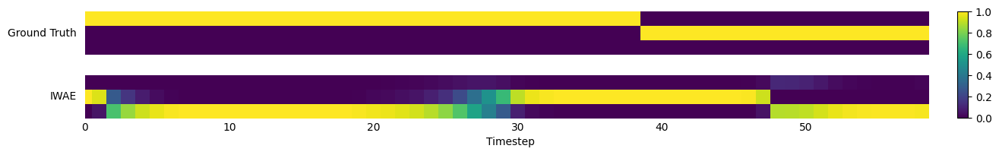

F1:0.53
CE:4.57
Epoch: [8750][2/2]	Time 0.176	Loss 11248.6846	 
Epoch: [8800][2/2]	Time 0.178	Loss 8987.6660	 
MSE: 0.12790
Pred MSE: 1.12051


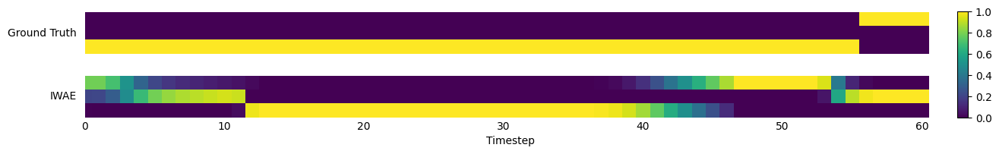

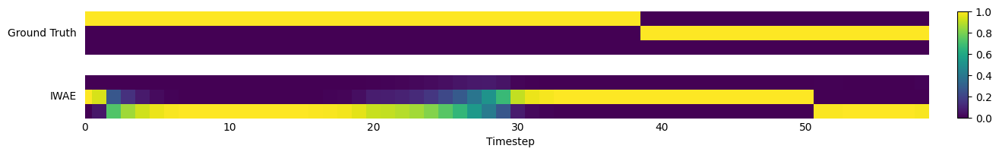

F1:0.53
CE:4.51
Epoch: [8850][2/2]	Time 0.165	Loss 10629.6729	 
Epoch: [8900][2/2]	Time 0.178	Loss 10405.8193	 
MSE: 0.13350
Pred MSE: 1.07962


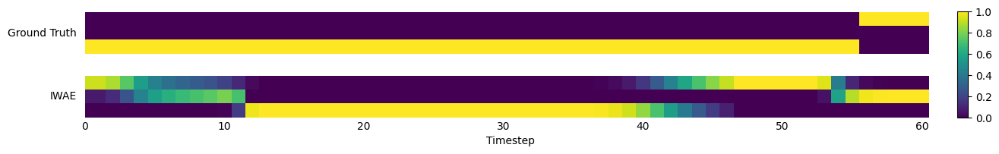

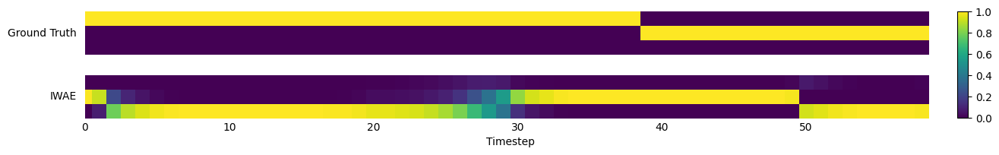

F1:0.54
CE:4.41
Epoch: [8950][2/2]	Time 0.179	Loss 8778.3682	 
Epoch: [9000][2/2]	Time 0.177	Loss 12189.4668	 
MSE: 0.13456
Pred MSE: 1.10960


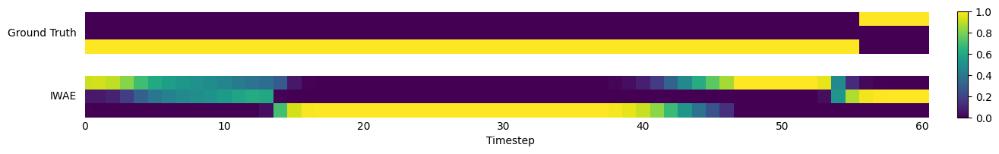

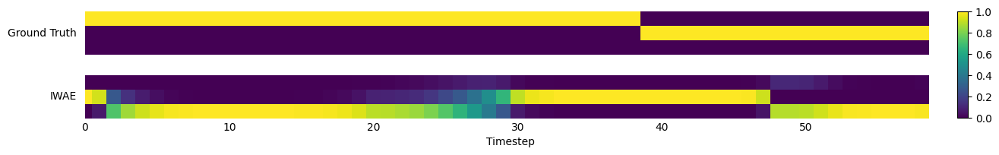

F1:0.53
CE:4.45
Epoch: [9050][2/2]	Time 0.182	Loss 10725.7607	 
Epoch: [9100][2/2]	Time 0.179	Loss 9862.7334	 
MSE: 0.12874
Pred MSE: 1.11711


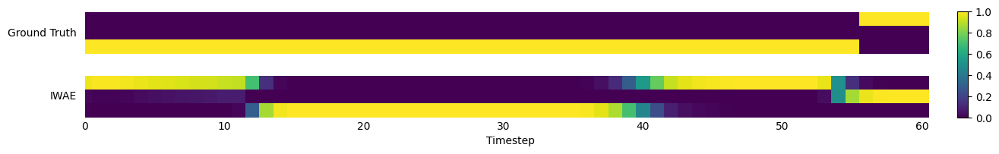

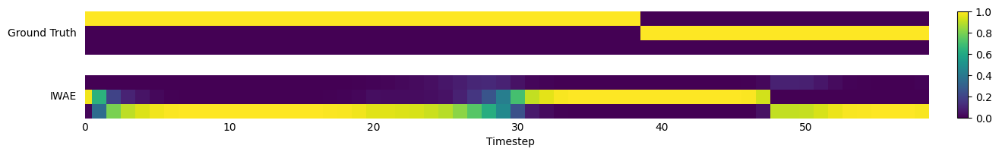

F1:0.54
CE:4.57
Epoch: [9150][2/2]	Time 0.182	Loss 10376.4639	 
Epoch: [9200][2/2]	Time 0.167	Loss 10092.1494	 
MSE: 0.12914
Pred MSE: 1.09443


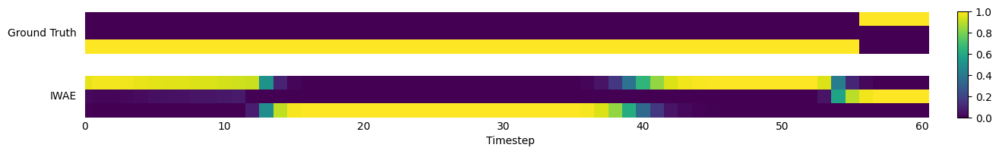

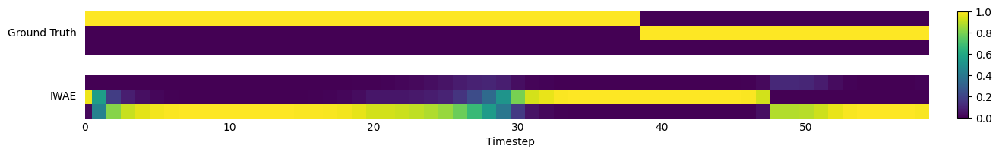

F1:0.54
CE:4.49
Epoch: [9250][2/2]	Time 0.179	Loss 7513.3848	 
Epoch: [9300][2/2]	Time 0.179	Loss 7797.6333	 
MSE: 0.12841
Pred MSE: 1.17001


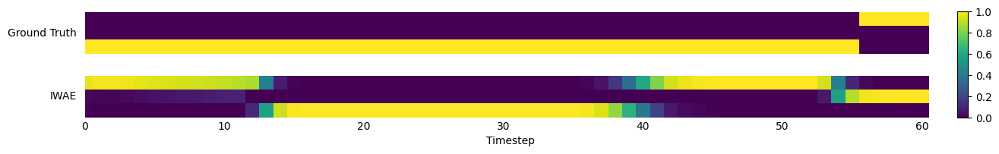

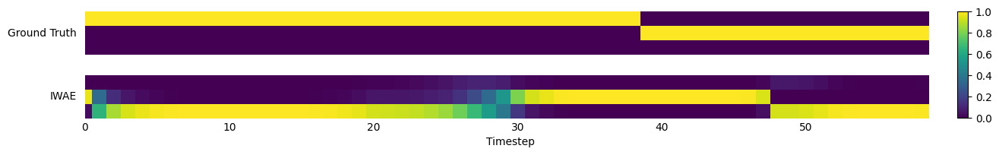

F1:0.54
CE:4.56
Epoch: [9350][2/2]	Time 0.176	Loss 8042.2051	 
Epoch: [9400][2/2]	Time 0.184	Loss 7976.0698	 
MSE: 0.12892
Pred MSE: 1.13228


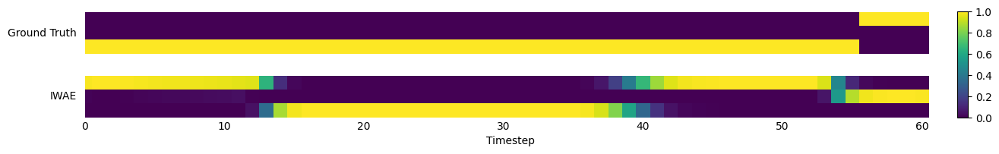

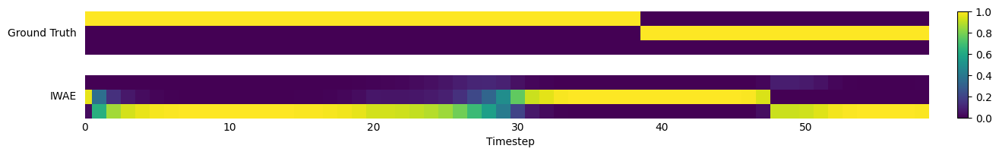

F1:0.54
CE:4.54
Epoch: [9450][2/2]	Time 0.179	Loss 7633.8848	 
Epoch: [9500][2/2]	Time 0.181	Loss 8479.2051	 
MSE: 0.13085
Pred MSE: 1.15268


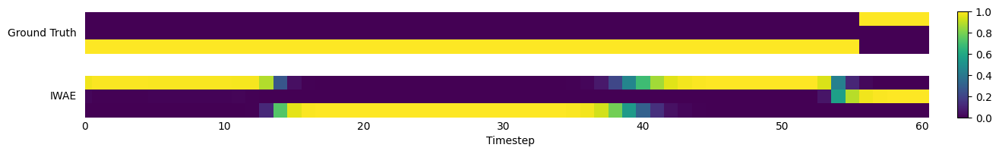

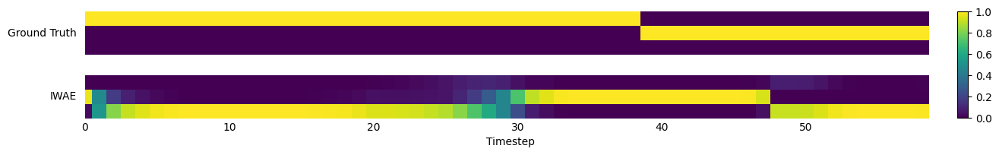

F1:0.54
CE:4.62
Epoch: [9550][2/2]	Time 0.164	Loss 8226.6553	 
Epoch: [9600][2/2]	Time 0.191	Loss 7769.0205	 
MSE: 0.13206
Pred MSE: 1.08826


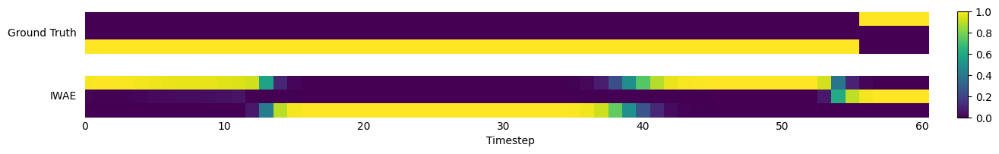

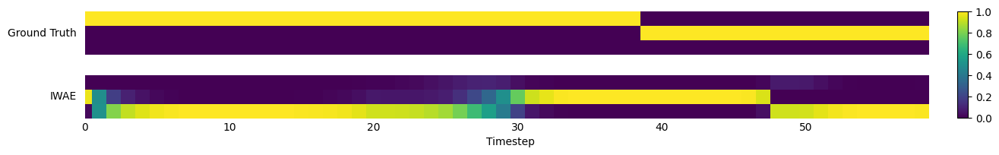

F1:0.54
CE:4.61
Epoch: [9650][2/2]	Time 0.175	Loss 6917.1572	 
Epoch: [9700][2/2]	Time 0.172	Loss 7237.7925	 
MSE: 0.13432
Pred MSE: 1.14684


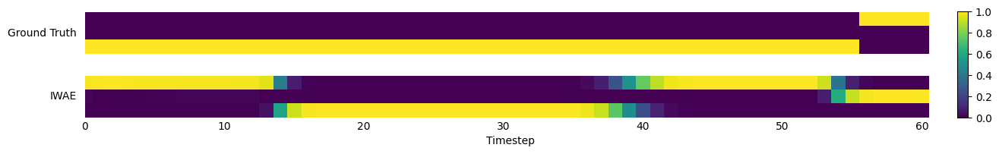

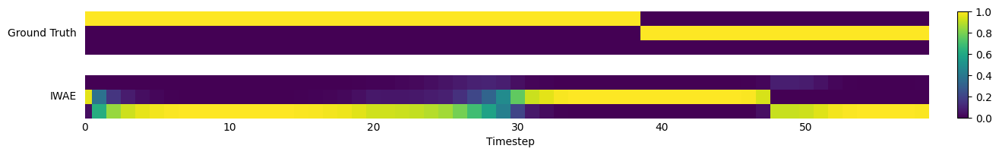

F1:0.54
CE:4.53
Epoch: [9750][2/2]	Time 0.182	Loss 8408.9707	 
Epoch: [9800][2/2]	Time 0.174	Loss 7451.8535	 
MSE: 0.13410
Pred MSE: 1.12927


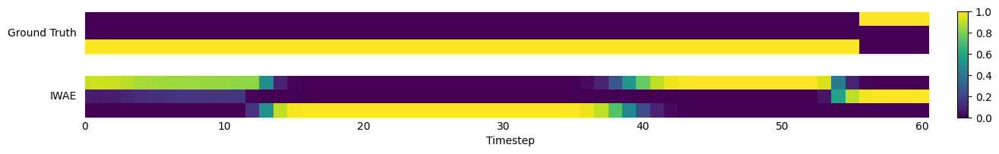

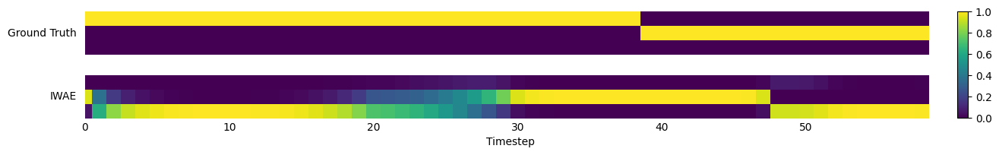

F1:0.55
CE:4.52
Epoch: [9850][2/2]	Time 0.188	Loss 7705.9268	 
Epoch: [9900][2/2]	Time 0.174	Loss 7486.9229	 
MSE: 0.13364
Pred MSE: 1.13971


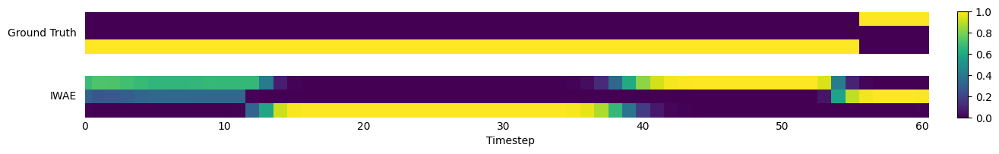

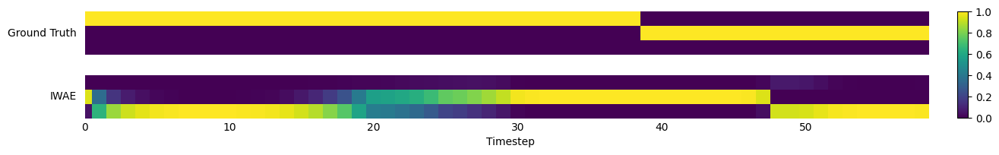

F1:0.56
CE:4.56
Epoch: [9950][2/2]	Time 0.181	Loss 13520.4795	 


In [17]:
iwae_losses, test_mse_iwae, pred_mse_iwae = train_iwae(N, model, optimizer,num_states, dim_latent, T)

In [18]:
PATH = 'snlds_bee_iwae.pth'
torch.save(model.state_dict(), PATH)
# model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()
# model.load_state_dict(torch.load(PATH))

Text(0, 0.5, 'Training Loss')

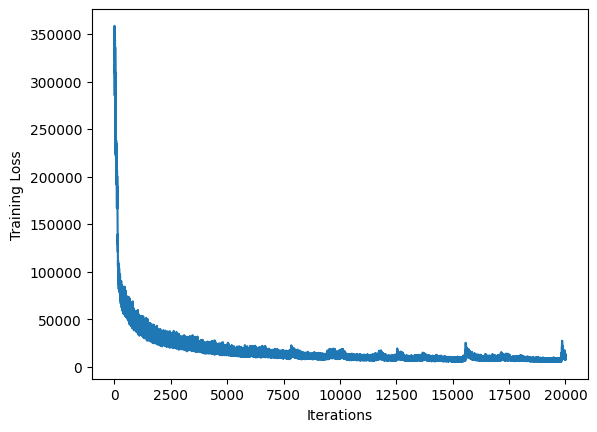

In [21]:
plt.plot(iwae_losses)
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'Training Loss')

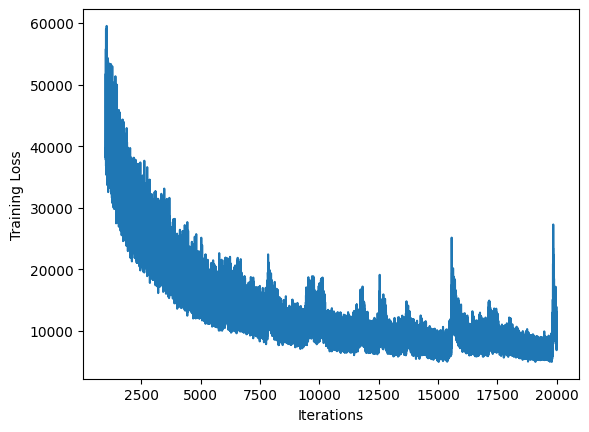

In [22]:
plt.plot(np.arange(1000,len(iwae_losses)),iwae_losses[1000:])
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'MSE')

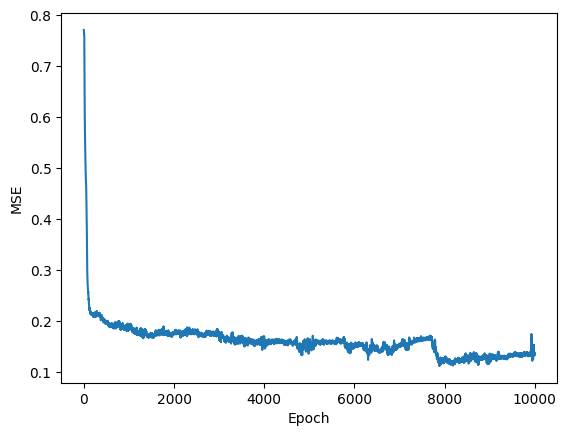

In [23]:
plt.plot(test_mse_iwae)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

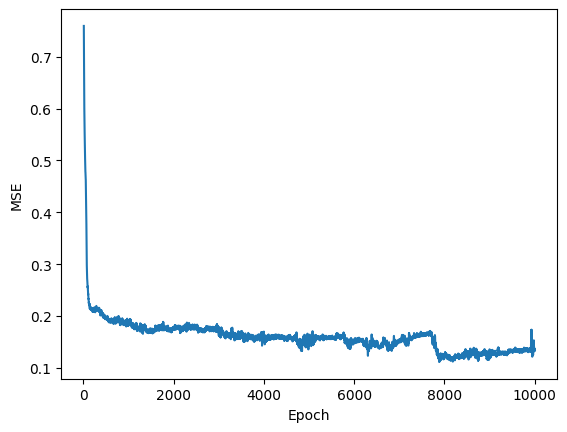

In [24]:
plt.plot(np.arange(10,len(test_mse_iwae)),test_mse_iwae[10:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

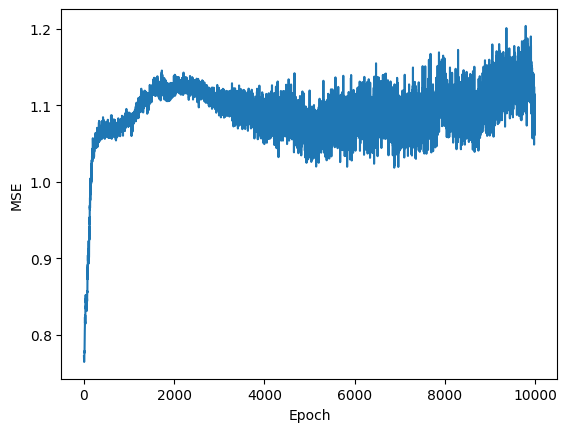

In [25]:
plt.plot(pred_mse_iwae)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

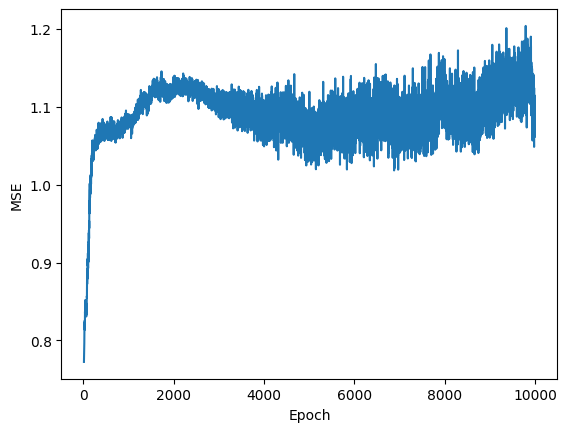

In [26]:
plt.plot(np.arange(10,len(pred_mse_iwae)),pred_mse_iwae[10:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

In [27]:
# Training time: 115min
print(f"Last IWAE Loss: {iwae_losses[-1]:.1f}")
print(f"Last Test MSE: {test_mse_iwae[-1]:.6f}")
print(f"Last Pred MSE: {pred_mse_iwae[-1]:.6f}")

Last IWAE Loss: 12902.5
Last Test MSE: 0.135204
Last Pred MSE: 1.100408


In [28]:
print(f"Best IWAE Loss: {min(iwae_losses):.1f}")
print(f"Best Test MSE: {min(test_mse_iwae):.6f}")
print(f"Best Pred MSE: {min(pred_mse_iwae):.6f}")

Best IWAE Loss: 4974.1
Best Test MSE: 0.111617
Best Pred MSE: 0.764121


In [29]:
# Reconstructions

t = 120
model.eval()

with torch.inference_mode():
    (x,_) = next(iter(test_dataloader))
    x = x.to(device).float()
    recon_x,_,_,_ = model(x)
    x = x.cpu().numpy()
    recon_x = recon_x.cpu().numpy()

# Final MSE per timestep
mse_T = np.mean(((x - recon_x) ** 2),axis=(0,2))
for i,element in enumerate(mse_T):
    print(f"t={i} MSE per pixel:{element:.6f}")

t=0 MSE per pixel:0.438116
t=1 MSE per pixel:0.208675
t=2 MSE per pixel:0.169071
t=3 MSE per pixel:0.173377
t=4 MSE per pixel:0.227512
t=5 MSE per pixel:0.071476
t=6 MSE per pixel:0.069978
t=7 MSE per pixel:0.114064
t=8 MSE per pixel:0.175521
t=9 MSE per pixel:0.140084
t=10 MSE per pixel:0.136942
t=11 MSE per pixel:0.176464
t=12 MSE per pixel:0.272171
t=13 MSE per pixel:0.058740
t=14 MSE per pixel:0.096830
t=15 MSE per pixel:0.080548
t=16 MSE per pixel:0.090140
t=17 MSE per pixel:0.087157
t=18 MSE per pixel:0.102517
t=19 MSE per pixel:0.102722
t=20 MSE per pixel:0.149634
t=21 MSE per pixel:0.106122
t=22 MSE per pixel:0.099448
t=23 MSE per pixel:0.146069
t=24 MSE per pixel:0.127089
t=25 MSE per pixel:0.087534
t=26 MSE per pixel:0.079523
t=27 MSE per pixel:0.108602
t=28 MSE per pixel:0.088877
t=29 MSE per pixel:0.073901
t=30 MSE per pixel:0.099377
t=31 MSE per pixel:0.111281
t=32 MSE per pixel:0.142132
t=33 MSE per pixel:0.087706
t=34 MSE per pixel:0.087289
t=35 MSE per pixel:0.191765
t=

In [30]:
mse_T

array([0.43811607, 0.20867494, 0.16907102, 0.17337742, 0.22751197,
       0.07147589, 0.06997835, 0.11406443, 0.17552115, 0.14008422,
       0.13694245, 0.17646363, 0.27217117, 0.05873953, 0.0968295 ,
       0.08054797, 0.09014024, 0.08715655, 0.10251735, 0.10272217,
       0.14963375, 0.10612227, 0.09944762, 0.14606912, 0.12708908,
       0.08753432, 0.07952262, 0.10860173, 0.08887731, 0.07390074,
       0.09937736, 0.11128131, 0.1421324 , 0.08770578, 0.0872886 ,
       0.1917651 , 0.06681408, 0.08450307, 0.15699106, 0.16477744,
       0.09138411, 0.07945732, 0.17309853, 0.17804408, 0.07654204,
       0.0662459 , 0.06906254, 0.10577921, 0.07744668, 0.07718231,
       0.11989019, 0.15256074, 0.24715555, 0.27783835, 0.20691733,
       0.20261517, 0.23416372, 0.18029575, 0.22112934, 0.22965093,
       0.15822779, 0.12838767, 0.10999262, 0.12641035, 0.11752282,
       0.14229648, 0.11364587, 0.17316549, 0.12082767, 0.07285656,
       0.06696843, 0.08725306, 0.11742832, 0.17290008, 0.14262

Text(0, 0.5, 'MSE per Pixel')

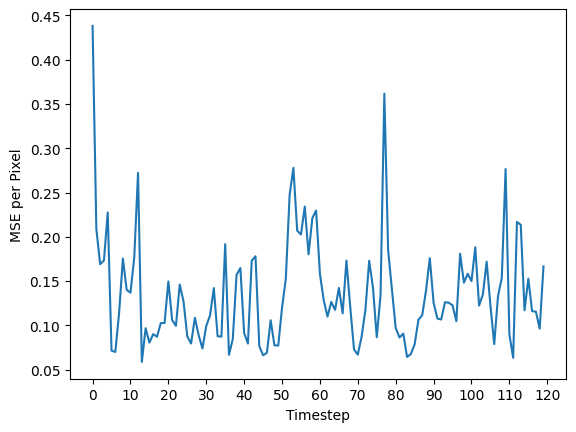

In [31]:
plt.plot(mse_T)
plt.xlabel('Timestep')
plt.xticks(np.arange(0,121,10))
plt.ylabel('MSE per Pixel')

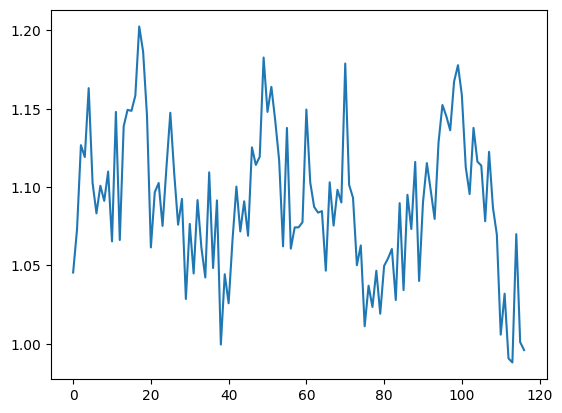

In [32]:
# Take first 3 timesteps. Generate the rest of the sequence. Calculate MSE

with torch.inference_mode():
    predict_mse = []
    for (sample,_) in test_dataloader:
        mse_values = []
        obs_var = sample.float().to(device)
        preds = model.predict_sequence(obs_var[:,:3], seq_len=117)
        obs_var, preds = obs_var.cpu().numpy(), preds.cpu().numpy()
        mse = np.mean(((preds - obs_var[:,3:]) ** 2),axis=(0,2))
        mse_values.append(mse)
    mse_val = sum(mse_values) / len(mse_values)
    predict_mse.append(mse_val.tolist())

plt.plot(predict_mse[0])

In [33]:
np.array(predict_mse[0])

array([1.04545152, 1.07305658, 1.12678361, 1.11920822, 1.16319323,
       1.10264611, 1.08324456, 1.10084629, 1.09121609, 1.10993242,
       1.06531882, 1.14800191, 1.0662291 , 1.1388104 , 1.14931846,
       1.14868915, 1.15842867, 1.20256495, 1.18654501, 1.14554274,
       1.06148696, 1.09672093, 1.1026206 , 1.07520843, 1.11243403,
       1.14747536, 1.10890222, 1.07598937, 1.09247851, 1.0285666 ,
       1.07649505, 1.04482973, 1.0917232 , 1.06123745, 1.04229426,
       1.10943151, 1.04833889, 1.09152687, 0.99947304, 1.04436624,
       1.02583373, 1.06626427, 1.10034478, 1.07167578, 1.0909276 ,
       1.06892419, 1.12537634, 1.1141808 , 1.11939716, 1.18274784,
       1.14802396, 1.16401505, 1.14218235, 1.1170156 , 1.06214011,
       1.13778508, 1.06071794, 1.07427156, 1.0742985 , 1.07759166,
       1.14953446, 1.10291862, 1.08735394, 1.08370566, 1.08466578,
       1.04662609, 1.10308516, 1.07544327, 1.09825623, 1.09019434,
       1.17890716, 1.10137725, 1.09319699, 1.05012679, 1.06274

# FIVO

In [47]:
epoch_num = 10000
scheduler_epochs = 10000
T = 120
N = 20
learning_rate = 5e-4
dim_obs = 4
dim_latent = 2 
num_states = 3
model = VariationalSNLDS(dim_obs, dim_latent, 64, num_states, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0)
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Epoch: [0][2/2]	Time 1.494	Loss 291590.9375	 
MSE: 0.79656
Pred MSE: 0.78960


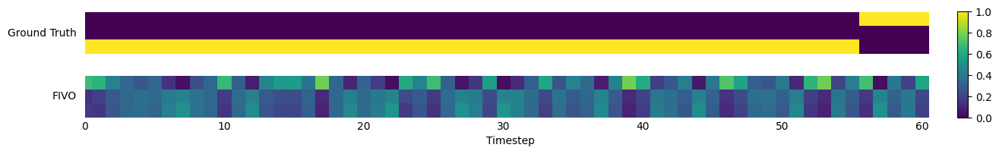

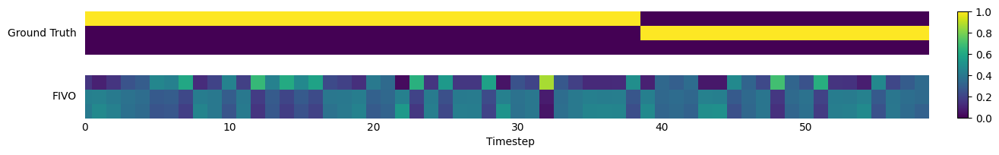

Epoch: [50][2/2]	Time 1.491	Loss 101559.7578	 
Epoch: [100][2/2]	Time 1.456	Loss 76825.7344	 
MSE: 0.26368
Pred MSE: 1.07558


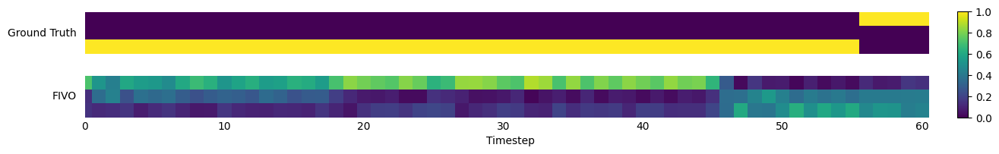

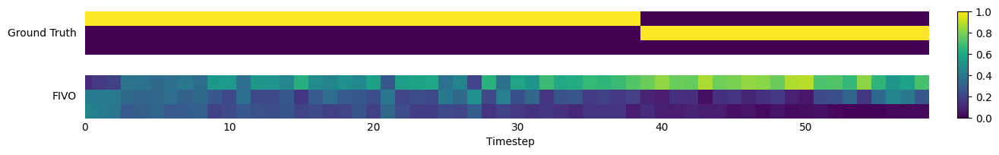

Epoch: [150][2/2]	Time 1.482	Loss 65047.5508	 
Epoch: [200][2/2]	Time 1.493	Loss 60556.1641	 
MSE: 0.23559
Pred MSE: 1.06965


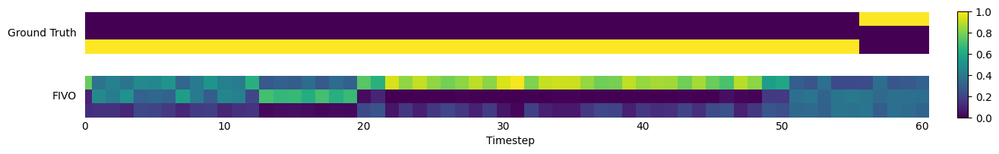

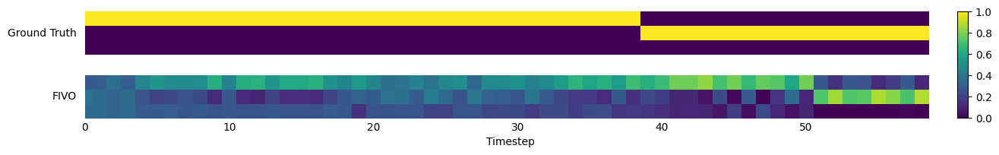

Epoch: [250][2/2]	Time 1.483	Loss 51499.0078	 
Epoch: [300][2/2]	Time 1.473	Loss 48885.1484	 
MSE: 0.21219
Pred MSE: 1.00118


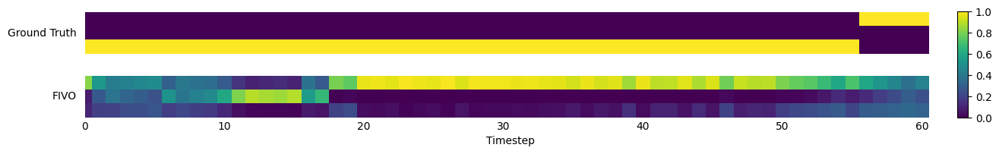

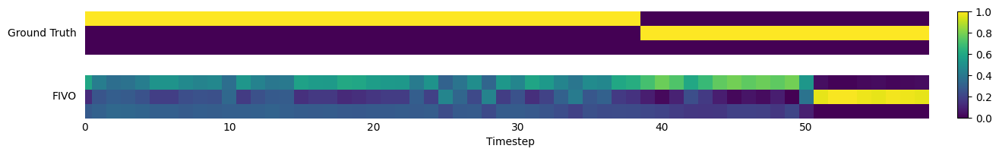

Epoch: [350][2/2]	Time 1.520	Loss 40867.8984	 
Epoch: [400][2/2]	Time 1.473	Loss 34877.7812	 
MSE: 0.20390
Pred MSE: 1.02302


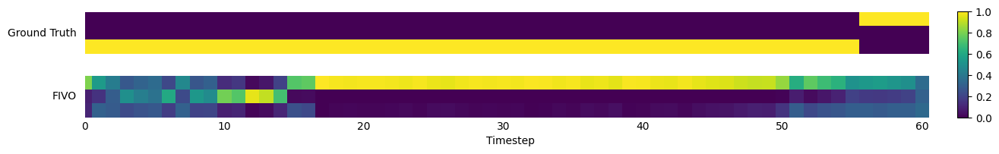

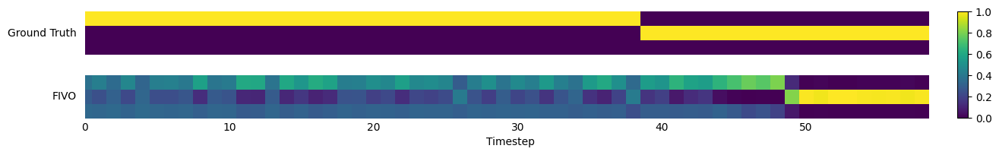

Epoch: [450][2/2]	Time 1.473	Loss 37684.2461	 
Epoch: [500][2/2]	Time 1.489	Loss 36677.3828	 
MSE: 0.20083
Pred MSE: 1.06814


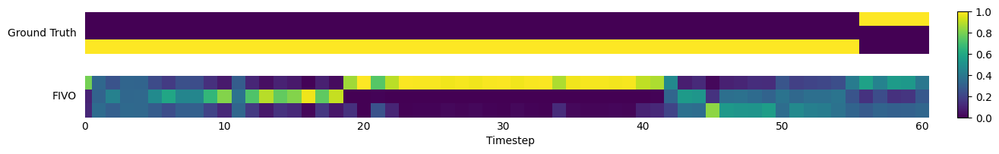

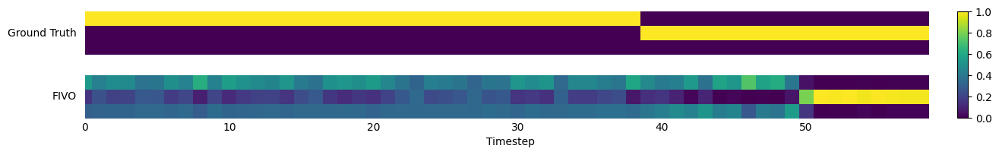

Epoch: [550][2/2]	Time 1.473	Loss 32051.0352	 
Epoch: [600][2/2]	Time 1.538	Loss 36887.9961	 
MSE: 0.20144
Pred MSE: 1.11150


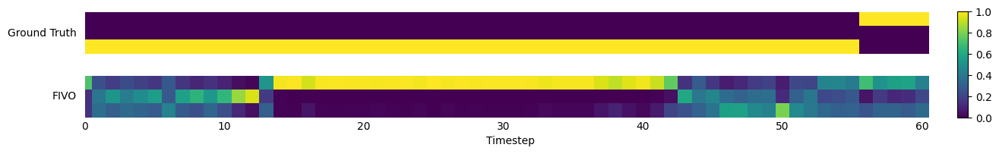

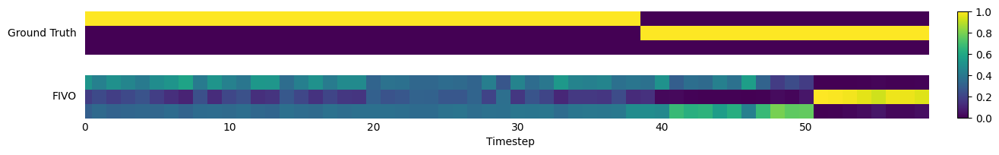

Epoch: [650][2/2]	Time 1.531	Loss 29282.0312	 
Epoch: [700][2/2]	Time 1.471	Loss 27657.7441	 
MSE: 0.19437
Pred MSE: 1.13853


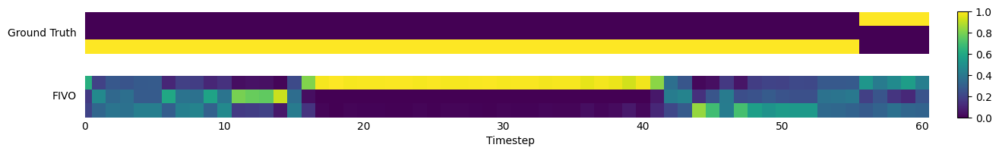

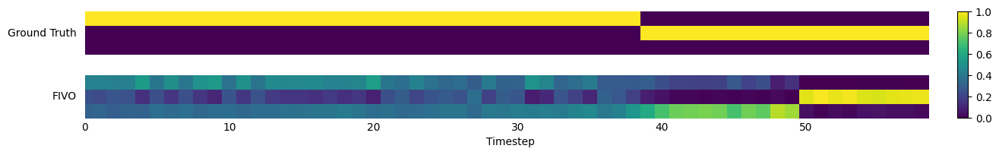

Epoch: [750][2/2]	Time 1.479	Loss 29315.4688	 
Epoch: [800][2/2]	Time 1.490	Loss 25650.8457	 
MSE: 0.19912
Pred MSE: 1.14098


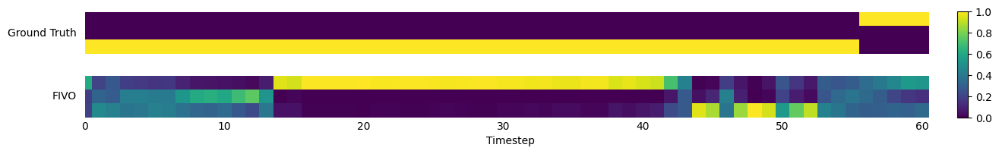

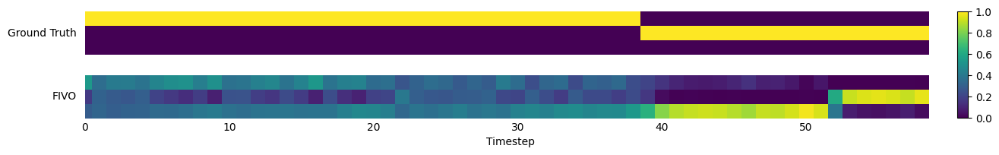

Epoch: [850][2/2]	Time 1.493	Loss 25068.4883	 
Epoch: [900][2/2]	Time 1.464	Loss 24065.1074	 
MSE: 0.20100
Pred MSE: 1.15022


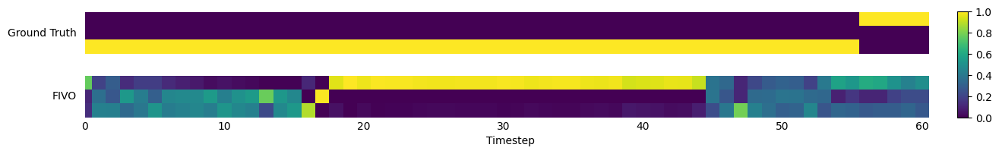

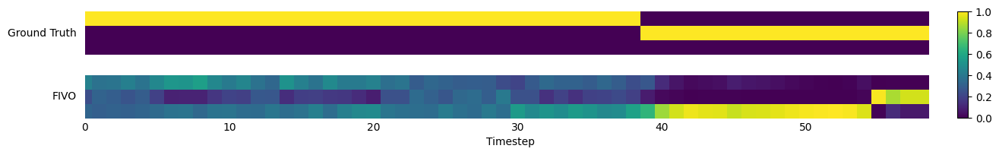

Epoch: [950][2/2]	Time 1.498	Loss 21579.0430	 
Epoch: [1000][2/2]	Time 1.504	Loss 23602.6465	 
MSE: 0.19572
Pred MSE: 1.15273


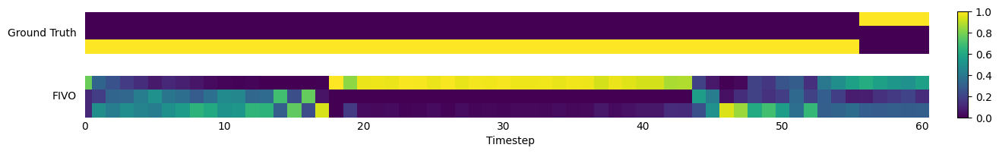

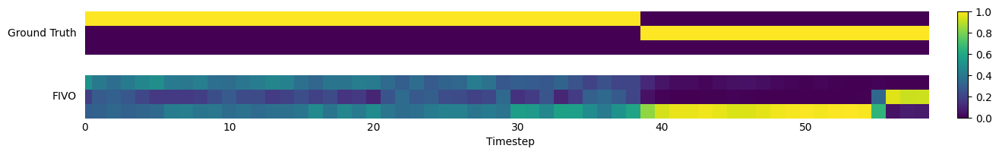

Epoch: [1050][2/2]	Time 1.485	Loss 22085.9746	 
Epoch: [1100][2/2]	Time 1.475	Loss 22251.6992	 
MSE: 0.19104
Pred MSE: 1.15641


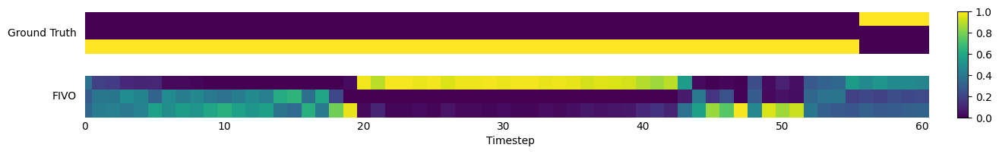

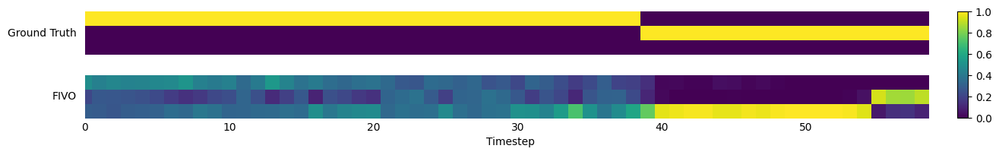

Epoch: [1150][2/2]	Time 1.479	Loss 20425.4219	 
Epoch: [1200][2/2]	Time 1.541	Loss 21115.2461	 
MSE: 0.18653
Pred MSE: 1.14487


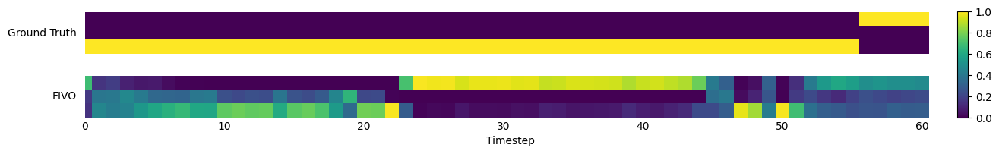

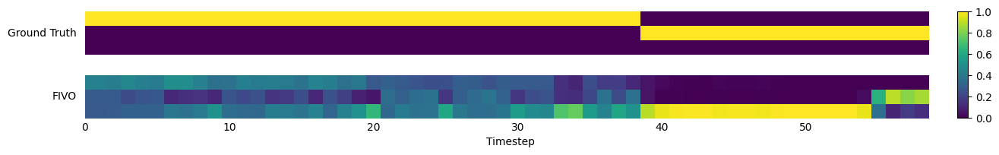

Epoch: [1250][2/2]	Time 1.490	Loss 18214.5078	 
Epoch: [1300][2/2]	Time 1.472	Loss 19719.5625	 
MSE: 0.18298
Pred MSE: 1.14486


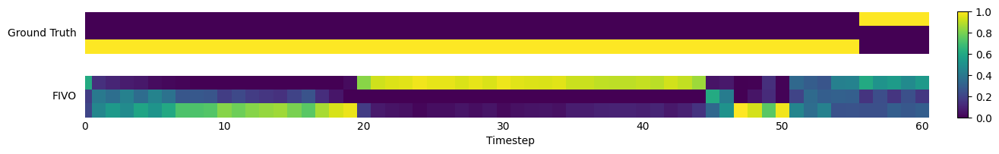

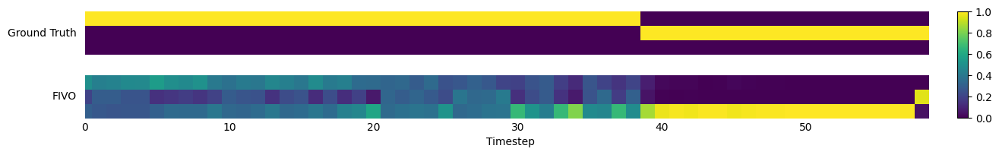

Epoch: [1350][2/2]	Time 1.489	Loss 18255.7383	 
Epoch: [1400][2/2]	Time 1.482	Loss 17952.0879	 
MSE: 0.19284
Pred MSE: 1.13387


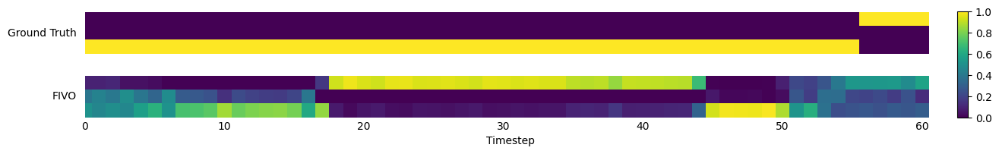

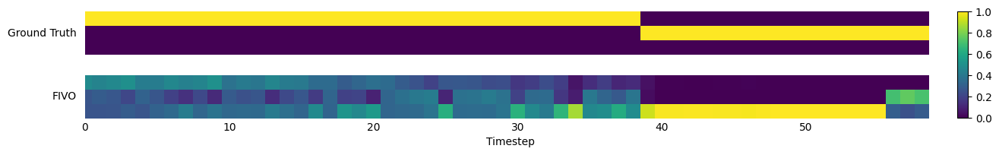

Epoch: [1450][2/2]	Time 1.470	Loss 17961.9883	 
Epoch: [1500][2/2]	Time 1.511	Loss 17237.4863	 
MSE: 0.18129
Pred MSE: 1.14019


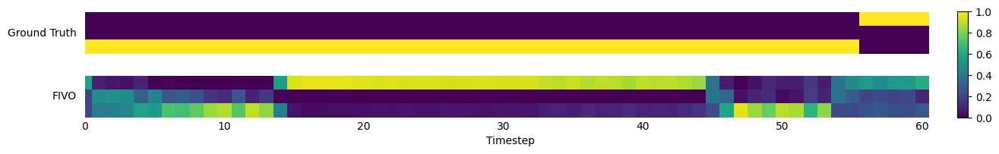

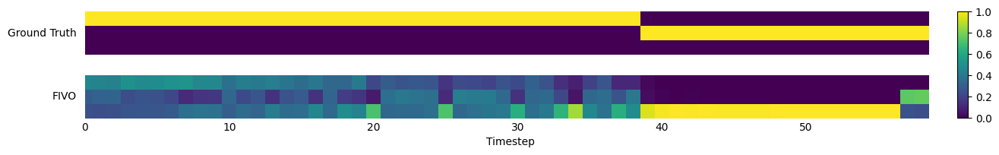

Epoch: [1550][2/2]	Time 1.519	Loss 15529.8027	 
Epoch: [1600][2/2]	Time 1.472	Loss 14586.1689	 
MSE: 0.16549
Pred MSE: 1.12279


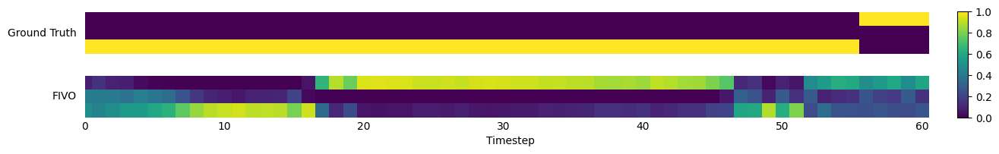

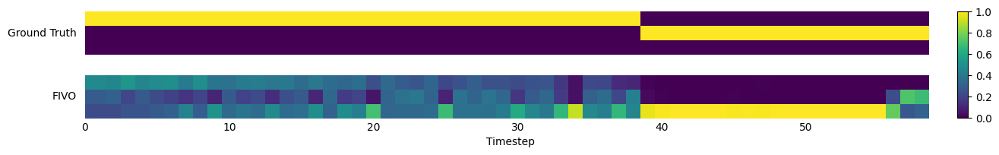

Epoch: [1650][2/2]	Time 1.483	Loss 14473.8232	 
Epoch: [1700][2/2]	Time 1.465	Loss 14217.5596	 
MSE: 0.16216
Pred MSE: 1.11998


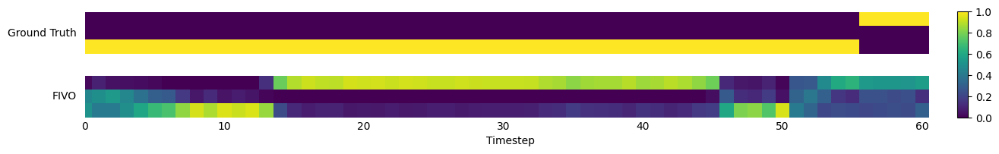

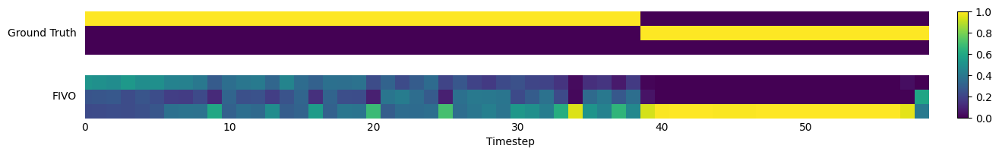

Epoch: [1750][2/2]	Time 1.491	Loss 15065.6426	 
Epoch: [1800][2/2]	Time 1.479	Loss 13962.8574	 
MSE: 0.15958
Pred MSE: 1.12376


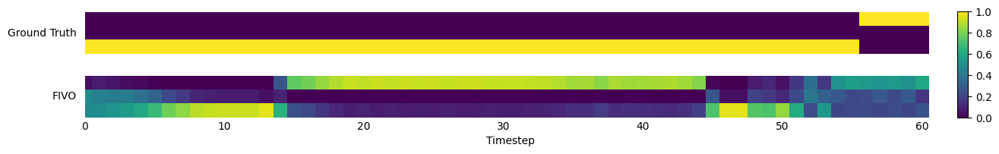

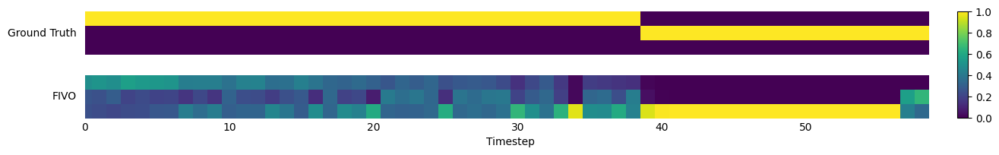

Epoch: [1850][2/2]	Time 1.623	Loss 13644.5625	 
Epoch: [1900][2/2]	Time 1.514	Loss 13950.0449	 
MSE: 0.17157
Pred MSE: 1.12807


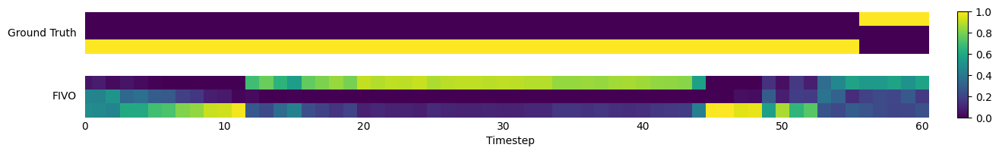

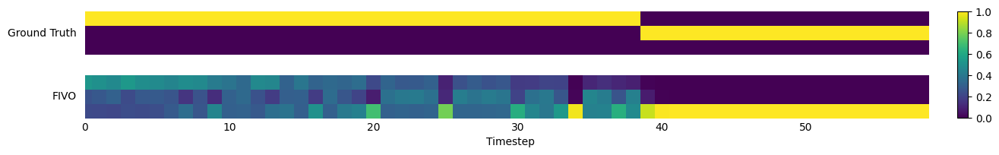

Epoch: [1950][2/2]	Time 1.483	Loss 13930.1670	 
Epoch: [2000][2/2]	Time 1.509	Loss 13457.9795	 
MSE: 0.16029
Pred MSE: 1.13455


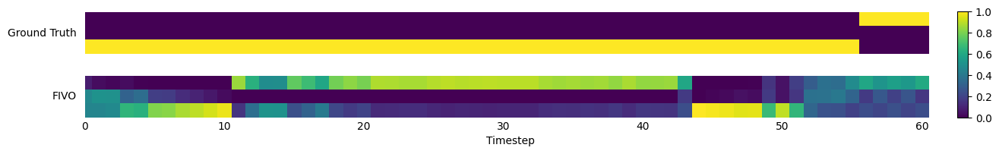

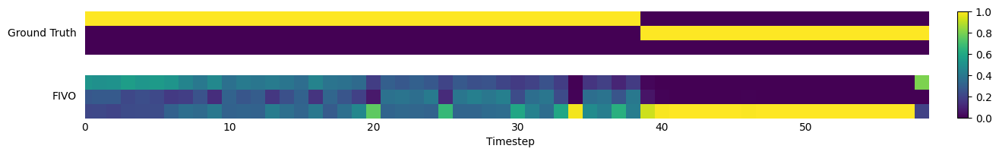

Epoch: [2050][2/2]	Time 1.504	Loss 15302.7090	 
Epoch: [2100][2/2]	Time 1.511	Loss 12859.6729	 
MSE: 0.16652
Pred MSE: 1.12442


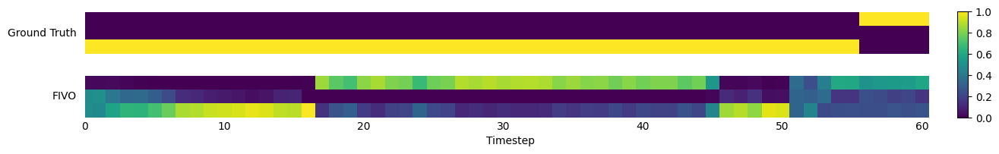

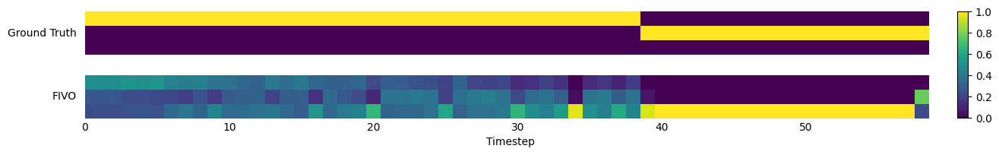

Epoch: [2150][2/2]	Time 1.539	Loss 14955.7939	 
Epoch: [2200][2/2]	Time 1.505	Loss 14780.5264	 
MSE: 0.16326
Pred MSE: 1.14158


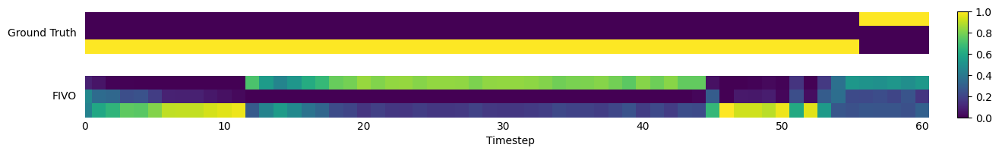

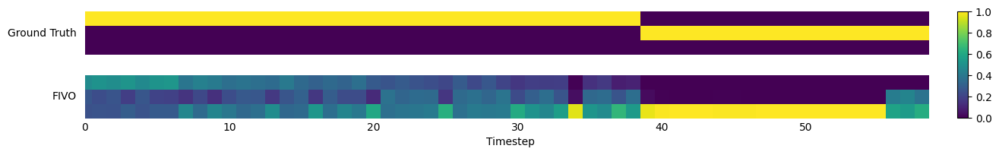

Epoch: [2250][2/2]	Time 1.523	Loss 12425.5459	 
Epoch: [2300][2/2]	Time 1.503	Loss 13248.1514	 
MSE: 0.15302
Pred MSE: 1.14455


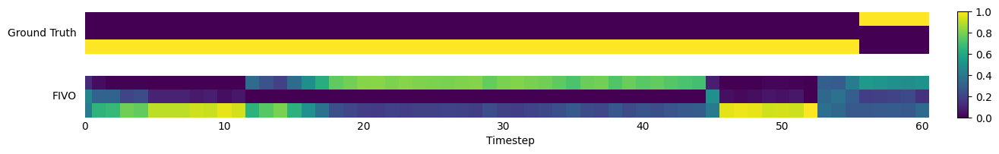

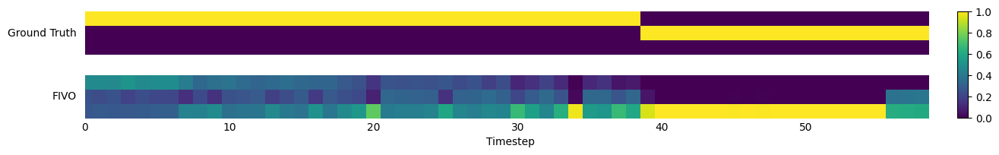

Epoch: [2350][2/2]	Time 1.538	Loss 12344.3770	 
Epoch: [2400][2/2]	Time 1.512	Loss 12790.3125	 
MSE: 0.15226
Pred MSE: 1.15650


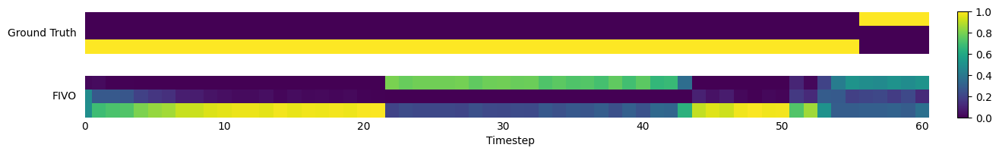

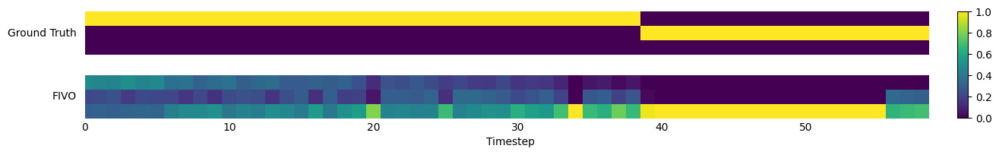

Epoch: [2450][2/2]	Time 1.546	Loss 10844.7754	 
Epoch: [2500][2/2]	Time 1.532	Loss 11421.4814	 
MSE: 0.16518
Pred MSE: 1.14650


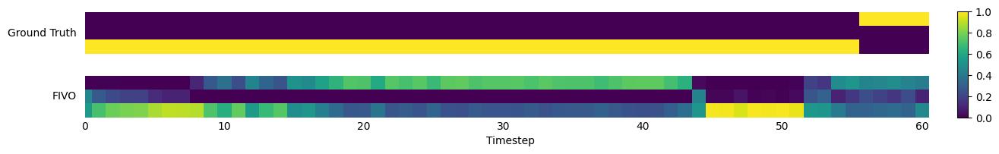

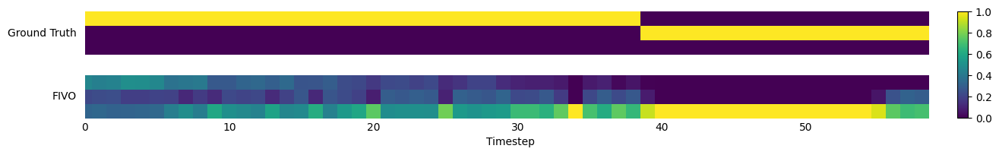

Epoch: [2550][2/2]	Time 1.514	Loss 11217.8506	 
Epoch: [2600][2/2]	Time 1.516	Loss 11952.9824	 
MSE: 0.14703
Pred MSE: 1.15893


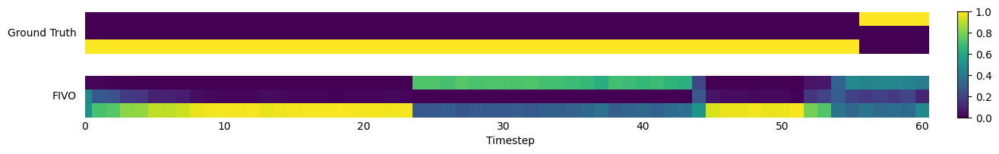

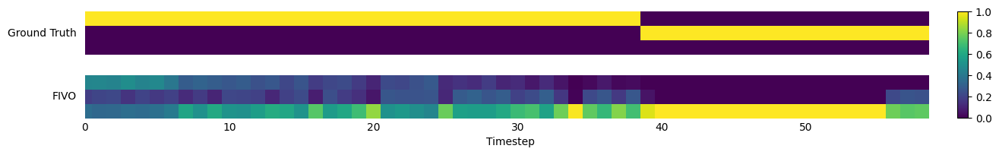

Epoch: [2650][2/2]	Time 1.483	Loss 12605.2344	 
Epoch: [2700][2/2]	Time 1.559	Loss 12586.3193	 
MSE: 0.15357
Pred MSE: 1.16466


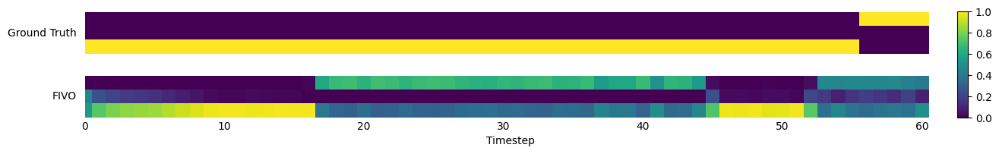

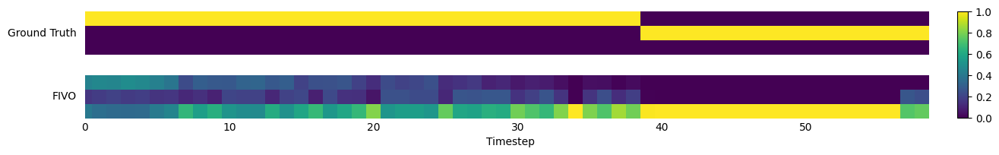

Epoch: [2750][2/2]	Time 1.538	Loss 11713.0898	 
Epoch: [2800][2/2]	Time 1.522	Loss 11090.8428	 
MSE: 0.15757
Pred MSE: 1.17261


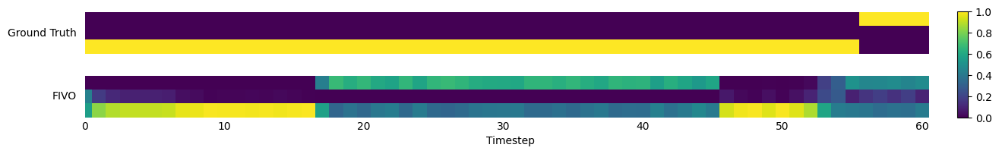

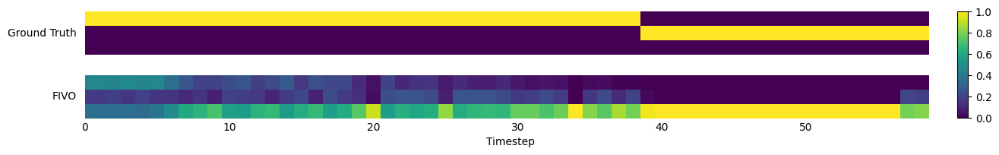

Epoch: [2850][2/2]	Time 1.559	Loss 10544.5146	 
Epoch: [2900][2/2]	Time 1.502	Loss 9842.8027	 
MSE: 0.15298
Pred MSE: 1.17801


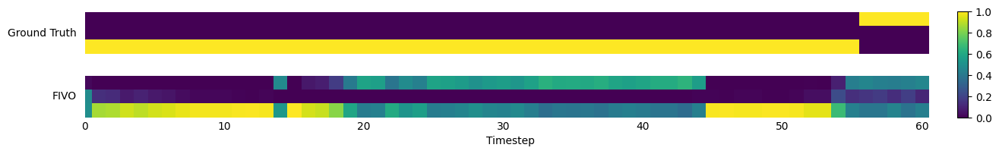

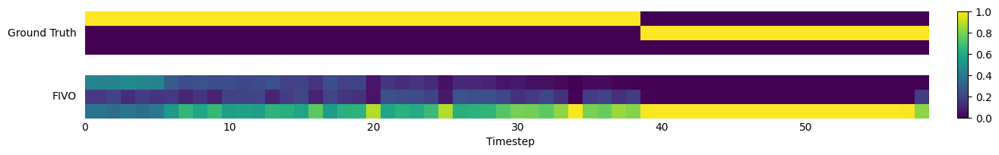

Epoch: [2950][2/2]	Time 1.644	Loss 10856.3057	 
Epoch: [3000][2/2]	Time 1.535	Loss 9636.0449	 
MSE: 0.15513
Pred MSE: 1.18036


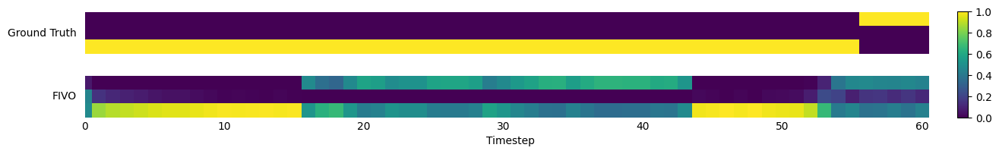

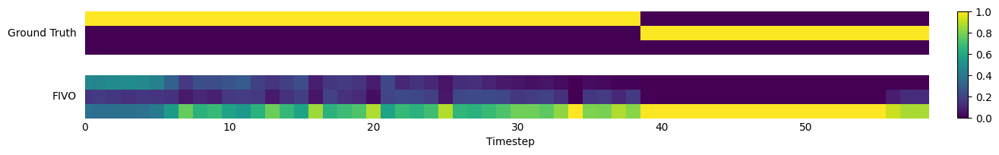

Epoch: [3050][2/2]	Time 1.526	Loss 10043.3096	 
Epoch: [3100][2/2]	Time 1.531	Loss 11067.2734	 
MSE: 0.15827
Pred MSE: 1.18445


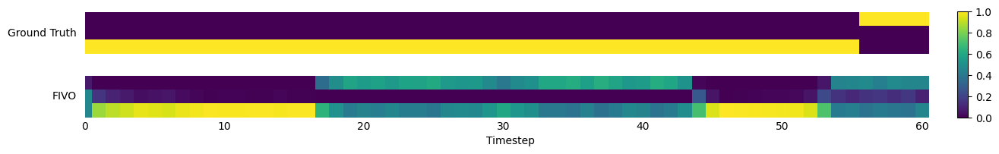

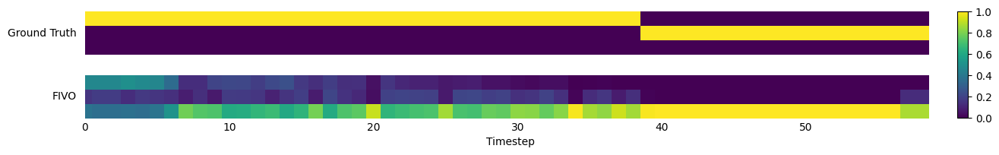

Epoch: [3150][2/2]	Time 1.532	Loss 10103.2363	 
Epoch: [3200][2/2]	Time 1.558	Loss 10567.0508	 
MSE: 0.14720
Pred MSE: 1.19109


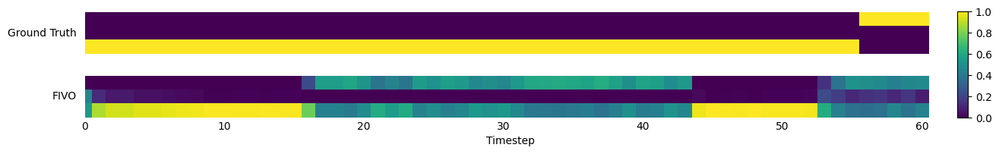

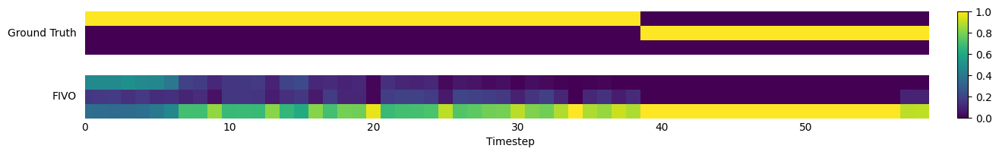

Epoch: [3250][2/2]	Time 1.520	Loss 8967.3203	 
Epoch: [3300][2/2]	Time 1.523	Loss 10076.0869	 
MSE: 0.15205
Pred MSE: 1.18437


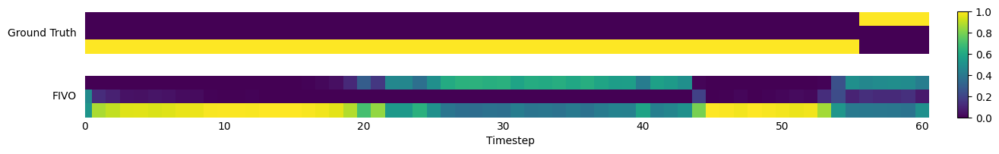

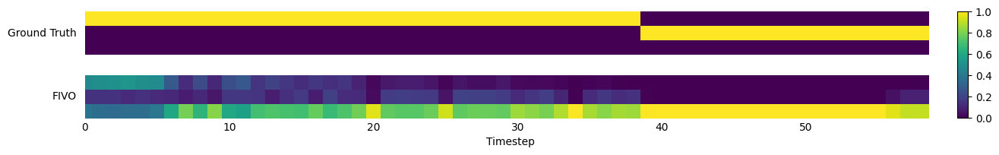

Epoch: [3350][2/2]	Time 1.523	Loss 9208.6660	 
Epoch: [3400][2/2]	Time 1.530	Loss 9458.4746	 
MSE: 0.15188
Pred MSE: 1.18203


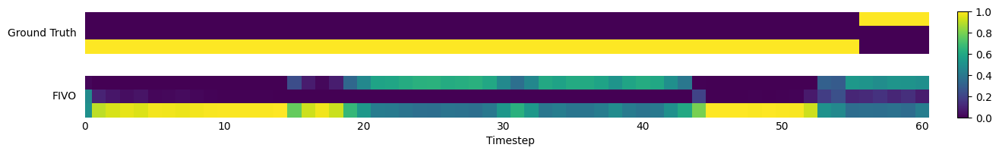

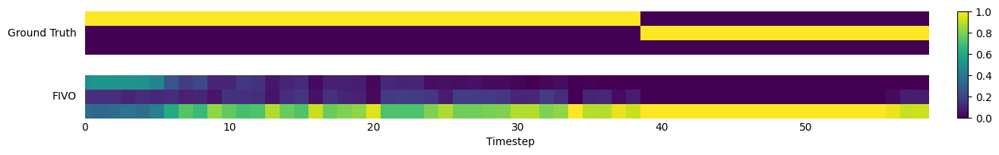

Epoch: [3450][2/2]	Time 1.561	Loss 8946.7627	 
Epoch: [3500][2/2]	Time 1.502	Loss 9403.5850	 
MSE: 0.15949
Pred MSE: 1.18372


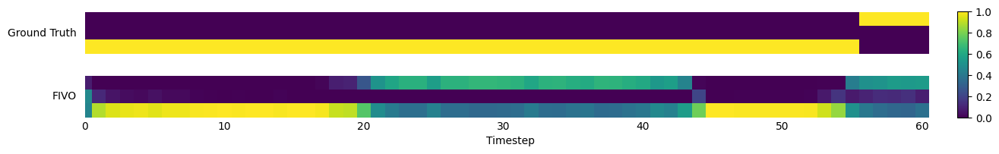

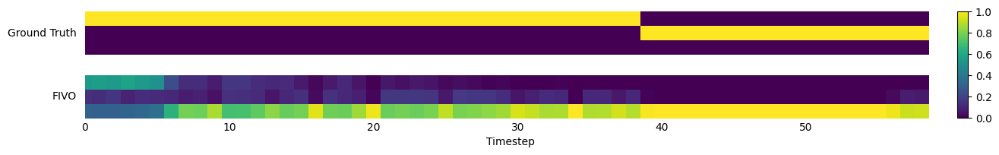

Epoch: [3550][2/2]	Time 1.552	Loss 9624.3350	 
Epoch: [3600][2/2]	Time 1.513	Loss 9618.0020	 
MSE: 0.16231
Pred MSE: 1.19049


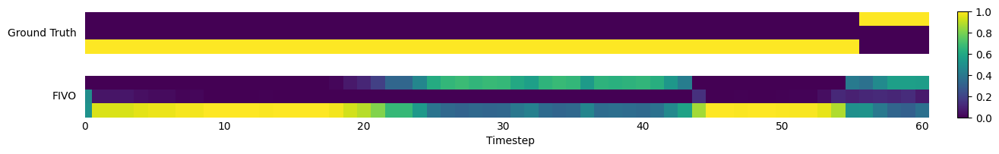

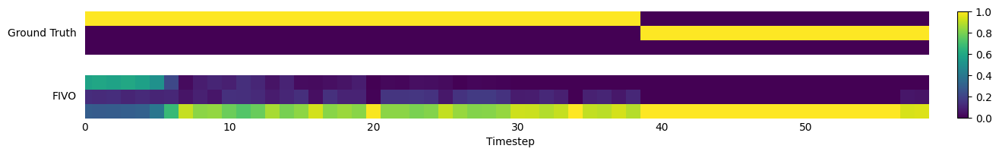

Epoch: [3650][2/2]	Time 1.500	Loss 8595.0430	 
Epoch: [3700][2/2]	Time 1.505	Loss 10095.6895	 
MSE: 0.14853
Pred MSE: 1.19029


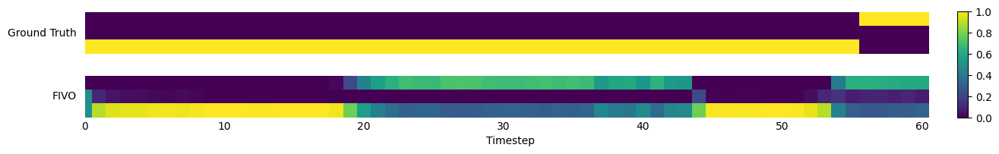

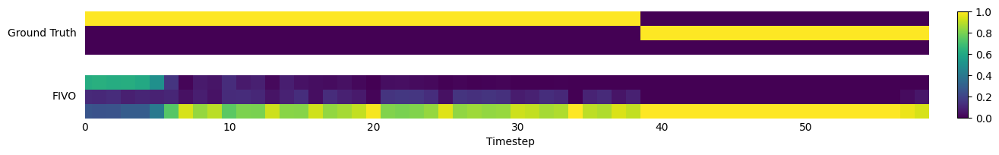

Epoch: [3750][2/2]	Time 1.500	Loss 9257.0107	 
Epoch: [3800][2/2]	Time 1.553	Loss 9826.3105	 
MSE: 0.15345
Pred MSE: 1.19120


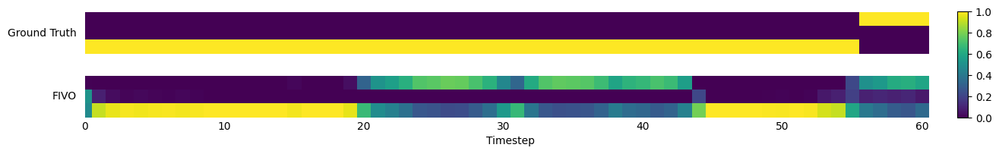

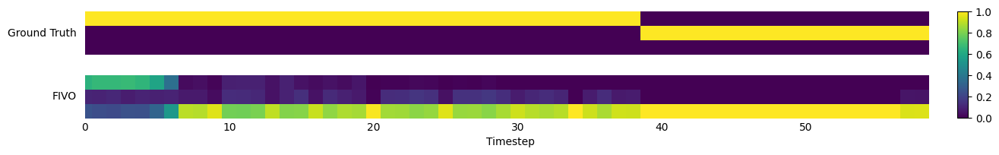

Epoch: [3850][2/2]	Time 1.509	Loss 7695.8701	 
Epoch: [3900][2/2]	Time 1.528	Loss 8932.3340	 
MSE: 0.14708
Pred MSE: 1.19184


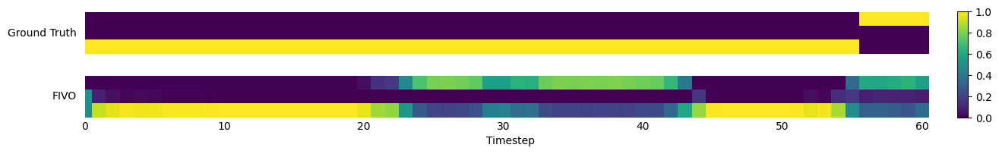

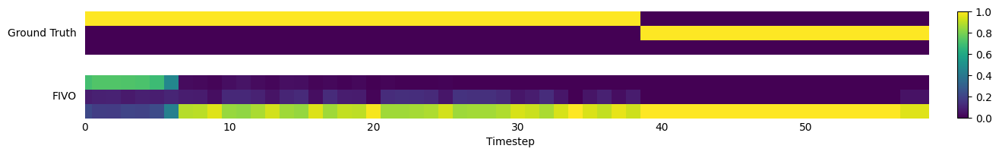

Epoch: [3950][2/2]	Time 1.544	Loss 9092.7373	 
Epoch: [4000][2/2]	Time 1.520	Loss 10230.4111	 
MSE: 0.15904
Pred MSE: 1.19084


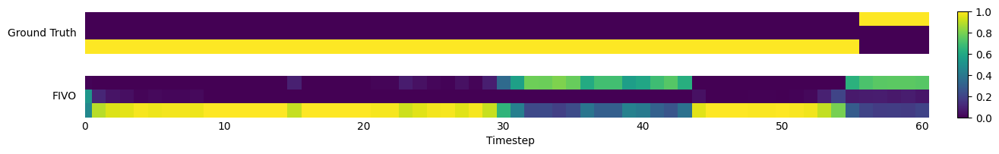

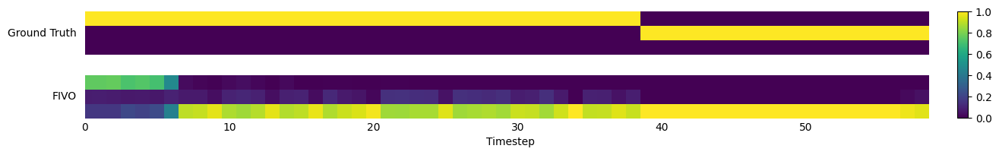

Epoch: [4050][2/2]	Time 1.541	Loss 9357.2803	 
Epoch: [4100][2/2]	Time 1.526	Loss 9344.7451	 
MSE: 0.15499
Pred MSE: 1.19811


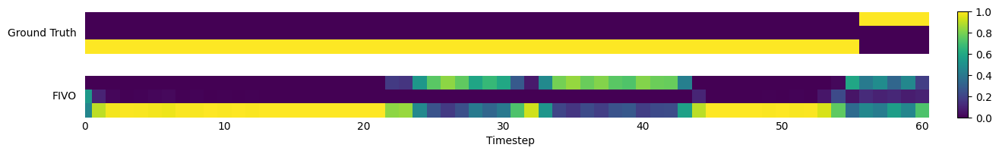

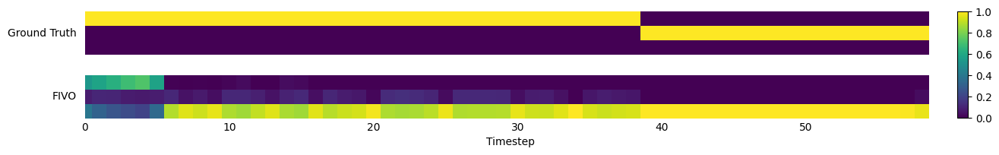

Epoch: [4150][2/2]	Time 1.555	Loss 7888.5649	 
Epoch: [4200][2/2]	Time 1.524	Loss 9715.4121	 
MSE: 0.14675
Pred MSE: 1.17299


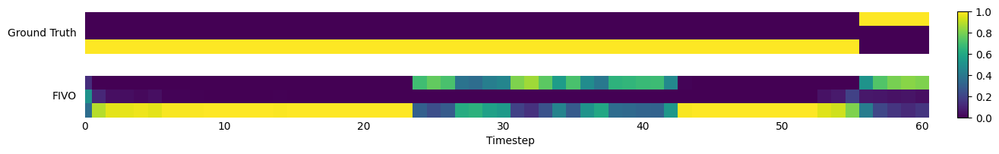

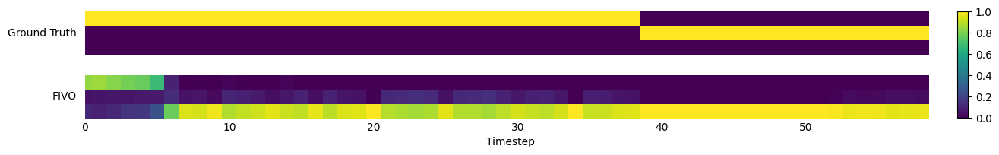

Epoch: [4250][2/2]	Time 1.542	Loss 9283.8584	 
Epoch: [4300][2/2]	Time 1.536	Loss 8176.4414	 
MSE: 0.14797
Pred MSE: 1.18558


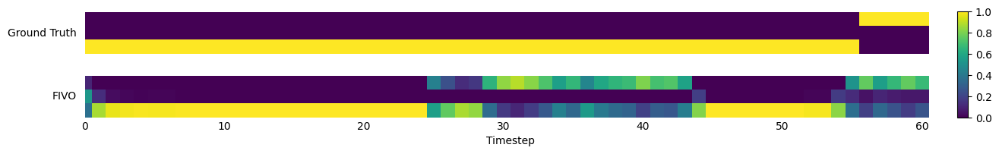

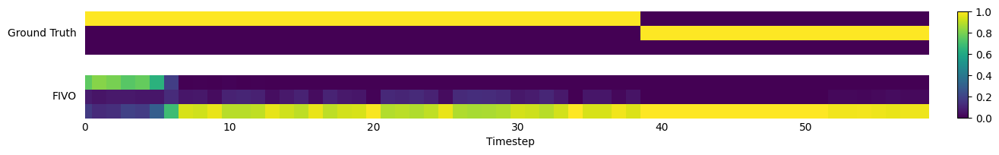

Epoch: [4350][2/2]	Time 1.638	Loss 9527.9004	 
Epoch: [4400][2/2]	Time 1.522	Loss 8019.4478	 
MSE: 0.14100
Pred MSE: 1.18716


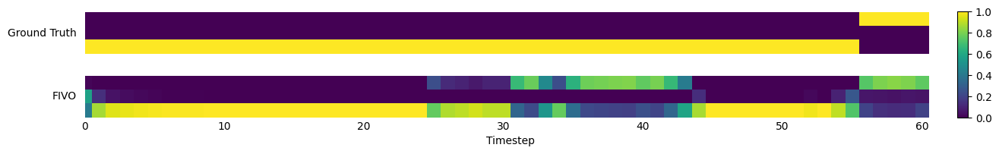

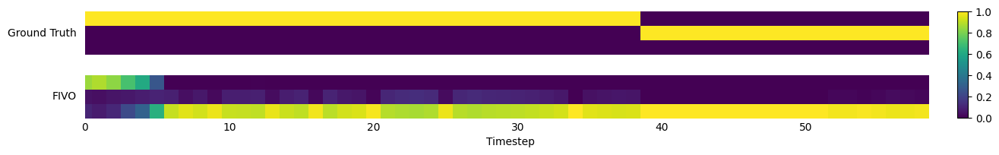

Epoch: [4450][2/2]	Time 1.494	Loss 8011.6338	 
Epoch: [4500][2/2]	Time 1.523	Loss 8630.6826	 
MSE: 0.14315
Pred MSE: 1.19087


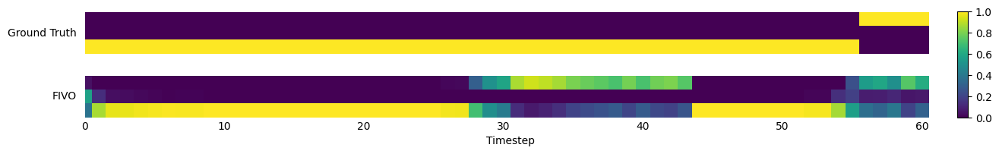

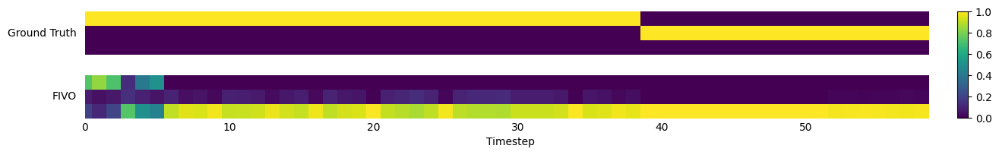

Epoch: [4550][2/2]	Time 1.522	Loss 8589.7939	 
Epoch: [4600][2/2]	Time 1.503	Loss 11190.7012	 
MSE: 0.15680
Pred MSE: 1.18473


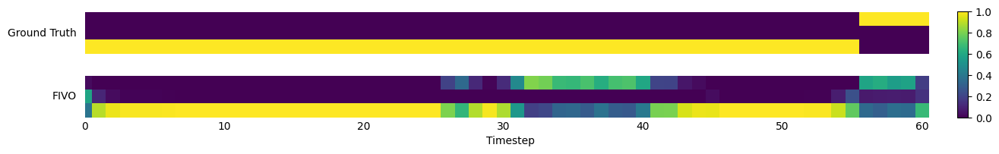

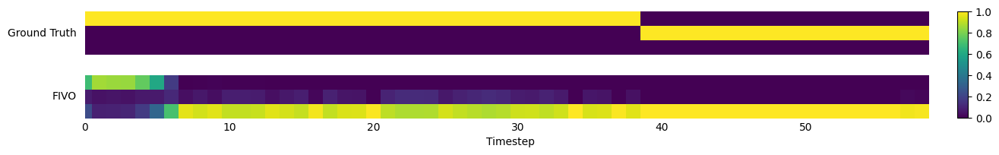

Epoch: [4650][2/2]	Time 1.558	Loss 9114.4424	 
Epoch: [4700][2/2]	Time 1.525	Loss 8149.3906	 
MSE: 0.14098
Pred MSE: 1.18799


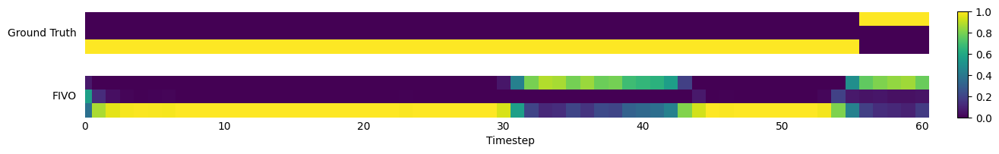

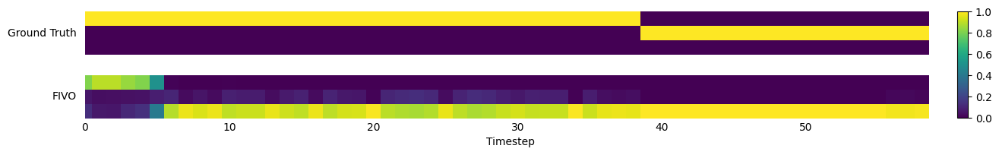

Epoch: [4750][2/2]	Time 1.616	Loss 8038.3906	 
Epoch: [4800][2/2]	Time 1.548	Loss 7985.1782	 
MSE: 0.14889
Pred MSE: 1.17830


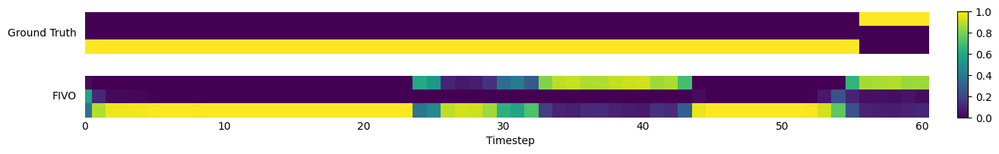

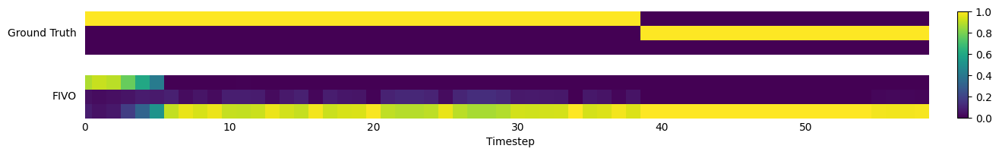

Epoch: [4850][2/2]	Time 1.531	Loss 8396.0576	 
Epoch: [4900][2/2]	Time 1.528	Loss 8817.5762	 
MSE: 0.14681
Pred MSE: 1.17409


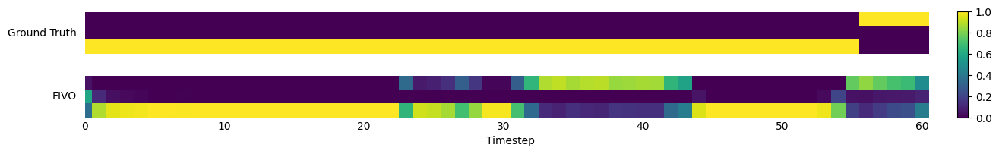

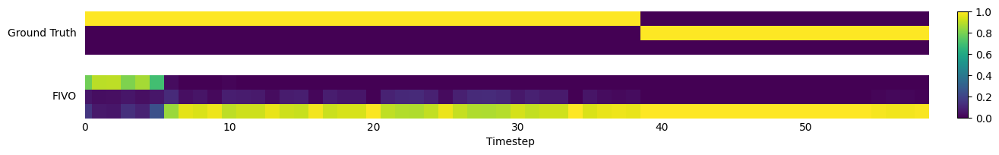

Epoch: [4950][2/2]	Time 1.520	Loss 7050.4624	 
Epoch: [5000][2/2]	Time 1.529	Loss 7267.9634	 
MSE: 0.14077
Pred MSE: 1.17094


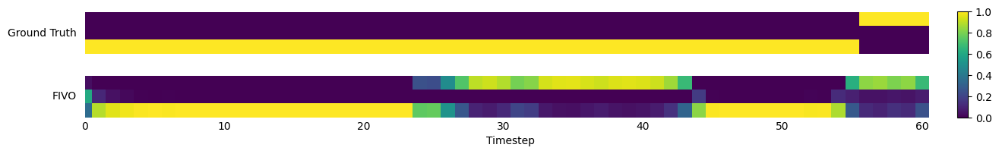

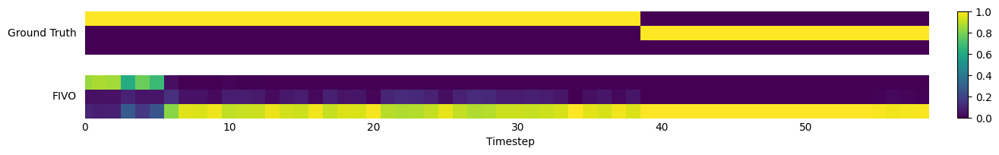

Epoch: [5050][2/2]	Time 1.521	Loss 7472.9717	 
Epoch: [5100][2/2]	Time 1.516	Loss 7855.3032	 
MSE: 0.14429
Pred MSE: 1.16761


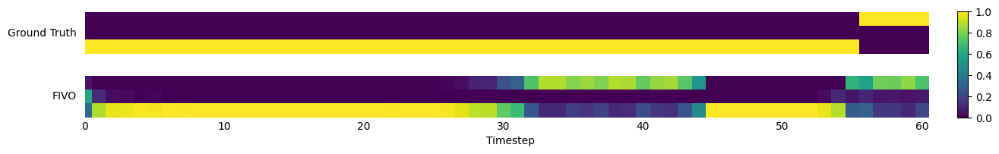

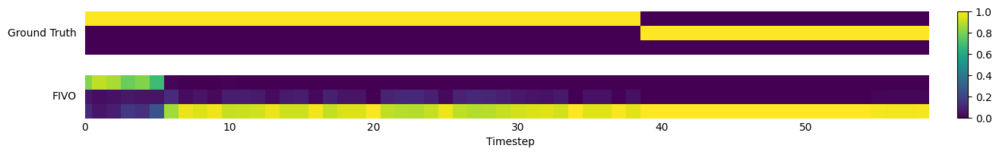

Epoch: [5150][2/2]	Time 1.570	Loss 8758.7764	 
Epoch: [5200][2/2]	Time 1.536	Loss 7788.1343	 
MSE: 0.14619
Pred MSE: 1.17881


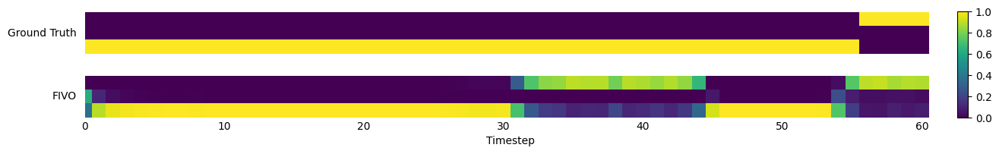

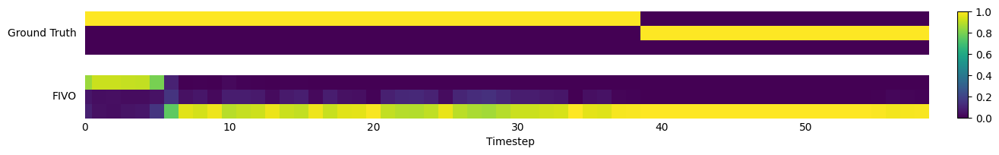

Epoch: [5250][2/2]	Time 1.514	Loss 7559.8540	 
Epoch: [5300][2/2]	Time 1.519	Loss 7895.8564	 
MSE: 0.15553
Pred MSE: 1.16222


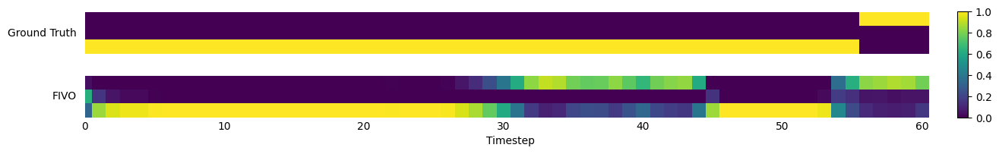

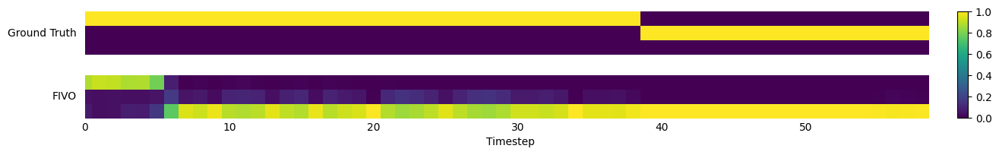

Epoch: [5350][2/2]	Time 1.536	Loss 8806.9199	 
Epoch: [5400][2/2]	Time 1.575	Loss 8151.0264	 
MSE: 0.14720
Pred MSE: 1.18036


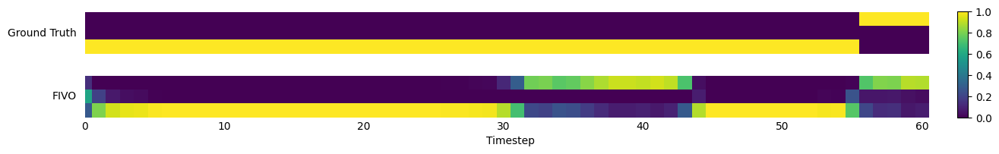

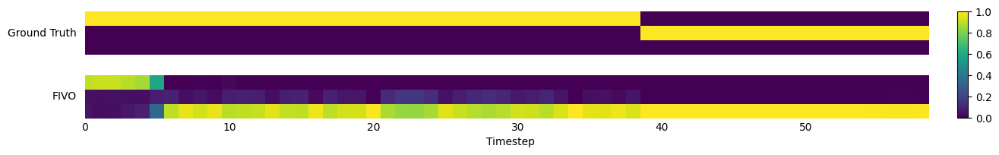

Epoch: [5450][2/2]	Time 1.657	Loss 7688.6851	 
Epoch: [5500][2/2]	Time 1.520	Loss 7617.8486	 
MSE: 0.14572
Pred MSE: 1.17309


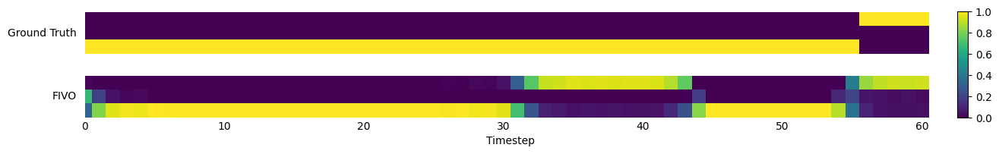

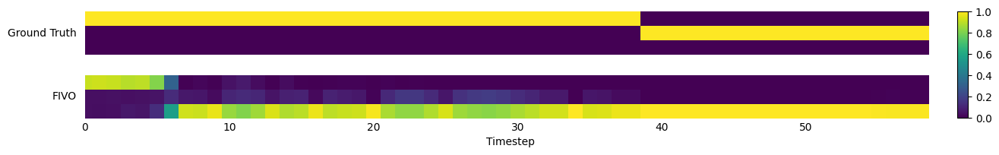

Epoch: [5550][2/2]	Time 1.672	Loss 7830.4346	 
Epoch: [5600][2/2]	Time 1.523	Loss 7047.4971	 
MSE: 0.14910
Pred MSE: 1.18190


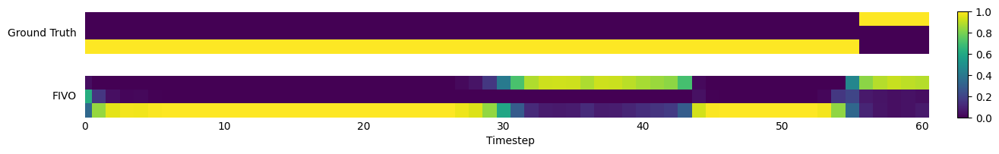

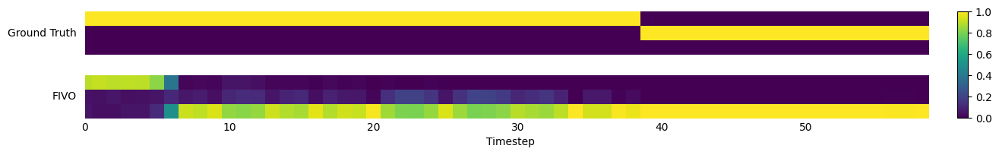

Epoch: [5650][2/2]	Time 1.520	Loss 7136.9897	 
Epoch: [5700][2/2]	Time 1.528	Loss 6123.5195	 
MSE: 0.14533
Pred MSE: 1.16662


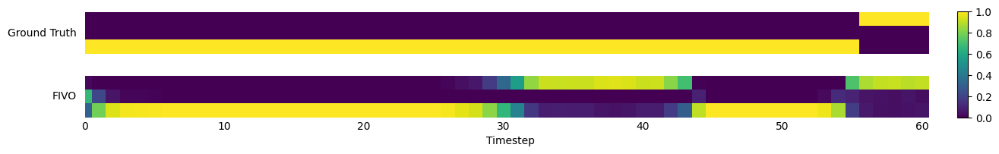

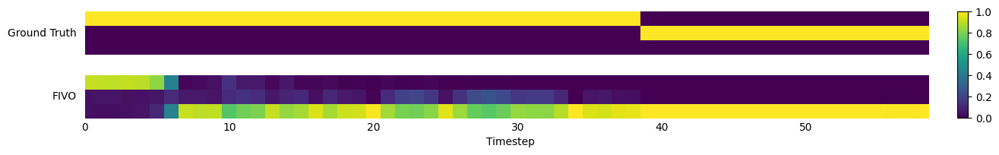

Epoch: [5750][2/2]	Time 1.616	Loss 8126.6992	 
Epoch: [5800][2/2]	Time 1.508	Loss 8491.1367	 
MSE: 0.15352
Pred MSE: 1.16921


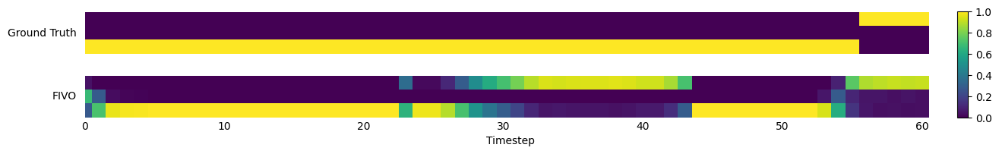

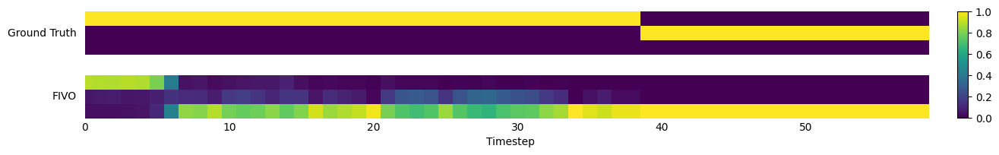

Epoch: [5850][2/2]	Time 1.657	Loss 9703.8135	 
Epoch: [5900][2/2]	Time 1.538	Loss 8073.8955	 
MSE: 0.16770
Pred MSE: 1.16091


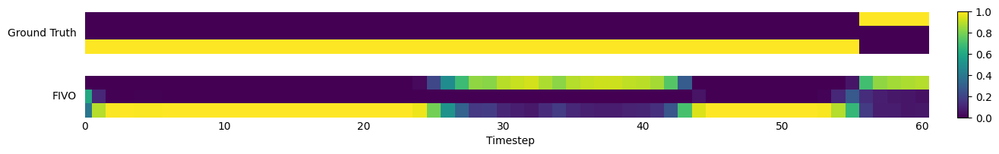

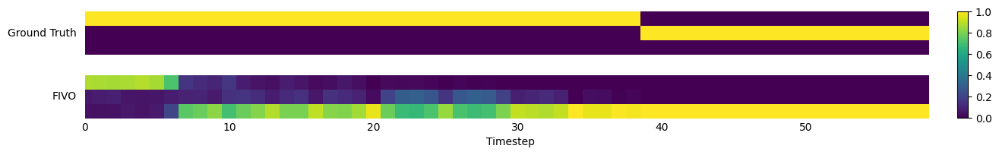

Epoch: [5950][2/2]	Time 1.668	Loss 7551.7217	 
Epoch: [6000][2/2]	Time 1.495	Loss 7356.2837	 
MSE: 0.16485
Pred MSE: 1.16261


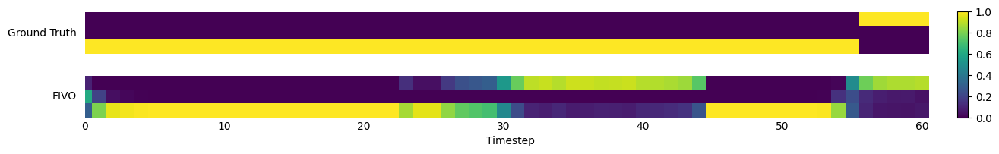

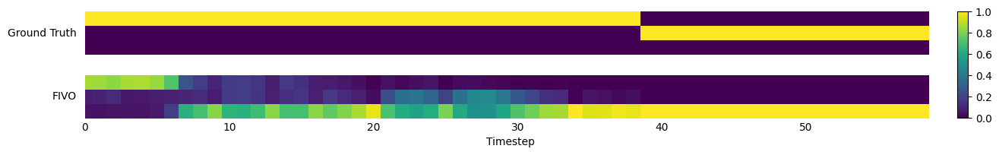

Epoch: [6050][2/2]	Time 1.510	Loss 6377.9351	 
Epoch: [6100][2/2]	Time 1.531	Loss 6924.7397	 
MSE: 0.16294
Pred MSE: 1.15331


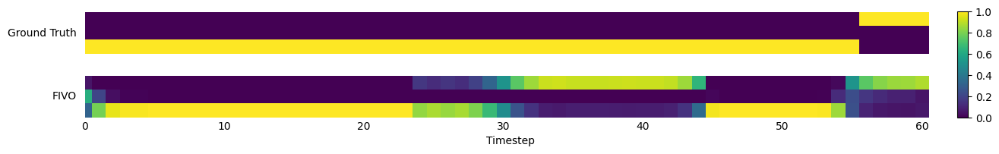

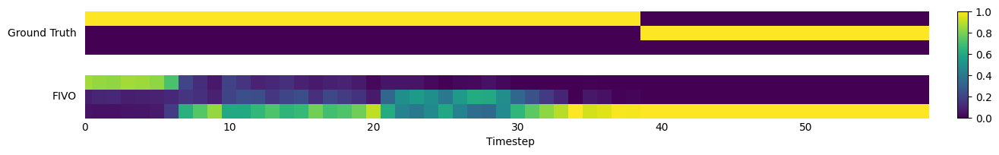

Epoch: [6150][2/2]	Time 1.537	Loss 7337.0469	 
Epoch: [6200][2/2]	Time 1.508	Loss 6831.0010	 
MSE: 0.16048
Pred MSE: 1.15213


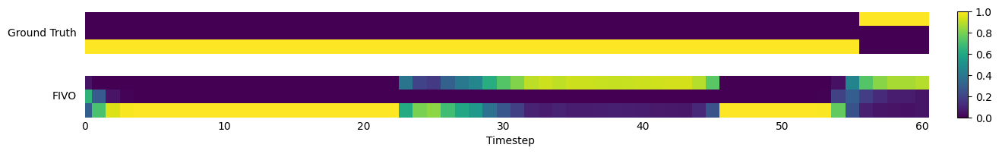

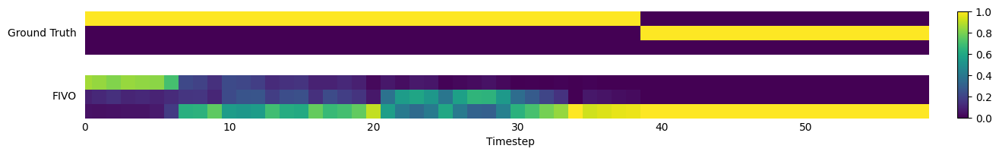

Epoch: [6250][2/2]	Time 1.639	Loss 6678.7031	 
Epoch: [6300][2/2]	Time 1.553	Loss 7492.3477	 
MSE: 0.16598
Pred MSE: 1.15385


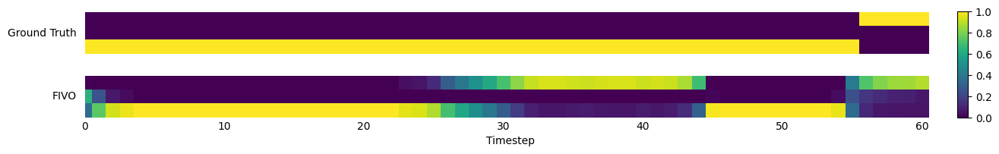

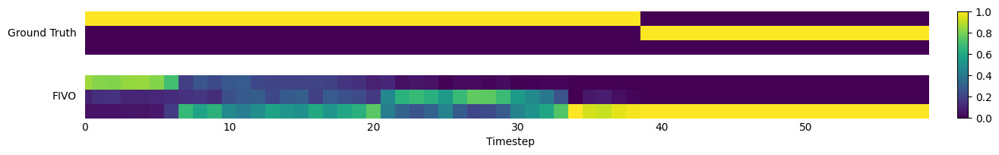

Epoch: [6350][2/2]	Time 1.517	Loss 7099.1611	 
Epoch: [6400][2/2]	Time 1.532	Loss 6696.9580	 
MSE: 0.16003
Pred MSE: 1.14669


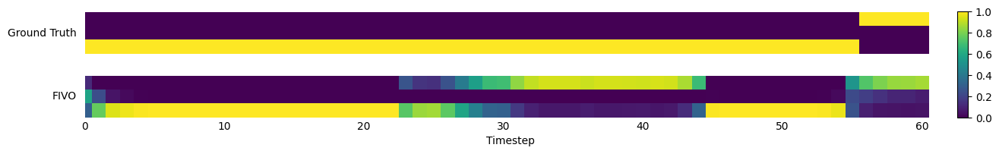

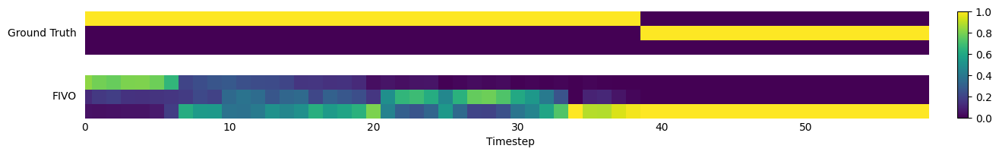

Epoch: [6450][2/2]	Time 1.508	Loss 7356.0850	 
Epoch: [6500][2/2]	Time 1.504	Loss 7202.0771	 
MSE: 0.16428
Pred MSE: 1.16120


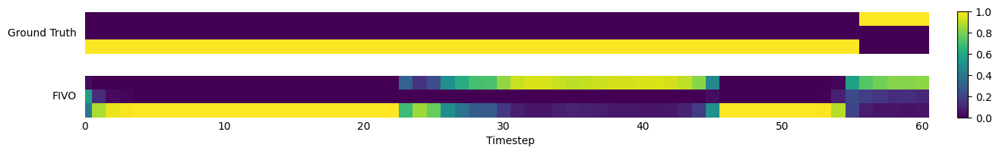

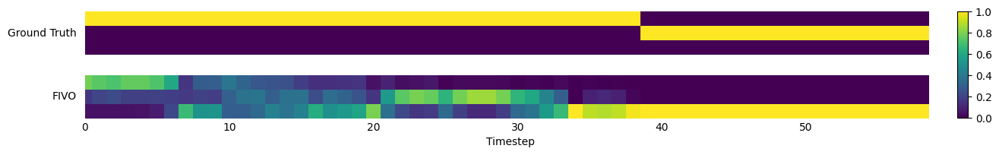

Epoch: [6550][2/2]	Time 1.712	Loss 6845.0186	 
Epoch: [6600][2/2]	Time 1.530	Loss 6848.8096	 
MSE: 0.16415
Pred MSE: 1.14527


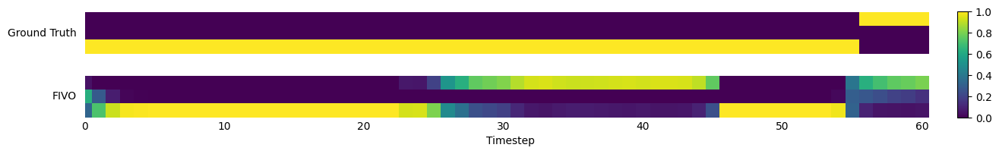

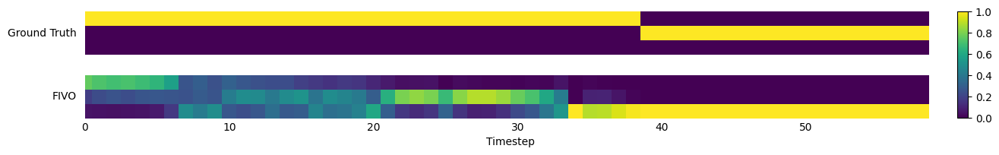

Epoch: [6650][2/2]	Time 1.609	Loss 8159.6826	 
Epoch: [6700][2/2]	Time 1.497	Loss 6270.2437	 
MSE: 0.16165
Pred MSE: 1.13372


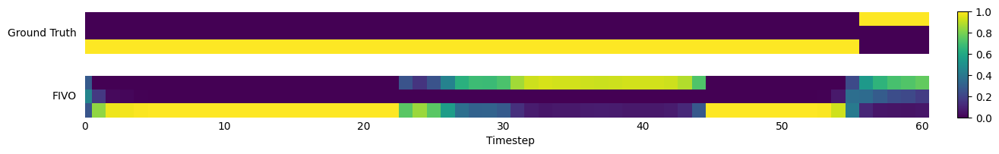

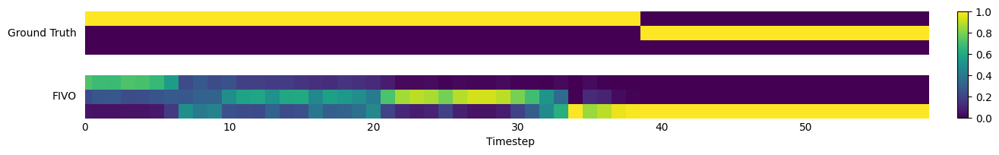

Epoch: [6750][2/2]	Time 1.523	Loss 8338.9902	 
Epoch: [6800][2/2]	Time 1.526	Loss 7910.8330	 
MSE: 0.16190
Pred MSE: 1.15227


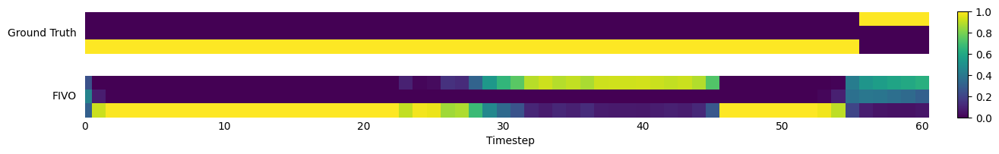

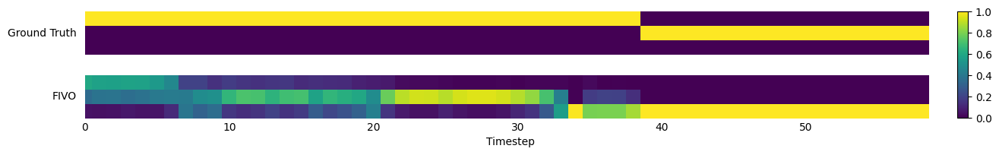

Epoch: [6850][2/2]	Time 1.550	Loss 8215.4326	 
Epoch: [6900][2/2]	Time 1.504	Loss 7195.2217	 
MSE: 0.15255
Pred MSE: 1.14265


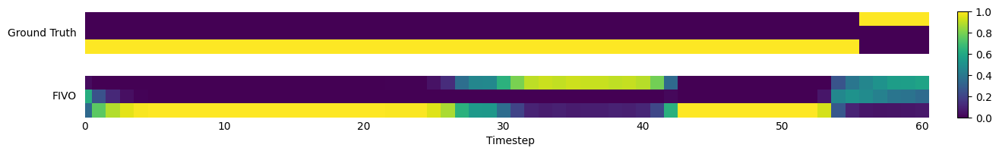

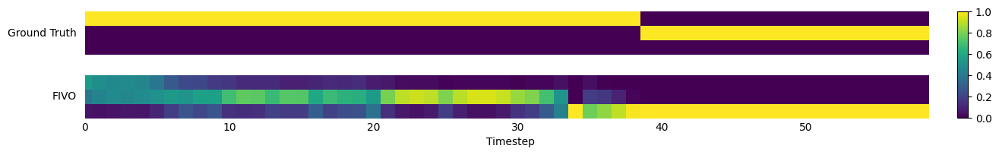

Epoch: [6950][2/2]	Time 1.635	Loss 6331.0356	 
Epoch: [7000][2/2]	Time 1.533	Loss 7195.1143	 
MSE: 0.14422
Pred MSE: 1.13929


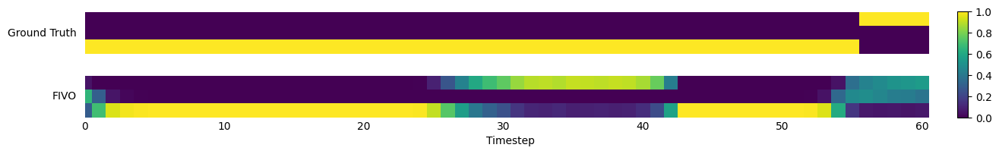

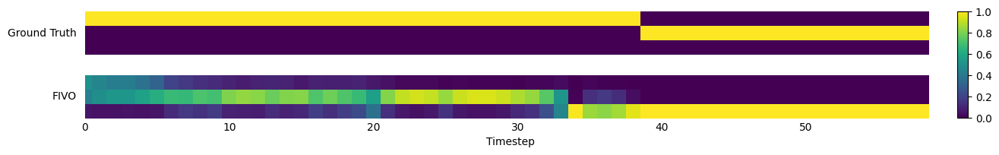

Epoch: [7050][2/2]	Time 1.531	Loss 6876.1299	 
Epoch: [7100][2/2]	Time 1.563	Loss 8428.8369	 
MSE: 0.14303
Pred MSE: 1.12540


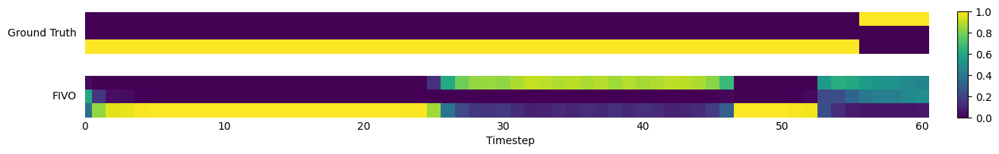

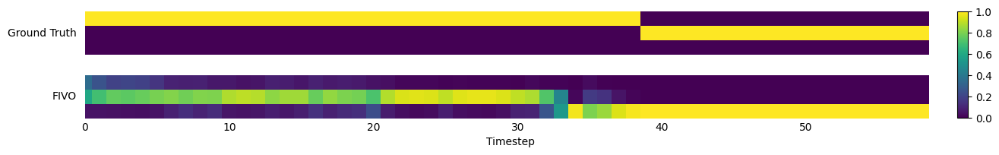

Epoch: [7150][2/2]	Time 1.550	Loss 7121.1338	 
Epoch: [7200][2/2]	Time 1.540	Loss 6952.1406	 
MSE: 0.14087
Pred MSE: 1.12275


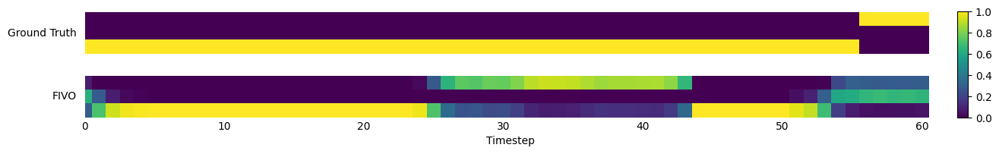

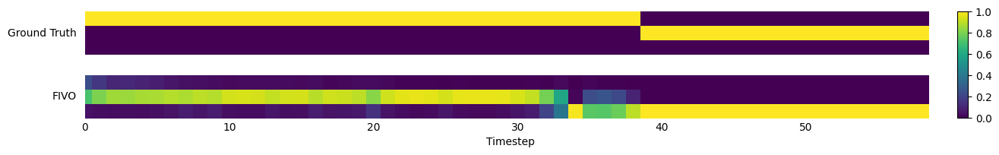

Epoch: [7250][2/2]	Time 1.636	Loss 7475.0518	 
Epoch: [7300][2/2]	Time 1.554	Loss 5850.0776	 
MSE: 0.14649
Pred MSE: 1.13273


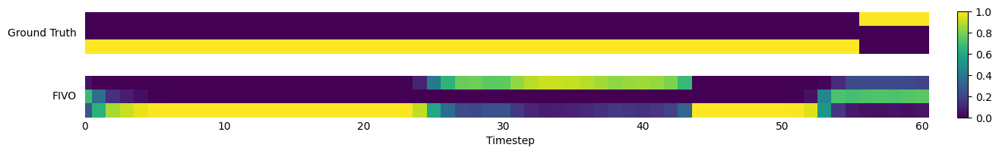

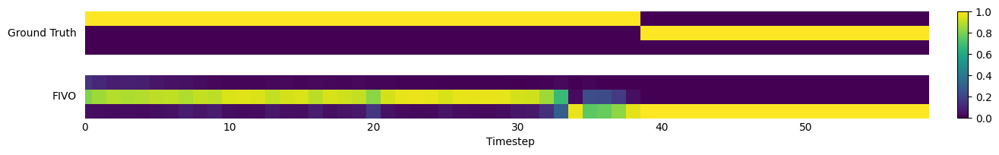

Epoch: [7350][2/2]	Time 1.646	Loss 5877.1475	 
Epoch: [7400][2/2]	Time 1.494	Loss 6317.4482	 
MSE: 0.14834
Pred MSE: 1.12709


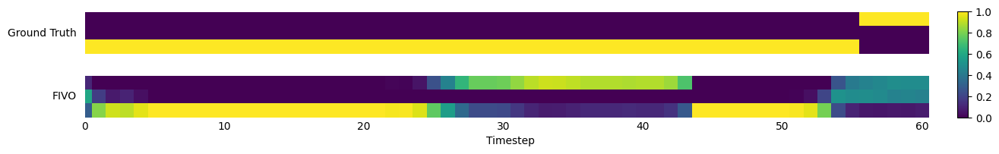

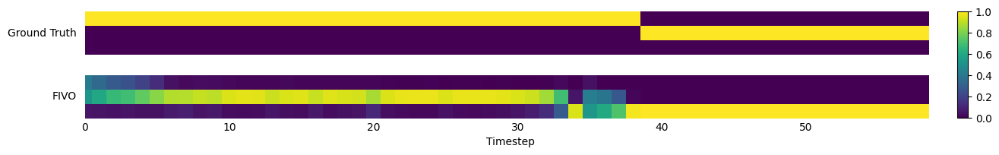

Epoch: [7450][2/2]	Time 1.532	Loss 6499.8252	 
Epoch: [7500][2/2]	Time 1.512	Loss 7575.5547	 
MSE: 0.16008
Pred MSE: 1.12644


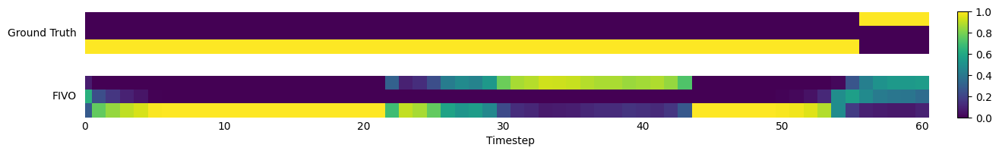

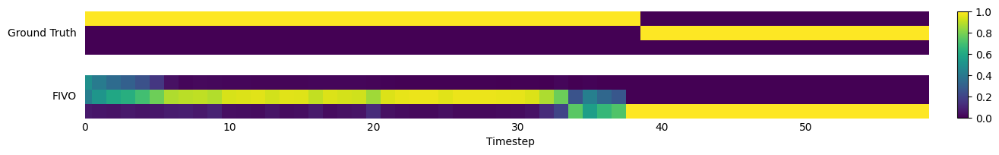

Epoch: [7550][2/2]	Time 1.536	Loss 6885.6201	 
Epoch: [7600][2/2]	Time 1.548	Loss 6392.3091	 
MSE: 0.14809
Pred MSE: 1.11551


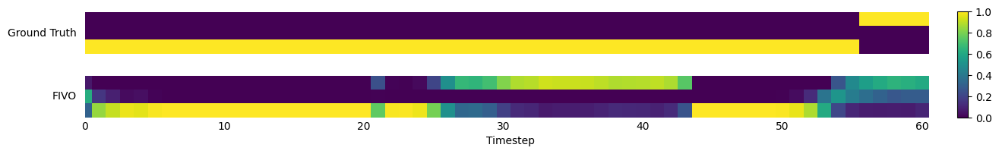

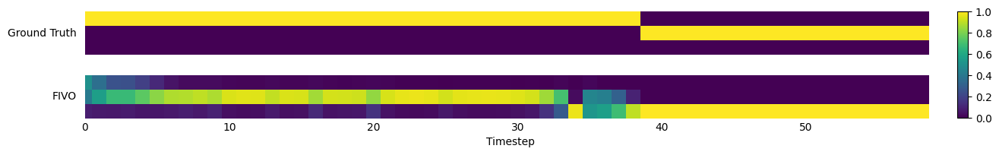

Epoch: [7650][2/2]	Time 1.617	Loss 6268.4473	 
Epoch: [7700][2/2]	Time 1.571	Loss 6278.1338	 
MSE: 0.14521
Pred MSE: 1.13374


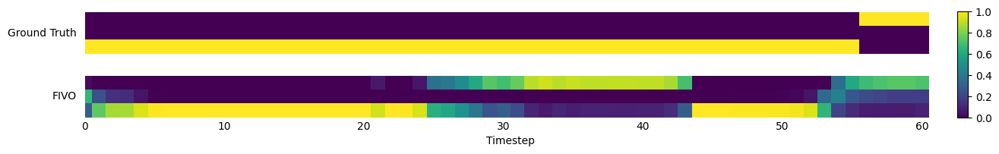

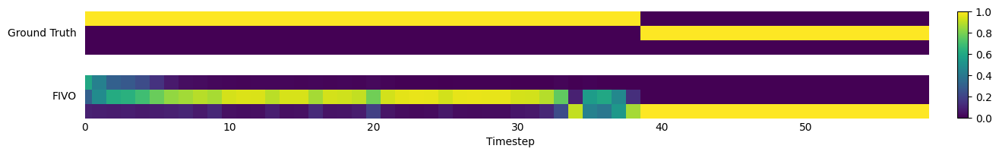

Epoch: [7750][2/2]	Time 1.530	Loss 6126.7476	 
Epoch: [7800][2/2]	Time 1.522	Loss 7023.7227	 
MSE: 0.15935
Pred MSE: 1.11996


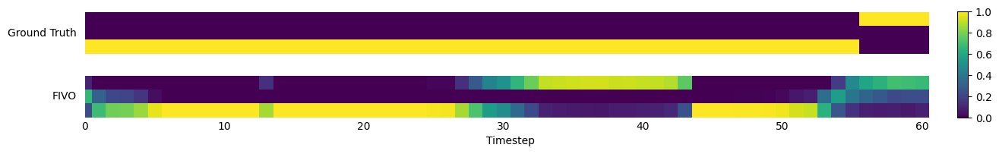

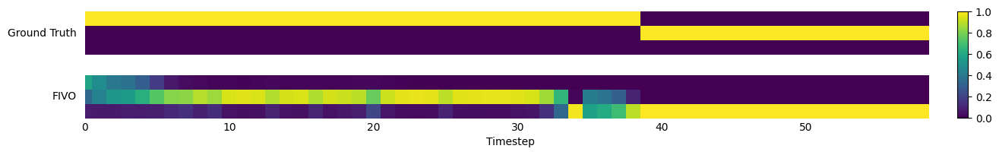

Epoch: [7850][2/2]	Time 1.529	Loss 7498.6455	 
Epoch: [7900][2/2]	Time 1.521	Loss 8211.7051	 
MSE: 0.16153
Pred MSE: 1.12409


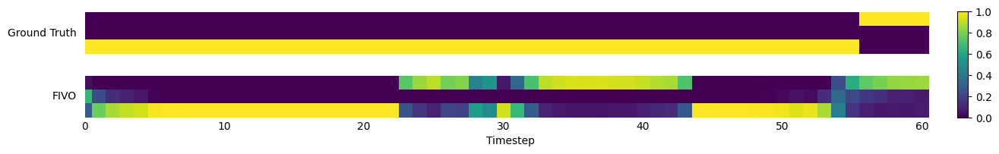

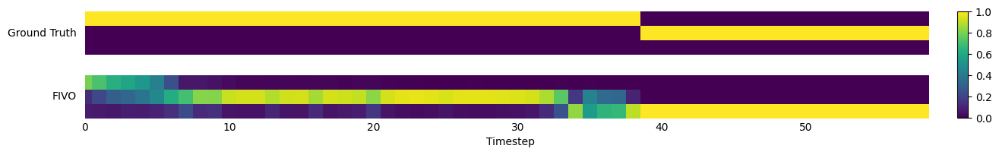

Epoch: [7950][2/2]	Time 1.714	Loss 6293.0381	 
Epoch: [8000][2/2]	Time 1.520	Loss 7504.8955	 
MSE: 0.15524
Pred MSE: 1.12117


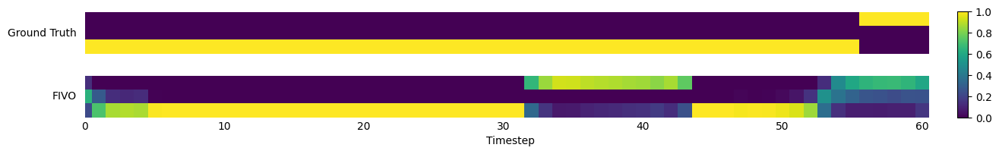

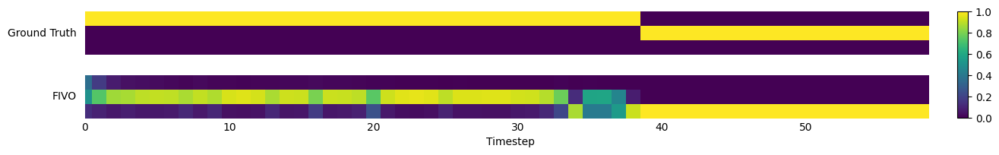

Epoch: [8050][2/2]	Time 1.630	Loss 5865.6211	 
Epoch: [8100][2/2]	Time 1.513	Loss 5838.6064	 
MSE: 0.15444
Pred MSE: 1.11968


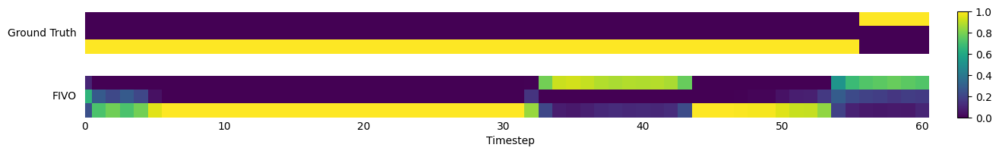

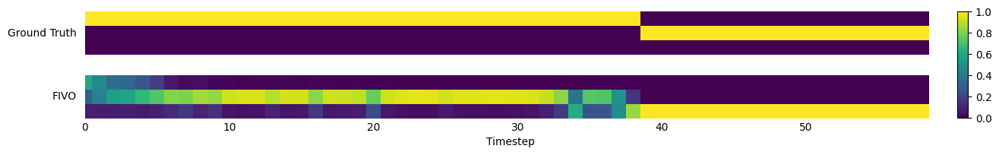

Epoch: [8150][2/2]	Time 1.546	Loss 5527.3936	 
Epoch: [8200][2/2]	Time 1.518	Loss 6065.9941	 
MSE: 0.15378
Pred MSE: 1.13116


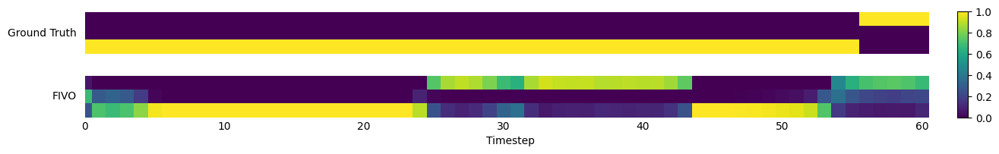

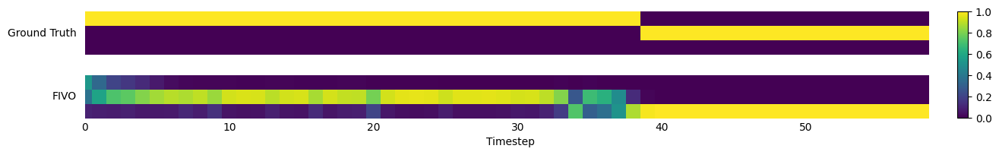

Epoch: [8250][2/2]	Time 1.522	Loss 5544.0664	 
Epoch: [8300][2/2]	Time 1.489	Loss 6062.8701	 
MSE: 0.15089
Pred MSE: 1.11480


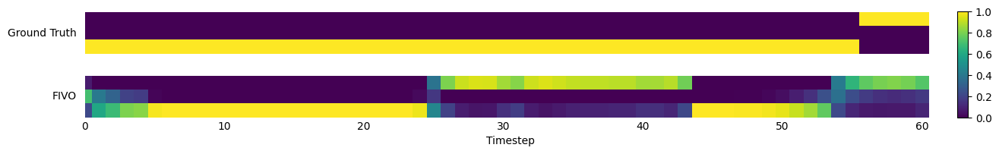

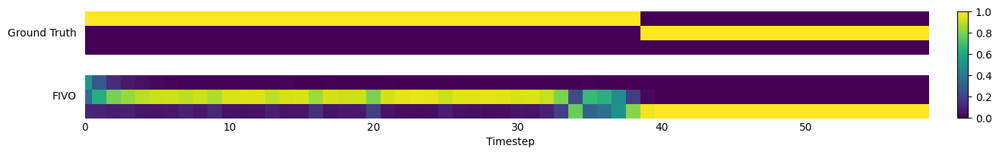

Epoch: [8350][2/2]	Time 1.620	Loss 6464.2822	 
Epoch: [8400][2/2]	Time 1.541	Loss 6992.9541	 
MSE: 0.15497
Pred MSE: 1.12354


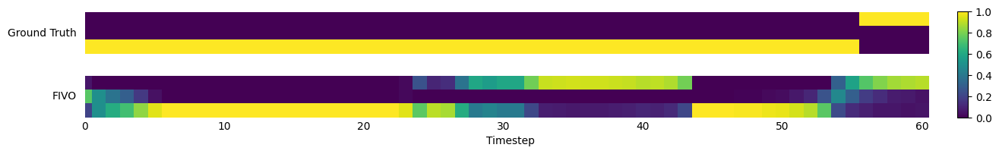

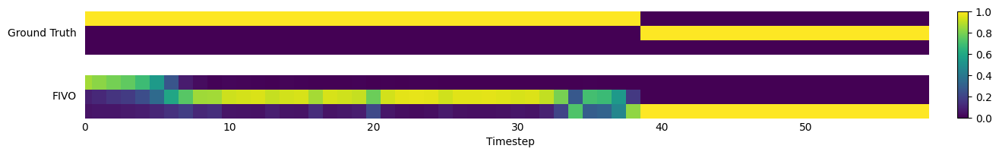

Epoch: [8450][2/2]	Time 1.557	Loss 5182.4976	 
Epoch: [8500][2/2]	Time 1.529	Loss 5976.4727	 
MSE: 0.15794
Pred MSE: 1.12630


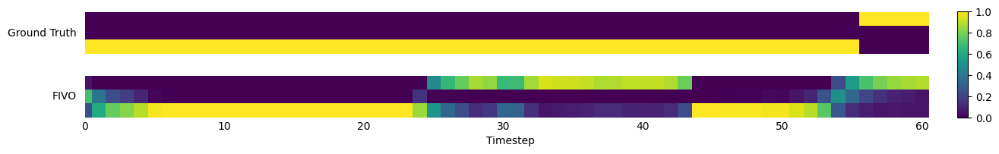

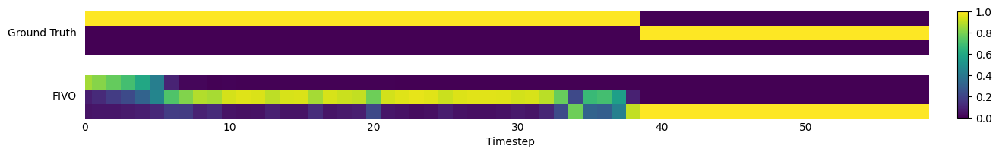

Epoch: [8550][2/2]	Time 1.570	Loss 5968.4634	 
Epoch: [8600][2/2]	Time 1.538	Loss 6034.6338	 
MSE: 0.15718
Pred MSE: 1.12096


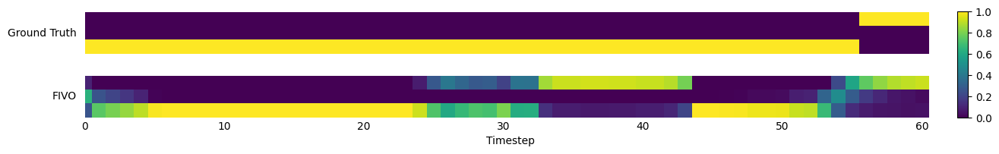

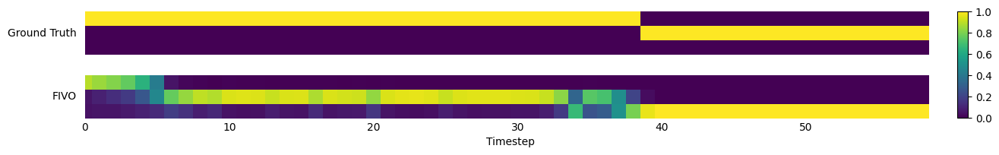

Epoch: [8650][2/2]	Time 1.647	Loss 6756.5430	 
Epoch: [8700][2/2]	Time 1.548	Loss 6122.4292	 
MSE: 0.15521
Pred MSE: 1.12168


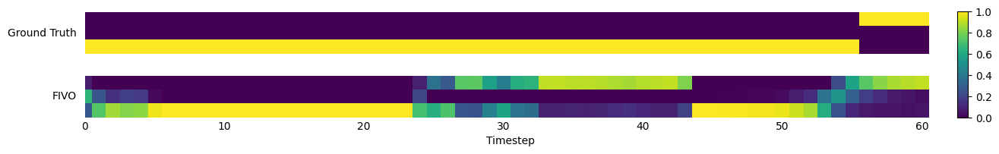

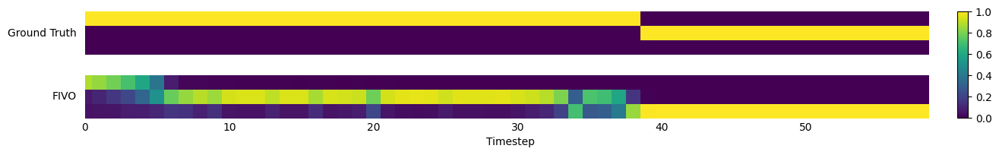

Epoch: [8750][2/2]	Time 1.694	Loss 5556.7559	 
Epoch: [8800][2/2]	Time 1.573	Loss 5240.1357	 
MSE: 0.15572
Pred MSE: 1.12141


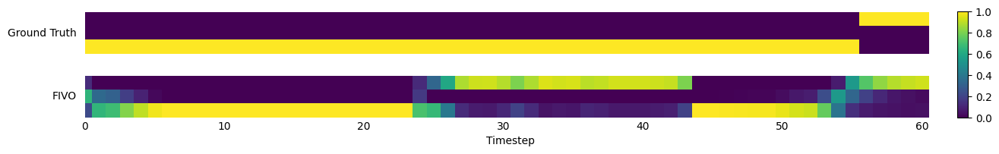

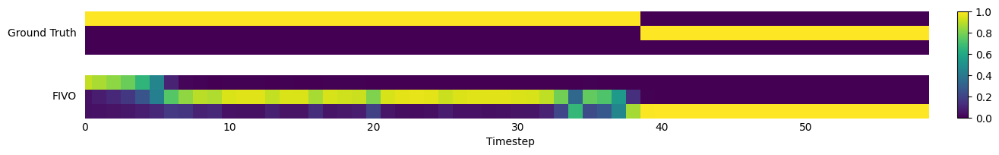

Epoch: [8850][2/2]	Time 1.568	Loss 5791.3369	 
Epoch: [8900][2/2]	Time 1.563	Loss 5388.6099	 
MSE: 0.15708
Pred MSE: 1.12860


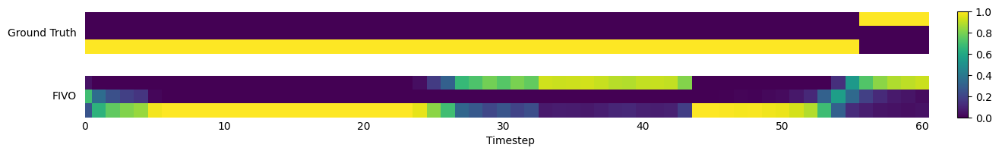

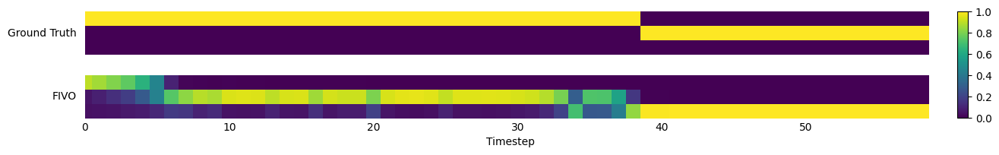

Epoch: [8950][2/2]	Time 1.562	Loss 5247.3271	 
Epoch: [9000][2/2]	Time 1.573	Loss 5871.8169	 
MSE: 0.15700
Pred MSE: 1.12275


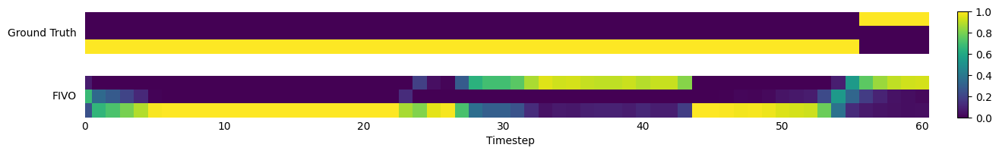

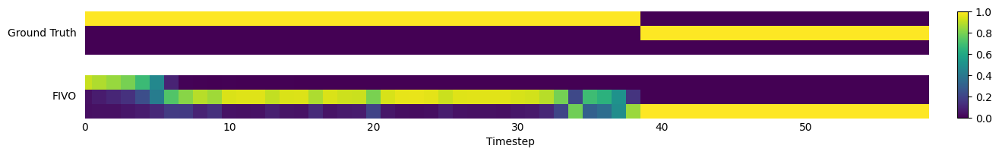

Epoch: [9050][2/2]	Time 1.688	Loss 5957.7021	 
Epoch: [9100][2/2]	Time 1.559	Loss 5577.6226	 
MSE: 0.15729
Pred MSE: 1.12076


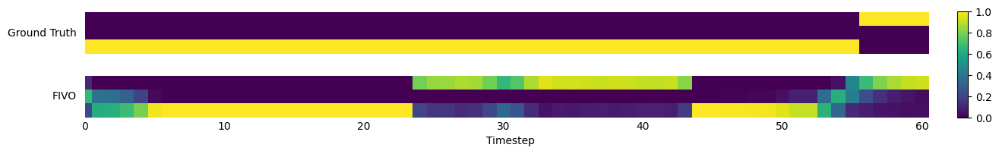

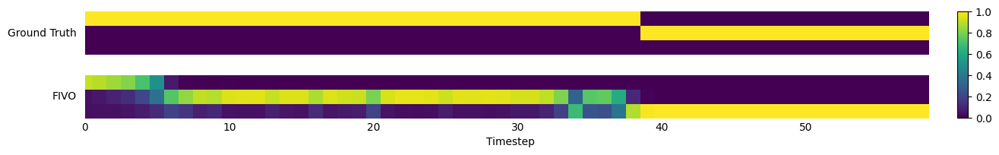

Epoch: [9150][2/2]	Time 1.615	Loss 5370.6670	 
Epoch: [9200][2/2]	Time 1.568	Loss 5671.7241	 
MSE: 0.15760
Pred MSE: 1.12122


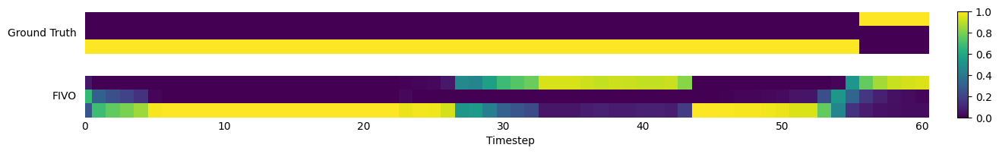

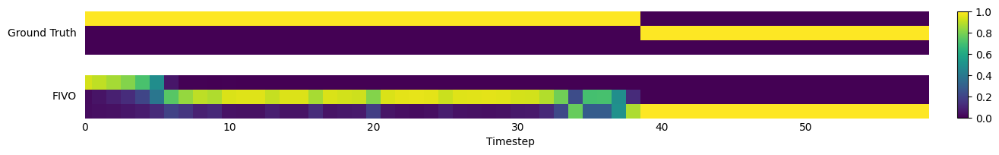

Epoch: [9250][2/2]	Time 1.572	Loss 6474.9727	 
Epoch: [9300][2/2]	Time 1.575	Loss 5468.0200	 
MSE: 0.16454
Pred MSE: 1.12573


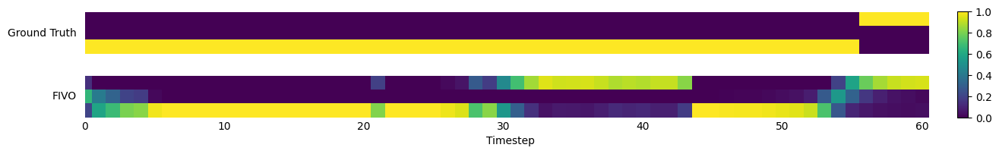

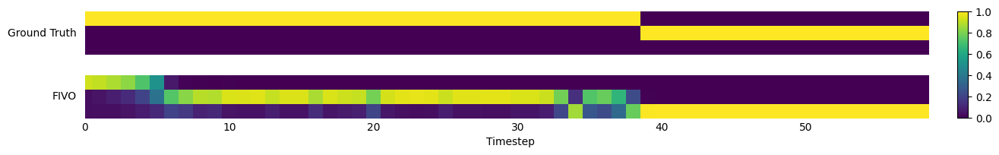

Epoch: [9350][2/2]	Time 1.679	Loss 5500.1616	 
Epoch: [9400][2/2]	Time 1.584	Loss 4731.0747	 
MSE: 0.15994
Pred MSE: 1.13131


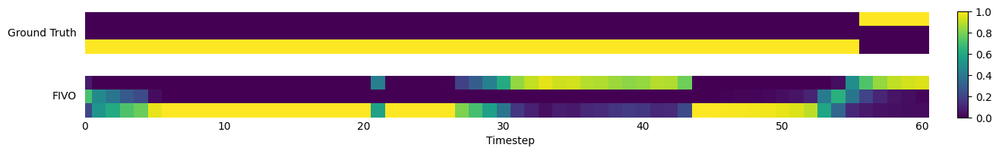

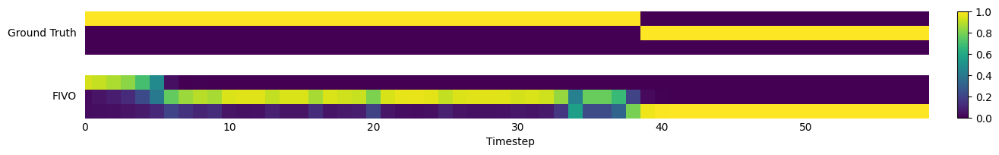

Epoch: [9450][2/2]	Time 1.699	Loss 5628.0439	 
Epoch: [9500][2/2]	Time 1.569	Loss 5457.5088	 
MSE: 0.16493
Pred MSE: 1.12385


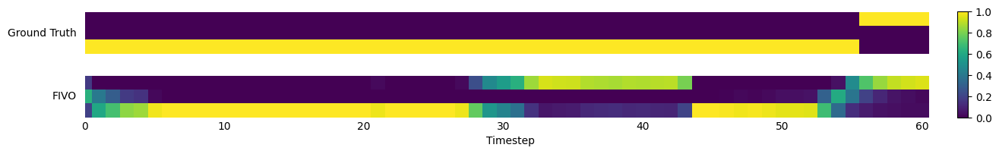

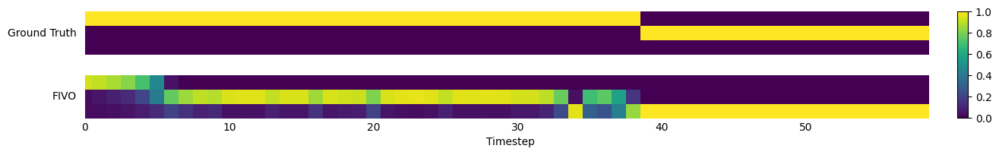

Epoch: [9550][2/2]	Time 1.543	Loss 5496.8379	 
Epoch: [9600][2/2]	Time 1.562	Loss 5001.7437	 
MSE: 0.16261
Pred MSE: 1.11765


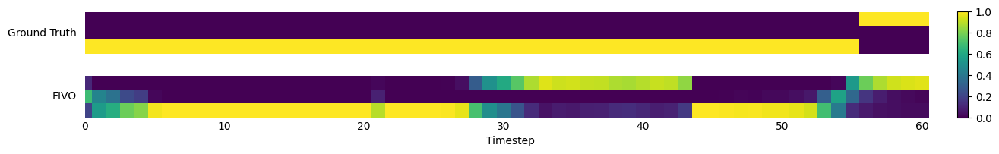

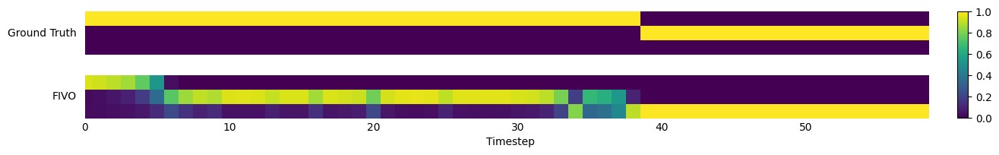

Epoch: [9650][2/2]	Time 1.571	Loss 5924.3584	 
Epoch: [9700][2/2]	Time 1.578	Loss 5940.8198	 
MSE: 0.16062
Pred MSE: 1.12464


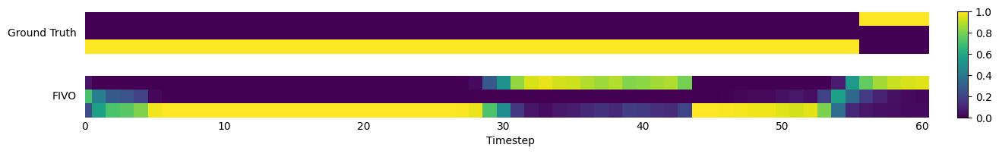

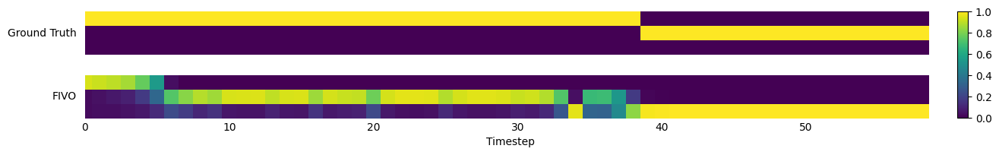

Epoch: [9750][2/2]	Time 1.796	Loss 5543.1616	 
Epoch: [9800][2/2]	Time 1.564	Loss 5527.5454	 
MSE: 0.16127
Pred MSE: 1.12324


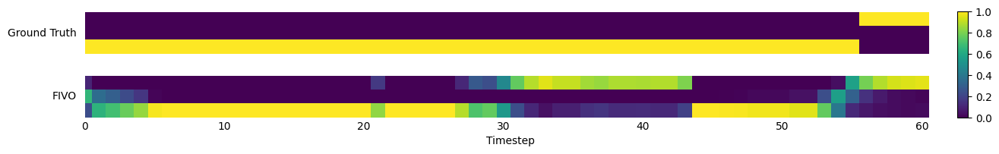

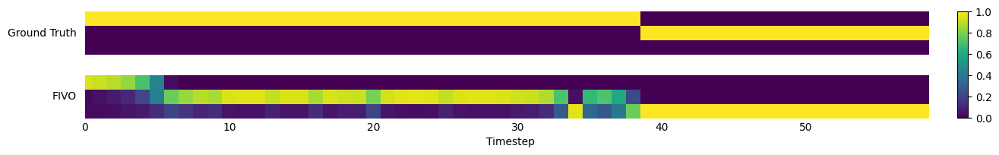

Epoch: [9850][2/2]	Time 1.551	Loss 4856.1401	 
Epoch: [9900][2/2]	Time 1.558	Loss 6043.5635	 
MSE: 0.16273
Pred MSE: 1.11396


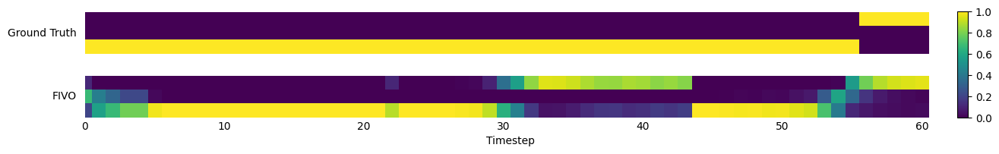

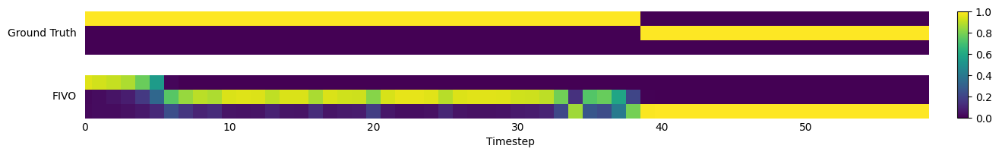

Epoch: [9950][2/2]	Time 1.555	Loss 5148.4448	 


In [12]:
fivo_losses, test_mse_fivo, pred_mse_fivo = train_fivo(N, model, optimizer,num_states, dim_latent, T)

In [20]:
PATH = 'snlds_bee_fivo.pth'
torch.save(model.state_dict(), PATH)
# model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()
# model.load_state_dict(torch.load(PATH))

Text(0, 0.5, 'Training Loss')

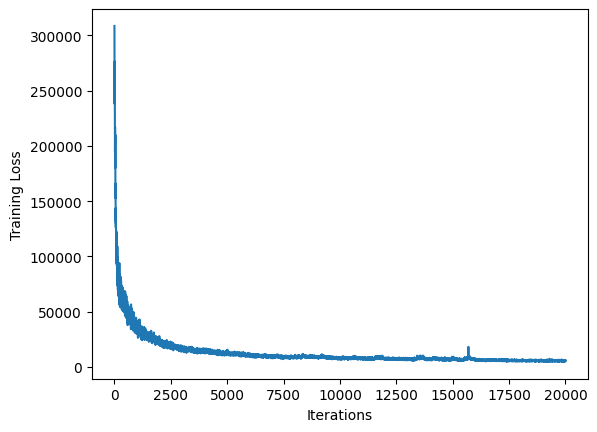

In [21]:
plt.plot(fivo_losses)
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'Training Loss')

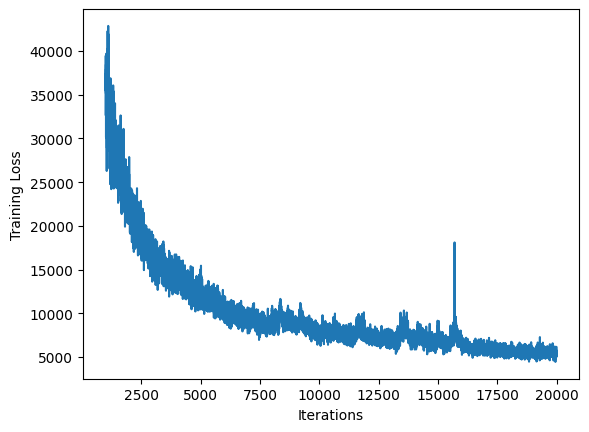

In [22]:
plt.plot(np.arange(1000,len(fivo_losses)),fivo_losses[1000:])
plt.xlabel('Iterations')
plt.ylabel('Training Loss')

Text(0, 0.5, 'MSE')

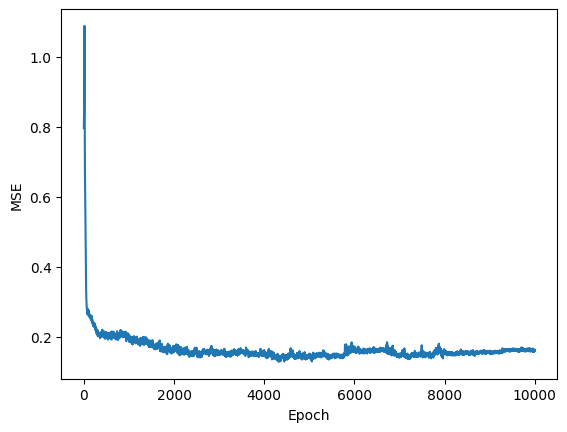

In [23]:
plt.plot(test_mse_fivo)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

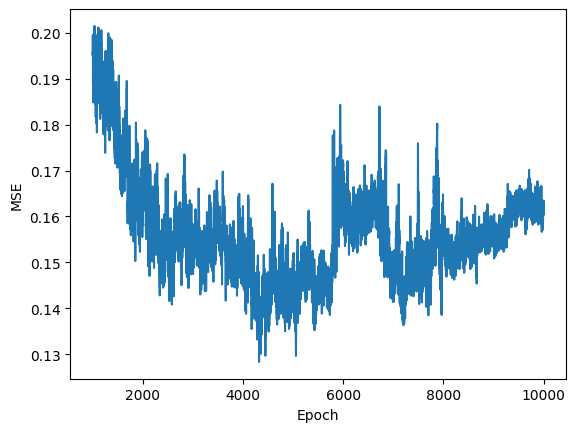

In [28]:
plt.plot(np.arange(1000,len(test_mse_fivo)),test_mse_fivo[1000:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

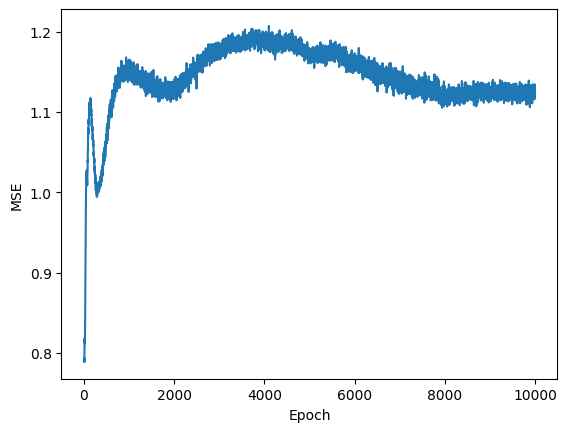

In [25]:
plt.plot(pred_mse_fivo)
plt.xlabel('Epoch')
plt.ylabel('MSE')

Text(0, 0.5, 'MSE')

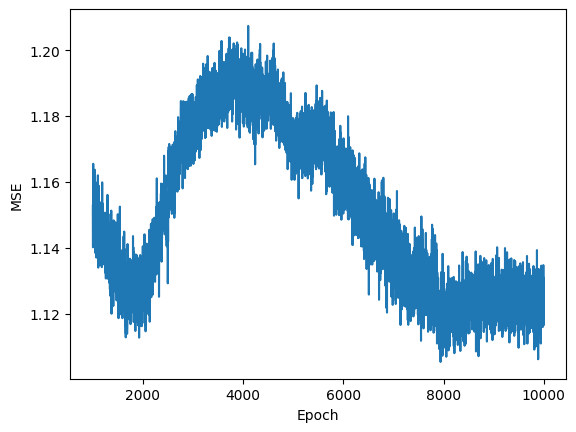

In [27]:
plt.plot(np.arange(1000,len(pred_mse_fivo)),pred_mse_fivo[1000:])
plt.xlabel('Epoch')
plt.ylabel('MSE')

In [29]:
# Training time: 576min
print(f"Last FIVO Loss: {fivo_losses[-1]:.1f}")
print(f"Last Test MSE: {test_mse_fivo[-1]:.6f}")
print(f"Last Pred MSE: {pred_mse_fivo[-1]:.6f}")

Last FIVO Loss: 6096.6
Last Test MSE: 0.161505
Last Pred MSE: 1.126535


In [30]:
print(f"Best FIVO Loss: {min(fivo_losses):.1f}")
print(f"Best Test MSE: {min(test_mse_fivo):.6f}")
print(f"Best Pred MSE: {min(pred_mse_fivo):.6f}")

Best FIVO Loss: 4445.5
Best Test MSE: 0.128318
Best Pred MSE: 0.788710


In [31]:
# Reconstructions

t = 120
model.eval()

with torch.inference_mode():
    (x,_) = next(iter(test_dataloader))
    x = x.to(device).float()
    recon_x,_,_,_ = model(x)
    x = x.cpu().numpy()
    recon_x = recon_x.cpu().numpy()

# Final MSE per timestep
mse_T = np.mean(((x - recon_x) ** 2),axis=(0,2))
for i,element in enumerate(mse_T):
    print(f"t={i} MSE per pixel:{element:.6f}")

t=0 MSE per pixel:0.359763
t=1 MSE per pixel:0.317884
t=2 MSE per pixel:0.201304
t=3 MSE per pixel:0.221439
t=4 MSE per pixel:0.168972
t=5 MSE per pixel:0.250569
t=6 MSE per pixel:0.288551
t=7 MSE per pixel:0.210803
t=8 MSE per pixel:0.120012
t=9 MSE per pixel:0.170721
t=10 MSE per pixel:0.301728
t=11 MSE per pixel:0.137842
t=12 MSE per pixel:0.075425
t=13 MSE per pixel:0.130190
t=14 MSE per pixel:0.178419
t=15 MSE per pixel:0.093989
t=16 MSE per pixel:0.086508
t=17 MSE per pixel:0.141208
t=18 MSE per pixel:0.117810
t=19 MSE per pixel:0.135739
t=20 MSE per pixel:0.097566
t=21 MSE per pixel:0.151760
t=22 MSE per pixel:0.164470
t=23 MSE per pixel:0.148290
t=24 MSE per pixel:0.141529
t=25 MSE per pixel:0.120371
t=26 MSE per pixel:0.077281
t=27 MSE per pixel:0.125785
t=28 MSE per pixel:0.117596
t=29 MSE per pixel:0.102852
t=30 MSE per pixel:0.105980
t=31 MSE per pixel:0.108274
t=32 MSE per pixel:0.093588
t=33 MSE per pixel:0.110895
t=34 MSE per pixel:0.096773
t=35 MSE per pixel:0.069421
t=

In [32]:
mse_T

array([0.35976347, 0.3178843 , 0.20130365, 0.22143896, 0.16897185,
       0.25056872, 0.28855106, 0.2108033 , 0.12001222, 0.17072144,
       0.30172765, 0.13784158, 0.07542547, 0.13018999, 0.17841943,
       0.09398852, 0.08650796, 0.14120781, 0.11781026, 0.1357386 ,
       0.097566  , 0.15175956, 0.16446982, 0.14828996, 0.14152929,
       0.12037067, 0.07728115, 0.12578538, 0.11759552, 0.10285239,
       0.10597976, 0.10827368, 0.09358762, 0.11089472, 0.09677286,
       0.06942149, 0.10913082, 0.17337649, 0.0903585 , 0.19006424,
       0.14207852, 0.12814738, 0.13128713, 0.20237567, 0.2514026 ,
       0.42986187, 0.29332095, 0.21971282, 0.1935242 , 0.12041815,
       0.17525512, 0.16169858, 0.21248522, 0.15595736, 0.22519295,
       0.16409884, 0.14996187, 0.1540664 , 0.11300546, 0.08619352,
       0.08701827, 0.30852112, 0.11970353, 0.08157423, 0.05129937,
       0.07748181, 0.1506805 , 0.10720442, 0.06290153, 0.13095415,
       0.15215558, 0.09805036, 0.10312332, 0.13593139, 0.12204

Text(0, 0.5, 'MSE per Pixel')

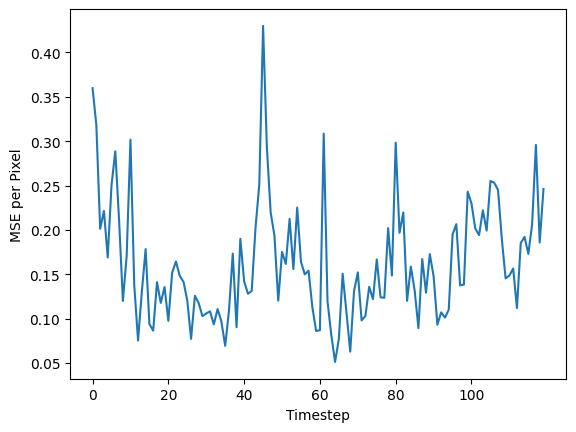

In [33]:
plt.plot(mse_T)
plt.xlabel('Timestep')
plt.xticks(np.arange(0,t,20))
plt.ylabel('MSE per Pixel')

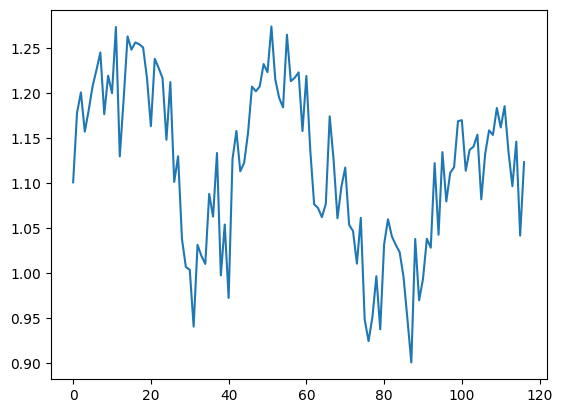

In [35]:
# Take first 3 timesteps. Generate the rest of the sequence. Calculate MSE

with torch.inference_mode():
    predict_mse = []
    for (sample,_) in test_dataloader:
        mse_values = []
        obs_var = sample.float().to(device)
        preds = model.predict_sequence(obs_var[:,:3], seq_len=117)
        obs_var, preds = obs_var.cpu().numpy(), preds.cpu().numpy()
        mse = np.mean(((preds - obs_var[:,3:]) ** 2),axis=(0,2))
        mse_values.append(mse)
    mse_val = sum(mse_values) / len(mse_values)
    predict_mse.append(mse_val.tolist())

plt.plot(predict_mse[0])

In [36]:
predict_mse[0]

[1.101034164428711,
 1.1783360242843628,
 1.2008930444717407,
 1.1573982238769531,
 1.181109070777893,
 1.2077929973602295,
 1.2258213758468628,
 1.2452794313430786,
 1.176698923110962,
 1.2194887399673462,
 1.2001560926437378,
 1.2736036777496338,
 1.1298267841339111,
 1.1938703060150146,
 1.2631778717041016,
 1.2484357357025146,
 1.2564631700515747,
 1.2544314861297607,
 1.2508556842803955,
 1.216628074645996,
 1.1634817123413086,
 1.238294243812561,
 1.2280924320220947,
 1.216659665107727,
 1.1482841968536377,
 1.212357521057129,
 1.1015077829360962,
 1.1299200057983398,
 1.0378904342651367,
 1.006915807723999,
 1.003801941871643,
 0.9406744837760925,
 1.0315896272659302,
 1.0192571878433228,
 1.0103758573532104,
 1.088183045387268,
 1.0628653764724731,
 1.1336133480072021,
 0.9976407289505005,
 1.0540968179702759,
 0.9725045561790466,
 1.1268517971038818,
 1.1580784320831299,
 1.1132853031158447,
 1.1228023767471313,
 1.156263828277588,
 1.2074021100997925,
 1.2021750211715698,
 1.

# Final Tests

In [44]:
PATH = 'snlds_bee_elbo.pth'
model = VariationalSNLDS(4, 2, 64, 3, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0).to(device)
model.transitions = torch.nn.ModuleList([MLP(dim_latent, dim_latent, 16, 'cos') for _ in range(num_states)]).to(device).float()
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [45]:
# Check ELBO,IWAE,FIVO values
# We expect FIVO>IWAE>ELBO
model.beta = 1
with torch.inference_mode():
    elbo_list = []
    iwae_list = []
    iwae_2_list = []
    fivo_list = []
    fivo_2_list = []
    for (sample,_) in tqdm.tqdm(test_dataloader):
        obs_var = sample.float().to(device)
        obs_var = obs_var + 0.5
        _, _, _, losses = model(obs_var)
        iwae, _ = model.iwae_efficient(obs_var, 10)
        iwae_2, _ = model.iwae(obs_var, 10)
        fivo, _ = model.fivo_efficient(obs_var, 10)
        fivo_2, _ = model.fivo(obs_var, 10)
        elbo = losses['loss']
        elbo_list.append(-elbo)
        iwae_list.append(-iwae)
        iwae_2_list.append(-iwae_2)
        fivo_list.append(-fivo)
        fivo_2_list.append(-fivo_2)
    print(f"ELBO: {sum(elbo_list)/len(elbo_list):.2f}")
    print(f"IWAE: {sum(iwae_list)/len(iwae_list):.2f}")
    print(f"IWAE: {sum(iwae_2_list)/len(iwae_2_list):.2f}")
    print(f"FIVO: {sum(fivo_list)/len(fivo_list):.2f}")
    print(f"FIVO: {sum(fivo_2_list)/len(fivo_2_list):.2f}")

100%|██████████| 1/1 [00:04<00:00,  4.89s/it]

ELBO: -160203.73
IWAE: -138472.14
IWAE: -180132.02
FIVO: -106385.05
FIVO: -106298.23


In [27]:
# Check ELBO,IWAE,FIVO values
# We expect FIVO>IWAE>ELBO
model.beta = 1
with torch.inference_mode():
    elbo_list = []
    iwae_list = []
    iwae_2_list = []
    fivo_list = []
    fivo_2_list = []
    for (sample,_) in tqdm.tqdm(dataloader):
        obs_var = sample.float().to(device)
        obs_var = obs_var + 0.5
        _, _, _, losses = model(obs_var)
        iwae, _ = model.iwae_efficient(obs_var, 10)
        iwae_2, _ = model.iwae(obs_var, 10)
        fivo, _ = model.fivo_efficient(obs_var, 10)
        fivo_2, _ = model.fivo(obs_var, 10)
        elbo = losses['loss']
        elbo_list.append(-elbo)
        iwae_list.append(-iwae)
        iwae_2_list.append(-iwae_2)
        fivo_list.append(-fivo)
        fivo_2_list.append(-fivo_2)
    print(f"ELBO: {sum(elbo_list)/len(elbo_list):.2f}")
    print(f"IWAE: {sum(iwae_list)/len(iwae_list):.2f}")
    print(f"IWAE: {sum(iwae_2_list)/len(iwae_2_list):.2f}")
    print(f"FIVO: {sum(fivo_list)/len(fivo_list):.2f}")
    print(f"FIVO: {sum(fivo_2_list)/len(fivo_2_list):.2f}")

100%|██████████| 2/2 [00:10<00:00,  5.09s/it]

ELBO: -155716.09
IWAE: -136962.44
IWAE: -174166.97
FIVO: -150336.88
FIVO: -98358.84


In [34]:
# First 20 timesteps. Probability of discrete states

obs,latents_states = next(iter(test_dataloader))

# ELBO
model = VariationalSNLDS(4, 2, 64, 3, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0).to(device)
PATH = 'snlds_bee_elbo.pth'
model.transitions = torch.nn.ModuleList([MLP(2, 2, 16, 'cos') for _ in range(num_states)]).to(device).float()
model.load_state_dict(torch.load(PATH))
with torch.inference_mode():
    gamma_elbo = model.gamma(obs[:,:].float().to(device))
# IWAE
model = VariationalSNLDS(4, 2, 64, 3, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0).to(device)
PATH = 'snlds_bee_iwae_3.pth'
model.transitions = torch.nn.ModuleList([MLP(2, 2, 16, 'cos') for _ in range(num_states)]).to(device).float()
model.load_state_dict(torch.load(PATH))
with torch.inference_mode():
    gamma_iwae = model.gamma(obs[:,:].float().to(device))
# FIVO
model = VariationalSNLDS(4, 2, 64, 3, encoder_type='recurent', device=device, annealing=False, inference='alpha', beta=0).to(device)
PATH = 'snlds_bee_fivo.pth'
model.transitions = torch.nn.ModuleList([MLP(2, 2, 16, 'cos') for _ in range(num_states)]).to(device).float()
model.load_state_dict(torch.load(PATH))
with torch.inference_mode():
    gamma_fivo = model.gamma(obs[:,:].float().to(device))


/tmp/ipykernel_3844767/2952295420.py:98: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[3].set_xticklabels([f'{int(label)}' for label in new_labels])


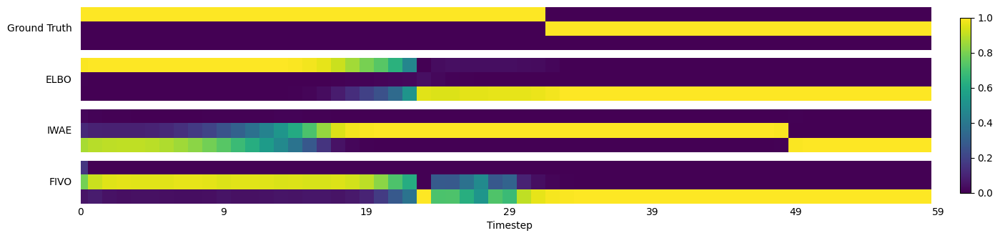

/tmp/ipykernel_3844767/2952295420.py:98: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[3].set_xticklabels([f'{int(label)}' for label in new_labels])


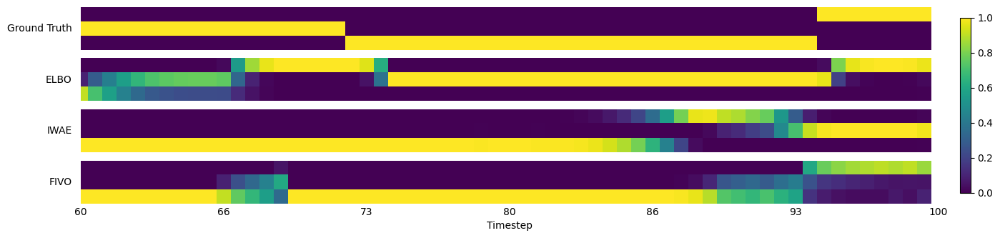

In [35]:
j=6
plot_models(gamma_elbo[:,:60], gamma_iwae[:,:60], gamma_fivo[:,:60], latents_states[:,:60],[0,59], N=j)
plot_models(gamma_elbo[:,60:], gamma_iwae[:,60:], gamma_fivo[:,60:], latents_states[:,60:],[60,100], N=j)

In [37]:
latents_states = latents_states.cpu().numpy()
gamma_elbo = gamma_elbo.cpu().numpy()
gamma_iwae = gamma_iwae.cpu().numpy()
gamma_fivo = gamma_fivo.cpu().numpy()

In [38]:
print(f"ELBO:{best_f1_score(latents_states, gamma_elbo):.2f}")
print(f"IWAE:{best_f1_score(latents_states, gamma_iwae):.2f}")
print(f"FIVO:{best_f1_score(latents_states, gamma_fivo):.2f}")

ELBO:0.46
IWAE:0.58
FIVO:0.43


In [39]:
print(f"ELBO:{best_cross_entropy_loss(latents_states, gamma_elbo):.2f}")
print(f"IWAE:{best_cross_entropy_loss(latents_states, gamma_iwae):.2f}")
print(f"FIVO:{best_cross_entropy_loss(latents_states, gamma_fivo):.2f}")

ELBO:6.44
IWAE:4.35
FIVO:7.48
